In [3]:
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
import matplotlib.pyplot as plt
import skfmm

from torch.utils.data import DataLoader
from torch.utils.data import TensorDataset
from torch.optim.lr_scheduler import ReduceLROnPlateau
from timeit import default_timer
from tqdm import tqdm

In [4]:
# Model specifications

zmin = 0.; zmax = 3.; deltaz = 0.004;
xmin = 4.5; xmax = 6.0; deltax = 0.004;

# Loading velocity model
filename="./vel.rsf@"
marm = pd.read_csv(filename, index_col=None, header=None)
velmodel = np.reshape(np.array(marm), (2301, 751)).T
velmodel = velmodel[ :,1125:1501 ] # take the central part of Marmousi model

In [5]:
# Synthetic source locations

spacing = 0.025

sx = np.arange( 5.0, 5.524, spacing )
sz = np.arange( 1.0, 2.0+spacing, spacing )

num_of_data = len(sz) * len(sx) # Number of training points

cord = np.meshgrid(sx,sz)

print(f'size of data set:{num_of_data}')
print(f'For Z coordinates:{np.shape(sz)}')
print(f'For X coordinates:{np.shape(sx)}')
print(f'Whole grid :{np.shape(cord)}')

cord[1] = np.round(cord[1],2)
cord[0] = np.round(cord[0],2)
cord_x = cord[0]
cord_z = cord[1]

size of data set:861
For Z coordinates:(41,)
For X coordinates:(21,)
Whole grid :(2, 41, 21)


In [6]:
# Creating grid

z = np.arange( zmin, zmax+deltaz, deltaz )
nz = z.size

x = np.arange( xmin, xmax+deltax, deltax )
nx = x.size

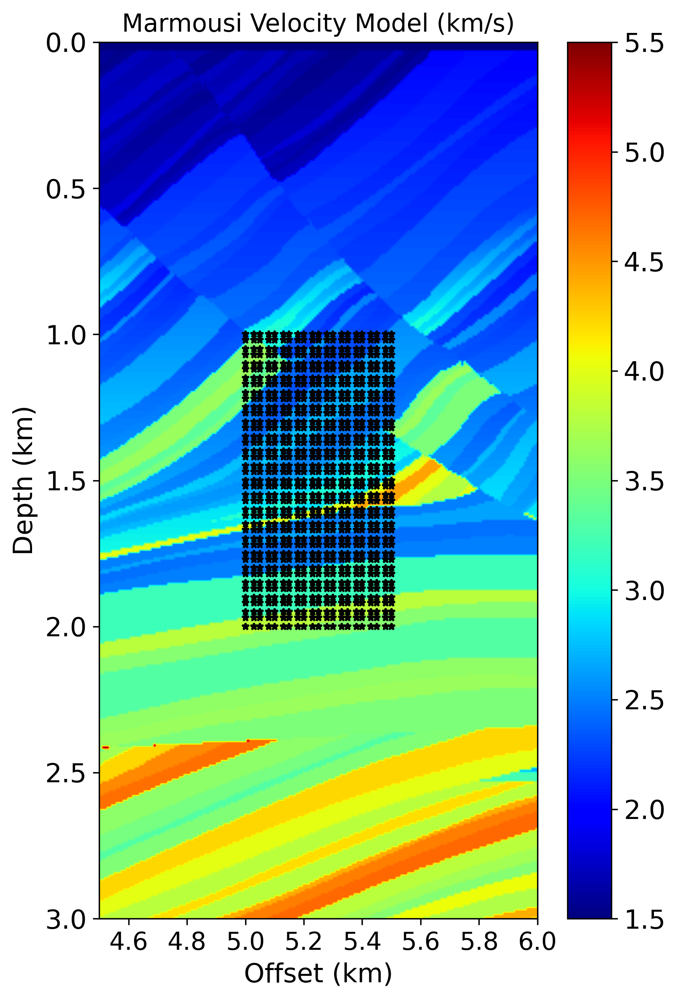

In [7]:
# Plot the velocity model with the source locations

fsize = 15

plt.figure(figsize=(5.5,8), dpi=300)

im = plt.imshow(velmodel, cmap='jet',aspect=1, extent=[xmin, xmax, zmax, zmin])

cbar = plt.colorbar(im)
cbar.ax.tick_params(labelsize=fsize)

plt.plot(cord_x, cord_z, 'k*', markersize=4)

# Add labels and title
plt.xlabel('Offset (km)',size = fsize)
plt.ylabel('Depth (km)',size = fsize)
plt.title('Marmousi Velocity Model (km/s)',size = fsize-1)

plt.xticks(fontsize=fsize-1)
plt.yticks(fontsize=fsize)

plt.tight_layout()

# plt.savefig( 'marmousi_25m_velmodel.pdf' , dpi=300)

plt.show()

In [8]:
# Generate train set with traveltime solutions

y_train = np.zeros([ num_of_data, nz, nx ])

count = 0

while count <= (num_of_data-1):
    for i in range(len(sz)):
        for j in range(len(sx)):
            
            phi = np.ones_like(velmodel)
            phi[np.round(cord_z[i,j]/deltaz).astype(int),
                np.round(cord_x[i,j]/deltax).astype(int)-1125] = -1 # correction for part of Marmousi model
            
            y_train[count,:,:] = skfmm.travel_time(phi,velmodel,dx=(deltaz,deltax),order=2)
            
            count = count + 1
            
        print(count)

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277


In [9]:
# Specify the file name

y_train_name = '25m'+'_Tdata_y'+'_marmousi'+'.pkl'

print(y_train_name)

25m_Tdata_y_marmousi_vsp.pkl


In [8]:
# Save the fmm generated training set to use later

# import pickle

# Save the tensors using pickle directly, specifying protocol 4
# with open(y_train_name, 'wb') as f:
#    pickle.dump(y_train, f, protocol=4)

In [10]:
# Load the fmm generated training set if available

# import pickle

# Open the file in binary mode and load using protocol 4  
# with open(y_train_name, 'rb') as file:
#     y_train = pickle.load(file)

In [10]:
x_train = np.zeros([num_of_data,nz,1])
x_train[:,:,0] = y_train[:,:,-1].copy()
x_train = np.repeat( x_train, nx, axis = 2 )

print(np.shape(x_train))
print(np.shape(y_train))

(861, 751, 376)
(861, 751, 376)


In [11]:
# Generate test set with traveltime solutions

size_of_data_set = 50

cord_x_test = np.random.uniform(5.0,5.5, size=size_of_data_set)
cord_z_test = np.random.uniform(1.0,2.0, size=size_of_data_set)

y_test = np.zeros([ size_of_data_set, nz, nx ])

count = 0

while count <= (size_of_data_set-1):
    for i in range(size_of_data_set):
                    
        phi = np.ones_like(velmodel)
        phi[np.round(cord_z_test[i]/deltaz).astype(int),
            np.round(cord_x_test[i]/deltax).astype(int)-1125] = -1
        
        y_test[count,:,:] = skfmm.travel_time(phi,velmodel,dx=(deltaz,deltax),order=2)
                
        count = count + 1

x_test = np.zeros([size_of_data_set,nz,1])
x_test[:,:,0] = y_test[:,:,-1].copy()
x_test = np.repeat( x_test, nx, axis = 2 )

print(np.shape(x_test))
print(np.shape(y_test))

(50, 751, 376)
(50, 751, 376)


In [12]:
x_train = torch.from_numpy(x_train)
y_train = torch.from_numpy(y_train)

x_test = torch.from_numpy(x_test)
y_test = torch.from_numpy(y_test)

In [13]:
x_train = x_train.reshape( len(x_train), nz, nx, 1 )
x_test = x_test.reshape( len(x_test), nz, nx, 1 )

In [14]:
print(f'Input size of training data: {np.shape(x_train)}')
print(f'Input size of testing data: {np.shape(x_test)}')

print('--'*50)

print(f'output size of training data: {np.shape(y_train)}')
print(f'output size of testing data: {np.shape(y_test)}')

Input size of training data: torch.Size([861, 751, 376, 1])
Input size of testing data: torch.Size([50, 751, 376, 1])
----------------------------------------------------------------------------------------------------
output size of training data: torch.Size([861, 751, 376])
output size of testing data: torch.Size([50, 751, 376])


In [15]:
x_test = x_test.type('torch.FloatTensor')
y_test = y_test.type('torch.FloatTensor')
y_train =  y_train.type('torch.FloatTensor')
x_train = x_train.type('torch.FloatTensor')

In [16]:
batch_size = 1

train_loader = DataLoader(TensorDataset(x_train, y_train), batch_size=batch_size, shuffle=True)
test_loader = DataLoader(TensorDataset(x_test, y_test), batch_size=batch_size, shuffle=False)

In [17]:
class SpectralConv2d(nn.Module):
    def __init__(self, in_channels, out_channels, modes1, modes2):
        super(SpectralConv2d, self).__init__()

        """
        2D Fourier layer. It does FFT, linear transform, and Inverse FFT.    
        """

        self.in_channels = in_channels
        self.out_channels = out_channels
        self.modes1 = modes1 #Number of Fourier modes to multiply, at most floor(N/2) + 1
        self.modes2 = modes2

        self.scale = (1 / (in_channels * out_channels))
        self.weights1 = nn.Parameter(self.scale * torch.rand(in_channels, out_channels, self.modes1, self.modes2, dtype=torch.cfloat))
        self.weights2 = nn.Parameter(self.scale * torch.rand(in_channels, out_channels, self.modes1, self.modes2, dtype=torch.cfloat))

    # Complex multiplication
    def compl_mul2d(self, input, weights):
        # (batch, in_channel, x,y ), (in_channel, out_channel, x,y) -> (batch, out_channel, x,y)
        return torch.einsum("bixy,ioxy->boxy", input, weights)

    def forward(self, x):
        batchsize = x.shape[0]
        #Compute Fourier coeffcients up to factor of e^(- something constant)
        x_ft = torch.fft.rfft2(x)

        # Multiply relevant Fourier modes
        out_ft = torch.zeros(batchsize, self.out_channels,  x.size(-2), x.size(-1)//2 + 1, dtype=torch.cfloat, device=x.device)
        out_ft[:, :, :self.modes1, :self.modes2] = \
            self.compl_mul2d(x_ft[:, :, :self.modes1, :self.modes2], self.weights1)
        out_ft[:, :, -self.modes1:, :self.modes2] = \
            self.compl_mul2d(x_ft[:, :, -self.modes1:, :self.modes2], self.weights2)

        #Return to physical space
        x = torch.fft.irfft2(out_ft, s=(x.size(-2), x.size(-1)))
        return x

class FNO2d(nn.Module):
    def __init__(self, modes1, modes2,  width):
        super(FNO2d, self).__init__()

        """
        The overall network. It contains 4 layers of the Fourier layer.
        1. Lift the input to the desire channel dimension by self.fc0 .
        2. 4 layers of the integral operators u' = (W + K)(u).
            W defined by self.w; K defined by self.conv .
        3. Project from the channel space to the output space by self.fc1 and self.fc2 .
        
        input: the solution of the coefficient function and locations (a(x, y), x, y)
        input shape: (batchsize, x=s, y=s, c=3)
        output: the solution 
        output shape: (batchsize, x=s, y=s, c=1)
        """

        self.modes1 = modes1
        self.modes2 = modes2
        self.width = width
        self.padding = 9 # pad the domain if input is non-periodic
        self.fc0 = nn.Linear(3, self.width) # input channel is 3: (a(x, y), x, y)

        self.conv0 = SpectralConv2d(self.width, self.width, self.modes1, self.modes2)
        self.conv1 = SpectralConv2d(self.width, self.width, self.modes1, self.modes2)
        self.conv2 = SpectralConv2d(self.width, self.width, self.modes1, self.modes2)
        self.conv3 = SpectralConv2d(self.width, self.width, self.modes1, self.modes2)
        self.w0 = nn.Conv2d(self.width, self.width, 1)
        self.w1 = nn.Conv2d(self.width, self.width, 1)
        self.w2 = nn.Conv2d(self.width, self.width, 1)
        self.w3 = nn.Conv2d(self.width, self.width, 1)

        self.fc1 = nn.Linear(self.width, 128)
        self.fc2 = nn.Linear(128, 1)

    def forward(self, x):
        grid = self.get_grid(x.shape, x.device)
        x = torch.cat((x, grid), dim=-1)
        x = self.fc0(x)
        x = x.permute(0, 3, 1, 2)
        x = F.pad(x, [0,self.padding, 0,self.padding])

        x1 = self.conv0(x)
        x2 = self.w0(x)
        x = x1 + x2
        x = F.gelu(x)

        x1 = self.conv1(x)
        x2 = self.w1(x)
        x = x1 + x2
        x = F.gelu(x)

        x1 = self.conv2(x)
        x2 = self.w2(x)
        x = x1 + x2
        x = F.gelu(x)

        x1 = self.conv3(x)
        x2 = self.w3(x)
        x = x1 + x2

        x = x[..., :-self.padding, :-self.padding]
        x = x.permute(0, 2, 3, 1)
        x = self.fc1(x)
        x = F.gelu(x)
        x = self.fc2(x)
        return x
    
    def get_grid(self, shape, device):
        batchsize, size_x, size_y = shape[0], shape[1], shape[2]
        gridx = torch.tensor(np.linspace(0, 1, size_x), dtype=torch.float)
        gridx = gridx.reshape(1, size_x, 1, 1).repeat([batchsize, 1, size_y, 1])
        gridy = torch.tensor(np.linspace(0, 1, size_y), dtype=torch.float)
        gridy = gridy.reshape(1, 1, size_y, 1).repeat([batchsize, size_x, 1, 1])
        return torch.cat((gridx, gridy), dim=-1).to(device)

In [18]:
modes = 4
width = 8

model = FNO2d(modes, modes, width).cuda()

In [19]:
# Loss function with rel/abs Lp loss

class LpLoss(object):
    def __init__(self, d=2, p=2, size_average=True, reduction=True):
        super(LpLoss, self).__init__()

        #Dimension and Lp-norm type are postive
        assert d > 0 and p > 0

        self.d = d
        self.p = p
        self.reduction = reduction
        self.size_average = size_average

    def abs(self, x, y):
        num_examples = x.size()[0]

        #Assume uniform mesh
        h = 1.0 / (x.size()[1] - 1.0)

        all_norms = (h**(self.d/self.p))*torch.norm(x.view(num_examples,-1) - y.view(num_examples,-1), self.p, 1)

        if self.reduction:
            if self.size_average:
                return torch.mean(all_norms)
            else:
                return torch.sum(all_norms)

        return all_norms

    def rel(self, x, y):
        num_examples = x.size()[0]

        diff_norms = torch.norm(x.reshape(num_examples,-1) - y.reshape(num_examples,-1), self.p, 1)
        y_norms = torch.norm(y.reshape(num_examples,-1), self.p, 1)

        if self.reduction:
            if self.size_average:
                return torch.mean(diff_norms/y_norms)
            else:
                return torch.sum(diff_norms/y_norms)

        return diff_norms/y_norms

    def __call__(self, x, y):
        return self.rel(x, y)

In [20]:
learning_rate = 1e-3

optimizer = torch.optim.AdamW(model.parameters(), lr=learning_rate, weight_decay=1e-4)

scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.8, patience=10, verbose=True)

myloss = LpLoss(size_average=False)

patience = 50  # Number of epochs to wait before stopping

In [38]:
# To save the model

model_name = 'Model_marmousi_'+str(int(spacing*1000))+'m_train_m'+str(modes)+'w'+str(width)+'_best.pt'

model_name

'Model_marmousi_25m_train_m4w8_best.pt'

  0%|                                        | 1/1000 [00:15<4:12:19, 15.15s/it]

Epoch:1 
 Training time for  epoch 1: 0.253 minutes,Training loss:  0.14297450127450015, Testing loss: 0.08859310440719127


  0%|                                        | 2/1000 [00:26<3:36:24, 13.01s/it]

Epoch:2 
 Training time for  epoch 2: 0.192 minutes,Training loss:  0.07232456735868556, Testing loss: 0.05210865654051304


  0%|                                        | 3/1000 [00:38<3:25:07, 12.34s/it]

Epoch:3 
 Training time for  epoch 3: 0.193 minutes,Training loss:  0.043788490520571724, Testing loss: 0.04538013271987438


  0%|▏                                       | 4/1000 [00:50<3:22:17, 12.19s/it]

Epoch:4 
 Training time for  epoch 4: 0.199 minutes,Training loss:  0.039463216663878, Testing loss: 0.039559951536357406


  0%|▏                                       | 5/1000 [01:02<3:20:56, 12.12s/it]

Epoch:5 
 Training time for  epoch 5: 0.2 minutes,Training loss:  0.037738352598628934, Testing loss: 0.03707115363329649


  1%|▏                                       | 6/1000 [01:14<3:20:31, 12.10s/it]

Epoch:6 
 Training time for  epoch 6: 0.201 minutes,Training loss:  0.03461088680929389, Testing loss: 0.030887731723487376


  1%|▎                                       | 7/1000 [01:26<3:19:53, 12.08s/it]

Epoch:7 
 Training time for  epoch 7: 0.2 minutes,Training loss:  0.0327631538154062, Testing loss: 0.03244804244488478


  1%|▎                                       | 8/1000 [01:38<3:19:32, 12.07s/it]

Epoch:8 
 Training time for  epoch 8: 0.201 minutes,Training loss:  0.030936547737832547, Testing loss: 0.0299093883857131
Epoch:9 
 Training time for  epoch 9: 0.2 minutes,Training loss:  0.02821271646114523, Testing loss: 0.028464656695723532


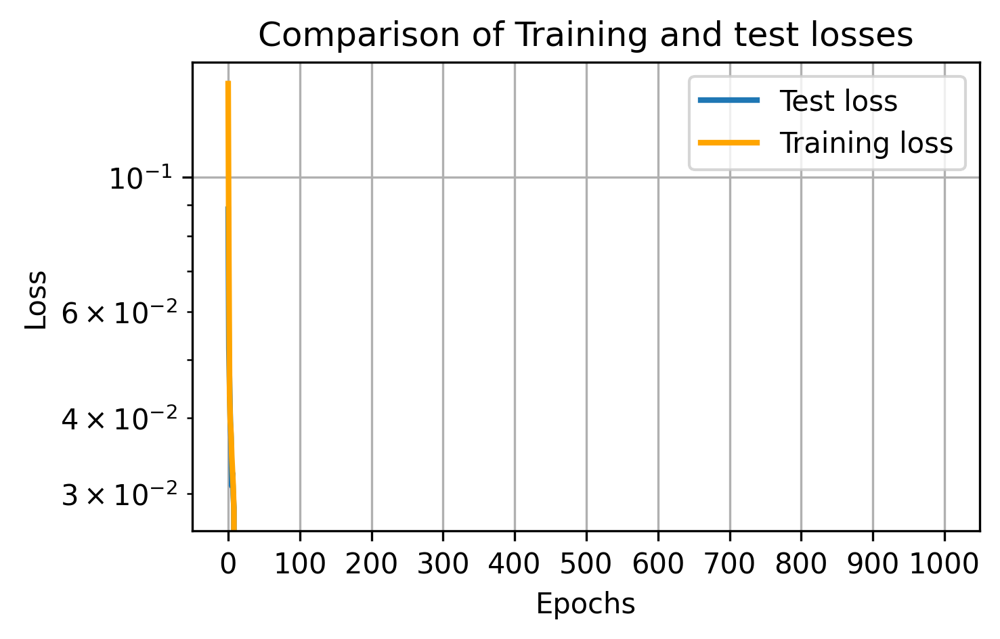

  1%|▍                                      | 10/1000 [02:02<3:20:03, 12.12s/it]

Epoch:10 
 Training time for  epoch 10: 0.201 minutes,Training loss:  0.026269790784614843, Testing loss: 0.02563374988734722


  1%|▍                                      | 11/1000 [02:14<3:19:35, 12.11s/it]

Epoch:11 
 Training time for  epoch 11: 0.201 minutes,Training loss:  0.025157631452776205, Testing loss: 0.025722378268837928


  1%|▍                                      | 12/1000 [02:26<3:19:04, 12.09s/it]

Epoch:12 
 Training time for  epoch 12: 0.201 minutes,Training loss:  0.023330209083405176, Testing loss: 0.026479071639478206


  1%|▌                                      | 13/1000 [02:38<3:18:25, 12.06s/it]

Epoch:13 
 Training time for  epoch 13: 0.2 minutes,Training loss:  0.022445118178058585, Testing loss: 0.024651448652148248


  1%|▌                                      | 14/1000 [02:50<3:17:56, 12.05s/it]

Epoch:14 
 Training time for  epoch 14: 0.2 minutes,Training loss:  0.02157411890258011, Testing loss: 0.02193437522277236


  2%|▌                                      | 15/1000 [03:02<3:17:52, 12.05s/it]

Epoch:15 
 Training time for  epoch 15: 0.201 minutes,Training loss:  0.020099405771495642, Testing loss: 0.019155750088393687


  2%|▌                                      | 16/1000 [03:14<3:17:10, 12.02s/it]

Epoch:16 
 Training time for  epoch 16: 0.199 minutes,Training loss:  0.019649069833068415, Testing loss: 0.017941865157335996


  2%|▋                                      | 17/1000 [03:26<3:17:36, 12.06s/it]

Epoch:17 
 Training time for  epoch 17: 0.203 minutes,Training loss:  0.0193037755839293, Testing loss: 0.017387210242450237


  2%|▋                                      | 18/1000 [03:38<3:16:59, 12.04s/it]

Epoch:18 
 Training time for  epoch 18: 0.2 minutes,Training loss:  0.01856435904696878, Testing loss: 0.0213146261498332
Epoch:19 
 Training time for  epoch 19: 0.198 minutes,Training loss:  0.0183394575993445, Testing loss: 0.017785357758402825


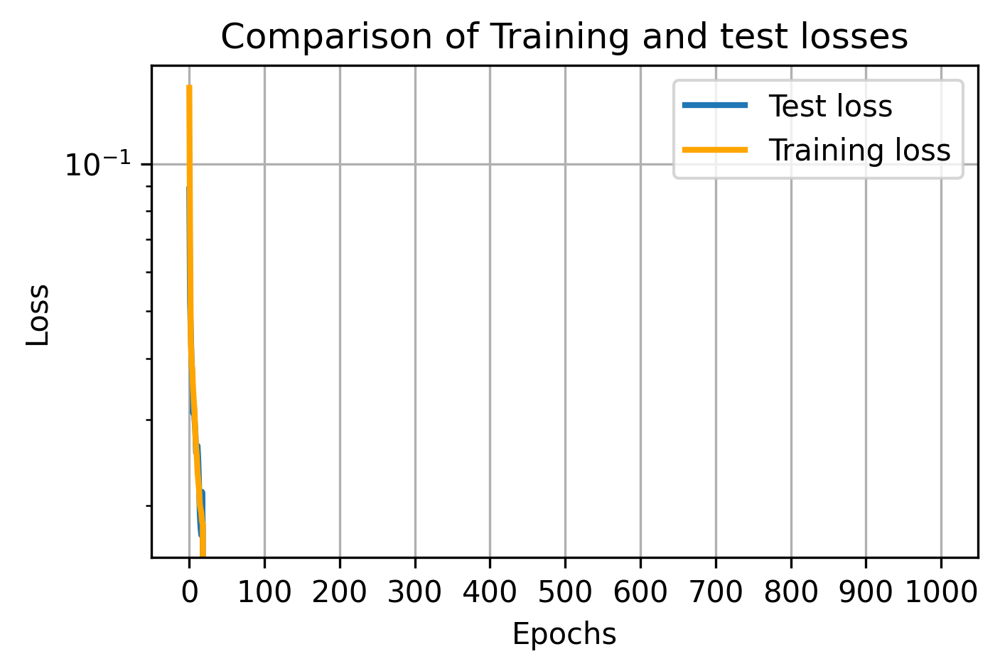

  2%|▊                                      | 20/1000 [04:03<3:16:26, 12.03s/it]

Epoch:20 
 Training time for  epoch 20: 0.199 minutes,Training loss:  0.01839909115622337, Testing loss: 0.021763627380132676


  2%|▊                                      | 21/1000 [04:15<3:16:02, 12.01s/it]

Epoch:21 
 Training time for  epoch 21: 0.2 minutes,Training loss:  0.017930217716803948, Testing loss: 0.01677556984126568


  2%|▊                                      | 22/1000 [04:27<3:15:51, 12.02s/it]

Epoch:22 
 Training time for  epoch 22: 0.2 minutes,Training loss:  0.01812025891026346, Testing loss: 0.016458626184612513


  2%|▉                                      | 23/1000 [04:38<3:15:14, 11.99s/it]

Epoch:23 
 Training time for  epoch 23: 0.199 minutes,Training loss:  0.017129957836021805, Testing loss: 0.01781160704791546


  2%|▉                                      | 24/1000 [04:50<3:14:55, 11.98s/it]

Epoch:24 
 Training time for  epoch 24: 0.199 minutes,Training loss:  0.01681928980000897, Testing loss: 0.01564585857093334


  2%|▉                                      | 25/1000 [05:02<3:14:50, 11.99s/it]

Epoch:25 
 Training time for  epoch 25: 0.2 minutes,Training loss:  0.016605894207850566, Testing loss: 0.01582498846575618


  3%|█                                      | 26/1000 [05:15<3:15:14, 12.03s/it]

Epoch:26 
 Training time for  epoch 26: 0.202 minutes,Training loss:  0.016640311865293952, Testing loss: 0.01649788113310933


  3%|█                                      | 27/1000 [05:26<3:14:18, 11.98s/it]

Epoch:27 
 Training time for  epoch 27: 0.198 minutes,Training loss:  0.016198248760374512, Testing loss: 0.01641731822863221


  3%|█                                      | 28/1000 [05:38<3:13:51, 11.97s/it]

Epoch:28 
 Training time for  epoch 28: 0.199 minutes,Training loss:  0.01646275782328138, Testing loss: 0.017082136794924735
Epoch:29 
 Training time for  epoch 29: 0.198 minutes,Training loss:  0.015967050161641027, Testing loss: 0.01666475275531411


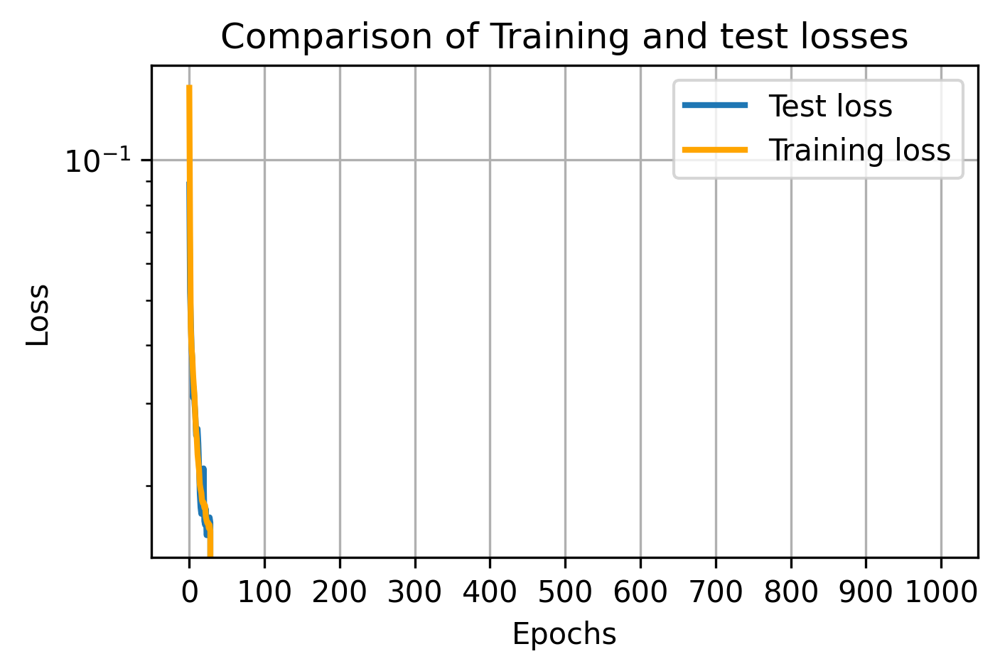

  3%|█▏                                     | 30/1000 [06:03<3:14:11, 12.01s/it]

Epoch:30 
 Training time for  epoch 30: 0.2 minutes,Training loss:  0.01531138055136862, Testing loss: 0.015101377479732036


  3%|█▏                                     | 31/1000 [06:14<3:13:52, 12.00s/it]

Epoch:31 
 Training time for  epoch 31: 0.2 minutes,Training loss:  0.015770106110721827, Testing loss: 0.013664624132215976


  3%|█▏                                     | 32/1000 [06:26<3:12:57, 11.96s/it]

Epoch:32 
 Training time for  epoch 32: 0.198 minutes,Training loss:  0.015892719284227846, Testing loss: 0.015869065281003715


  3%|█▎                                     | 33/1000 [06:38<3:12:24, 11.94s/it]

Epoch:33 
 Training time for  epoch 33: 0.198 minutes,Training loss:  0.014944074752780584, Testing loss: 0.01584768110886216


  3%|█▎                                     | 34/1000 [06:50<3:12:13, 11.94s/it]

Epoch:34 
 Training time for  epoch 34: 0.199 minutes,Training loss:  0.015354372316519281, Testing loss: 0.014691508170217275


  4%|█▎                                     | 35/1000 [07:02<3:12:00, 11.94s/it]

Epoch:35 
 Training time for  epoch 35: 0.199 minutes,Training loss:  0.01472342390194968, Testing loss: 0.015770720653235912


  4%|█▍                                     | 36/1000 [07:14<3:12:00, 11.95s/it]

Epoch:36 
 Training time for  epoch 36: 0.2 minutes,Training loss:  0.014727151966745707, Testing loss: 0.014576878156512976


  4%|█▍                                     | 37/1000 [07:26<3:11:41, 11.94s/it]

Epoch:37 
 Training time for  epoch 37: 0.199 minutes,Training loss:  0.014888739745531763, Testing loss: 0.013765547052025795


  4%|█▍                                     | 38/1000 [07:38<3:11:30, 11.94s/it]

Epoch:38 
 Training time for  epoch 38: 0.199 minutes,Training loss:  0.014265375613677342, Testing loss: 0.013258999809622765
Epoch:39 
 Training time for  epoch 39: 0.202 minutes,Training loss:  0.014698577731627102, Testing loss: 0.01345089215785265


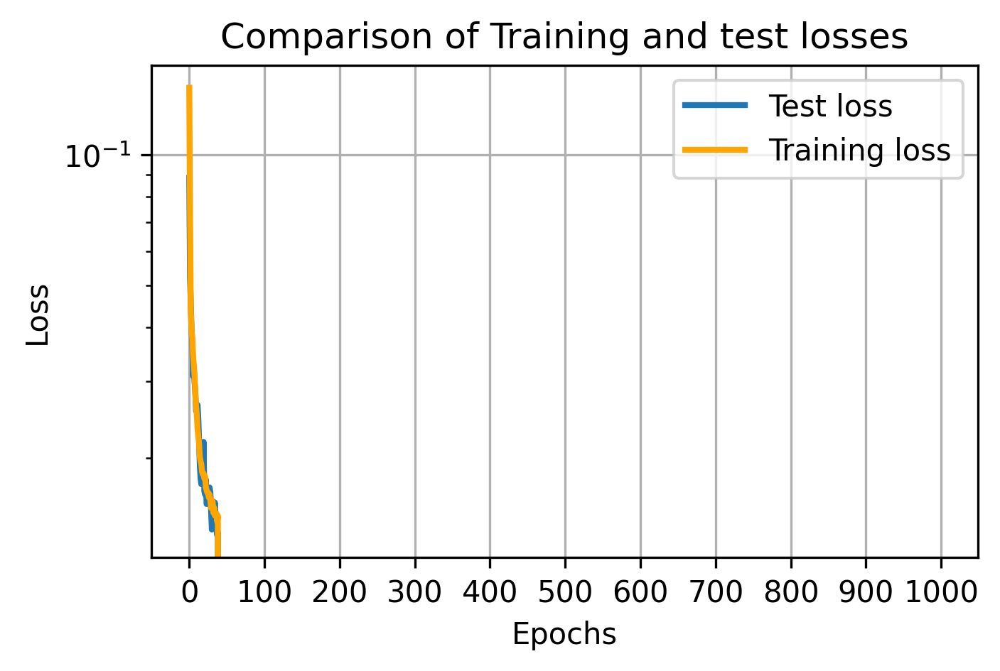

  4%|█▌                                     | 40/1000 [08:02<3:12:21, 12.02s/it]

Epoch:40 
 Training time for  epoch 40: 0.199 minutes,Training loss:  0.014370492766054215, Testing loss: 0.014921657107770443


  4%|█▌                                     | 41/1000 [08:14<3:11:46, 12.00s/it]

Epoch:41 
 Training time for  epoch 41: 0.199 minutes,Training loss:  0.014405491293497755, Testing loss: 0.012942355703562497


  4%|█▋                                     | 42/1000 [08:26<3:11:10, 11.97s/it]

Epoch:42 
 Training time for  epoch 42: 0.199 minutes,Training loss:  0.014392370446806862, Testing loss: 0.014128007348626853


  4%|█▋                                     | 43/1000 [08:38<3:10:35, 11.95s/it]

Epoch:43 
 Training time for  epoch 43: 0.198 minutes,Training loss:  0.014116657679331566, Testing loss: 0.012960205227136612


  4%|█▋                                     | 44/1000 [08:50<3:10:53, 11.98s/it]

Epoch:44 
 Training time for  epoch 44: 0.201 minutes,Training loss:  0.01353492820365019, Testing loss: 0.013166297692805529


  4%|█▊                                     | 45/1000 [09:02<3:10:19, 11.96s/it]

Epoch:45 
 Training time for  epoch 45: 0.198 minutes,Training loss:  0.013589247742085853, Testing loss: 0.012311645038425922


  5%|█▊                                     | 46/1000 [09:14<3:10:56, 12.01s/it]

Epoch:46 
 Training time for  epoch 46: 0.202 minutes,Training loss:  0.01350041834256773, Testing loss: 0.014827560056000949


  5%|█▊                                     | 47/1000 [09:26<3:10:26, 11.99s/it]

Epoch:47 
 Training time for  epoch 47: 0.199 minutes,Training loss:  0.013705181426819712, Testing loss: 0.012797654420137406


  5%|█▊                                     | 48/1000 [09:38<3:10:24, 12.00s/it]

Epoch:48 
 Training time for  epoch 48: 0.2 minutes,Training loss:  0.013587620793479417, Testing loss: 0.011363260429352522
Epoch:49 
 Training time for  epoch 49: 0.201 minutes,Training loss:  0.01348208114461547, Testing loss: 0.012922688759863377


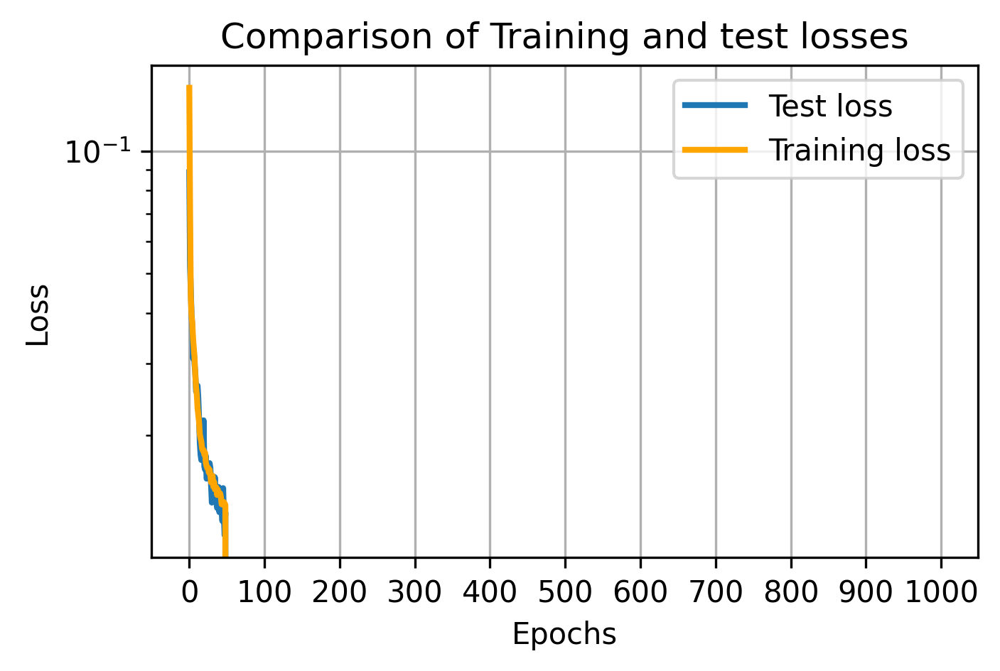

  5%|█▉                                     | 50/1000 [10:02<3:11:08, 12.07s/it]

Epoch:50 
 Training time for  epoch 50: 0.201 minutes,Training loss:  0.012796597767288123, Testing loss: 0.015452750399708748


  5%|█▉                                     | 51/1000 [10:14<3:11:09, 12.09s/it]

Epoch:51 
 Training time for  epoch 51: 0.202 minutes,Training loss:  0.013100275514013503, Testing loss: 0.013685421068221331


  5%|██                                     | 52/1000 [10:27<3:10:44, 12.07s/it]

Epoch:52 
 Training time for  epoch 52: 0.201 minutes,Training loss:  0.01334695333699316, Testing loss: 0.01186956325545907


  5%|██                                     | 53/1000 [10:39<3:10:17, 12.06s/it]

Epoch:53 
 Training time for  epoch 53: 0.2 minutes,Training loss:  0.012927557573773823, Testing loss: 0.014889503996819257


  5%|██                                     | 54/1000 [10:50<3:09:33, 12.02s/it]

Epoch:54 
 Training time for  epoch 54: 0.199 minutes,Training loss:  0.012976636779121406, Testing loss: 0.011803122805431485


  6%|██▏                                    | 55/1000 [11:03<3:10:04, 12.07s/it]

Epoch:55 
 Training time for  epoch 55: 0.203 minutes,Training loss:  0.012408011038025081, Testing loss: 0.011895137410610913


  6%|██▏                                    | 56/1000 [11:15<3:09:51, 12.07s/it]

Epoch:56 
 Training time for  epoch 56: 0.201 minutes,Training loss:  0.01239107541835128, Testing loss: 0.011036451123654843


  6%|██▏                                    | 57/1000 [11:27<3:09:30, 12.06s/it]

Epoch:57 
 Training time for  epoch 57: 0.201 minutes,Training loss:  0.012403107990816876, Testing loss: 0.01317166954278946


  6%|██▎                                    | 58/1000 [11:39<3:09:15, 12.05s/it]

Epoch:58 
 Training time for  epoch 58: 0.201 minutes,Training loss:  0.01224308757005426, Testing loss: 0.010528215141966939
Epoch:59 
 Training time for  epoch 59: 0.2 minutes,Training loss:  0.011917365523451089, Testing loss: 0.011305574467405677


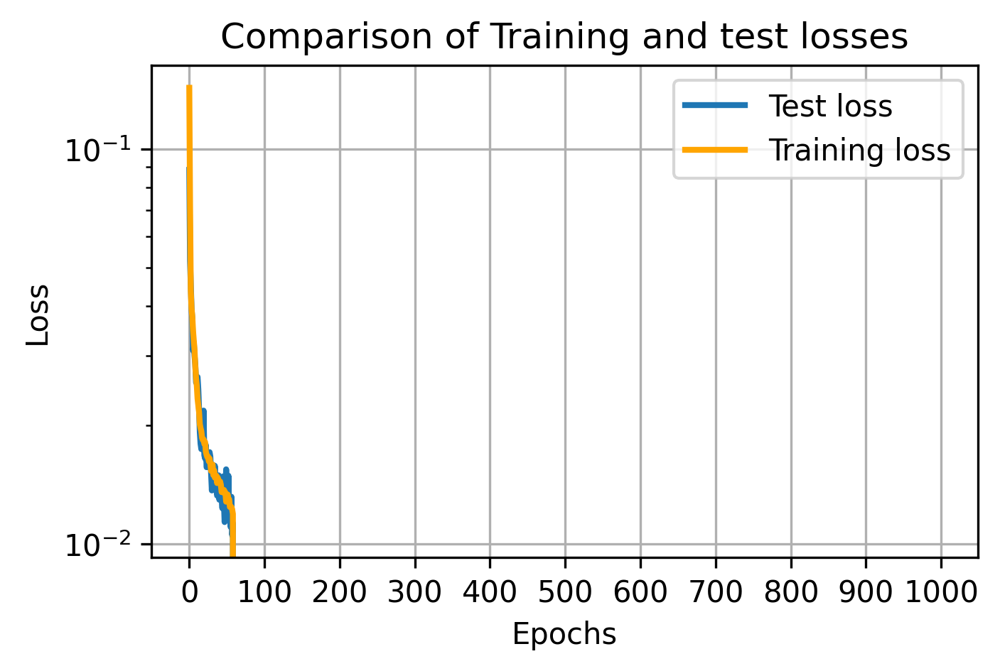

  6%|██▎                                    | 60/1000 [12:03<3:08:35, 12.04s/it]

Epoch:60 
 Training time for  epoch 60: 0.198 minutes,Training loss:  0.012292459348603893, Testing loss: 0.011883799005299806


  6%|██▍                                    | 61/1000 [12:15<3:07:45, 12.00s/it]

Epoch:61 
 Training time for  epoch 61: 0.198 minutes,Training loss:  0.012130466412588452, Testing loss: 0.011860546749085188


  6%|██▍                                    | 62/1000 [12:27<3:07:27, 11.99s/it]

Epoch:62 
 Training time for  epoch 62: 0.2 minutes,Training loss:  0.012323597590487697, Testing loss: 0.01217631921172142


  6%|██▍                                    | 63/1000 [12:39<3:06:46, 11.96s/it]

Epoch:63 
 Training time for  epoch 63: 0.198 minutes,Training loss:  0.011875627823628304, Testing loss: 0.012142198234796524


  6%|██▍                                    | 64/1000 [12:51<3:06:40, 11.97s/it]

Epoch:64 
 Training time for  epoch 64: 0.2 minutes,Training loss:  0.012057604843644591, Testing loss: 0.011518393587321043


  6%|██▌                                    | 65/1000 [13:03<3:06:21, 11.96s/it]

Epoch:65 
 Training time for  epoch 65: 0.199 minutes,Training loss:  0.01191189856366898, Testing loss: 0.014288327395915986


  7%|██▌                                    | 66/1000 [13:15<3:06:09, 11.96s/it]

Epoch:66 
 Training time for  epoch 66: 0.199 minutes,Training loss:  0.011814863316100372, Testing loss: 0.010792218875139951


  7%|██▌                                    | 67/1000 [13:27<3:05:56, 11.96s/it]

Epoch:67 
 Training time for  epoch 67: 0.199 minutes,Training loss:  0.011759939202205921, Testing loss: 0.01025531966239214


  7%|██▋                                    | 68/1000 [13:38<3:05:36, 11.95s/it]

Epoch:68 
 Training time for  epoch 68: 0.199 minutes,Training loss:  0.011454487686736658, Testing loss: 0.011100896243005991
Epoch:69 
 Training time for  epoch 69: 0.199 minutes,Training loss:  0.011475361138365895, Testing loss: 0.011411981023848057


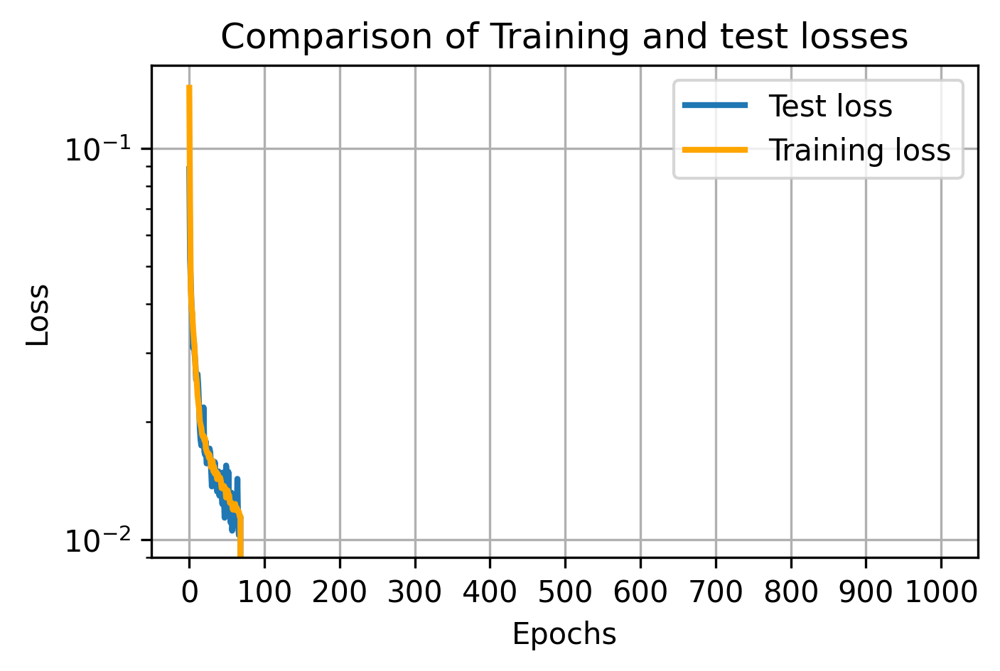

  7%|██▋                                    | 70/1000 [14:03<3:06:23, 12.02s/it]

Epoch:70 
 Training time for  epoch 70: 0.201 minutes,Training loss:  0.011462710663118117, Testing loss: 0.011785900183022023


  7%|██▊                                    | 71/1000 [14:15<3:06:21, 12.04s/it]

Epoch:71 
 Training time for  epoch 71: 0.201 minutes,Training loss:  0.011432999666589859, Testing loss: 0.01075601201504469


  7%|██▊                                    | 72/1000 [14:27<3:06:27, 12.06s/it]

Epoch:72 
 Training time for  epoch 72: 0.202 minutes,Training loss:  0.01124298626948559, Testing loss: 0.01438313327729702


  7%|██▊                                    | 73/1000 [14:39<3:06:07, 12.05s/it]

Epoch:73 
 Training time for  epoch 73: 0.2 minutes,Training loss:  0.011414679585610982, Testing loss: 0.010868656411767007


  7%|██▉                                    | 74/1000 [14:51<3:05:57, 12.05s/it]

Epoch:74 
 Training time for  epoch 74: 0.201 minutes,Training loss:  0.011187197643783241, Testing loss: 0.012744407821446656


  8%|██▉                                    | 75/1000 [15:03<3:05:38, 12.04s/it]

Epoch:75 
 Training time for  epoch 75: 0.2 minutes,Training loss:  0.011127543078603506, Testing loss: 0.011631867494434118


  8%|██▉                                    | 76/1000 [15:15<3:05:18, 12.03s/it]

Epoch:76 
 Training time for  epoch 76: 0.2 minutes,Training loss:  0.011344876313964976, Testing loss: 0.011679957024753093


  8%|███                                    | 77/1000 [15:27<3:04:59, 12.03s/it]

Epoch:77 
 Training time for  epoch 77: 0.2 minutes,Training loss:  0.01089393556102868, Testing loss: 0.009104866795241832


  8%|███                                    | 78/1000 [15:39<3:04:54, 12.03s/it]

Epoch:78 
 Training time for  epoch 78: 0.201 minutes,Training loss:  0.011303805563334943, Testing loss: 0.010249977353960276
Epoch:79 
 Training time for  epoch 79: 0.199 minutes,Training loss:  0.010823525328829487, Testing loss: 0.00994228458032012


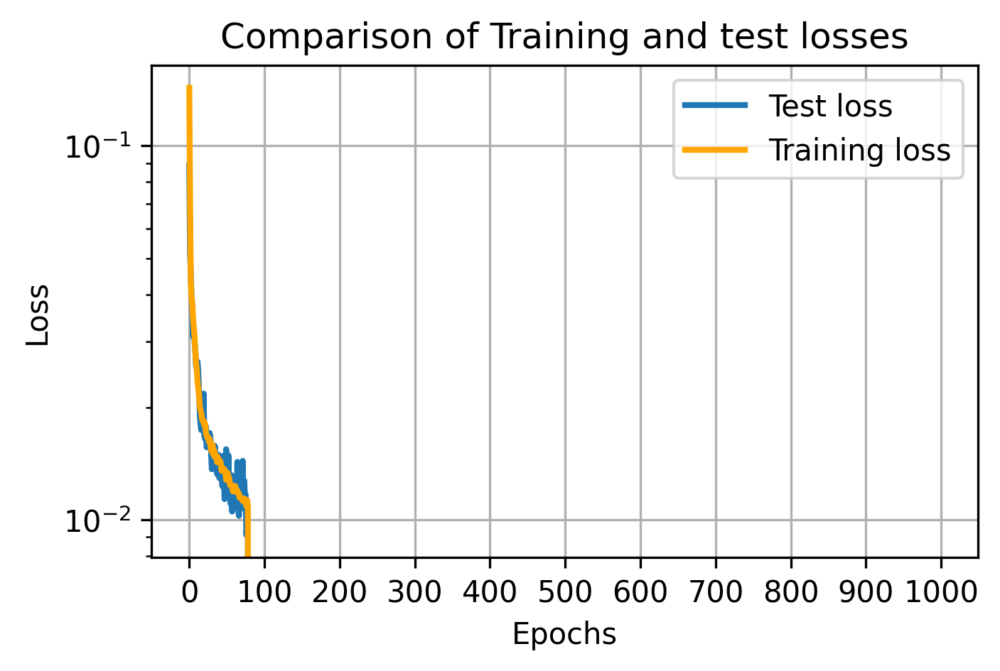

  8%|███                                    | 80/1000 [16:03<3:04:26, 12.03s/it]

Epoch:80 
 Training time for  epoch 80: 0.199 minutes,Training loss:  0.010862654199960029, Testing loss: 0.009763560574501753


  8%|███▏                                   | 81/1000 [16:15<3:04:31, 12.05s/it]

Epoch:81 
 Training time for  epoch 81: 0.202 minutes,Training loss:  0.010979182150703828, Testing loss: 0.01065291251987219


  8%|███▏                                   | 82/1000 [16:27<3:04:12, 12.04s/it]

Epoch:82 
 Training time for  epoch 82: 0.2 minutes,Training loss:  0.01053236041955745, Testing loss: 0.010561412069946527


  8%|███▏                                   | 83/1000 [16:39<3:03:33, 12.01s/it]

Epoch:83 
 Training time for  epoch 83: 0.199 minutes,Training loss:  0.010832675692109385, Testing loss: 0.01140319931320846


  8%|███▎                                   | 84/1000 [16:51<3:02:56, 11.98s/it]

Epoch:84 
 Training time for  epoch 84: 0.199 minutes,Training loss:  0.010818408529028625, Testing loss: 0.011468712808564305


  8%|███▎                                   | 85/1000 [17:03<3:02:55, 12.00s/it]

Epoch:85 
 Training time for  epoch 85: 0.2 minutes,Training loss:  0.010692712495538312, Testing loss: 0.016313471980392933


  9%|███▎                                   | 86/1000 [17:15<3:02:55, 12.01s/it]

Epoch:86 
 Training time for  epoch 86: 0.201 minutes,Training loss:  0.010633113725342367, Testing loss: 0.01215390756726265


  9%|███▍                                   | 87/1000 [17:27<3:03:03, 12.03s/it]

Epoch:87 
 Training time for  epoch 87: 0.201 minutes,Training loss:  0.011085435741610227, Testing loss: 0.008867895463481545


  9%|███▍                                   | 88/1000 [17:39<3:03:46, 12.09s/it]

Epoch:88 
 Training time for  epoch 88: 0.204 minutes,Training loss:  0.010307376472004684, Testing loss: 0.0118976310454309
Epoch:89 
 Training time for  epoch 89: 0.202 minutes,Training loss:  0.01052145165706034, Testing loss: 0.009580385154113174


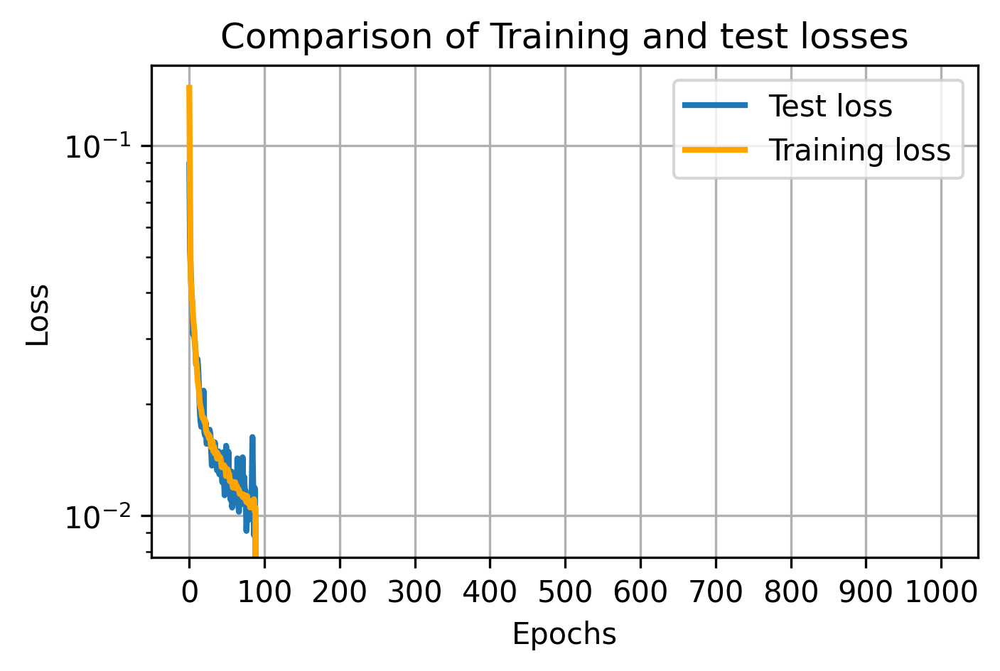

  9%|███▌                                   | 90/1000 [18:04<3:03:20, 12.09s/it]

Epoch:90 
 Training time for  epoch 90: 0.198 minutes,Training loss:  0.010749231115347, Testing loss: 0.012135289013385772


  9%|███▌                                   | 91/1000 [18:16<3:03:26, 12.11s/it]

Epoch:91 
 Training time for  epoch 91: 0.203 minutes,Training loss:  0.010229778165077742, Testing loss: 0.011726219430565834


  9%|███▌                                   | 92/1000 [18:28<3:03:03, 12.10s/it]

Epoch:92 
 Training time for  epoch 92: 0.201 minutes,Training loss:  0.010301768964180306, Testing loss: 0.010449402313679457


  9%|███▋                                   | 93/1000 [18:40<3:02:43, 12.09s/it]

Epoch:93 
 Training time for  epoch 93: 0.201 minutes,Training loss:  0.009979437222719436, Testing loss: 0.010225640516728163


  9%|███▋                                   | 94/1000 [18:52<3:02:02, 12.06s/it]

Epoch:94 
 Training time for  epoch 94: 0.2 minutes,Training loss:  0.010185982037387555, Testing loss: 0.009126589633524418


 10%|███▋                                   | 95/1000 [19:04<3:01:25, 12.03s/it]

Epoch:95 
 Training time for  epoch 95: 0.199 minutes,Training loss:  0.01031030677626738, Testing loss: 0.009218633444979786


 10%|███▋                                   | 96/1000 [19:16<3:00:58, 12.01s/it]

Epoch:96 
 Training time for  epoch 96: 0.2 minutes,Training loss:  0.01020816408214565, Testing loss: 0.010544261764734983


 10%|███▊                                   | 97/1000 [19:28<3:00:44, 12.01s/it]

Epoch:97 
 Training time for  epoch 97: 0.2 minutes,Training loss:  0.010409475191151258, Testing loss: 0.010680034682154655


 10%|███▊                                   | 98/1000 [19:40<3:00:57, 12.04s/it]

Epoch:98 
 Training time for  epoch 98: 0.202 minutes,Training loss:  0.009987149171803782, Testing loss: 0.010397405549883842
Epoch:99 
 Training time for  epoch 99: 0.203 minutes,Training loss:  0.01005006384842193, Testing loss: 0.010132361128926277


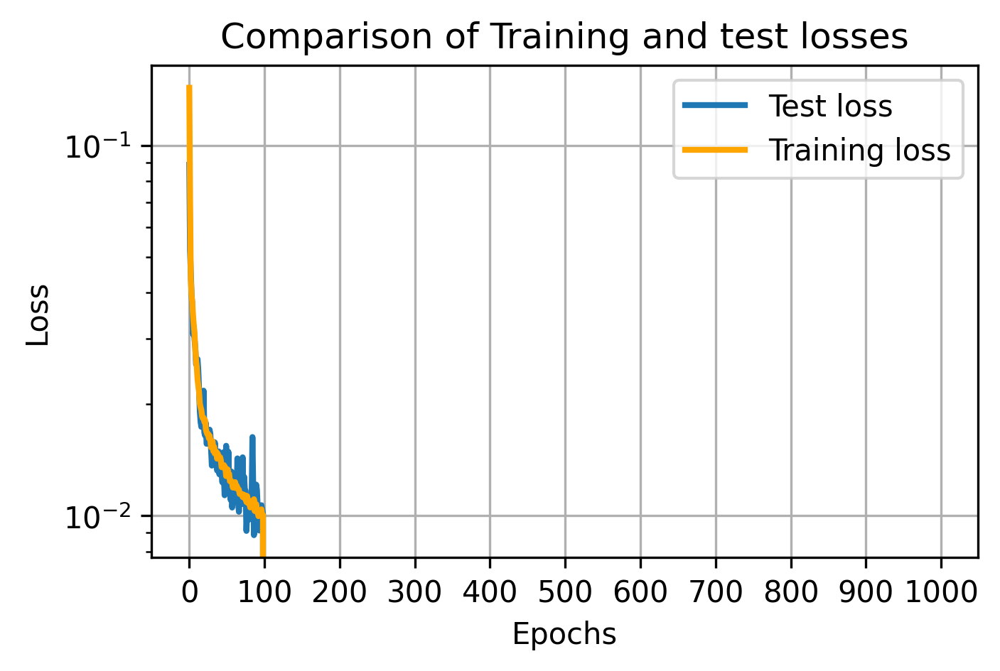

 10%|███▊                                  | 100/1000 [20:05<3:02:15, 12.15s/it]

Epoch:100 
 Training time for  epoch 100: 0.202 minutes,Training loss:  0.009982074577357019, Testing loss: 0.009499348783865571


 10%|███▊                                  | 101/1000 [20:17<3:01:23, 12.11s/it]

Epoch:101 
 Training time for  epoch 101: 0.2 minutes,Training loss:  0.009747403224932331, Testing loss: 0.00958758233115077


 10%|███▉                                  | 102/1000 [20:29<3:01:08, 12.10s/it]

Epoch:102 
 Training time for  epoch 102: 0.202 minutes,Training loss:  0.009827438641867399, Testing loss: 0.009429756086319685


 10%|███▉                                  | 103/1000 [20:41<3:00:31, 12.08s/it]

Epoch:103 
 Training time for  epoch 103: 0.2 minutes,Training loss:  0.009938663459068183, Testing loss: 0.009519924633204937


 10%|███▉                                  | 104/1000 [20:53<3:00:16, 12.07s/it]

Epoch:104 
 Training time for  epoch 104: 0.201 minutes,Training loss:  0.010062411555135568, Testing loss: 0.012025538068264723


 10%|███▉                                  | 105/1000 [21:05<2:59:55, 12.06s/it]

Epoch:105 
 Training time for  epoch 105: 0.201 minutes,Training loss:  0.009731287386000122, Testing loss: 0.012614278439432382


 11%|████                                  | 106/1000 [21:17<2:59:44, 12.06s/it]

Epoch:106 
 Training time for  epoch 106: 0.201 minutes,Training loss:  0.009786960382217868, Testing loss: 0.010258378246799111


 11%|████                                  | 107/1000 [21:29<2:59:39, 12.07s/it]

Epoch:107 
 Training time for  epoch 107: 0.201 minutes,Training loss:  0.009859985220878798, Testing loss: 0.008851341037079692


 11%|████                                  | 108/1000 [21:41<2:59:28, 12.07s/it]

Epoch:108 
 Training time for  epoch 108: 0.201 minutes,Training loss:  0.009576288833954609, Testing loss: 0.009409950962290168
Epoch:109 
 Training time for  epoch 109: 0.2 minutes,Training loss:  0.009735579467751734, Testing loss: 0.008383667832240461


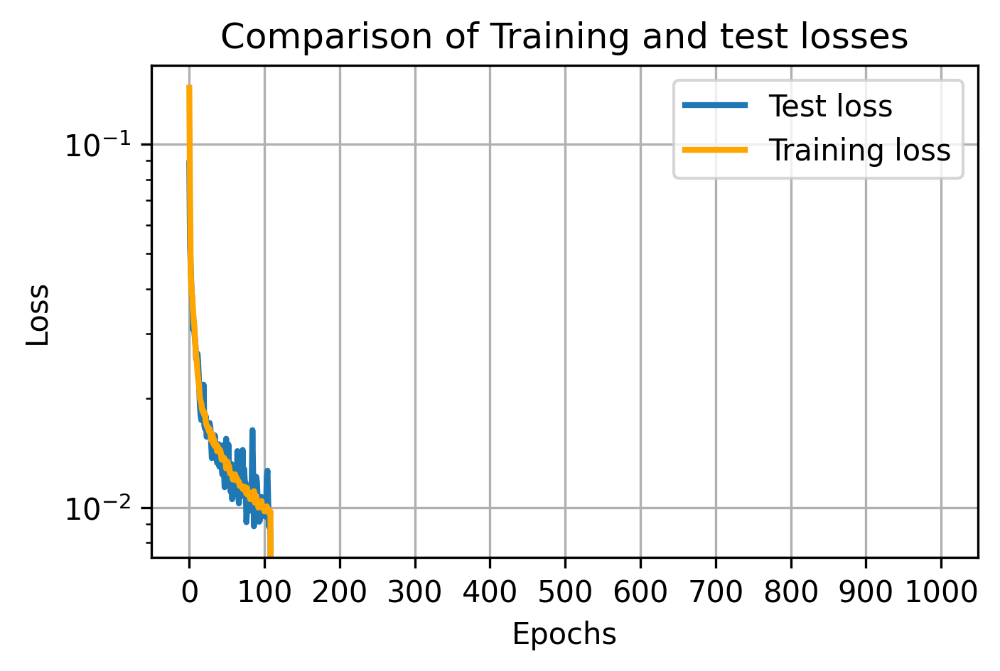

 11%|████▏                                 | 110/1000 [22:05<2:59:20, 12.09s/it]

Epoch:110 
 Training time for  epoch 110: 0.2 minutes,Training loss:  0.00961842836647724, Testing loss: 0.008003788804635405


 11%|████▏                                 | 111/1000 [22:17<2:59:01, 12.08s/it]

Epoch:111 
 Training time for  epoch 111: 0.201 minutes,Training loss:  0.009491815167921622, Testing loss: 0.010589681360870599


 11%|████▎                                 | 112/1000 [22:29<2:59:01, 12.10s/it]

Epoch:112 
 Training time for  epoch 112: 0.202 minutes,Training loss:  0.009761635105381963, Testing loss: 0.008860809272155165


 11%|████▎                                 | 113/1000 [22:41<2:58:25, 12.07s/it]

Epoch:113 
 Training time for  epoch 113: 0.2 minutes,Training loss:  0.009336377462668563, Testing loss: 0.008287085825577379


 11%|████▎                                 | 114/1000 [22:54<2:58:19, 12.08s/it]

Epoch:114 
 Training time for  epoch 114: 0.201 minutes,Training loss:  0.009476013514608075, Testing loss: 0.009302997654303908


 12%|████▎                                 | 115/1000 [23:06<2:58:28, 12.10s/it]

Epoch:115 
 Training time for  epoch 115: 0.203 minutes,Training loss:  0.00949527205018874, Testing loss: 0.00940993363969028


 12%|████▍                                 | 116/1000 [23:18<2:58:12, 12.10s/it]

Epoch:116 
 Training time for  epoch 116: 0.201 minutes,Training loss:  0.009615334354959749, Testing loss: 0.008114482359960675


 12%|████▍                                 | 117/1000 [23:30<2:57:45, 12.08s/it]

Epoch:117 
 Training time for  epoch 117: 0.201 minutes,Training loss:  0.009385726224786832, Testing loss: 0.011003215722739696


 12%|████▍                                 | 118/1000 [23:42<2:57:26, 12.07s/it]

Epoch:118 
 Training time for  epoch 118: 0.201 minutes,Training loss:  0.00947142324413624, Testing loss: 0.007951187426224351
Epoch:119 
 Training time for  epoch 119: 0.202 minutes,Training loss:  0.009198758526706288, Testing loss: 0.008734895940870046


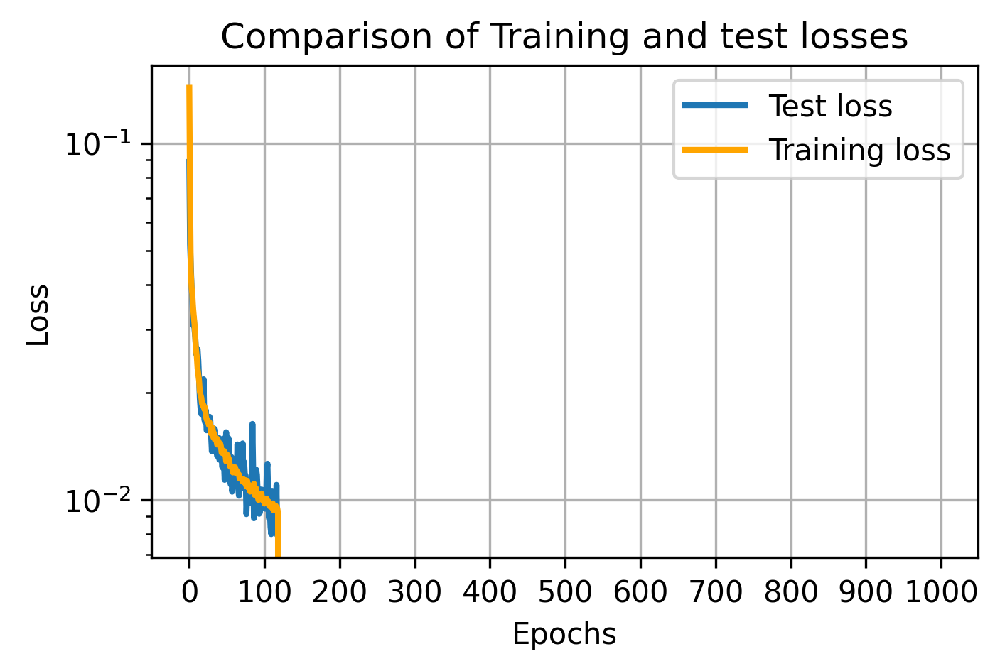

 12%|████▌                                 | 120/1000 [24:06<2:57:31, 12.10s/it]

Epoch:120 
 Training time for  epoch 120: 0.2 minutes,Training loss:  0.00934352380094853, Testing loss: 0.011894723325967789


 12%|████▌                                 | 121/1000 [24:18<2:56:50, 12.07s/it]

Epoch:121 
 Training time for  epoch 121: 0.2 minutes,Training loss:  0.009643898412593912, Testing loss: 0.009839834487065673


 12%|████▋                                 | 122/1000 [24:30<2:56:26, 12.06s/it]

Epoch:122 
 Training time for  epoch 122: 0.2 minutes,Training loss:  0.009166811081244416, Testing loss: 0.008053212128579616


 12%|████▋                                 | 123/1000 [24:42<2:55:53, 12.03s/it]

Epoch:123 
 Training time for  epoch 123: 0.2 minutes,Training loss:  0.009255727151090779, Testing loss: 0.009144458072260022


 12%|████▋                                 | 124/1000 [24:54<2:55:31, 12.02s/it]

Epoch:124 
 Training time for  epoch 124: 0.2 minutes,Training loss:  0.009143898840647507, Testing loss: 0.009733793307095766


 12%|████▊                                 | 125/1000 [25:06<2:55:30, 12.03s/it]

Epoch:125 
 Training time for  epoch 125: 0.201 minutes,Training loss:  0.00910238392594834, Testing loss: 0.008500436004251242


 13%|████▊                                 | 126/1000 [25:18<2:55:07, 12.02s/it]

Epoch:126 
 Training time for  epoch 126: 0.2 minutes,Training loss:  0.009115464213595192, Testing loss: 0.008710997104644775


 13%|████▊                                 | 127/1000 [25:30<2:55:11, 12.04s/it]

Epoch:127 
 Training time for  epoch 127: 0.201 minutes,Training loss:  0.009175201182434298, Testing loss: 0.010067210868000984


 13%|████▊                                 | 128/1000 [25:42<2:55:08, 12.05s/it]

Epoch:128 
 Training time for  epoch 128: 0.201 minutes,Training loss:  0.009150327630579021, Testing loss: 0.009003674024716019
Epoch:129 
 Training time for  epoch 129: 0.201 minutes,Training loss:  0.009194478619212023, Testing loss: 0.010666604461148381


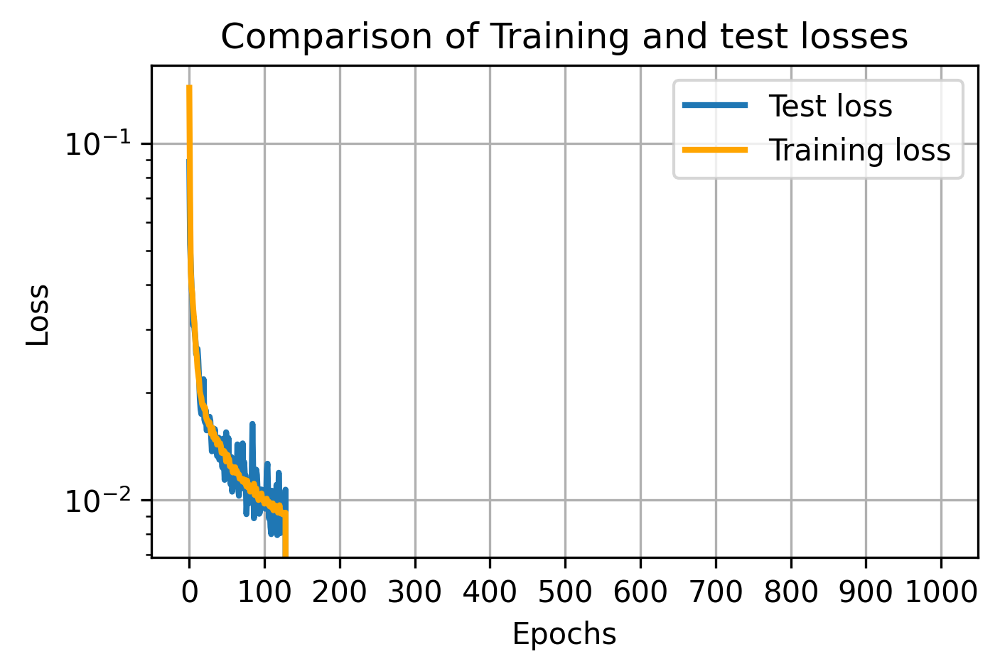

 13%|████▉                                 | 130/1000 [26:07<2:55:20, 12.09s/it]

Epoch:130 
 Training time for  epoch 130: 0.2 minutes,Training loss:  0.009450592238533891, Testing loss: 0.009899631217122078


 13%|████▉                                 | 131/1000 [26:19<2:54:54, 12.08s/it]

Epoch:131 
 Training time for  epoch 131: 0.201 minutes,Training loss:  0.009175312225614933, Testing loss: 0.012164105921983718


 13%|█████                                 | 132/1000 [26:31<2:54:47, 12.08s/it]

Epoch:132 
 Training time for  epoch 132: 0.202 minutes,Training loss:  0.008795915053060557, Testing loss: 0.008748915186151862


 13%|█████                                 | 133/1000 [26:43<2:54:08, 12.05s/it]

Epoch:133 
 Training time for  epoch 133: 0.2 minutes,Training loss:  0.008989175746994014, Testing loss: 0.008457523146644235


 13%|█████                                 | 134/1000 [26:55<2:53:46, 12.04s/it]

Epoch:134 
 Training time for  epoch 134: 0.2 minutes,Training loss:  0.00907243834051296, Testing loss: 0.009580236561596393


 14%|█████▏                                | 135/1000 [27:07<2:53:15, 12.02s/it]

Epoch:135 
 Training time for  epoch 135: 0.199 minutes,Training loss:  0.009229186028307012, Testing loss: 0.007718686172738671


 14%|█████▏                                | 136/1000 [27:19<2:53:18, 12.04s/it]

Epoch:136 
 Training time for  epoch 136: 0.201 minutes,Training loss:  0.009033211134806813, Testing loss: 0.007835976425558328


 14%|█████▏                                | 137/1000 [27:31<2:53:28, 12.06s/it]

Epoch:137 
 Training time for  epoch 137: 0.202 minutes,Training loss:  0.008818125615110589, Testing loss: 0.00832676432095468


 14%|█████▏                                | 138/1000 [27:43<2:53:12, 12.06s/it]

Epoch:138 
 Training time for  epoch 138: 0.201 minutes,Training loss:  0.008843538113929218, Testing loss: 0.009547891765832902
Epoch:139 
 Training time for  epoch 139: 0.201 minutes,Training loss:  0.009078558425134551, Testing loss: 0.011269790679216385


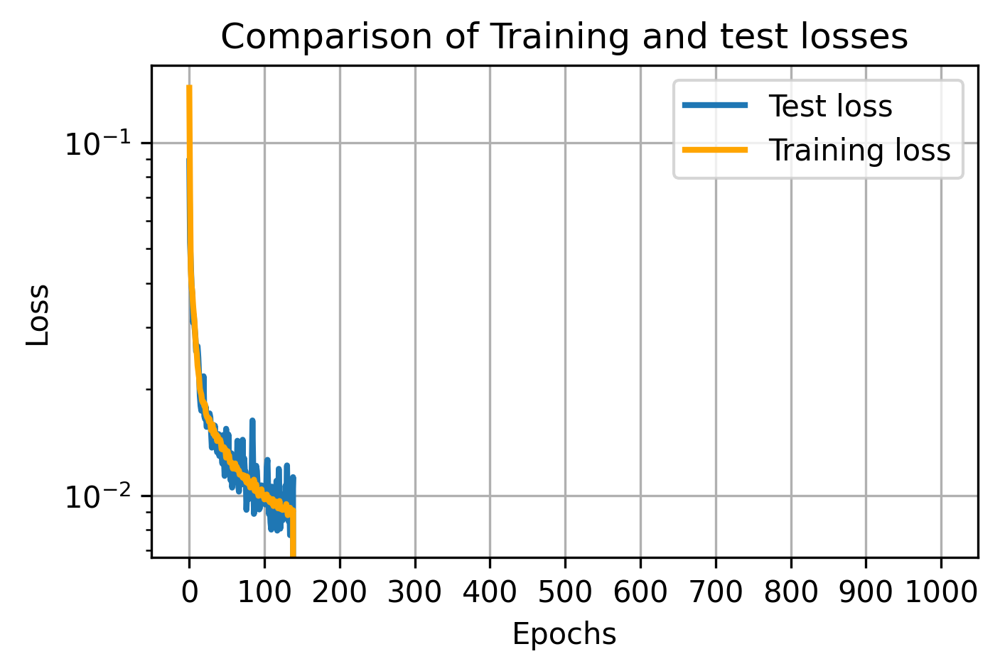

 14%|█████▎                                | 140/1000 [28:07<2:53:30, 12.11s/it]

Epoch:140 
 Training time for  epoch 140: 0.201 minutes,Training loss:  0.008735702277899965, Testing loss: 0.009556582784280182


 14%|█████▎                                | 141/1000 [28:19<2:52:58, 12.08s/it]

Epoch:141 
 Training time for  epoch 141: 0.2 minutes,Training loss:  0.009061965260667668, Testing loss: 0.008324167504906655


 14%|█████▍                                | 142/1000 [28:31<2:52:26, 12.06s/it]

Epoch:142 
 Training time for  epoch 142: 0.2 minutes,Training loss:  0.008891973908964661, Testing loss: 0.009631369970738888


 14%|█████▍                                | 143/1000 [28:44<2:52:08, 12.05s/it]

Epoch:143 
 Training time for  epoch 143: 0.201 minutes,Training loss:  0.008999446583814425, Testing loss: 0.009428220065310598


 14%|█████▍                                | 144/1000 [28:56<2:51:42, 12.04s/it]

Epoch:144 
 Training time for  epoch 144: 0.2 minutes,Training loss:  0.008801639457011507, Testing loss: 0.008997513456270098


 14%|█████▌                                | 145/1000 [29:08<2:51:42, 12.05s/it]

Epoch:145 
 Training time for  epoch 145: 0.201 minutes,Training loss:  0.009003163375388767, Testing loss: 0.00885544802993536


 15%|█████▌                                | 146/1000 [29:20<2:51:31, 12.05s/it]

Epoch:146 
 Training time for  epoch 146: 0.201 minutes,Training loss:  0.008594203391518016, Testing loss: 0.010644550304859876


 15%|█████▌                                | 147/1000 [29:32<2:51:30, 12.06s/it]

Epoch:147 
 Training time for  epoch 147: 0.202 minutes,Training loss:  0.008708312113430788, Testing loss: 0.008325891643762589


 15%|█████▌                                | 148/1000 [29:44<2:51:20, 12.07s/it]

Epoch:148 
 Training time for  epoch 148: 0.201 minutes,Training loss:  0.009088894282548788, Testing loss: 0.011800021277740597
Epoch:149 
 Training time for  epoch 149: 0.2 minutes,Training loss:  0.008900260417554507, Testing loss: 0.011206074450165034


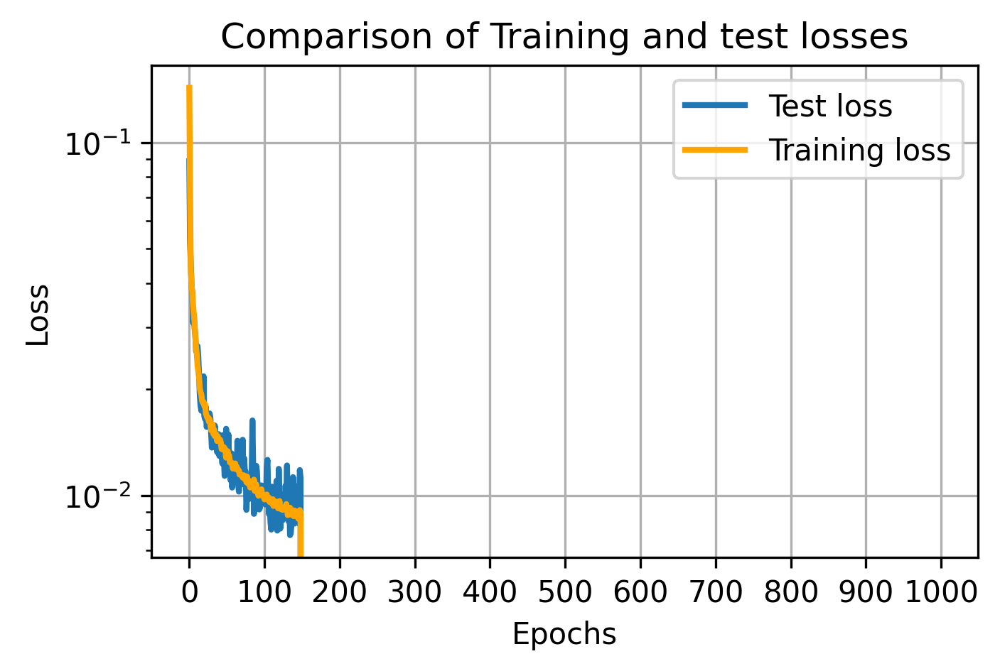

 15%|█████▋                                | 150/1000 [30:08<2:51:07, 12.08s/it]

Epoch:150 
 Training time for  epoch 150: 0.2 minutes,Training loss:  0.008725139594763414, Testing loss: 0.007640409087762237


 15%|█████▋                                | 151/1000 [30:20<2:50:37, 12.06s/it]

Epoch:151 
 Training time for  epoch 151: 0.2 minutes,Training loss:  0.008619086287426789, Testing loss: 0.007283606380224228


 15%|█████▊                                | 152/1000 [30:32<2:50:08, 12.04s/it]

Epoch:152 
 Training time for  epoch 152: 0.2 minutes,Training loss:  0.008870093118935893, Testing loss: 0.008010416505858303


 15%|█████▊                                | 153/1000 [30:44<2:50:04, 12.05s/it]

Epoch:153 
 Training time for  epoch 153: 0.201 minutes,Training loss:  0.008454698202839504, Testing loss: 0.010991471987217664


 15%|█████▊                                | 154/1000 [30:56<2:49:54, 12.05s/it]

Epoch:154 
 Training time for  epoch 154: 0.201 minutes,Training loss:  0.008813241734109932, Testing loss: 0.010143445106223226


 16%|█████▉                                | 155/1000 [31:08<2:49:38, 12.05s/it]

Epoch:155 
 Training time for  epoch 155: 0.201 minutes,Training loss:  0.008621989004097611, Testing loss: 0.008744149636477232


 16%|█████▉                                | 156/1000 [31:20<2:49:31, 12.05s/it]

Epoch:156 
 Training time for  epoch 156: 0.201 minutes,Training loss:  0.008931651602214706, Testing loss: 0.009440124463289977


 16%|█████▉                                | 157/1000 [31:32<2:49:24, 12.06s/it]

Epoch:157 
 Training time for  epoch 157: 0.201 minutes,Training loss:  0.008408990269472755, Testing loss: 0.008275723485276103


 16%|██████                                | 158/1000 [31:44<2:49:05, 12.05s/it]

Epoch:158 
 Training time for  epoch 158: 0.2 minutes,Training loss:  0.008458846355772185, Testing loss: 0.007683818675577641
Epoch:159 
 Training time for  epoch 159: 0.2 minutes,Training loss:  0.008656596107804298, Testing loss: 0.007825730321928858


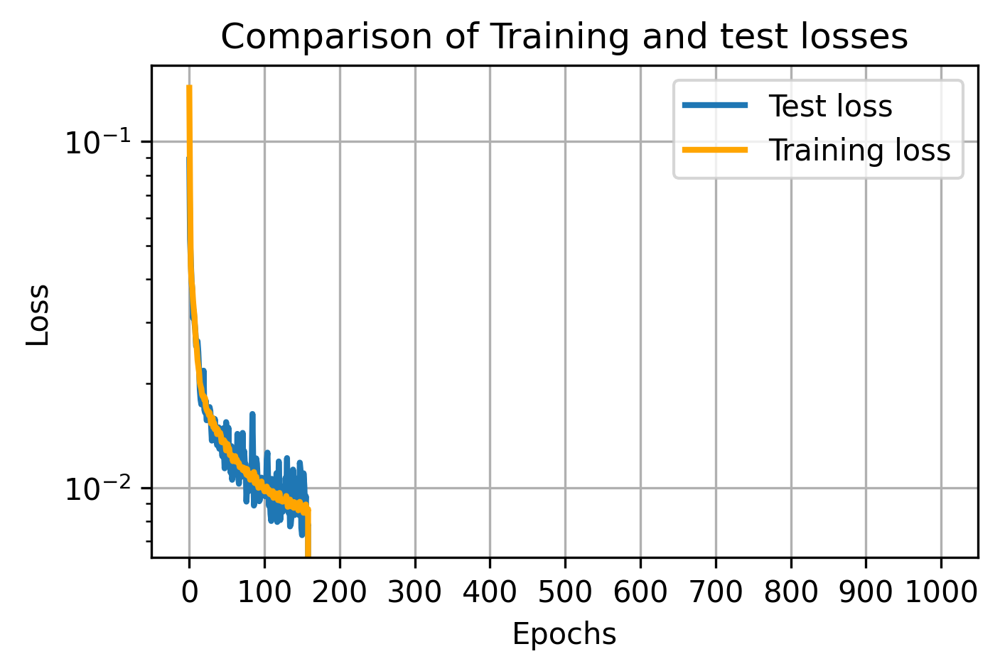

 16%|██████                                | 160/1000 [32:09<2:49:20, 12.10s/it]

Epoch:160 
 Training time for  epoch 160: 0.201 minutes,Training loss:  0.00864753108385098, Testing loss: 0.008425615215674042


 16%|██████                                | 161/1000 [32:21<2:48:45, 12.07s/it]

Epoch:161 
 Training time for  epoch 161: 0.2 minutes,Training loss:  0.008328526227277434, Testing loss: 0.009184606485068797


 16%|██████▏                               | 162/1000 [32:33<2:48:47, 12.09s/it]

Epoch:162 
 Training time for  epoch 162: 0.202 minutes,Training loss:  0.008394943108364646, Testing loss: 0.010965143144130707


 16%|██████▏                               | 163/1000 [32:45<2:48:32, 12.08s/it]

Epoch:163 
 Training time for  epoch 163: 0.201 minutes,Training loss:  0.008429393306932695, Testing loss: 0.007796403337270021


 16%|██████▏                               | 164/1000 [32:57<2:48:27, 12.09s/it]

Epoch:164 
 Training time for  epoch 164: 0.202 minutes,Training loss:  0.008380043795754166, Testing loss: 0.0087748914770782


 16%|██████▎                               | 165/1000 [33:09<2:48:33, 12.11s/it]

Epoch:165 
 Training time for  epoch 165: 0.203 minutes,Training loss:  0.00873735568482909, Testing loss: 0.009881776478141546


 17%|██████▎                               | 166/1000 [33:21<2:48:07, 12.10s/it]

Epoch:166 
 Training time for  epoch 166: 0.201 minutes,Training loss:  0.008572646044086531, Testing loss: 0.007365254499018192


 17%|██████▎                               | 167/1000 [33:33<2:48:14, 12.12s/it]

Epoch:167 
 Training time for  epoch 167: 0.203 minutes,Training loss:  0.008383902842795495, Testing loss: 0.009658245891332627


 17%|██████▍                               | 168/1000 [33:45<2:47:32, 12.08s/it]

Epoch:168 
 Training time for  epoch 168: 0.2 minutes,Training loss:  0.008336492647004772, Testing loss: 0.007989959912374616
Epoch:169 
 Training time for  epoch 169: 0.201 minutes,Training loss:  0.008541885664974287, Testing loss: 0.007925664596259594


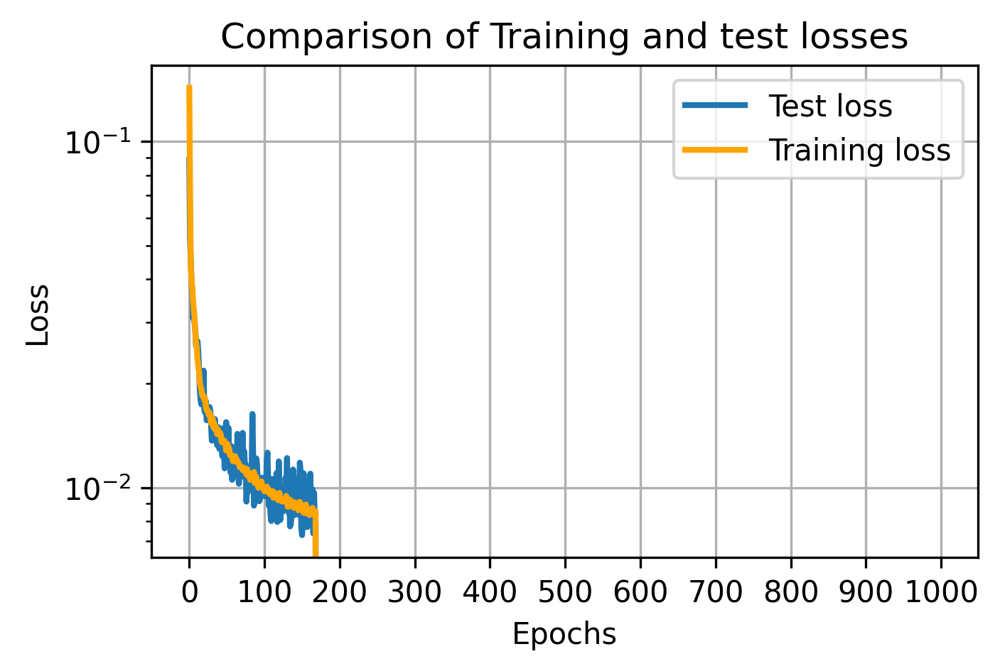

 17%|██████▍                               | 170/1000 [34:10<2:47:38, 12.12s/it]

Epoch:170 
 Training time for  epoch 170: 0.201 minutes,Training loss:  0.008322904147121203, Testing loss: 0.009959228346124291


 17%|██████▍                               | 171/1000 [34:22<2:47:53, 12.15s/it]

Epoch:171 
 Training time for  epoch 171: 0.204 minutes,Training loss:  0.008504952741602952, Testing loss: 0.008342166328802705


 17%|██████▌                               | 172/1000 [34:34<2:47:35, 12.14s/it]

Epoch:172 
 Training time for  epoch 172: 0.202 minutes,Training loss:  0.008269365326881098, Testing loss: 0.00818847774527967


 17%|██████▌                               | 173/1000 [34:46<2:47:09, 12.13s/it]

Epoch:173 
 Training time for  epoch 173: 0.201 minutes,Training loss:  0.007870885191439855, Testing loss: 0.009469539243727922


 17%|██████▌                               | 174/1000 [34:58<2:46:46, 12.11s/it]

Epoch:174 
 Training time for  epoch 174: 0.201 minutes,Training loss:  0.008361724665568024, Testing loss: 0.007895668586716056


 18%|██████▋                               | 175/1000 [35:10<2:46:47, 12.13s/it]

Epoch:175 
 Training time for  epoch 175: 0.203 minutes,Training loss:  0.008665350947256496, Testing loss: 0.008883152138441801


 18%|██████▋                               | 176/1000 [35:22<2:46:14, 12.11s/it]

Epoch:176 
 Training time for  epoch 176: 0.201 minutes,Training loss:  0.008379122519240424, Testing loss: 0.008224406177178026


 18%|██████▋                               | 177/1000 [35:35<2:46:05, 12.11s/it]

Epoch:177 
 Training time for  epoch 177: 0.202 minutes,Training loss:  0.008062470155907633, Testing loss: 0.00762404297478497


 18%|██████▊                               | 178/1000 [35:47<2:46:25, 12.15s/it]

Epoch:178 
 Training time for  epoch 178: 0.204 minutes,Training loss:  0.008036082343314098, Testing loss: 0.00880509516224265
Epoch:179 
 Training time for  epoch 179: 0.203 minutes,Training loss:  0.008242891796915407, Testing loss: 0.008073360407724977


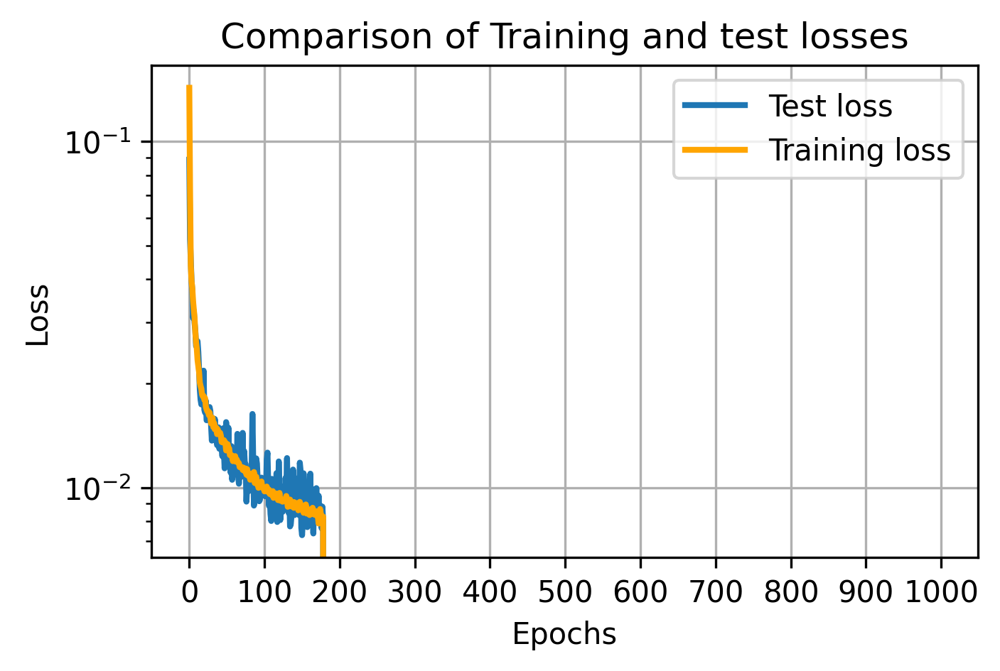

 18%|██████▊                               | 180/1000 [36:11<2:46:42, 12.20s/it]

Epoch:180 
 Training time for  epoch 180: 0.202 minutes,Training loss:  0.008382102264184397, Testing loss: 0.008204391254112124


 18%|██████▉                               | 181/1000 [36:23<2:46:08, 12.17s/it]

Epoch:181 
 Training time for  epoch 181: 0.202 minutes,Training loss:  0.008381646250901391, Testing loss: 0.007617594478651881


 18%|██████▉                               | 182/1000 [36:36<2:45:17, 12.12s/it]

Epoch:182 
 Training time for  epoch 182: 0.2 minutes,Training loss:  0.008185349908872626, Testing loss: 0.007192928437143564


 18%|██████▉                               | 183/1000 [36:48<2:45:40, 12.17s/it]

Epoch:183 
 Training time for  epoch 183: 0.204 minutes,Training loss:  0.008192056516330348, Testing loss: 0.007828031042590737
Epoch 00184: reducing learning rate of group 0 to 8.0000e-04.


 18%|██████▉                               | 184/1000 [37:00<2:46:02, 12.21s/it]

Epoch:184 
 Training time for  epoch 184: 0.205 minutes,Training loss:  0.008411870088155677, Testing loss: 0.007861923668533563


 18%|███████                               | 185/1000 [37:12<2:45:28, 12.18s/it]

Epoch:185 
 Training time for  epoch 185: 0.202 minutes,Training loss:  0.007693661121017668, Testing loss: 0.009403921226039528


 19%|███████                               | 186/1000 [37:25<2:45:58, 12.23s/it]

Epoch:186 
 Training time for  epoch 186: 0.206 minutes,Training loss:  0.0074156439121115985, Testing loss: 0.006807452188804746


 19%|███████                               | 187/1000 [37:37<2:46:13, 12.27s/it]

Epoch:187 
 Training time for  epoch 187: 0.206 minutes,Training loss:  0.007521636484452587, Testing loss: 0.007159733651205897


 19%|███████▏                              | 188/1000 [37:49<2:45:51, 12.26s/it]

Epoch:188 
 Training time for  epoch 188: 0.204 minutes,Training loss:  0.007505882285323327, Testing loss: 0.007857320634648203
Epoch:189 
 Training time for  epoch 189: 0.199 minutes,Training loss:  0.007364373146821328, Testing loss: 0.009148646155372262


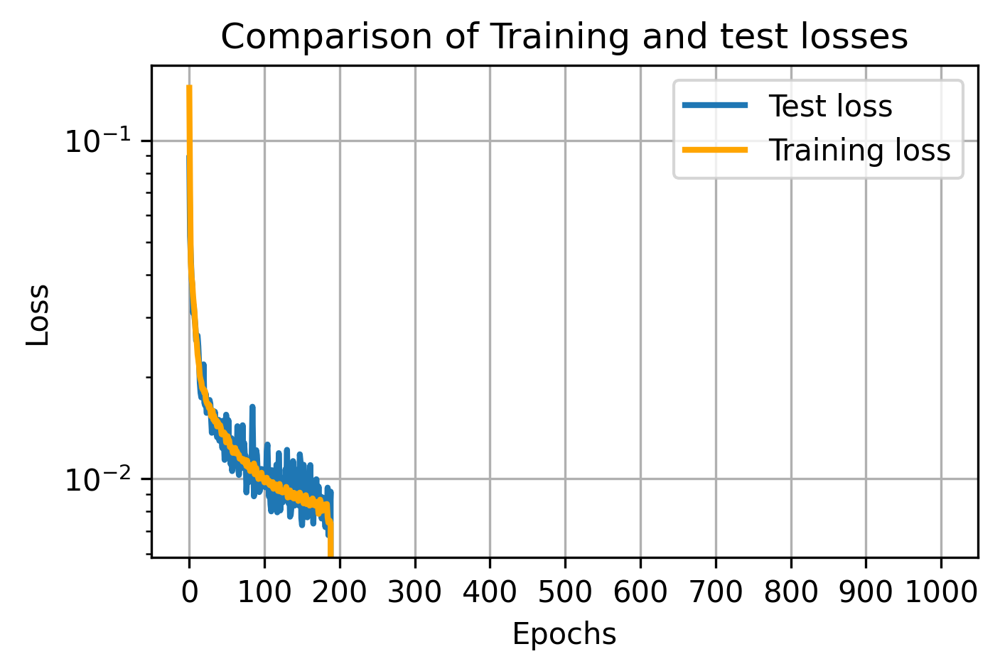

 19%|███████▏                              | 190/1000 [38:13<2:44:26, 12.18s/it]

Epoch:190 
 Training time for  epoch 190: 0.201 minutes,Training loss:  0.007756604952575438, Testing loss: 0.008460658257827164


 19%|███████▎                              | 191/1000 [38:26<2:44:19, 12.19s/it]

Epoch:191 
 Training time for  epoch 191: 0.203 minutes,Training loss:  0.007604090542868904, Testing loss: 0.007236055312678218


 19%|███████▎                              | 192/1000 [38:38<2:43:32, 12.14s/it]

Epoch:192 
 Training time for  epoch 192: 0.201 minutes,Training loss:  0.007257328751636507, Testing loss: 0.00791021851822734


 19%|███████▎                              | 193/1000 [38:50<2:43:32, 12.16s/it]

Epoch:193 
 Training time for  epoch 193: 0.203 minutes,Training loss:  0.007371476898997434, Testing loss: 0.006523623382672667


 19%|███████▎                              | 194/1000 [39:02<2:43:24, 12.16s/it]

Epoch:194 
 Training time for  epoch 194: 0.203 minutes,Training loss:  0.007284530870612109, Testing loss: 0.00689208997413516


 20%|███████▍                              | 195/1000 [39:14<2:43:00, 12.15s/it]

Epoch:195 
 Training time for  epoch 195: 0.202 minutes,Training loss:  0.0073529927759852075, Testing loss: 0.007630302291363478


 20%|███████▍                              | 196/1000 [39:26<2:42:55, 12.16s/it]

Epoch:196 
 Training time for  epoch 196: 0.203 minutes,Training loss:  0.007362508219877706, Testing loss: 0.009266762482002377


 20%|███████▍                              | 197/1000 [39:39<2:44:22, 12.28s/it]

Epoch:197 
 Training time for  epoch 197: 0.21 minutes,Training loss:  0.00753035563077782, Testing loss: 0.007352810138836503


 20%|███████▌                              | 198/1000 [39:51<2:44:33, 12.31s/it]

Epoch:198 
 Training time for  epoch 198: 0.206 minutes,Training loss:  0.007312055517628391, Testing loss: 0.008041913853958249
Epoch:199 
 Training time for  epoch 199: 0.202 minutes,Training loss:  0.007309968557325597, Testing loss: 0.007816311027854682


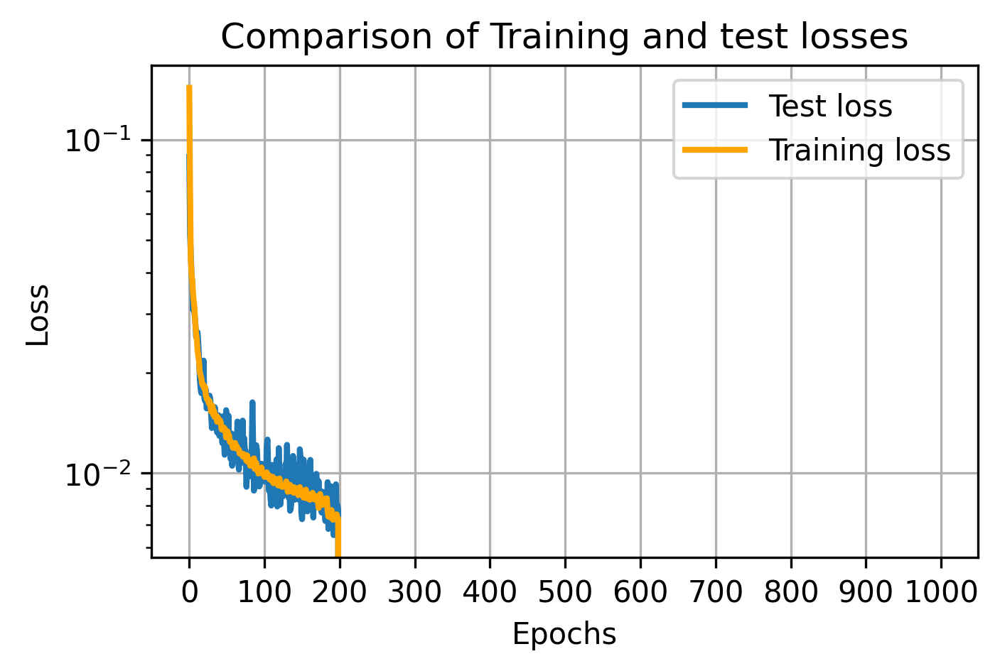

 20%|███████▌                              | 200/1000 [40:16<2:43:37, 12.27s/it]

Epoch:200 
 Training time for  epoch 200: 0.202 minutes,Training loss:  0.0072712990213034115, Testing loss: 0.006848050551488996


 20%|███████▋                              | 201/1000 [40:28<2:42:39, 12.21s/it]

Epoch:201 
 Training time for  epoch 201: 0.201 minutes,Training loss:  0.007380243688259321, Testing loss: 0.007185168154537677


 20%|███████▋                              | 202/1000 [40:40<2:43:49, 12.32s/it]

Epoch:202 
 Training time for  epoch 202: 0.209 minutes,Training loss:  0.007459240651859293, Testing loss: 0.007686972059309483
Epoch 00203: reducing learning rate of group 0 to 6.4000e-04.


 20%|███████▋                              | 203/1000 [40:53<2:43:48, 12.33s/it]

Epoch:203 
 Training time for  epoch 203: 0.206 minutes,Training loss:  0.007447029094013811, Testing loss: 0.007914634803310037


 20%|███████▊                              | 204/1000 [41:05<2:43:16, 12.31s/it]

Epoch:204 
 Training time for  epoch 204: 0.204 minutes,Training loss:  0.0067218849046045475, Testing loss: 0.006630704887211323


 20%|███████▊                              | 205/1000 [41:17<2:42:44, 12.28s/it]

Epoch:205 
 Training time for  epoch 205: 0.204 minutes,Training loss:  0.007041522803360491, Testing loss: 0.007282823603600263


 21%|███████▊                              | 206/1000 [41:29<2:41:56, 12.24s/it]

Epoch:206 
 Training time for  epoch 206: 0.202 minutes,Training loss:  0.006925379076721655, Testing loss: 0.008180133141577244


 21%|███████▊                              | 207/1000 [41:42<2:42:17, 12.28s/it]

Epoch:207 
 Training time for  epoch 207: 0.206 minutes,Training loss:  0.006691700001447337, Testing loss: 0.007092584809288383


 21%|███████▉                              | 208/1000 [41:54<2:42:05, 12.28s/it]

Epoch:208 
 Training time for  epoch 208: 0.205 minutes,Training loss:  0.006772690868539504, Testing loss: 0.006766830962151289
Epoch:209 
 Training time for  epoch 209: 0.202 minutes,Training loss:  0.0069833407194746285, Testing loss: 0.007651797160506248


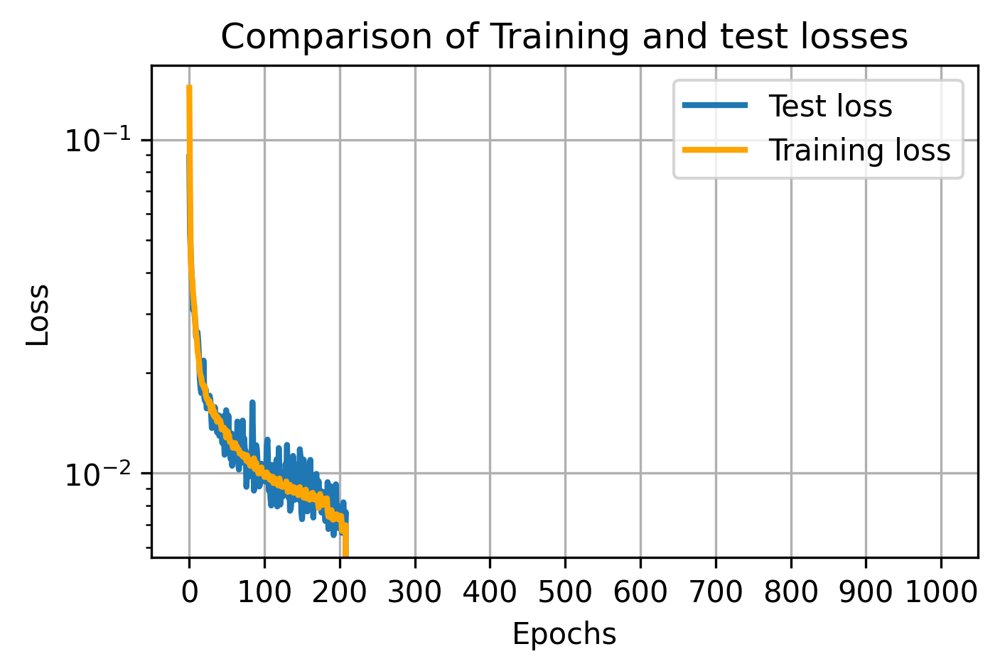

 21%|███████▉                              | 210/1000 [42:18<2:41:03, 12.23s/it]

Epoch:210 
 Training time for  epoch 210: 0.201 minutes,Training loss:  0.006808974027566603, Testing loss: 0.007279712874442339


 21%|████████                              | 211/1000 [42:31<2:40:17, 12.19s/it]

Epoch:211 
 Training time for  epoch 211: 0.201 minutes,Training loss:  0.006759388724117, Testing loss: 0.005931134978309274


 21%|████████                              | 212/1000 [42:43<2:40:16, 12.20s/it]

Epoch:212 
 Training time for  epoch 212: 0.204 minutes,Training loss:  0.006897319967638913, Testing loss: 0.007524363324046135


 21%|████████                              | 213/1000 [42:55<2:39:51, 12.19s/it]

Epoch:213 
 Training time for  epoch 213: 0.202 minutes,Training loss:  0.006917933214663525, Testing loss: 0.007047672616317868


 21%|████████▏                             | 214/1000 [43:07<2:39:13, 12.15s/it]

Epoch:214 
 Training time for  epoch 214: 0.201 minutes,Training loss:  0.006786221006623405, Testing loss: 0.008614490553736687


 22%|████████▏                             | 215/1000 [43:19<2:38:26, 12.11s/it]

Epoch:215 
 Training time for  epoch 215: 0.2 minutes,Training loss:  0.006645431696641736, Testing loss: 0.006784022962674499


 22%|████████▏                             | 216/1000 [43:31<2:37:54, 12.08s/it]

Epoch:216 
 Training time for  epoch 216: 0.2 minutes,Training loss:  0.006637723760032522, Testing loss: 0.006021967474371195


 22%|████████▏                             | 217/1000 [43:43<2:38:01, 12.11s/it]

Epoch:217 
 Training time for  epoch 217: 0.203 minutes,Training loss:  0.006735633991109197, Testing loss: 0.006051957188174128


 22%|████████▎                             | 218/1000 [43:55<2:37:43, 12.10s/it]

Epoch:218 
 Training time for  epoch 218: 0.201 minutes,Training loss:  0.006783341228503314, Testing loss: 0.006604793118312955
Epoch:219 
 Training time for  epoch 219: 0.201 minutes,Training loss:  0.006820545185943601, Testing loss: 0.006380282128229737


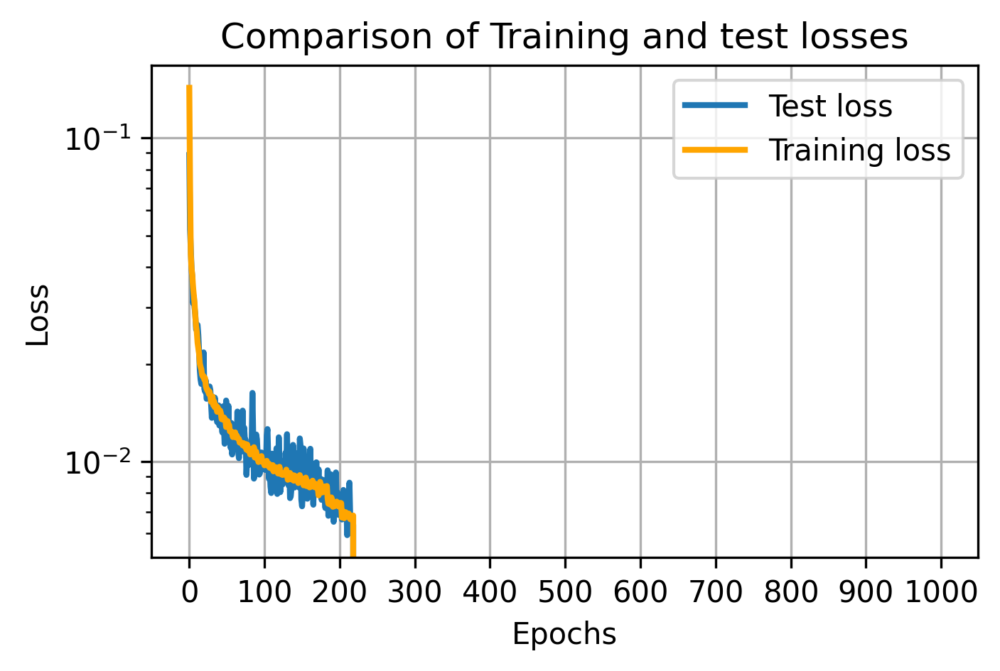

 22%|████████▎                             | 220/1000 [44:20<2:37:46, 12.14s/it]

Epoch:220 
 Training time for  epoch 220: 0.2 minutes,Training loss:  0.006538238461020118, Testing loss: 0.007445794576779008


 22%|████████▍                             | 221/1000 [44:32<2:37:16, 12.11s/it]

Epoch:221 
 Training time for  epoch 221: 0.201 minutes,Training loss:  0.0066961210992286775, Testing loss: 0.0066954306978732345


 22%|████████▍                             | 222/1000 [44:44<2:36:31, 12.07s/it]

Epoch:222 
 Training time for  epoch 222: 0.2 minutes,Training loss:  0.006656959282967687, Testing loss: 0.00643044245429337


 22%|████████▍                             | 223/1000 [44:56<2:36:10, 12.06s/it]

Epoch:223 
 Training time for  epoch 223: 0.201 minutes,Training loss:  0.0068059901649545574, Testing loss: 0.006340578524395823


 22%|████████▌                             | 224/1000 [45:08<2:35:51, 12.05s/it]

Epoch:224 
 Training time for  epoch 224: 0.2 minutes,Training loss:  0.006573204218835054, Testing loss: 0.005892951739951968


 22%|████████▌                             | 225/1000 [45:20<2:35:19, 12.02s/it]

Epoch:225 
 Training time for  epoch 225: 0.199 minutes,Training loss:  0.006803356932582167, Testing loss: 0.007412098320201039


 23%|████████▌                             | 226/1000 [45:32<2:35:07, 12.03s/it]

Epoch:226 
 Training time for  epoch 226: 0.2 minutes,Training loss:  0.006796972843159626, Testing loss: 0.006717441789805889


 23%|████████▋                             | 227/1000 [45:44<2:35:07, 12.04s/it]

Epoch:227 
 Training time for  epoch 227: 0.201 minutes,Training loss:  0.006773772583755207, Testing loss: 0.0064189044199883935


 23%|████████▋                             | 228/1000 [45:56<2:34:59, 12.05s/it]

Epoch:228 
 Training time for  epoch 228: 0.201 minutes,Training loss:  0.006547922728221937, Testing loss: 0.007154988721013069
Epoch:229 
 Training time for  epoch 229: 0.201 minutes,Training loss:  0.006647612703488177, Testing loss: 0.005985738402232528


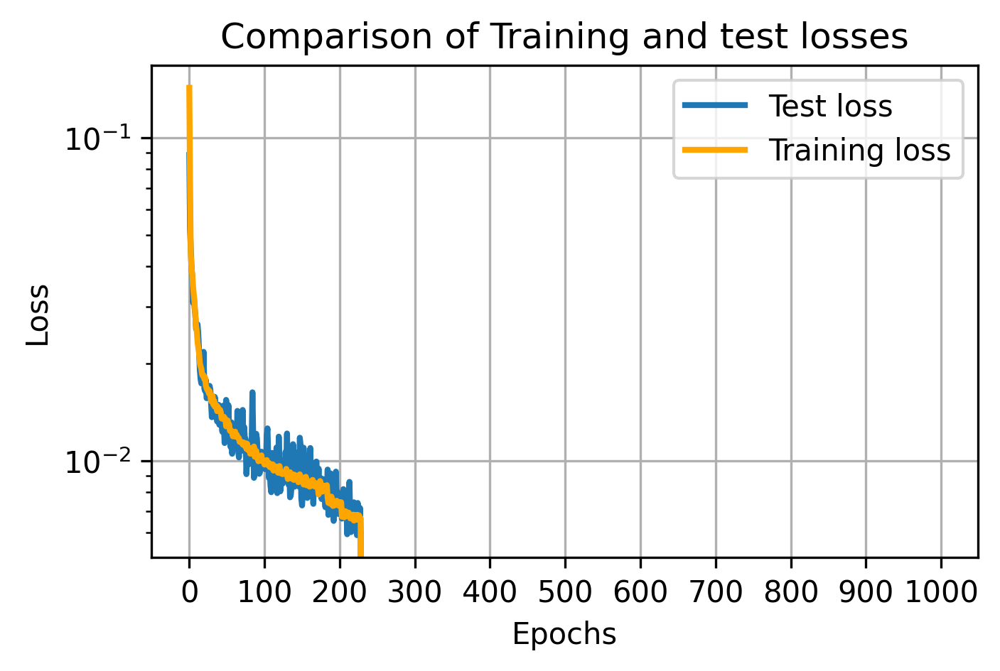

 23%|████████▋                             | 230/1000 [46:20<2:35:20, 12.10s/it]

Epoch:230 
 Training time for  epoch 230: 0.201 minutes,Training loss:  0.006647138082412581, Testing loss: 0.0057752776611596345
Epoch 00231: reducing learning rate of group 0 to 5.1200e-04.


 23%|████████▊                             | 231/1000 [46:32<2:34:57, 12.09s/it]

Epoch:231 
 Training time for  epoch 231: 0.201 minutes,Training loss:  0.006578996897600461, Testing loss: 0.0067627303209155795


 23%|████████▊                             | 232/1000 [46:44<2:34:25, 12.06s/it]

Epoch:232 
 Training time for  epoch 232: 0.2 minutes,Training loss:  0.006348637181456427, Testing loss: 0.007465618886053562


 23%|████████▊                             | 233/1000 [46:56<2:34:25, 12.08s/it]

Epoch:233 
 Training time for  epoch 233: 0.202 minutes,Training loss:  0.006390391605063563, Testing loss: 0.0061456996854394675


 23%|████████▉                             | 234/1000 [47:08<2:34:09, 12.08s/it]

Epoch:234 
 Training time for  epoch 234: 0.201 minutes,Training loss:  0.0062324600113051725, Testing loss: 0.00652199100703001


 24%|████████▉                             | 235/1000 [47:21<2:34:06, 12.09s/it]

Epoch:235 
 Training time for  epoch 235: 0.202 minutes,Training loss:  0.006357820867101092, Testing loss: 0.006371801774948835


 24%|████████▉                             | 236/1000 [47:33<2:33:42, 12.07s/it]

Epoch:236 
 Training time for  epoch 236: 0.201 minutes,Training loss:  0.006347584062494969, Testing loss: 0.006415322506800294


 24%|█████████                             | 237/1000 [47:45<2:34:02, 12.11s/it]

Epoch:237 
 Training time for  epoch 237: 0.204 minutes,Training loss:  0.0062799908793515135, Testing loss: 0.006603277018293738


 24%|█████████                             | 238/1000 [47:57<2:33:33, 12.09s/it]

Epoch:238 
 Training time for  epoch 238: 0.201 minutes,Training loss:  0.006279644449528103, Testing loss: 0.0072476827073842285
Epoch:239 
 Training time for  epoch 239: 0.201 minutes,Training loss:  0.006416635658120375, Testing loss: 0.0064359549060463905


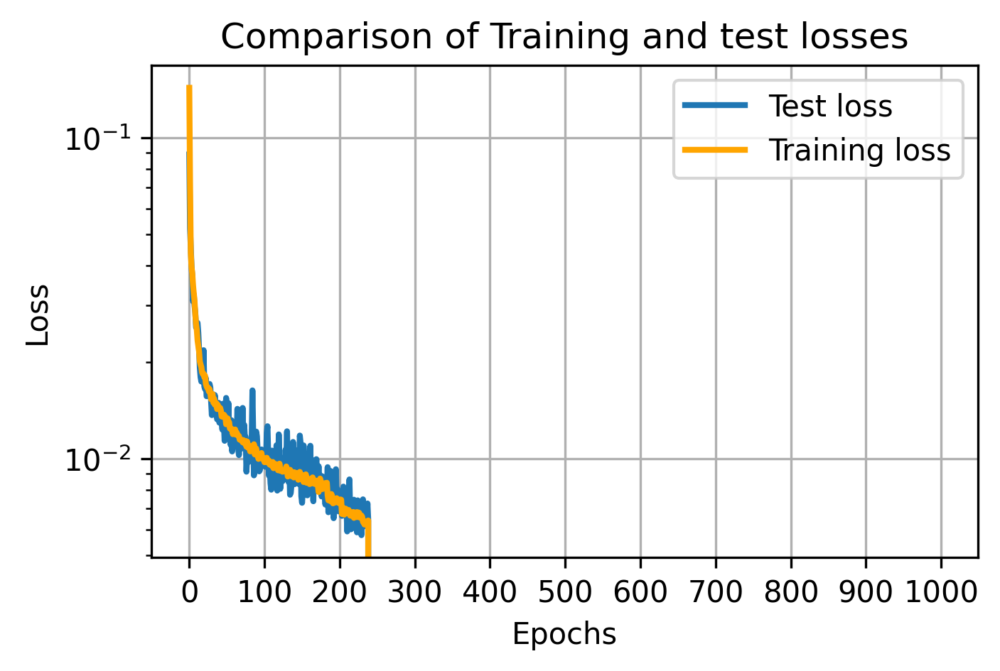

 24%|█████████                             | 240/1000 [48:21<2:33:50, 12.15s/it]

Epoch:240 
 Training time for  epoch 240: 0.202 minutes,Training loss:  0.006234660134602091, Testing loss: 0.0065491792745888235


 24%|█████████▏                            | 241/1000 [48:33<2:33:21, 12.12s/it]

Epoch:241 
 Training time for  epoch 241: 0.201 minutes,Training loss:  0.006253517121152301, Testing loss: 0.006894946452230215


 24%|█████████▏                            | 242/1000 [48:45<2:32:48, 12.10s/it]

Epoch:242 
 Training time for  epoch 242: 0.2 minutes,Training loss:  0.0062264082588268386, Testing loss: 0.0063436449598520996


 24%|█████████▏                            | 243/1000 [48:57<2:32:32, 12.09s/it]

Epoch:243 
 Training time for  epoch 243: 0.201 minutes,Training loss:  0.006253937327461999, Testing loss: 0.0062610562052577735


 24%|█████████▎                            | 244/1000 [49:09<2:31:58, 12.06s/it]

Epoch:244 
 Training time for  epoch 244: 0.2 minutes,Training loss:  0.0062936272371547355, Testing loss: 0.005951104490086436


 24%|█████████▎                            | 245/1000 [49:21<2:31:32, 12.04s/it]

Epoch:245 
 Training time for  epoch 245: 0.2 minutes,Training loss:  0.006201008027019228, Testing loss: 0.005688462373800576


 25%|█████████▎                            | 246/1000 [49:34<2:31:35, 12.06s/it]

Epoch:246 
 Training time for  epoch 246: 0.202 minutes,Training loss:  0.006341182519427558, Testing loss: 0.006236772378906607


 25%|█████████▍                            | 247/1000 [49:46<2:31:40, 12.09s/it]

Epoch:247 
 Training time for  epoch 247: 0.202 minutes,Training loss:  0.006262633813497514, Testing loss: 0.005832657618448138


 25%|█████████▍                            | 248/1000 [49:58<2:31:24, 12.08s/it]

Epoch:248 
 Training time for  epoch 248: 0.201 minutes,Training loss:  0.00626007029429753, Testing loss: 0.006101045105606317
Epoch:249 
 Training time for  epoch 249: 0.204 minutes,Training loss:  0.006247733832682016, Testing loss: 0.0064225573837757115


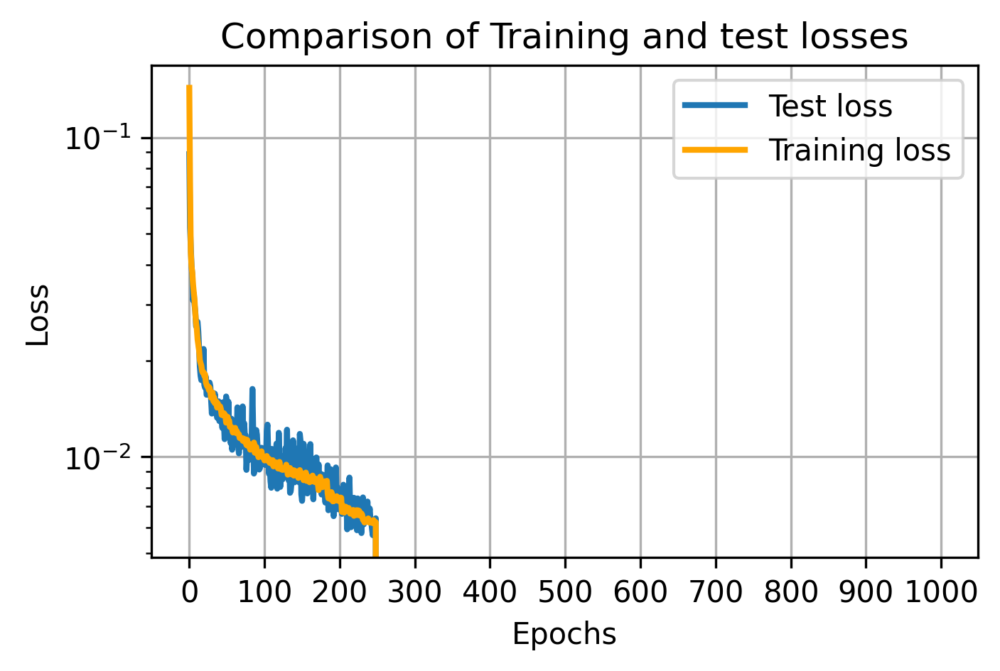

 25%|█████████▌                            | 250/1000 [50:22<2:32:25, 12.19s/it]

Epoch:250 
 Training time for  epoch 250: 0.203 minutes,Training loss:  0.006269274069089334, Testing loss: 0.005874844426289201


 25%|█████████▌                            | 251/1000 [50:35<2:31:55, 12.17s/it]

Epoch:251 
 Training time for  epoch 251: 0.202 minutes,Training loss:  0.006161087896765732, Testing loss: 0.005722536542452872


 25%|█████████▌                            | 252/1000 [50:47<2:31:20, 12.14s/it]

Epoch:252 
 Training time for  epoch 252: 0.201 minutes,Training loss:  0.0062084474798798145, Testing loss: 0.006928058862686157


 25%|█████████▌                            | 253/1000 [50:59<2:31:00, 12.13s/it]

Epoch:253 
 Training time for  epoch 253: 0.202 minutes,Training loss:  0.006290646729359141, Testing loss: 0.0056204637978225945


 25%|█████████▋                            | 254/1000 [51:11<2:30:35, 12.11s/it]

Epoch:254 
 Training time for  epoch 254: 0.201 minutes,Training loss:  0.006075262952797141, Testing loss: 0.006104821115732193


 26%|█████████▋                            | 255/1000 [51:23<2:30:01, 12.08s/it]

Epoch:255 
 Training time for  epoch 255: 0.2 minutes,Training loss:  0.0061603788493047535, Testing loss: 0.005736591536551714


 26%|█████████▋                            | 256/1000 [51:35<2:29:53, 12.09s/it]

Epoch:256 
 Training time for  epoch 256: 0.202 minutes,Training loss:  0.0061668720535509956, Testing loss: 0.006061192927882075


 26%|█████████▊                            | 257/1000 [51:47<2:29:43, 12.09s/it]

Epoch:257 
 Training time for  epoch 257: 0.202 minutes,Training loss:  0.0061794366334910035, Testing loss: 0.0055729004647582766


 26%|█████████▊                            | 258/1000 [51:59<2:29:54, 12.12s/it]

Epoch:258 
 Training time for  epoch 258: 0.203 minutes,Training loss:  0.006202172342759236, Testing loss: 0.005840256698429584
Epoch:259 
 Training time for  epoch 259: 0.202 minutes,Training loss:  0.006132131434855907, Testing loss: 0.0061458261590451


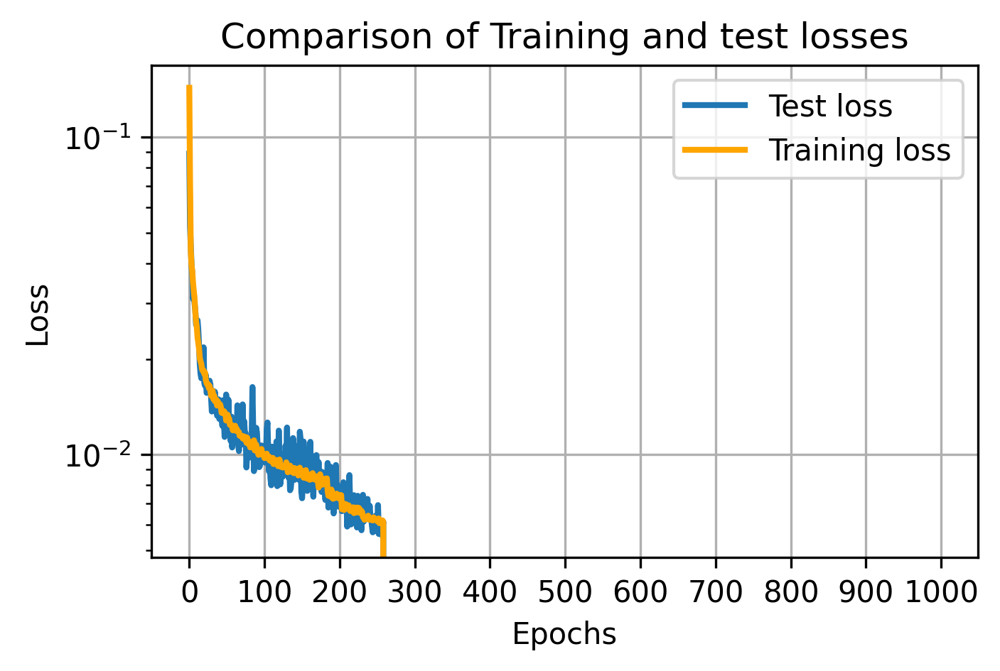

 26%|█████████▉                            | 260/1000 [52:24<2:30:01, 12.16s/it]

Epoch:260 
 Training time for  epoch 260: 0.202 minutes,Training loss:  0.006226905825754474, Testing loss: 0.005778575912117958


 26%|█████████▉                            | 261/1000 [52:36<2:30:03, 12.18s/it]

Epoch:261 
 Training time for  epoch 261: 0.204 minutes,Training loss:  0.0062244946240370665, Testing loss: 0.006150276698172093


 26%|█████████▉                            | 262/1000 [52:48<2:29:54, 12.19s/it]

Epoch:262 
 Training time for  epoch 262: 0.203 minutes,Training loss:  0.006052604103601525, Testing loss: 0.005468984539620578


 26%|█████████▉                            | 263/1000 [53:00<2:28:53, 12.12s/it]

Epoch:263 
 Training time for  epoch 263: 0.199 minutes,Training loss:  0.006217725625268154, Testing loss: 0.005899651562795043


 26%|██████████                            | 264/1000 [53:12<2:28:18, 12.09s/it]

Epoch:264 
 Training time for  epoch 264: 0.2 minutes,Training loss:  0.006147301531668307, Testing loss: 0.0064046846050769095


 26%|██████████                            | 265/1000 [53:24<2:28:14, 12.10s/it]

Epoch:265 
 Training time for  epoch 265: 0.202 minutes,Training loss:  0.006142302348389876, Testing loss: 0.006347152097150683


 27%|██████████                            | 266/1000 [53:36<2:27:33, 12.06s/it]

Epoch:266 
 Training time for  epoch 266: 0.2 minutes,Training loss:  0.006098490055600716, Testing loss: 0.006610503792762757


 27%|██████████▏                           | 267/1000 [53:48<2:27:49, 12.10s/it]

Epoch:267 
 Training time for  epoch 267: 0.203 minutes,Training loss:  0.006100361951238515, Testing loss: 0.005799810783937574


 27%|██████████▏                           | 268/1000 [54:01<2:27:48, 12.12s/it]

Epoch:268 
 Training time for  epoch 268: 0.202 minutes,Training loss:  0.006104137773358379, Testing loss: 0.006466972948983312
Epoch:269 
 Training time for  epoch 269: 0.202 minutes,Training loss:  0.006159179988906705, Testing loss: 0.0055590209178626535


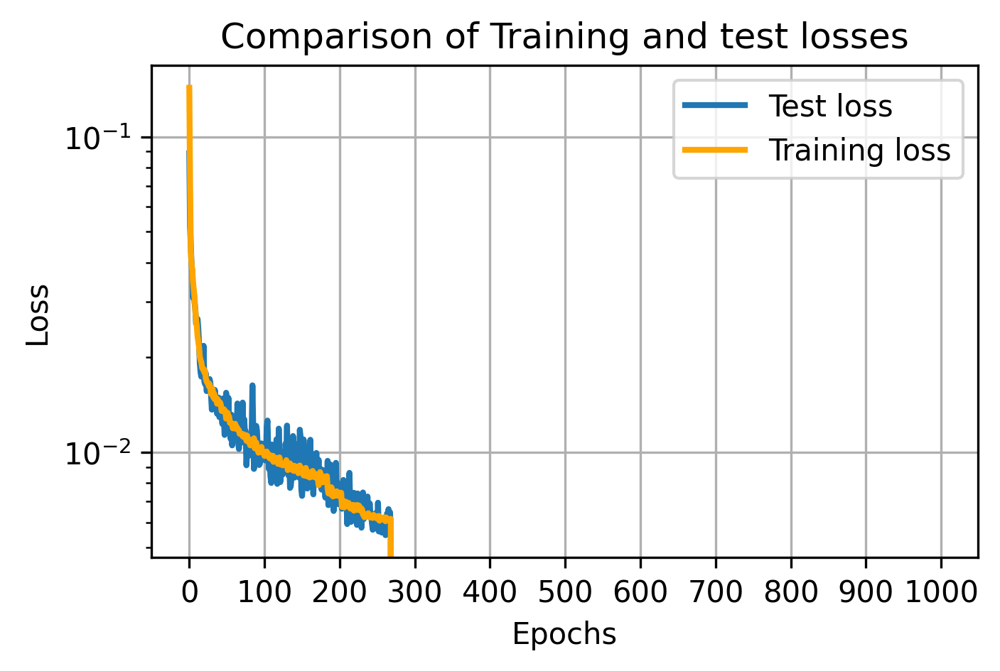

 27%|██████████▎                           | 270/1000 [54:25<2:27:49, 12.15s/it]

Epoch:270 
 Training time for  epoch 270: 0.201 minutes,Training loss:  0.00601886587274779, Testing loss: 0.00588700738735497


 27%|██████████▎                           | 271/1000 [54:37<2:27:15, 12.12s/it]

Epoch:271 
 Training time for  epoch 271: 0.201 minutes,Training loss:  0.006140294415026073, Testing loss: 0.0061214473284780975


 27%|██████████▎                           | 272/1000 [54:49<2:27:12, 12.13s/it]

Epoch:272 
 Training time for  epoch 272: 0.203 minutes,Training loss:  0.00602855112211093, Testing loss: 0.006119509804993868


 27%|██████████▎                           | 273/1000 [55:01<2:26:41, 12.11s/it]

Epoch:273 
 Training time for  epoch 273: 0.201 minutes,Training loss:  0.006043724682448166, Testing loss: 0.0056117196148261425


 27%|██████████▍                           | 274/1000 [55:13<2:26:36, 12.12s/it]

Epoch:274 
 Training time for  epoch 274: 0.202 minutes,Training loss:  0.0060998595862689405, Testing loss: 0.006091897562146187


 28%|██████████▍                           | 275/1000 [55:26<2:27:06, 12.18s/it]

Epoch:275 
 Training time for  epoch 275: 0.205 minutes,Training loss:  0.006125843434991547, Testing loss: 0.007386539978906512


 28%|██████████▍                           | 276/1000 [55:38<2:27:58, 12.26s/it]

Epoch:276 
 Training time for  epoch 276: 0.208 minutes,Training loss:  0.006079067444184343, Testing loss: 0.005743010123260319


 28%|██████████▌                           | 277/1000 [55:50<2:27:32, 12.24s/it]

Epoch:277 
 Training time for  epoch 277: 0.203 minutes,Training loss:  0.00604863597635011, Testing loss: 0.006380361011251807


 28%|██████████▌                           | 278/1000 [56:02<2:27:08, 12.23s/it]

Epoch:278 
 Training time for  epoch 278: 0.203 minutes,Training loss:  0.006014205988076852, Testing loss: 0.006132877990603447
Epoch:279 
 Training time for  epoch 279: 0.2 minutes,Training loss:  0.0061088096140586405, Testing loss: 0.007980817547068


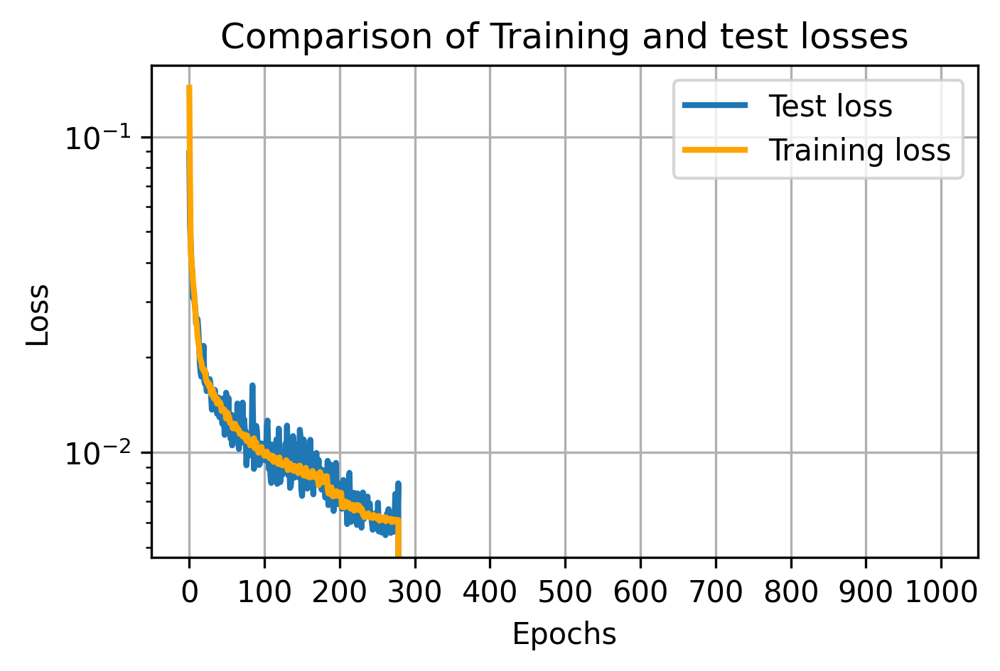

 28%|██████████▋                           | 280/1000 [56:27<2:26:00, 12.17s/it]

Epoch:280 
 Training time for  epoch 280: 0.199 minutes,Training loss:  0.006075971718211242, Testing loss: 0.006090622348710895


 28%|██████████▋                           | 281/1000 [56:39<2:25:06, 12.11s/it]

Epoch:281 
 Training time for  epoch 281: 0.2 minutes,Training loss:  0.006084395484927432, Testing loss: 0.005739821325987577


 28%|██████████▋                           | 282/1000 [56:51<2:24:40, 12.09s/it]

Epoch:282 
 Training time for  epoch 282: 0.201 minutes,Training loss:  0.00614387619430275, Testing loss: 0.005718349921517074


 28%|██████████▊                           | 283/1000 [57:03<2:24:22, 12.08s/it]

Epoch:283 
 Training time for  epoch 283: 0.201 minutes,Training loss:  0.0060567791897124254, Testing loss: 0.005984015790745616


 28%|██████████▊                           | 284/1000 [57:15<2:24:13, 12.09s/it]

Epoch:284 
 Training time for  epoch 284: 0.202 minutes,Training loss:  0.006142039847117821, Testing loss: 0.005665221149101853


 28%|██████████▊                           | 285/1000 [57:27<2:23:59, 12.08s/it]

Epoch:285 
 Training time for  epoch 285: 0.201 minutes,Training loss:  0.006042096349567556, Testing loss: 0.006473894873633981


 29%|██████████▊                           | 286/1000 [57:39<2:23:53, 12.09s/it]

Epoch:286 
 Training time for  epoch 286: 0.202 minutes,Training loss:  0.006073672987486081, Testing loss: 0.006578711243346334


 29%|██████████▉                           | 287/1000 [57:51<2:23:46, 12.10s/it]

Epoch:287 
 Training time for  epoch 287: 0.202 minutes,Training loss:  0.00602898925124223, Testing loss: 0.006158347381278873


 29%|██████████▉                           | 288/1000 [58:04<2:24:07, 12.15s/it]

Epoch:288 
 Training time for  epoch 288: 0.204 minutes,Training loss:  0.0059893634202744074, Testing loss: 0.005726375719532371
Epoch:289 
 Training time for  epoch 289: 0.203 minutes,Training loss:  0.006127973814829145, Testing loss: 0.006242651669308544


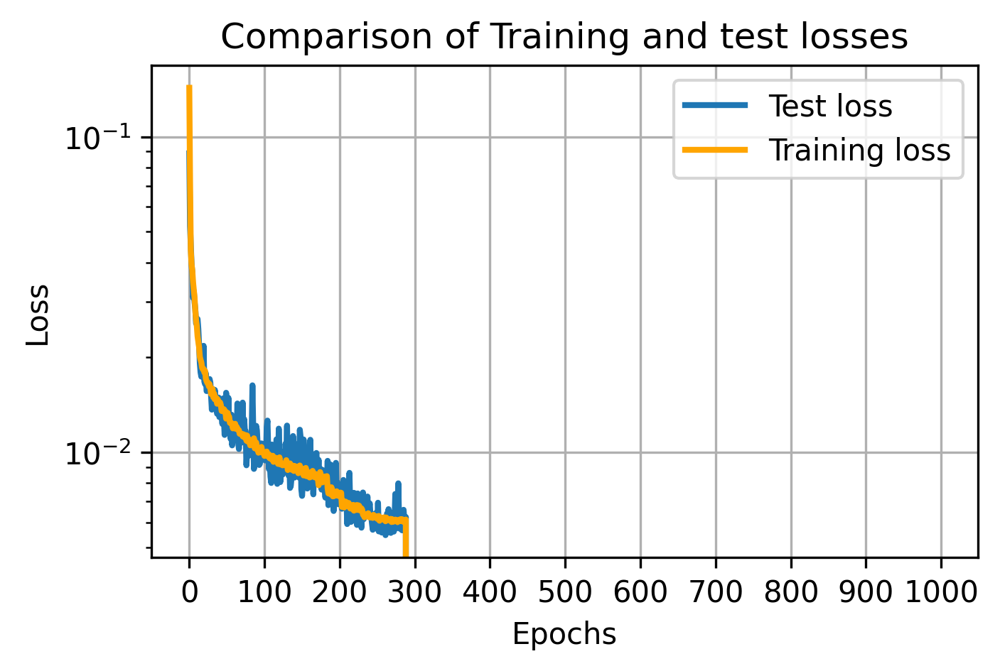

 29%|███████████                           | 290/1000 [58:28<2:24:16, 12.19s/it]

Epoch:290 
 Training time for  epoch 290: 0.202 minutes,Training loss:  0.005947239384645733, Testing loss: 0.005362936239689589


 29%|███████████                           | 291/1000 [58:40<2:23:37, 12.15s/it]

Epoch:291 
 Training time for  epoch 291: 0.201 minutes,Training loss:  0.0060163013551613525, Testing loss: 0.0055848359875381


 29%|███████████                           | 292/1000 [58:52<2:22:45, 12.10s/it]

Epoch:292 
 Training time for  epoch 292: 0.199 minutes,Training loss:  0.006007464939531514, Testing loss: 0.005715922494418919


 29%|███████████▏                          | 293/1000 [59:04<2:22:39, 12.11s/it]

Epoch:293 
 Training time for  epoch 293: 0.202 minutes,Training loss:  0.0061601595190525675, Testing loss: 0.006130374800413847


 29%|███████████▏                          | 294/1000 [59:16<2:22:22, 12.10s/it]

Epoch:294 
 Training time for  epoch 294: 0.201 minutes,Training loss:  0.005865558279888071, Testing loss: 0.006597913783043623


 30%|███████████▏                          | 295/1000 [59:28<2:21:57, 12.08s/it]

Epoch:295 
 Training time for  epoch 295: 0.201 minutes,Training loss:  0.005990757901139307, Testing loss: 0.0076555700786411765


 30%|███████████▏                          | 296/1000 [59:40<2:21:37, 12.07s/it]

Epoch:296 
 Training time for  epoch 296: 0.201 minutes,Training loss:  0.006011245374456394, Testing loss: 0.005618747770786286


 30%|███████████▎                          | 297/1000 [59:53<2:21:47, 12.10s/it]

Epoch:297 
 Training time for  epoch 297: 0.203 minutes,Training loss:  0.0059936697904180635, Testing loss: 0.005317029319703579


 30%|██████████▋                         | 298/1000 [1:00:05<2:22:20, 12.17s/it]

Epoch:298 
 Training time for  epoch 298: 0.205 minutes,Training loss:  0.006008780963500392, Testing loss: 0.0055959048168733715
Epoch:299 
 Training time for  epoch 299: 0.202 minutes,Training loss:  0.0059967747893245, Testing loss: 0.0056050878763198855


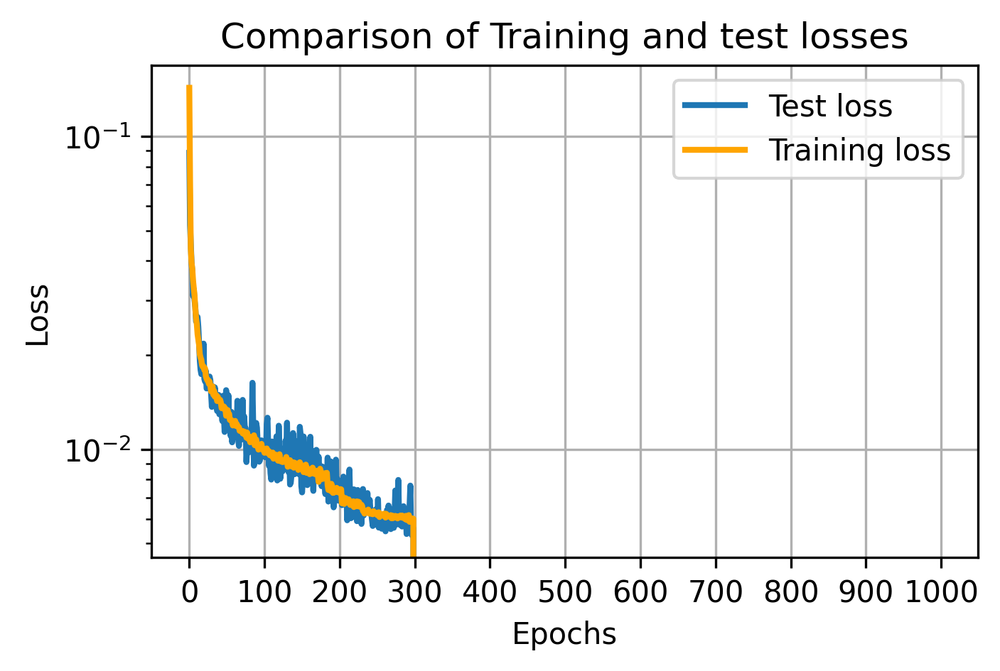

 30%|██████████▊                         | 300/1000 [1:00:29<2:22:31, 12.22s/it]

Epoch:300 
 Training time for  epoch 300: 0.203 minutes,Training loss:  0.006015755963034746, Testing loss: 0.005704331891611219


 30%|██████████▊                         | 301/1000 [1:00:42<2:22:07, 12.20s/it]

Epoch:301 
 Training time for  epoch 301: 0.203 minutes,Training loss:  0.005988973030348879, Testing loss: 0.005478747584857046


 30%|██████████▊                         | 302/1000 [1:00:54<2:21:57, 12.20s/it]

Epoch:302 
 Training time for  epoch 302: 0.203 minutes,Training loss:  0.005976929020246925, Testing loss: 0.005986255342140794


 30%|██████████▉                         | 303/1000 [1:01:06<2:21:24, 12.17s/it]

Epoch:303 
 Training time for  epoch 303: 0.202 minutes,Training loss:  0.006031088853086173, Testing loss: 0.0055555247422307726


 30%|██████████▉                         | 304/1000 [1:01:18<2:20:52, 12.14s/it]

Epoch:304 
 Training time for  epoch 304: 0.201 minutes,Training loss:  0.00608065012495199, Testing loss: 0.005862492099404335
Epoch 00305: reducing learning rate of group 0 to 4.0960e-04.


 30%|██████████▉                         | 305/1000 [1:01:30<2:20:32, 12.13s/it]

Epoch:305 
 Training time for  epoch 305: 0.202 minutes,Training loss:  0.0059708417431125795, Testing loss: 0.006149049689993262


 31%|███████████                         | 306/1000 [1:01:42<2:20:25, 12.14s/it]

Epoch:306 
 Training time for  epoch 306: 0.203 minutes,Training loss:  0.005725326354028041, Testing loss: 0.00527714776340872


 31%|███████████                         | 307/1000 [1:01:54<2:20:02, 12.12s/it]

Epoch:307 
 Training time for  epoch 307: 0.201 minutes,Training loss:  0.005719318612490572, Testing loss: 0.005710272379219532


 31%|███████████                         | 308/1000 [1:02:06<2:19:37, 12.11s/it]

Epoch:308 
 Training time for  epoch 308: 0.201 minutes,Training loss:  0.005698658926974935, Testing loss: 0.0057383188372477885
Epoch:309 
 Training time for  epoch 309: 0.202 minutes,Training loss:  0.005628446073506058, Testing loss: 0.005844457121565938


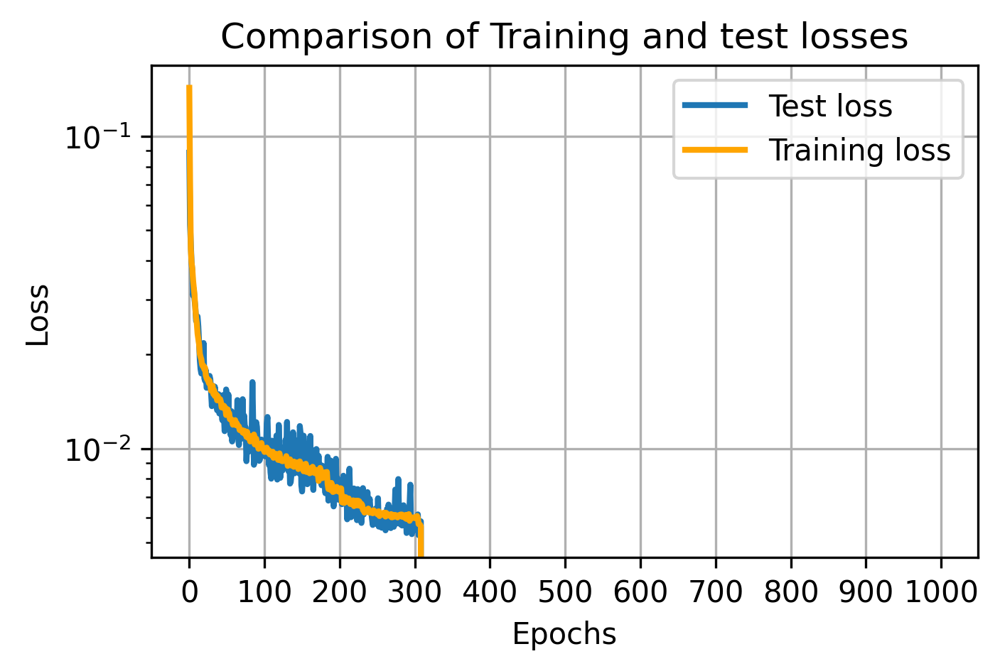

 31%|███████████▏                        | 310/1000 [1:02:31<2:19:54, 12.17s/it]

Epoch:310 
 Training time for  epoch 310: 0.202 minutes,Training loss:  0.005836192938974008, Testing loss: 0.005383390355855226


 31%|███████████▏                        | 311/1000 [1:02:43<2:19:35, 12.16s/it]

Epoch:311 
 Training time for  epoch 311: 0.202 minutes,Training loss:  0.005651002310370024, Testing loss: 0.005677219945937395


 31%|███████████▏                        | 312/1000 [1:02:55<2:18:50, 12.11s/it]

Epoch:312 
 Training time for  epoch 312: 0.2 minutes,Training loss:  0.005643733509120712, Testing loss: 0.0051338002737611535


 31%|███████████▎                        | 313/1000 [1:03:07<2:18:36, 12.11s/it]

Epoch:313 
 Training time for  epoch 313: 0.202 minutes,Training loss:  0.005660635117943313, Testing loss: 0.005579338762909174


 31%|███████████▎                        | 314/1000 [1:03:19<2:18:34, 12.12s/it]

Epoch:314 
 Training time for  epoch 314: 0.203 minutes,Training loss:  0.005588944934570295, Testing loss: 0.005489818751811981


 32%|███████████▎                        | 315/1000 [1:03:31<2:18:13, 12.11s/it]

Epoch:315 
 Training time for  epoch 315: 0.201 minutes,Training loss:  0.005636926928619474, Testing loss: 0.0052418142417445775


 32%|███████████▍                        | 316/1000 [1:03:43<2:17:44, 12.08s/it]

Epoch:316 
 Training time for  epoch 316: 0.2 minutes,Training loss:  0.005612805527910746, Testing loss: 0.005436806101351976


 32%|███████████▍                        | 317/1000 [1:03:55<2:17:43, 12.10s/it]

Epoch:317 
 Training time for  epoch 317: 0.202 minutes,Training loss:  0.005685558316539043, Testing loss: 0.0055468006990849975


 32%|███████████▍                        | 318/1000 [1:04:08<2:17:36, 12.11s/it]

Epoch:318 
 Training time for  epoch 318: 0.202 minutes,Training loss:  0.005609982843055421, Testing loss: 0.005276982109062373
Epoch:319 
 Training time for  epoch 319: 0.205 minutes,Training loss:  0.005708829864576182, Testing loss: 0.005592119041830301


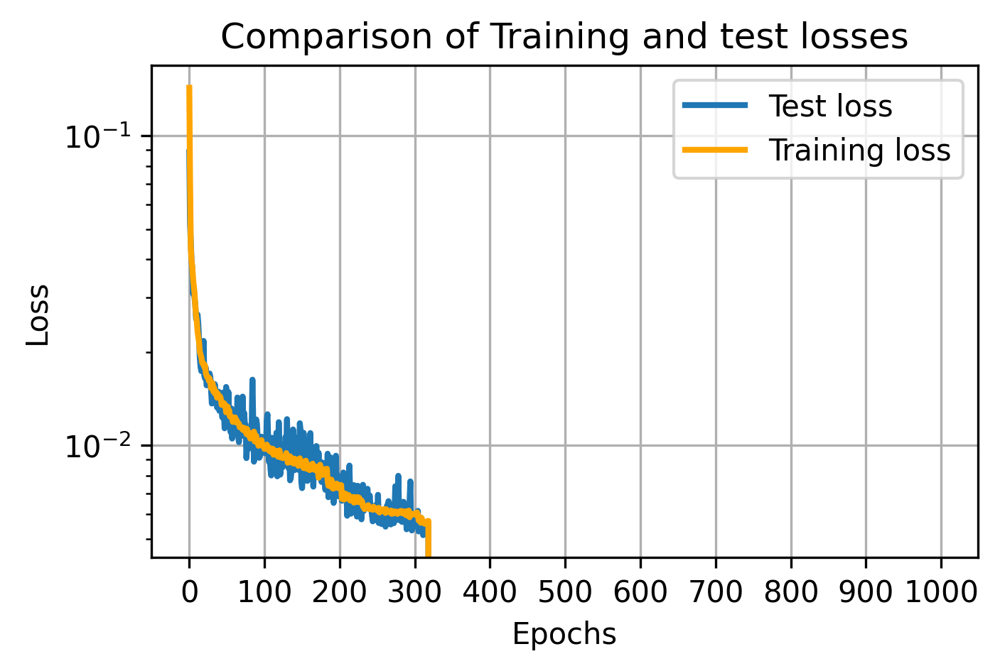

 32%|███████████▌                        | 320/1000 [1:04:32<2:18:10, 12.19s/it]

Epoch:320 
 Training time for  epoch 320: 0.202 minutes,Training loss:  0.005735027688716589, Testing loss: 0.006044999016448855


 32%|███████████▌                        | 321/1000 [1:04:44<2:18:05, 12.20s/it]

Epoch:321 
 Training time for  epoch 321: 0.204 minutes,Training loss:  0.005732008173540408, Testing loss: 0.006379707725718617


 32%|███████████▌                        | 322/1000 [1:04:57<2:17:22, 12.16s/it]

Epoch:322 
 Training time for  epoch 322: 0.201 minutes,Training loss:  0.005603917799760241, Testing loss: 0.005743148215115071


 32%|███████████▋                        | 323/1000 [1:05:09<2:17:01, 12.14s/it]

Epoch:323 
 Training time for  epoch 323: 0.202 minutes,Training loss:  0.005632224892678213, Testing loss: 0.005594118312001228


 32%|███████████▋                        | 324/1000 [1:05:21<2:17:07, 12.17s/it]

Epoch:324 
 Training time for  epoch 324: 0.204 minutes,Training loss:  0.005752516336604936, Testing loss: 0.005393414106220007
Epoch 00325: reducing learning rate of group 0 to 3.2768e-04.


 32%|███████████▋                        | 325/1000 [1:05:33<2:16:38, 12.15s/it]

Epoch:325 
 Training time for  epoch 325: 0.201 minutes,Training loss:  0.005617398808144561, Testing loss: 0.005659279185347259


 33%|███████████▋                        | 326/1000 [1:05:45<2:16:26, 12.15s/it]

Epoch:326 
 Training time for  epoch 326: 0.202 minutes,Training loss:  0.005451212581690578, Testing loss: 0.005384920323267579


 33%|███████████▊                        | 327/1000 [1:05:57<2:15:53, 12.12s/it]

Epoch:327 
 Training time for  epoch 327: 0.201 minutes,Training loss:  0.005449479548033417, Testing loss: 0.005309644038788974


 33%|███████████▊                        | 328/1000 [1:06:09<2:15:40, 12.11s/it]

Epoch:328 
 Training time for  epoch 328: 0.202 minutes,Training loss:  0.005459242124482557, Testing loss: 0.006078623784705996
Epoch:329 
 Training time for  epoch 329: 0.204 minutes,Training loss:  0.005442311859372722, Testing loss: 0.005079961009323597


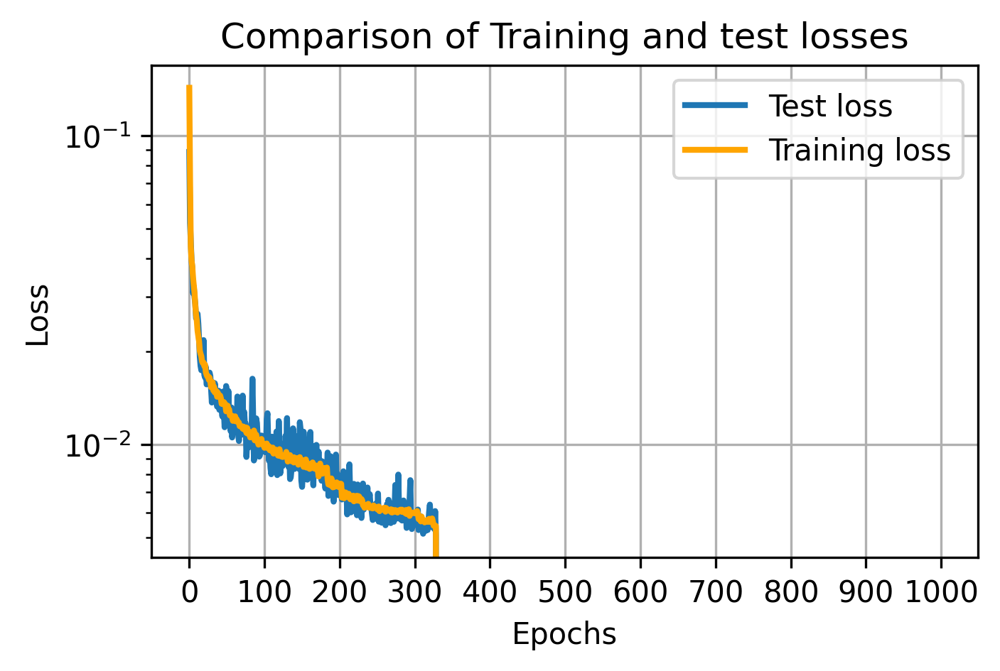

 33%|███████████▉                        | 330/1000 [1:06:34<2:15:50, 12.16s/it]

Epoch:330 
 Training time for  epoch 330: 0.201 minutes,Training loss:  0.005516191422571531, Testing loss: 0.005945757748559117


 33%|███████████▉                        | 331/1000 [1:06:46<2:15:55, 12.19s/it]

Epoch:331 
 Training time for  epoch 331: 0.204 minutes,Training loss:  0.005466571821356311, Testing loss: 0.005239574648439885


 33%|███████████▉                        | 332/1000 [1:06:58<2:15:50, 12.20s/it]

Epoch:332 
 Training time for  epoch 332: 0.204 minutes,Training loss:  0.0054442533078245415, Testing loss: 0.0055573949823156


 33%|███████████▉                        | 333/1000 [1:07:10<2:15:30, 12.19s/it]

Epoch:333 
 Training time for  epoch 333: 0.203 minutes,Training loss:  0.005450645973310999, Testing loss: 0.005230700308457017


 33%|████████████                        | 334/1000 [1:07:23<2:15:14, 12.18s/it]

Epoch:334 
 Training time for  epoch 334: 0.203 minutes,Training loss:  0.005389356494877967, Testing loss: 0.005418655057437718


 34%|████████████                        | 335/1000 [1:07:35<2:14:47, 12.16s/it]

Epoch:335 
 Training time for  epoch 335: 0.202 minutes,Training loss:  0.0054467375202020074, Testing loss: 0.005376121057197452


 34%|████████████                        | 336/1000 [1:07:47<2:14:05, 12.12s/it]

Epoch:336 
 Training time for  epoch 336: 0.2 minutes,Training loss:  0.00543547626265674, Testing loss: 0.005514339637011289


 34%|████████████▏                       | 337/1000 [1:07:59<2:14:19, 12.16s/it]

Epoch:337 
 Training time for  epoch 337: 0.204 minutes,Training loss:  0.005440453643954936, Testing loss: 0.005458537600934506


 34%|████████████▏                       | 338/1000 [1:08:11<2:14:01, 12.15s/it]

Epoch:338 
 Training time for  epoch 338: 0.202 minutes,Training loss:  0.005428683692016114, Testing loss: 0.005348179107531905
Epoch:339 
 Training time for  epoch 339: 0.203 minutes,Training loss:  0.005426438203520649, Testing loss: 0.005548477107658982


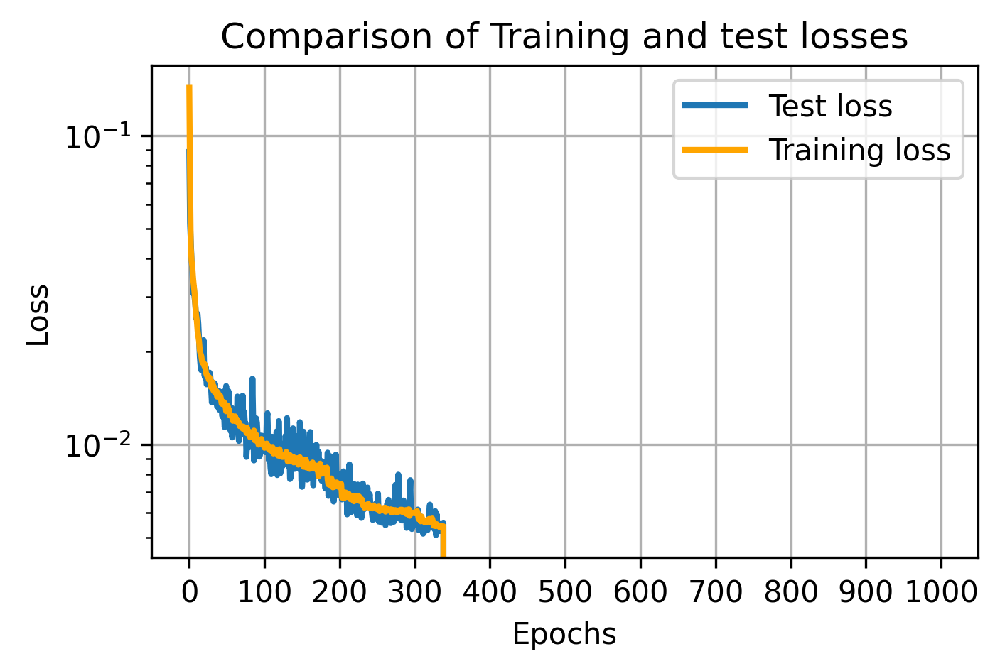

 34%|████████████▏                       | 340/1000 [1:08:36<2:14:26, 12.22s/it]

Epoch:340 
 Training time for  epoch 340: 0.202 minutes,Training loss:  0.0054031455652457285, Testing loss: 0.005177922155708075


 34%|████████████▎                       | 341/1000 [1:08:48<2:13:58, 12.20s/it]

Epoch:341 
 Training time for  epoch 341: 0.202 minutes,Training loss:  0.005427160553426485, Testing loss: 0.0057409659400582316


 34%|████████████▎                       | 342/1000 [1:09:00<2:13:16, 12.15s/it]

Epoch:342 
 Training time for  epoch 342: 0.201 minutes,Training loss:  0.005417687134248281, Testing loss: 0.00514506139792502


 34%|████████████▎                       | 343/1000 [1:09:12<2:12:39, 12.11s/it]

Epoch:343 
 Training time for  epoch 343: 0.2 minutes,Training loss:  0.005351333417599798, Testing loss: 0.00510671045165509


 34%|████████████▍                       | 344/1000 [1:09:24<2:12:15, 12.10s/it]

Epoch:344 
 Training time for  epoch 344: 0.201 minutes,Training loss:  0.00539630718727171, Testing loss: 0.005267102136276663


 34%|████████████▍                       | 345/1000 [1:09:36<2:11:54, 12.08s/it]

Epoch:345 
 Training time for  epoch 345: 0.201 minutes,Training loss:  0.005458096426811056, Testing loss: 0.0051362017635256055


 35%|████████████▍                       | 346/1000 [1:09:48<2:11:35, 12.07s/it]

Epoch:346 
 Training time for  epoch 346: 0.201 minutes,Training loss:  0.005342775877104352, Testing loss: 0.005477197347208858


 35%|████████████▍                       | 347/1000 [1:10:00<2:11:42, 12.10s/it]

Epoch:347 
 Training time for  epoch 347: 0.203 minutes,Training loss:  0.005418881073022968, Testing loss: 0.00761509632691741


 35%|████████████▌                       | 348/1000 [1:10:12<2:11:34, 12.11s/it]

Epoch:348 
 Training time for  epoch 348: 0.202 minutes,Training loss:  0.005440454040388993, Testing loss: 0.005371443526819349
Epoch:349 
 Training time for  epoch 349: 0.202 minutes,Training loss:  0.005354229028744496, Testing loss: 0.005562728624790907


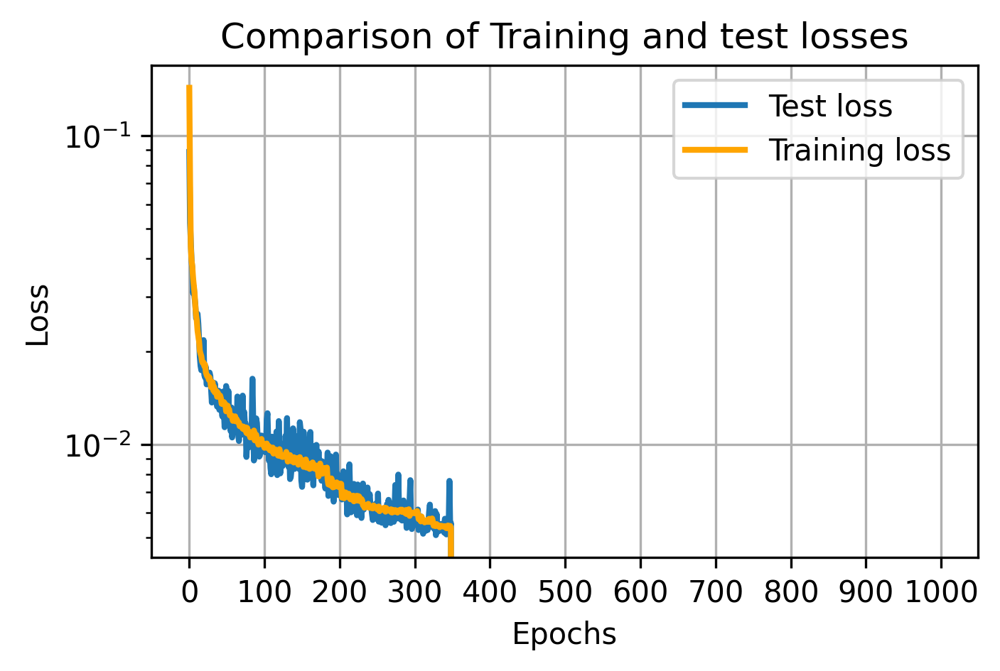

 35%|████████████▌                       | 350/1000 [1:10:37<2:11:25, 12.13s/it]

Epoch:350 
 Training time for  epoch 350: 0.2 minutes,Training loss:  0.005397616904802214, Testing loss: 0.005429989718832076


 35%|████████████▋                       | 351/1000 [1:10:49<2:11:21, 12.14s/it]

Epoch:351 
 Training time for  epoch 351: 0.203 minutes,Training loss:  0.005407140223832928, Testing loss: 0.005273122475482523


 35%|████████████▋                       | 352/1000 [1:11:01<2:11:00, 12.13s/it]

Epoch:352 
 Training time for  epoch 352: 0.202 minutes,Training loss:  0.005397138407542592, Testing loss: 0.0055542664043605324


 35%|████████████▋                       | 353/1000 [1:11:13<2:10:38, 12.12s/it]

Epoch:353 
 Training time for  epoch 353: 0.201 minutes,Training loss:  0.0054053295548122625, Testing loss: 0.00532488577067852


 35%|████████████▋                       | 354/1000 [1:11:25<2:10:27, 12.12s/it]

Epoch:354 
 Training time for  epoch 354: 0.202 minutes,Training loss:  0.0053391639983149525, Testing loss: 0.005436330614611506


 36%|████████████▊                       | 355/1000 [1:11:37<2:10:36, 12.15s/it]

Epoch:355 
 Training time for  epoch 355: 0.204 minutes,Training loss:  0.005426918495550284, Testing loss: 0.005861509880051016


 36%|████████████▊                       | 356/1000 [1:11:49<2:09:52, 12.10s/it]

Epoch:356 
 Training time for  epoch 356: 0.2 minutes,Training loss:  0.005416225417518208, Testing loss: 0.005730235786177218


 36%|████████████▊                       | 357/1000 [1:12:01<2:09:37, 12.10s/it]

Epoch:357 
 Training time for  epoch 357: 0.201 minutes,Training loss:  0.005339263836419454, Testing loss: 0.005787520348094404


 36%|████████████▉                       | 358/1000 [1:12:14<2:09:15, 12.08s/it]

Epoch:358 
 Training time for  epoch 358: 0.201 minutes,Training loss:  0.005391311425603191, Testing loss: 0.0056099570915102955
Epoch:359 
 Training time for  epoch 359: 0.202 minutes,Training loss:  0.0054003633466807735, Testing loss: 0.0053997153323143724


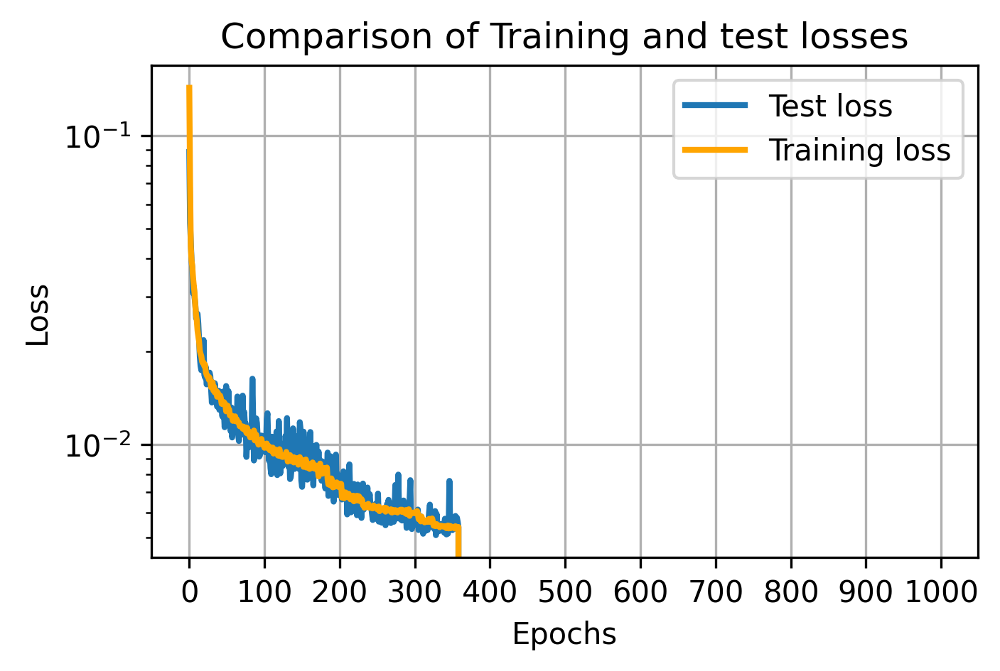

 36%|████████████▉                       | 360/1000 [1:12:38<2:09:25, 12.13s/it]

Epoch:360 
 Training time for  epoch 360: 0.201 minutes,Training loss:  0.005315579599717094, Testing loss: 0.006350053763017058


 36%|████████████▉                       | 361/1000 [1:12:50<2:08:59, 12.11s/it]

Epoch:361 
 Training time for  epoch 361: 0.201 minutes,Training loss:  0.00544499854084524, Testing loss: 0.005165658406913281


 36%|█████████████                       | 362/1000 [1:13:02<2:08:54, 12.12s/it]

Epoch:362 
 Training time for  epoch 362: 0.202 minutes,Training loss:  0.0053900526474153195, Testing loss: 0.00515770107973367


 36%|█████████████                       | 363/1000 [1:13:14<2:08:48, 12.13s/it]

Epoch:363 
 Training time for  epoch 363: 0.203 minutes,Training loss:  0.00534173600379979, Testing loss: 0.005393487140536308


 36%|█████████████                       | 364/1000 [1:13:27<2:08:45, 12.15s/it]

Epoch:364 
 Training time for  epoch 364: 0.203 minutes,Training loss:  0.005312345035830631, Testing loss: 0.005479827718809247


 36%|█████████████▏                      | 365/1000 [1:13:39<2:08:19, 12.13s/it]

Epoch:365 
 Training time for  epoch 365: 0.201 minutes,Training loss:  0.005381404341909164, Testing loss: 0.005163087379187346


 37%|█████████████▏                      | 366/1000 [1:13:51<2:08:08, 12.13s/it]

Epoch:366 
 Training time for  epoch 366: 0.202 minutes,Training loss:  0.005325590237882097, Testing loss: 0.005252232034690678


 37%|█████████████▏                      | 367/1000 [1:14:03<2:07:41, 12.10s/it]

Epoch:367 
 Training time for  epoch 367: 0.201 minutes,Training loss:  0.0053592963854303104, Testing loss: 0.004956535021774471


 37%|█████████████▏                      | 368/1000 [1:14:15<2:07:33, 12.11s/it]

Epoch:368 
 Training time for  epoch 368: 0.202 minutes,Training loss:  0.005352788244327584, Testing loss: 0.005115746883675456
Epoch:369 
 Training time for  epoch 369: 0.202 minutes,Training loss:  0.005364829408541391, Testing loss: 0.005014361841604114


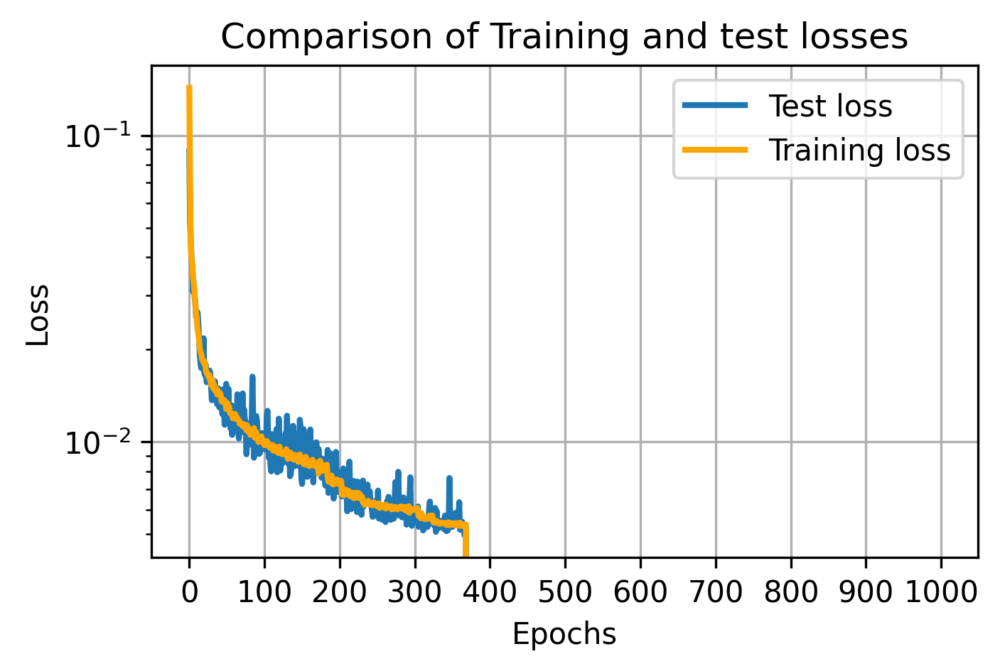

 37%|█████████████▎                      | 370/1000 [1:14:39<2:07:12, 12.12s/it]

Epoch:370 
 Training time for  epoch 370: 0.2 minutes,Training loss:  0.005269275083932398, Testing loss: 0.005559069784358144


 37%|█████████████▎                      | 371/1000 [1:14:51<2:07:08, 12.13s/it]

Epoch:371 
 Training time for  epoch 371: 0.203 minutes,Training loss:  0.0054147739261367145, Testing loss: 0.005352588472887874


 37%|█████████████▍                      | 372/1000 [1:15:03<2:06:47, 12.11s/it]

Epoch:372 
 Training time for  epoch 372: 0.201 minutes,Training loss:  0.005342678040099459, Testing loss: 0.005180425024591386


 37%|█████████████▍                      | 373/1000 [1:15:16<2:06:31, 12.11s/it]

Epoch:373 
 Training time for  epoch 373: 0.202 minutes,Training loss:  0.005329921123388891, Testing loss: 0.006258905623108149


 37%|█████████████▍                      | 374/1000 [1:15:28<2:06:38, 12.14s/it]

Epoch:374 
 Training time for  epoch 374: 0.203 minutes,Training loss:  0.005322586881314836, Testing loss: 0.005189448092132807


 38%|█████████████▌                      | 375/1000 [1:15:40<2:06:53, 12.18s/it]

Epoch:375 
 Training time for  epoch 375: 0.205 minutes,Training loss:  0.005342003228478177, Testing loss: 0.005417091152630746


 38%|█████████████▌                      | 376/1000 [1:15:52<2:06:39, 12.18s/it]

Epoch:376 
 Training time for  epoch 376: 0.203 minutes,Training loss:  0.0053678492687720455, Testing loss: 0.005126707884483039


 38%|█████████████▌                      | 377/1000 [1:16:04<2:06:51, 12.22s/it]

Epoch:377 
 Training time for  epoch 377: 0.205 minutes,Training loss:  0.0053596260273800975, Testing loss: 0.005366666074842215


 38%|█████████████▌                      | 378/1000 [1:16:17<2:06:08, 12.17s/it]

Epoch:378 
 Training time for  epoch 378: 0.201 minutes,Training loss:  0.005345236936218509, Testing loss: 0.005227300329133868
Epoch:379 
 Training time for  epoch 379: 0.202 minutes,Training loss:  0.0053612892532182484, Testing loss: 0.005131871621124447


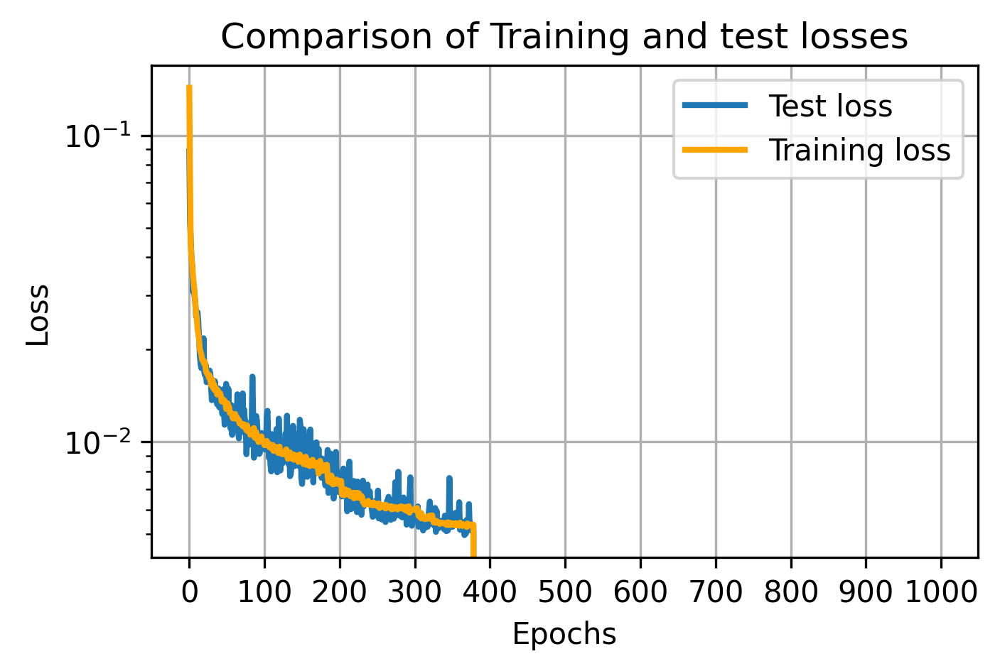

 38%|█████████████▋                      | 380/1000 [1:16:41<2:06:09, 12.21s/it]

Epoch:380 
 Training time for  epoch 380: 0.203 minutes,Training loss:  0.0053034291184062745, Testing loss: 0.005204557310789824
Epoch 00381: reducing learning rate of group 0 to 2.6214e-04.


 38%|█████████████▋                      | 381/1000 [1:16:53<2:05:38, 12.18s/it]

Epoch:381 
 Training time for  epoch 381: 0.202 minutes,Training loss:  0.005379102797205284, Testing loss: 0.005805728659033775


 38%|█████████████▊                      | 382/1000 [1:17:05<2:05:01, 12.14s/it]

Epoch:382 
 Training time for  epoch 382: 0.201 minutes,Training loss:  0.00523249823659546, Testing loss: 0.005135204396210611


 38%|█████████████▊                      | 383/1000 [1:17:17<2:04:55, 12.15s/it]

Epoch:383 
 Training time for  epoch 383: 0.203 minutes,Training loss:  0.005166657005613032, Testing loss: 0.0053304539993405346


 38%|█████████████▊                      | 384/1000 [1:17:30<2:05:09, 12.19s/it]

Epoch:384 
 Training time for  epoch 384: 0.205 minutes,Training loss:  0.005126971653019025, Testing loss: 0.005088486163876951


 38%|█████████████▊                      | 385/1000 [1:17:42<2:05:04, 12.20s/it]

Epoch:385 
 Training time for  epoch 385: 0.204 minutes,Training loss:  0.005152106637450997, Testing loss: 0.005331483436748385


 39%|█████████████▉                      | 386/1000 [1:17:54<2:04:41, 12.19s/it]

Epoch:386 
 Training time for  epoch 386: 0.202 minutes,Training loss:  0.005158176033408246, Testing loss: 0.005511235352605582


 39%|█████████████▉                      | 387/1000 [1:18:06<2:04:19, 12.17s/it]

Epoch:387 
 Training time for  epoch 387: 0.202 minutes,Training loss:  0.005142072800321896, Testing loss: 0.005198526447638869


 39%|█████████████▉                      | 388/1000 [1:18:18<2:04:04, 12.16s/it]

Epoch:388 
 Training time for  epoch 388: 0.203 minutes,Training loss:  0.005168044067536341, Testing loss: 0.00511820383835584
Epoch:389 
 Training time for  epoch 389: 0.205 minutes,Training loss:  0.005210470758393649, Testing loss: 0.005450535444542766


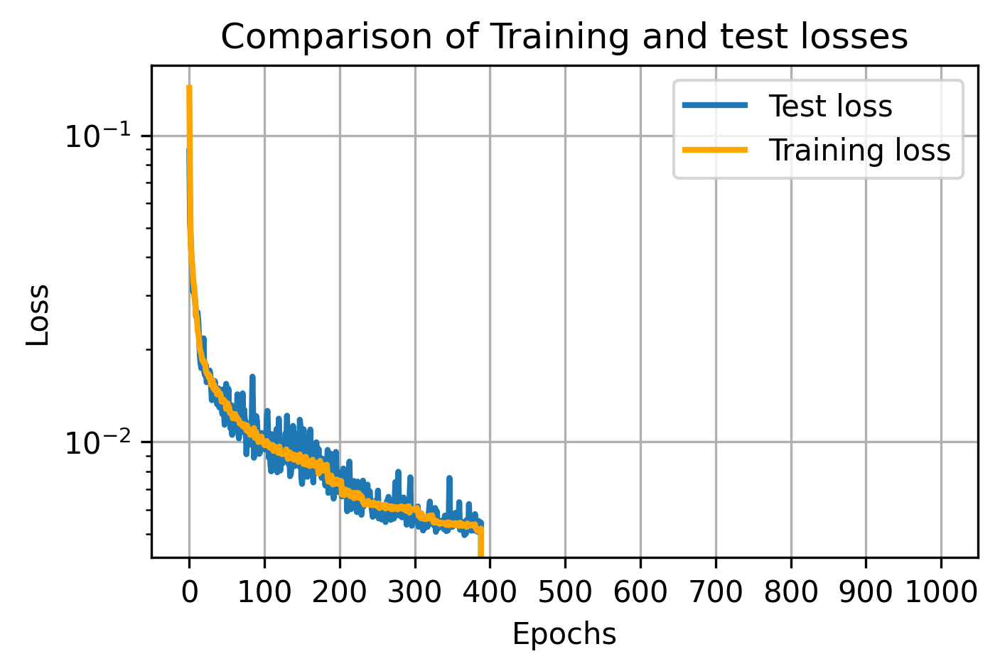

 39%|██████████████                      | 390/1000 [1:18:43<2:04:12, 12.22s/it]

Epoch:390 
 Training time for  epoch 390: 0.202 minutes,Training loss:  0.005227880004812876, Testing loss: 0.005063677281141281


 39%|██████████████                      | 391/1000 [1:18:55<2:04:20, 12.25s/it]

Epoch:391 
 Training time for  epoch 391: 0.205 minutes,Training loss:  0.005213712656310176, Testing loss: 0.005214276956394315


 39%|██████████████                      | 392/1000 [1:19:07<2:03:46, 12.21s/it]

Epoch:392 
 Training time for  epoch 392: 0.202 minutes,Training loss:  0.005144932963068702, Testing loss: 0.0053566285036504265


 39%|██████████████▏                     | 393/1000 [1:19:19<2:03:02, 12.16s/it]

Epoch:393 
 Training time for  epoch 393: 0.201 minutes,Training loss:  0.0051670051769339385, Testing loss: 0.005670394571498036


 39%|██████████████▏                     | 394/1000 [1:19:32<2:03:06, 12.19s/it]

Epoch:394 
 Training time for  epoch 394: 0.204 minutes,Training loss:  0.005173805915035576, Testing loss: 0.005131970611400903
Epoch 00395: reducing learning rate of group 0 to 2.0972e-04.


 40%|██████████████▏                     | 395/1000 [1:19:44<2:03:24, 12.24s/it]

Epoch:395 
 Training time for  epoch 395: 0.206 minutes,Training loss:  0.0051441627706570875, Testing loss: 0.005334785361774266


 40%|██████████████▎                     | 396/1000 [1:19:56<2:03:03, 12.22s/it]

Epoch:396 
 Training time for  epoch 396: 0.203 minutes,Training loss:  0.005024769357767964, Testing loss: 0.005171180120669305


 40%|██████████████▎                     | 397/1000 [1:20:09<2:03:04, 12.25s/it]

Epoch:397 
 Training time for  epoch 397: 0.205 minutes,Training loss:  0.0050328006474658175, Testing loss: 0.004869326329790056


 40%|██████████████▎                     | 398/1000 [1:20:21<2:02:54, 12.25s/it]

Epoch:398 
 Training time for  epoch 398: 0.204 minutes,Training loss:  0.005034829101565269, Testing loss: 0.004800907117314636
Epoch:399 
 Training time for  epoch 399: 0.201 minutes,Training loss:  0.005038554604953798, Testing loss: 0.005754705779254437


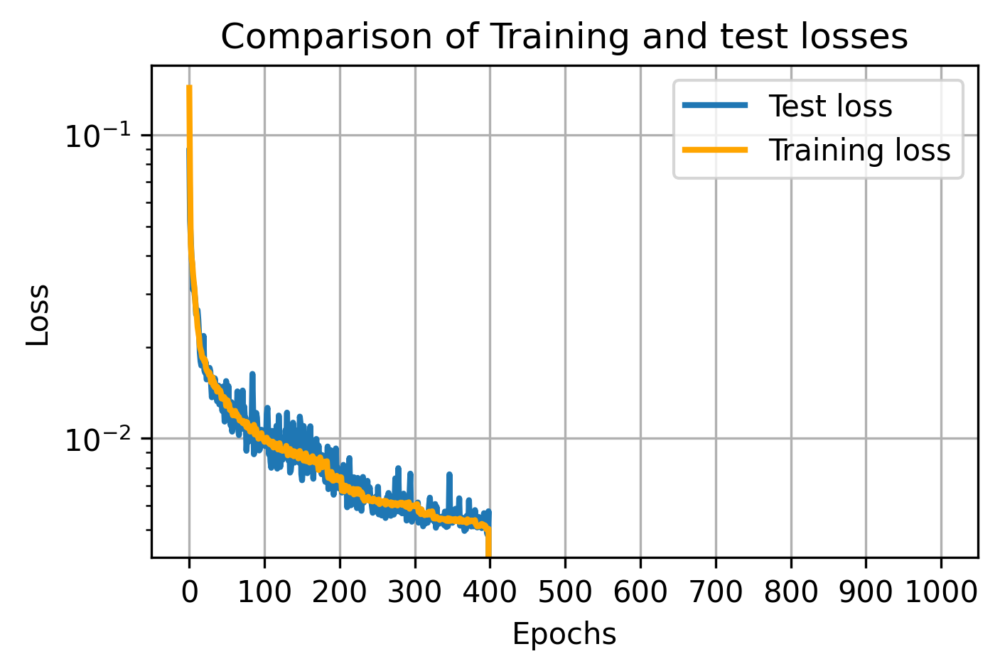

 40%|██████████████▍                     | 400/1000 [1:20:45<2:02:27, 12.25s/it]

Epoch:400 
 Training time for  epoch 400: 0.203 minutes,Training loss:  0.005022392756955722, Testing loss: 0.005185995111241936


 40%|██████████████▍                     | 401/1000 [1:20:57<2:01:44, 12.20s/it]

Epoch:401 
 Training time for  epoch 401: 0.201 minutes,Training loss:  0.005036306232711544, Testing loss: 0.004952194378711283


 40%|██████████████▍                     | 402/1000 [1:21:10<2:01:48, 12.22s/it]

Epoch:402 
 Training time for  epoch 402: 0.205 minutes,Training loss:  0.005015881375153306, Testing loss: 0.004927376615814865


 40%|██████████████▌                     | 403/1000 [1:21:22<2:01:26, 12.21s/it]

Epoch:403 
 Training time for  epoch 403: 0.203 minutes,Training loss:  0.0050186471806451865, Testing loss: 0.0051678147260099646


 40%|██████████████▌                     | 404/1000 [1:21:34<2:01:10, 12.20s/it]

Epoch:404 
 Training time for  epoch 404: 0.203 minutes,Training loss:  0.005007693471557933, Testing loss: 0.005097870551981032


 40%|██████████████▌                     | 405/1000 [1:21:46<2:01:06, 12.21s/it]

Epoch:405 
 Training time for  epoch 405: 0.204 minutes,Training loss:  0.0050715779735296795, Testing loss: 0.0050736806076020005


 41%|██████████████▌                     | 406/1000 [1:21:58<2:00:39, 12.19s/it]

Epoch:406 
 Training time for  epoch 406: 0.202 minutes,Training loss:  0.005051486522692681, Testing loss: 0.004795830068178475


 41%|██████████████▋                     | 407/1000 [1:22:11<2:00:22, 12.18s/it]

Epoch:407 
 Training time for  epoch 407: 0.203 minutes,Training loss:  0.004992446789959322, Testing loss: 0.004843097585253417


 41%|██████████████▋                     | 408/1000 [1:22:23<2:00:09, 12.18s/it]

Epoch:408 
 Training time for  epoch 408: 0.203 minutes,Training loss:  0.004979852316836187, Testing loss: 0.004820192982442677
Epoch:409 
 Training time for  epoch 409: 0.204 minutes,Training loss:  0.004997663599039827, Testing loss: 0.004950515124946832


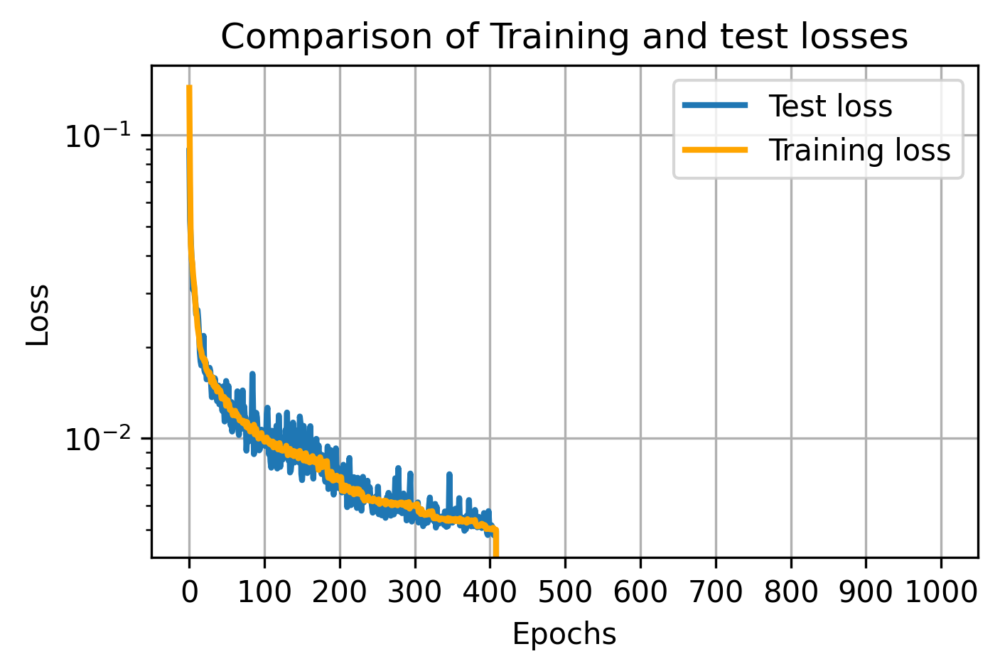

 41%|██████████████▊                     | 410/1000 [1:22:47<2:00:03, 12.21s/it]

Epoch:410 
 Training time for  epoch 410: 0.201 minutes,Training loss:  0.005027632676302937, Testing loss: 0.005015548490919172


 41%|██████████████▊                     | 411/1000 [1:22:59<1:59:25, 12.16s/it]

Epoch:411 
 Training time for  epoch 411: 0.201 minutes,Training loss:  0.004997756659095452, Testing loss: 0.0053985377075150606


 41%|██████████████▊                     | 412/1000 [1:23:11<1:59:07, 12.16s/it]

Epoch:412 
 Training time for  epoch 412: 0.202 minutes,Training loss:  0.005020687699211928, Testing loss: 0.005147818680852651


 41%|██████████████▊                     | 413/1000 [1:23:24<1:58:58, 12.16s/it]

Epoch:413 
 Training time for  epoch 413: 0.203 minutes,Training loss:  0.005017984883468187, Testing loss: 0.005006883083842695


 41%|██████████████▉                     | 414/1000 [1:23:36<1:58:50, 12.17s/it]

Epoch:414 
 Training time for  epoch 414: 0.203 minutes,Training loss:  0.004996783593042162, Testing loss: 0.005279384427703917


 42%|██████████████▉                     | 415/1000 [1:23:48<1:58:51, 12.19s/it]

Epoch:415 
 Training time for  epoch 415: 0.204 minutes,Training loss:  0.004977854366255243, Testing loss: 0.005144484941847622


 42%|██████████████▉                     | 416/1000 [1:24:00<1:58:44, 12.20s/it]

Epoch:416 
 Training time for  epoch 416: 0.204 minutes,Training loss:  0.005009713802004231, Testing loss: 0.005198606480844319


 42%|███████████████                     | 417/1000 [1:24:12<1:58:22, 12.18s/it]

Epoch:417 
 Training time for  epoch 417: 0.202 minutes,Training loss:  0.005035365898428219, Testing loss: 0.005023690019734204


 42%|███████████████                     | 418/1000 [1:24:25<1:58:04, 12.17s/it]

Epoch:418 
 Training time for  epoch 418: 0.203 minutes,Training loss:  0.005013047744283122, Testing loss: 0.005039889845065772
Epoch:419 
 Training time for  epoch 419: 0.204 minutes,Training loss:  0.004977510020279614, Testing loss: 0.005016891062259674


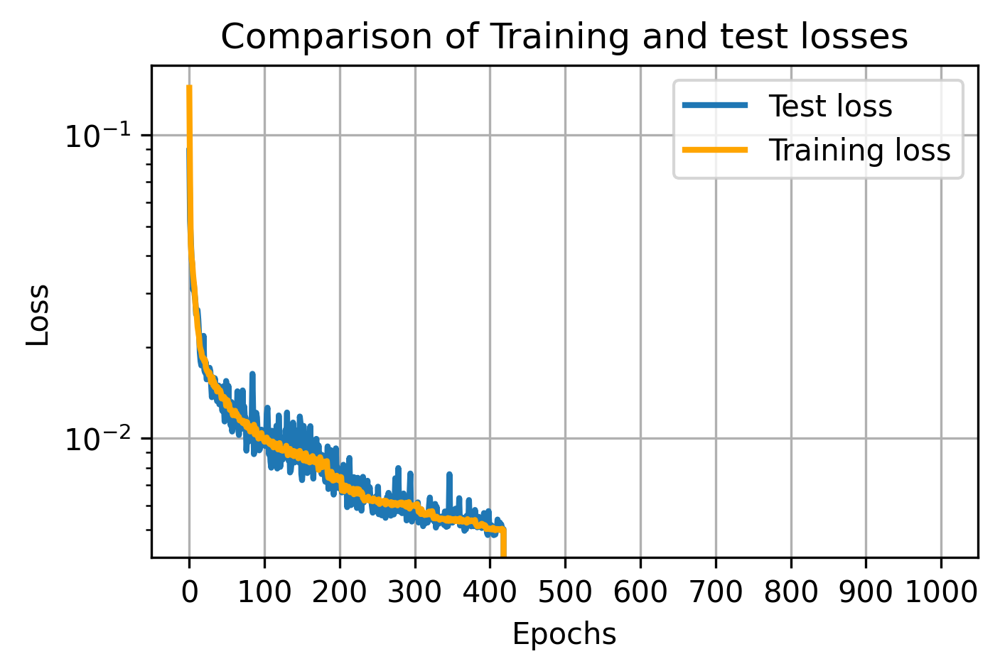

 42%|███████████████                     | 420/1000 [1:24:49<1:58:15, 12.23s/it]

Epoch:420 
 Training time for  epoch 420: 0.203 minutes,Training loss:  0.005010212015503375, Testing loss: 0.005121821453794837


 42%|███████████████▏                    | 421/1000 [1:25:01<1:57:49, 12.21s/it]

Epoch:421 
 Training time for  epoch 421: 0.203 minutes,Training loss:  0.00500189432924079, Testing loss: 0.004841956663876772


 42%|███████████████▏                    | 422/1000 [1:25:14<1:57:38, 12.21s/it]

Epoch:422 
 Training time for  epoch 422: 0.204 minutes,Training loss:  0.004997175555182978, Testing loss: 0.005005661826580763


 42%|███████████████▏                    | 423/1000 [1:25:26<1:57:41, 12.24s/it]

Epoch:423 
 Training time for  epoch 423: 0.205 minutes,Training loss:  0.004969617638533608, Testing loss: 0.004884745748713612


 42%|███████████████▎                    | 424/1000 [1:25:38<1:57:16, 12.22s/it]

Epoch:424 
 Training time for  epoch 424: 0.203 minutes,Training loss:  0.005022606616904667, Testing loss: 0.005224085235968232


 42%|███████████████▎                    | 425/1000 [1:25:50<1:56:56, 12.20s/it]

Epoch:425 
 Training time for  epoch 425: 0.203 minutes,Training loss:  0.004984624082715825, Testing loss: 0.005000834022648632


 43%|███████████████▎                    | 426/1000 [1:26:02<1:56:29, 12.18s/it]

Epoch:426 
 Training time for  epoch 426: 0.202 minutes,Training loss:  0.005015775525637412, Testing loss: 0.004803136680275202


 43%|███████████████▎                    | 427/1000 [1:26:15<1:56:17, 12.18s/it]

Epoch:427 
 Training time for  epoch 427: 0.203 minutes,Training loss:  0.004994277010264002, Testing loss: 0.0050603061495348815


 43%|███████████████▍                    | 428/1000 [1:26:27<1:56:23, 12.21s/it]

Epoch:428 
 Training time for  epoch 428: 0.205 minutes,Training loss:  0.004938320397657886, Testing loss: 0.005153174297884106
Epoch:429 
 Training time for  epoch 429: 0.203 minutes,Training loss:  0.005012579746576811, Testing loss: 0.004904226511716843


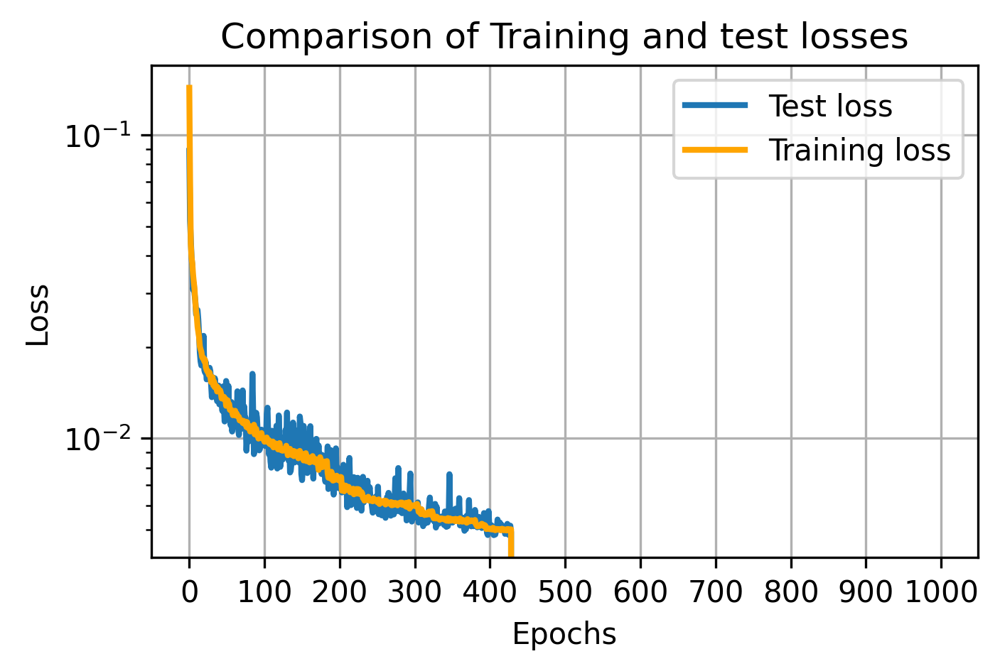

 43%|███████████████▍                    | 430/1000 [1:26:51<1:56:12, 12.23s/it]

Epoch:430 
 Training time for  epoch 430: 0.202 minutes,Training loss:  0.005005486854692784, Testing loss: 0.004823800274170936


 43%|███████████████▌                    | 431/1000 [1:27:04<1:56:12, 12.25s/it]

Epoch:431 
 Training time for  epoch 431: 0.205 minutes,Training loss:  0.0050249374030822075, Testing loss: 0.004871781882829964


 43%|███████████████▌                    | 432/1000 [1:27:16<1:56:08, 12.27s/it]

Epoch:432 
 Training time for  epoch 432: 0.205 minutes,Training loss:  0.004980362641855503, Testing loss: 0.004845526530407369


 43%|███████████████▌                    | 433/1000 [1:27:28<1:55:44, 12.25s/it]

Epoch:433 
 Training time for  epoch 433: 0.203 minutes,Training loss:  0.005014870761170049, Testing loss: 0.005050817215815187


 43%|███████████████▌                    | 434/1000 [1:27:40<1:55:25, 12.24s/it]

Epoch:434 
 Training time for  epoch 434: 0.203 minutes,Training loss:  0.004954840555250576, Testing loss: 0.004926440683193505


 44%|███████████████▋                    | 435/1000 [1:27:53<1:55:32, 12.27s/it]

Epoch:435 
 Training time for  epoch 435: 0.206 minutes,Training loss:  0.0049861335794849195, Testing loss: 0.004870818476192653


 44%|███████████████▋                    | 436/1000 [1:28:05<1:54:51, 12.22s/it]

Epoch:436 
 Training time for  epoch 436: 0.202 minutes,Training loss:  0.004972067132103284, Testing loss: 0.00499029609374702


 44%|███████████████▋                    | 437/1000 [1:28:17<1:54:11, 12.17s/it]

Epoch:437 
 Training time for  epoch 437: 0.201 minutes,Training loss:  0.0049633037804060216, Testing loss: 0.005127097023651004


 44%|███████████████▊                    | 438/1000 [1:28:29<1:53:37, 12.13s/it]

Epoch:438 
 Training time for  epoch 438: 0.201 minutes,Training loss:  0.00498739148746488, Testing loss: 0.004886655332520604
Epoch 00439: reducing learning rate of group 0 to 1.6777e-04.
Epoch:439 
 Training time for  epoch 439: 0.202 minutes,Training loss:  0.0049912792186465865, Testing loss: 0.0050125373341143135


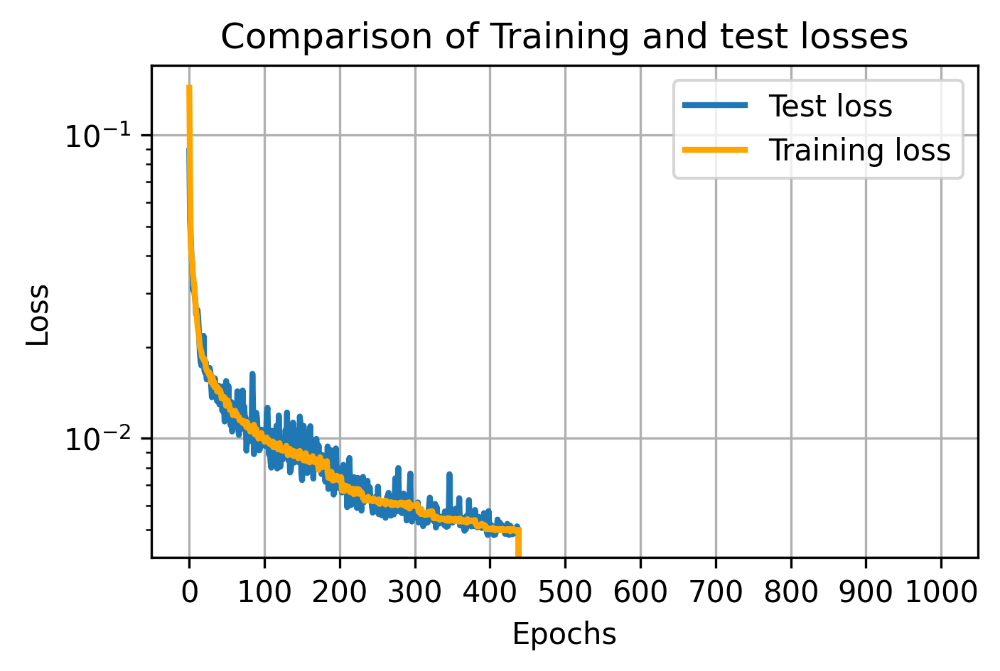

 44%|███████████████▊                    | 440/1000 [1:28:54<1:53:57, 12.21s/it]

Epoch:440 
 Training time for  epoch 440: 0.204 minutes,Training loss:  0.004873393477469631, Testing loss: 0.005029872730374336


 44%|███████████████▉                    | 441/1000 [1:29:06<1:53:32, 12.19s/it]

Epoch:441 
 Training time for  epoch 441: 0.202 minutes,Training loss:  0.004892428905316969, Testing loss: 0.004823203962296248


 44%|███████████████▉                    | 442/1000 [1:29:18<1:53:18, 12.18s/it]

Epoch:442 
 Training time for  epoch 442: 0.203 minutes,Training loss:  0.004866735681158065, Testing loss: 0.004937831112183631


 44%|███████████████▉                    | 443/1000 [1:29:30<1:52:48, 12.15s/it]

Epoch:443 
 Training time for  epoch 443: 0.201 minutes,Training loss:  0.0048860460993023665, Testing loss: 0.004913557642139494


 44%|███████████████▉                    | 444/1000 [1:29:42<1:52:38, 12.16s/it]

Epoch:444 
 Training time for  epoch 444: 0.203 minutes,Training loss:  0.004907875795579331, Testing loss: 0.004989523636177182


 44%|████████████████                    | 445/1000 [1:29:54<1:52:23, 12.15s/it]

Epoch:445 
 Training time for  epoch 445: 0.202 minutes,Training loss:  0.004866539129909479, Testing loss: 0.005198552501387894


 45%|████████████████                    | 446/1000 [1:30:06<1:51:35, 12.09s/it]

Epoch:446 
 Training time for  epoch 446: 0.199 minutes,Training loss:  0.00490774310780224, Testing loss: 0.00525222476106137


 45%|████████████████                    | 447/1000 [1:30:18<1:50:54, 12.03s/it]

Epoch:447 
 Training time for  epoch 447: 0.198 minutes,Training loss:  0.004855932254110583, Testing loss: 0.005074677458032965


 45%|████████████████▏                   | 448/1000 [1:30:30<1:50:21, 12.00s/it]

Epoch:448 
 Training time for  epoch 448: 0.198 minutes,Training loss:  0.004849407867864899, Testing loss: 0.004829360377043485
Epoch:449 
 Training time for  epoch 449: 0.2 minutes,Training loss:  0.00483724575394572, Testing loss: 0.0048850317113101486


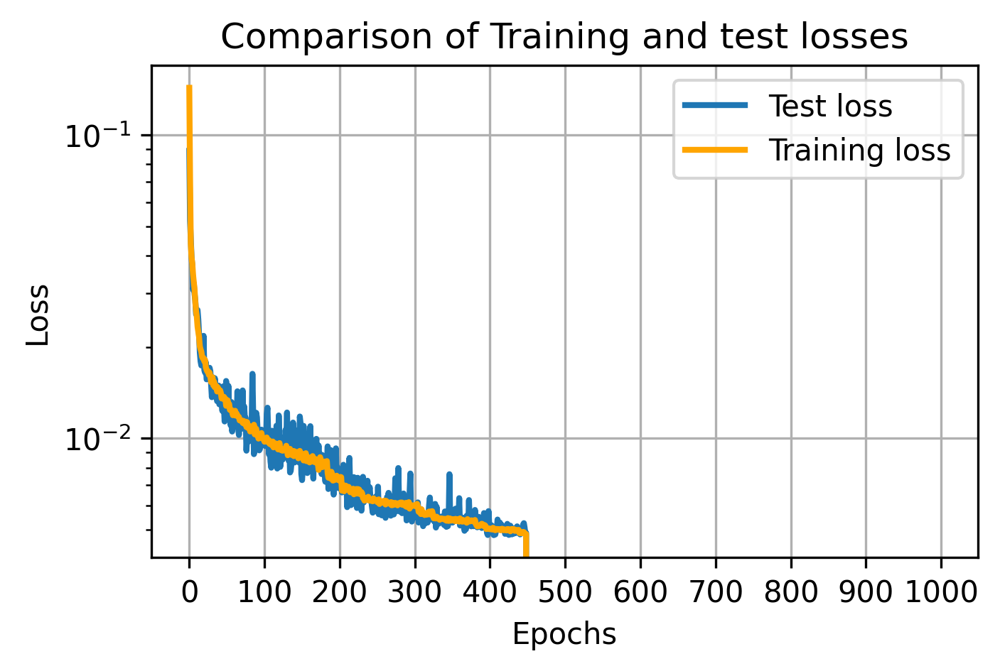

 45%|████████████████▏                   | 450/1000 [1:30:54<1:50:46, 12.08s/it]

Epoch:450 
 Training time for  epoch 450: 0.202 minutes,Training loss:  0.0048544369153916385, Testing loss: 0.004818231156095862


 45%|████████████████▏                   | 451/1000 [1:31:06<1:50:13, 12.05s/it]

Epoch:451 
 Training time for  epoch 451: 0.199 minutes,Training loss:  0.0048834691721941674, Testing loss: 0.004712682501412928


 45%|████████████████▎                   | 452/1000 [1:31:18<1:50:08, 12.06s/it]

Epoch:452 
 Training time for  epoch 452: 0.201 minutes,Training loss:  0.004874842781162497, Testing loss: 0.004844638491049409


 45%|████████████████▎                   | 453/1000 [1:31:30<1:50:05, 12.08s/it]

Epoch:453 
 Training time for  epoch 453: 0.202 minutes,Training loss:  0.004844358305010888, Testing loss: 0.004846951188519597


 45%|████████████████▎                   | 454/1000 [1:31:43<1:49:49, 12.07s/it]

Epoch:454 
 Training time for  epoch 454: 0.201 minutes,Training loss:  0.004858502372342154, Testing loss: 0.004752798955887556


 46%|████████████████▍                   | 455/1000 [1:31:55<1:49:45, 12.08s/it]

Epoch:455 
 Training time for  epoch 455: 0.202 minutes,Training loss:  0.00485210234416123, Testing loss: 0.005119782751426101


 46%|████████████████▍                   | 456/1000 [1:32:07<1:49:22, 12.06s/it]

Epoch:456 
 Training time for  epoch 456: 0.2 minutes,Training loss:  0.004886218151683367, Testing loss: 0.0048761737393215295


 46%|████████████████▍                   | 457/1000 [1:32:19<1:49:09, 12.06s/it]

Epoch:457 
 Training time for  epoch 457: 0.201 minutes,Training loss:  0.004862264473679174, Testing loss: 0.005065068523399532


 46%|████████████████▍                   | 458/1000 [1:32:31<1:48:47, 12.04s/it]

Epoch:458 
 Training time for  epoch 458: 0.2 minutes,Training loss:  0.004852479559279606, Testing loss: 0.00475095711182803
Epoch:459 
 Training time for  epoch 459: 0.202 minutes,Training loss:  0.004846213319210139, Testing loss: 0.00512766245752573


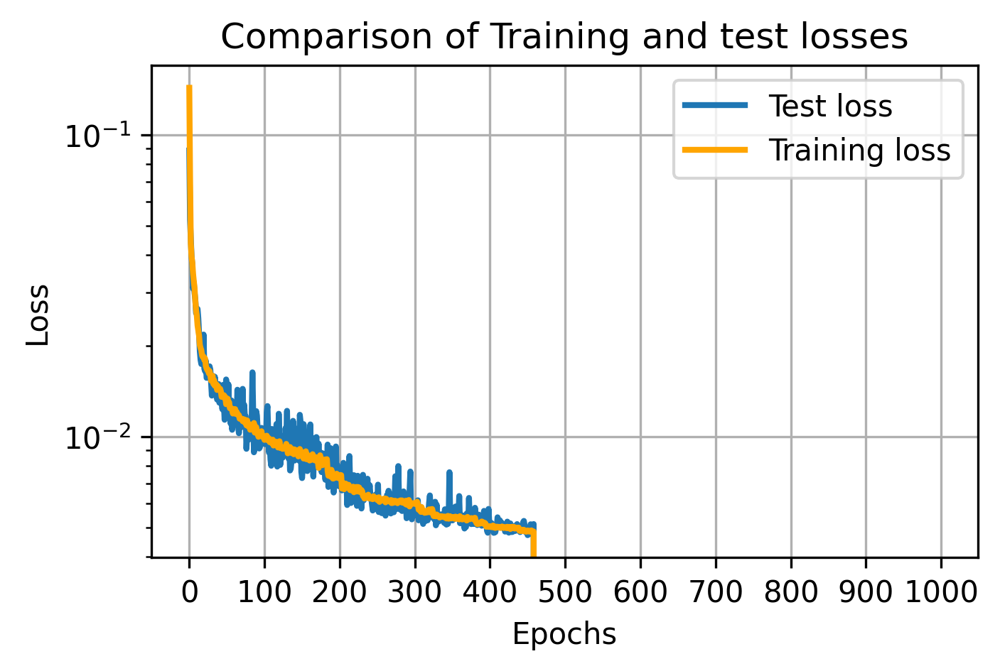

 46%|████████████████▌                   | 459/1000 [1:32:43<1:49:38, 12.16s/it]

Epoch 00460: reducing learning rate of group 0 to 1.3422e-04.


 46%|████████████████▌                   | 460/1000 [1:32:55<1:49:21, 12.15s/it]

Epoch:460 
 Training time for  epoch 460: 0.202 minutes,Training loss:  0.0048755785235626735, Testing loss: 0.004970837431028485


 46%|████████████████▌                   | 461/1000 [1:33:07<1:48:54, 12.12s/it]

Epoch:461 
 Training time for  epoch 461: 0.201 minutes,Training loss:  0.004756107314410819, Testing loss: 0.004789820779114962


 46%|████████████████▋                   | 462/1000 [1:33:19<1:48:29, 12.10s/it]

Epoch:462 
 Training time for  epoch 462: 0.201 minutes,Training loss:  0.004763989305852736, Testing loss: 0.004888970158062876


 46%|████████████████▋                   | 463/1000 [1:33:31<1:48:13, 12.09s/it]

Epoch:463 
 Training time for  epoch 463: 0.201 minutes,Training loss:  0.004783992108247491, Testing loss: 0.004725234340876341


 46%|████████████████▋                   | 464/1000 [1:33:44<1:48:06, 12.10s/it]

Epoch:464 
 Training time for  epoch 464: 0.202 minutes,Training loss:  0.004784973011850774, Testing loss: 0.00465873593930155


 46%|████████████████▋                   | 465/1000 [1:33:56<1:48:03, 12.12s/it]

Epoch:465 
 Training time for  epoch 465: 0.203 minutes,Training loss:  0.004786886566055725, Testing loss: 0.004881077446043491


 47%|████████████████▊                   | 466/1000 [1:34:08<1:47:47, 12.11s/it]

Epoch:466 
 Training time for  epoch 466: 0.202 minutes,Training loss:  0.0048203472738693985, Testing loss: 0.004743271288461983


 47%|████████████████▊                   | 467/1000 [1:34:20<1:47:40, 12.12s/it]

Epoch:467 
 Training time for  epoch 467: 0.202 minutes,Training loss:  0.004751834633590331, Testing loss: 0.004951613079756498


 47%|████████████████▊                   | 468/1000 [1:34:32<1:47:24, 12.11s/it]

Epoch:468 
 Training time for  epoch 468: 0.202 minutes,Training loss:  0.0047756539061167965, Testing loss: 0.004712160462513566
Epoch:469 
 Training time for  epoch 469: 0.2 minutes,Training loss:  0.004782591140033995, Testing loss: 0.005039899852126837


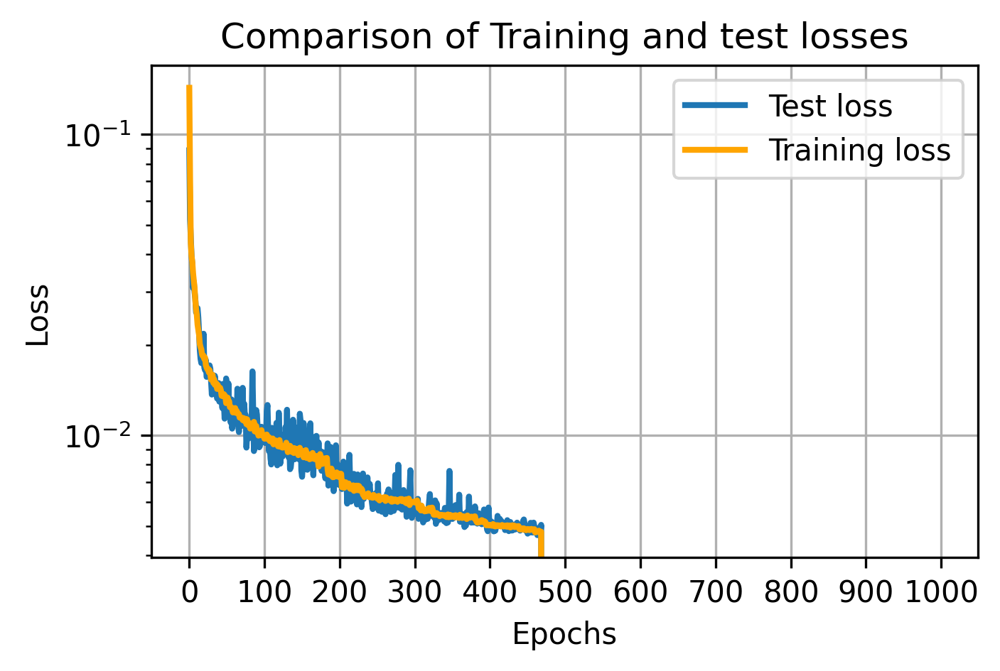

 47%|████████████████▉                   | 470/1000 [1:34:57<1:47:30, 12.17s/it]

Epoch:470 
 Training time for  epoch 470: 0.203 minutes,Training loss:  0.004772422869844442, Testing loss: 0.004735806938260794


 47%|████████████████▉                   | 471/1000 [1:35:09<1:47:08, 12.15s/it]

Epoch:471 
 Training time for  epoch 471: 0.202 minutes,Training loss:  0.004791409320238022, Testing loss: 0.0047523754509165884


 47%|████████████████▉                   | 472/1000 [1:35:21<1:46:32, 12.11s/it]

Epoch:472 
 Training time for  epoch 472: 0.2 minutes,Training loss:  0.00476058716691044, Testing loss: 0.004753682469017803


 47%|█████████████████                   | 473/1000 [1:35:33<1:46:20, 12.11s/it]

Epoch:473 
 Training time for  epoch 473: 0.202 minutes,Training loss:  0.004759172644762541, Testing loss: 0.004745193729177117


 47%|█████████████████                   | 474/1000 [1:35:45<1:46:01, 12.09s/it]

Epoch:474 
 Training time for  epoch 474: 0.201 minutes,Training loss:  0.004770544840836341, Testing loss: 0.004749486376531422


 48%|█████████████████                   | 475/1000 [1:35:57<1:45:58, 12.11s/it]

Epoch:475 
 Training time for  epoch 475: 0.202 minutes,Training loss:  0.004772465835345972, Testing loss: 0.005132784405723214


 48%|█████████████████▏                  | 476/1000 [1:36:09<1:45:44, 12.11s/it]

Epoch:476 
 Training time for  epoch 476: 0.202 minutes,Training loss:  0.004778692721628284, Testing loss: 0.004689663792960346


 48%|█████████████████▏                  | 477/1000 [1:36:21<1:45:27, 12.10s/it]

Epoch:477 
 Training time for  epoch 477: 0.201 minutes,Training loss:  0.004779058284668142, Testing loss: 0.005029367320239544
Epoch 00478: reducing learning rate of group 0 to 1.0737e-04.


 48%|█████████████████▏                  | 478/1000 [1:36:33<1:45:05, 12.08s/it]

Epoch:478 
 Training time for  epoch 478: 0.201 minutes,Training loss:  0.004760057628630692, Testing loss: 0.0047851083660498265
Epoch:479 
 Training time for  epoch 479: 0.202 minutes,Training loss:  0.004714557088416126, Testing loss: 0.004645284647122026


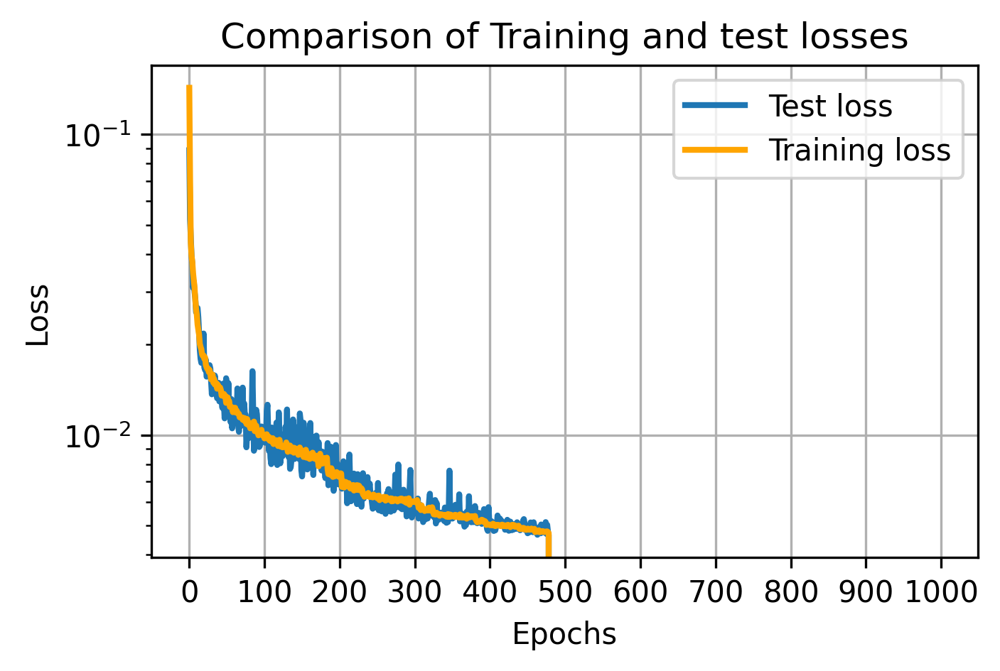

 48%|█████████████████▎                  | 480/1000 [1:36:58<1:45:16, 12.15s/it]

Epoch:480 
 Training time for  epoch 480: 0.202 minutes,Training loss:  0.004697082435515353, Testing loss: 0.004676073919981718


 48%|█████████████████▎                  | 481/1000 [1:37:10<1:44:58, 12.14s/it]

Epoch:481 
 Training time for  epoch 481: 0.202 minutes,Training loss:  0.004697208891760095, Testing loss: 0.0047087175818160175


 48%|█████████████████▎                  | 482/1000 [1:37:22<1:44:37, 12.12s/it]

Epoch:482 
 Training time for  epoch 482: 0.201 minutes,Training loss:  0.004700895876414927, Testing loss: 0.004952527387067676


 48%|█████████████████▍                  | 483/1000 [1:37:34<1:44:11, 12.09s/it]

Epoch:483 
 Training time for  epoch 483: 0.2 minutes,Training loss:  0.004715442769964951, Testing loss: 0.004948037229478359


 48%|█████████████████▍                  | 484/1000 [1:37:46<1:44:07, 12.11s/it]

Epoch:484 
 Training time for  epoch 484: 0.202 minutes,Training loss:  0.004702921339952139, Testing loss: 0.004727975777350366


 48%|█████████████████▍                  | 485/1000 [1:37:58<1:43:48, 12.09s/it]

Epoch:485 
 Training time for  epoch 485: 0.201 minutes,Training loss:  0.0047049532205290425, Testing loss: 0.004850931665860116


 49%|█████████████████▍                  | 486/1000 [1:38:10<1:43:51, 12.12s/it]

Epoch:486 
 Training time for  epoch 486: 0.203 minutes,Training loss:  0.0046991304933600795, Testing loss: 0.004956934684887528


 49%|█████████████████▌                  | 487/1000 [1:38:22<1:43:39, 12.12s/it]

Epoch:487 
 Training time for  epoch 487: 0.202 minutes,Training loss:  0.004724290948004205, Testing loss: 0.004767106212675572


 49%|█████████████████▌                  | 488/1000 [1:38:35<1:43:32, 12.13s/it]

Epoch:488 
 Training time for  epoch 488: 0.203 minutes,Training loss:  0.004716109644251678, Testing loss: 0.0049510220205411315
Epoch:489 
 Training time for  epoch 489: 0.203 minutes,Training loss:  0.004706437991549121, Testing loss: 0.004725210429169238


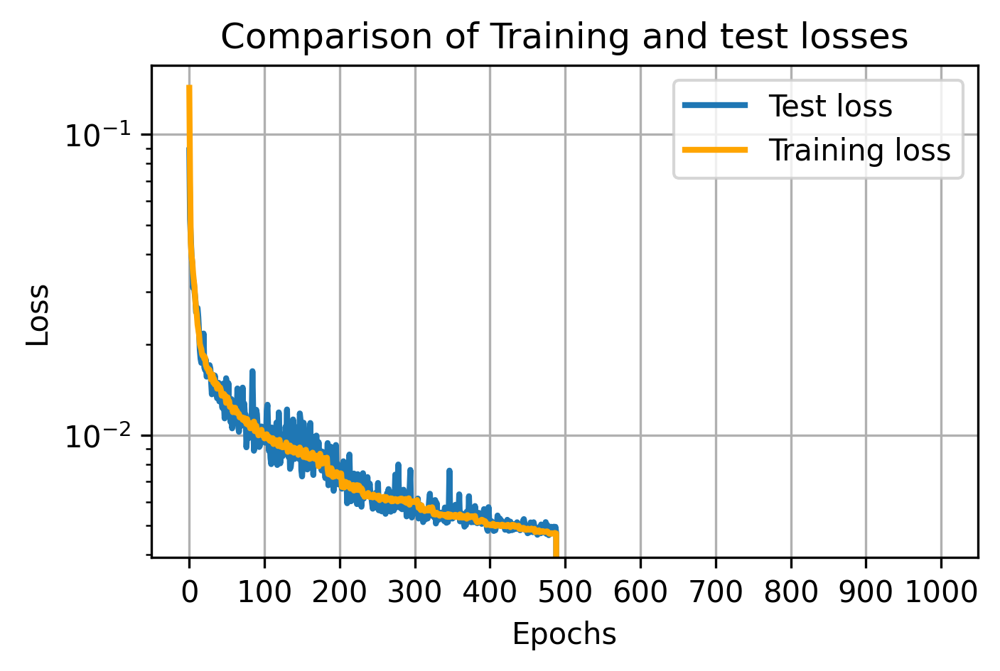

 49%|█████████████████▋                  | 490/1000 [1:38:59<1:43:18, 12.15s/it]

Epoch:490 
 Training time for  epoch 490: 0.2 minutes,Training loss:  0.004702405061391069, Testing loss: 0.004755164752714336
Epoch 00491: reducing learning rate of group 0 to 8.5899e-05.


 49%|█████████████████▋                  | 491/1000 [1:39:11<1:42:58, 12.14s/it]

Epoch:491 
 Training time for  epoch 491: 0.202 minutes,Training loss:  0.004705842600055861, Testing loss: 0.0046976324077695605


 49%|█████████████████▋                  | 492/1000 [1:39:23<1:43:01, 12.17s/it]

Epoch:492 
 Training time for  epoch 492: 0.204 minutes,Training loss:  0.004656942988530615, Testing loss: 0.0046885171812027695


 49%|█████████████████▋                  | 493/1000 [1:39:35<1:42:45, 12.16s/it]

Epoch:493 
 Training time for  epoch 493: 0.202 minutes,Training loss:  0.004661472731688505, Testing loss: 0.004733843286521733


 49%|█████████████████▊                  | 494/1000 [1:39:48<1:42:17, 12.13s/it]

Epoch:494 
 Training time for  epoch 494: 0.201 minutes,Training loss:  0.004644940689457072, Testing loss: 0.004760581064037979


 50%|█████████████████▊                  | 495/1000 [1:40:00<1:42:02, 12.12s/it]

Epoch:495 
 Training time for  epoch 495: 0.202 minutes,Training loss:  0.004652441924645563, Testing loss: 0.004641746785491705


 50%|█████████████████▊                  | 496/1000 [1:40:12<1:41:51, 12.13s/it]

Epoch:496 
 Training time for  epoch 496: 0.202 minutes,Training loss:  0.004660928765480578, Testing loss: 0.004764861050061881


 50%|█████████████████▉                  | 497/1000 [1:40:24<1:41:54, 12.16s/it]

Epoch:497 
 Training time for  epoch 497: 0.204 minutes,Training loss:  0.004658708846440991, Testing loss: 0.0047883473103865985


 50%|█████████████████▉                  | 498/1000 [1:40:36<1:41:42, 12.16s/it]

Epoch:498 
 Training time for  epoch 498: 0.203 minutes,Training loss:  0.004662221669177249, Testing loss: 0.004686459926888347
Epoch:499 
 Training time for  epoch 499: 0.202 minutes,Training loss:  0.004673846822359645, Testing loss: 0.005122628975659609


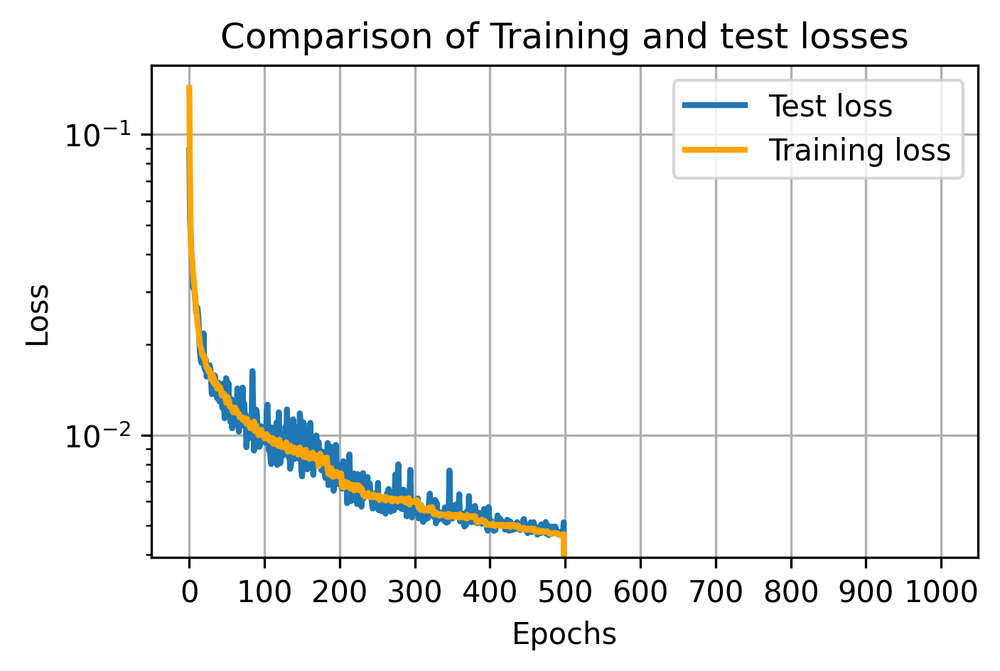

 50%|██████████████████                  | 500/1000 [1:41:01<1:41:28, 12.18s/it]

Epoch:500 
 Training time for  epoch 500: 0.201 minutes,Training loss:  0.00467879723748852, Testing loss: 0.004598135305568576


 50%|██████████████████                  | 501/1000 [1:41:13<1:41:15, 12.17s/it]

Epoch:501 
 Training time for  epoch 501: 0.203 minutes,Training loss:  0.00464952969788406, Testing loss: 0.004803007496520877


 50%|██████████████████                  | 502/1000 [1:41:25<1:40:48, 12.15s/it]

Epoch:502 
 Training time for  epoch 502: 0.201 minutes,Training loss:  0.00464729208479723, Testing loss: 0.004791602129116655


 50%|██████████████████                  | 503/1000 [1:41:37<1:40:41, 12.16s/it]

Epoch:503 
 Training time for  epoch 503: 0.203 minutes,Training loss:  0.004656488703765001, Testing loss: 0.004773050076328218


 50%|██████████████████▏                 | 504/1000 [1:41:49<1:40:14, 12.13s/it]

Epoch:504 
 Training time for  epoch 504: 0.201 minutes,Training loss:  0.004648250757535956, Testing loss: 0.004747239607386291
Epoch 00505: reducing learning rate of group 0 to 6.8719e-05.


 50%|██████████████████▏                 | 505/1000 [1:42:01<1:40:19, 12.16s/it]

Epoch:505 
 Training time for  epoch 505: 0.204 minutes,Training loss:  0.004652673470529184, Testing loss: 0.004685595412738621


 51%|██████████████████▏                 | 506/1000 [1:42:13<1:40:04, 12.16s/it]

Epoch:506 
 Training time for  epoch 506: 0.202 minutes,Training loss:  0.004607436597632822, Testing loss: 0.004783602673560381


 51%|██████████████████▎                 | 507/1000 [1:42:26<1:39:46, 12.14s/it]

Epoch:507 
 Training time for  epoch 507: 0.202 minutes,Training loss:  0.004626341608410288, Testing loss: 0.004704162958078086


 51%|██████████████████▎                 | 508/1000 [1:42:38<1:39:40, 12.16s/it]

Epoch:508 
 Training time for  epoch 508: 0.203 minutes,Training loss:  0.004625286589485878, Testing loss: 0.004665858745574951
Epoch:509 
 Training time for  epoch 509: 0.203 minutes,Training loss:  0.0046035145805839285, Testing loss: 0.004705992015078664


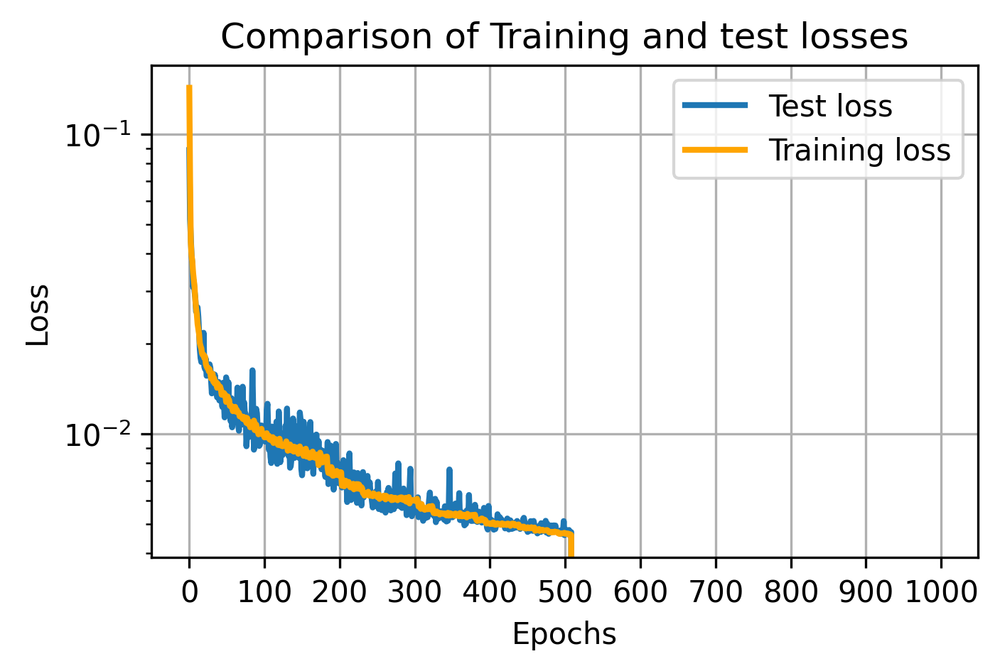

 51%|██████████████████▎                 | 510/1000 [1:43:02<1:39:40, 12.20s/it]

Epoch:510 
 Training time for  epoch 510: 0.202 minutes,Training loss:  0.00461172827267446, Testing loss: 0.004683833904564381


 51%|██████████████████▍                 | 511/1000 [1:43:15<1:39:29, 12.21s/it]

Epoch:511 
 Training time for  epoch 511: 0.204 minutes,Training loss:  0.004608674342911712, Testing loss: 0.004666246571578086


 51%|██████████████████▍                 | 512/1000 [1:43:27<1:39:00, 12.17s/it]

Epoch:512 
 Training time for  epoch 512: 0.201 minutes,Training loss:  0.004618971218635154, Testing loss: 0.004686020603403449


 51%|██████████████████▍                 | 513/1000 [1:43:39<1:38:39, 12.15s/it]

Epoch:513 
 Training time for  epoch 513: 0.202 minutes,Training loss:  0.0046109286778899606, Testing loss: 0.004632340176030993


 51%|██████████████████▌                 | 514/1000 [1:43:51<1:38:18, 12.14s/it]

Epoch:514 
 Training time for  epoch 514: 0.202 minutes,Training loss:  0.004608319646383568, Testing loss: 0.004672318021766842


 52%|██████████████████▌                 | 515/1000 [1:44:03<1:37:57, 12.12s/it]

Epoch:515 
 Training time for  epoch 515: 0.201 minutes,Training loss:  0.004612649717388738, Testing loss: 0.004598676767200232


 52%|██████████████████▌                 | 516/1000 [1:44:15<1:37:48, 12.12s/it]

Epoch:516 
 Training time for  epoch 516: 0.202 minutes,Training loss:  0.0046057866953322, Testing loss: 0.004637776203453541


 52%|██████████████████▌                 | 517/1000 [1:44:27<1:37:28, 12.11s/it]

Epoch:517 
 Training time for  epoch 517: 0.201 minutes,Training loss:  0.0046240623248578775, Testing loss: 0.004601922924630344


 52%|██████████████████▋                 | 518/1000 [1:44:39<1:37:25, 12.13s/it]

Epoch:518 
 Training time for  epoch 518: 0.203 minutes,Training loss:  0.004618552837923221, Testing loss: 0.0046125844540074465
Epoch:519 
 Training time for  epoch 519: 0.201 minutes,Training loss:  0.004618589082704673, Testing loss: 0.004713186388835311


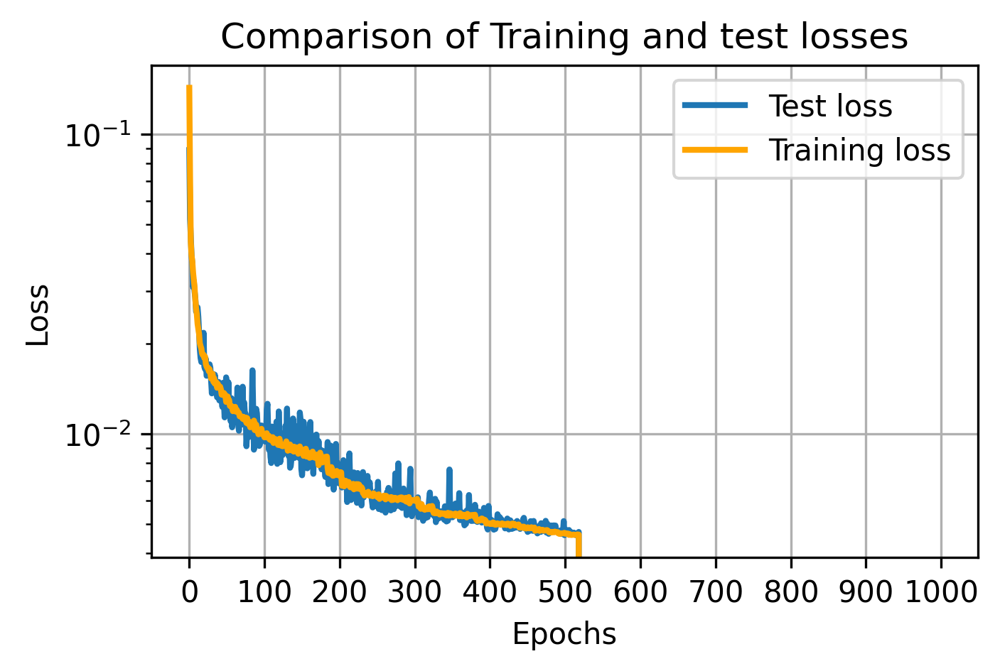

 52%|██████████████████▋                 | 519/1000 [1:44:52<1:37:50, 12.20s/it]

Epoch 00520: reducing learning rate of group 0 to 5.4976e-05.


 52%|██████████████████▋                 | 520/1000 [1:45:04<1:37:16, 12.16s/it]

Epoch:520 
 Training time for  epoch 520: 0.201 minutes,Training loss:  0.004604285844935928, Testing loss: 0.004578146147541702


 52%|██████████████████▊                 | 521/1000 [1:45:16<1:36:51, 12.13s/it]

Epoch:521 
 Training time for  epoch 521: 0.201 minutes,Training loss:  0.004581610511276659, Testing loss: 0.004656746764667332


 52%|██████████████████▊                 | 522/1000 [1:45:28<1:36:25, 12.10s/it]

Epoch:522 
 Training time for  epoch 522: 0.201 minutes,Training loss:  0.004574026891898957, Testing loss: 0.004605311849154532


 52%|██████████████████▊                 | 523/1000 [1:45:40<1:36:16, 12.11s/it]

Epoch:523 
 Training time for  epoch 523: 0.202 minutes,Training loss:  0.00458471077055163, Testing loss: 0.004569040616042912


 52%|██████████████████▊                 | 524/1000 [1:45:52<1:36:23, 12.15s/it]

Epoch:524 
 Training time for  epoch 524: 0.204 minutes,Training loss:  0.004592913713221818, Testing loss: 0.004691654853522778


 52%|██████████████████▉                 | 525/1000 [1:46:04<1:36:14, 12.16s/it]

Epoch:525 
 Training time for  epoch 525: 0.203 minutes,Training loss:  0.004583296137531997, Testing loss: 0.0045950997294858095


 53%|██████████████████▉                 | 526/1000 [1:46:17<1:36:07, 12.17s/it]

Epoch:526 
 Training time for  epoch 526: 0.203 minutes,Training loss:  0.004579002718288672, Testing loss: 0.004730992405675352


 53%|██████████████████▉                 | 527/1000 [1:46:29<1:35:49, 12.16s/it]

Epoch:527 
 Training time for  epoch 527: 0.202 minutes,Training loss:  0.004580485231581638, Testing loss: 0.004636827232316136


 53%|███████████████████                 | 528/1000 [1:46:41<1:35:42, 12.17s/it]

Epoch:528 
 Training time for  epoch 528: 0.203 minutes,Training loss:  0.004590976283194348, Testing loss: 0.004637632677331567
Epoch:529 
 Training time for  epoch 529: 0.203 minutes,Training loss:  0.0045788365183127705, Testing loss: 0.004658269006758928


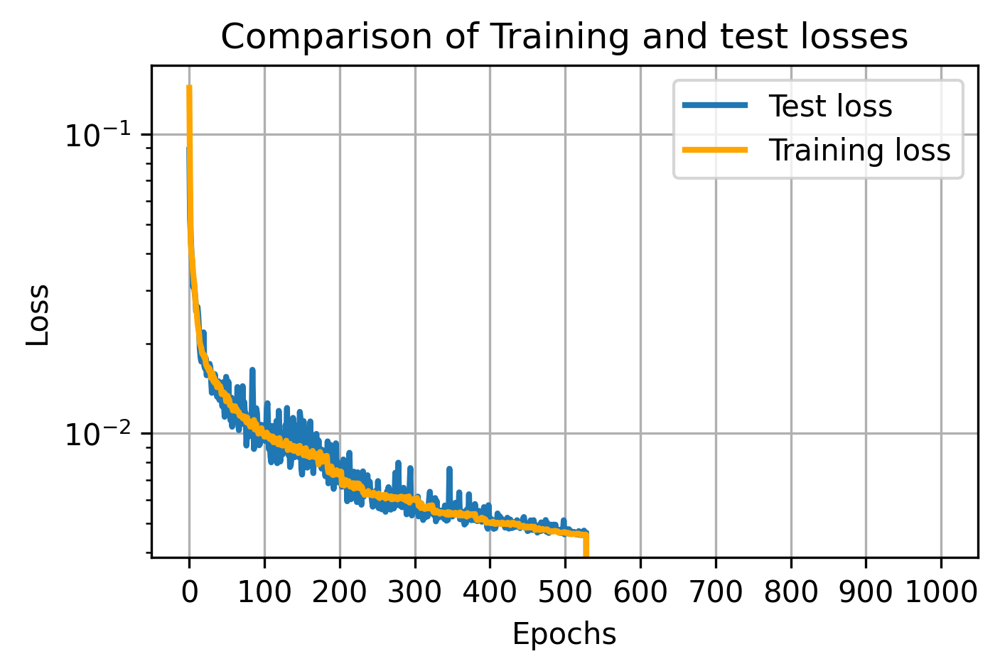

 53%|███████████████████                 | 530/1000 [1:47:05<1:35:29, 12.19s/it]

Epoch:530 
 Training time for  epoch 530: 0.201 minutes,Training loss:  0.004577605720905806, Testing loss: 0.004618028406985104


 53%|███████████████████                 | 531/1000 [1:47:17<1:35:03, 12.16s/it]

Epoch:531 
 Training time for  epoch 531: 0.202 minutes,Training loss:  0.004587998197540537, Testing loss: 0.004621531758457423


 53%|███████████████████▏                | 532/1000 [1:47:30<1:34:51, 12.16s/it]

Epoch:532 
 Training time for  epoch 532: 0.203 minutes,Training loss:  0.004576985580407507, Testing loss: 0.004626909391954541
Epoch 00533: reducing learning rate of group 0 to 4.3980e-05.


 53%|███████████████████▏                | 533/1000 [1:47:42<1:34:32, 12.15s/it]

Epoch:533 
 Training time for  epoch 533: 0.202 minutes,Training loss:  0.004577896717836287, Testing loss: 0.004770929301157594


 53%|███████████████████▏                | 534/1000 [1:47:54<1:34:07, 12.12s/it]

Epoch:534 
 Training time for  epoch 534: 0.201 minutes,Training loss:  0.004560700980903155, Testing loss: 0.004678896013647318


 54%|███████████████████▎                | 535/1000 [1:48:06<1:33:42, 12.09s/it]

Epoch:535 
 Training time for  epoch 535: 0.2 minutes,Training loss:  0.004558334373690525, Testing loss: 0.004610965889878571


 54%|███████████████████▎                | 536/1000 [1:48:18<1:33:24, 12.08s/it]

Epoch:536 
 Training time for  epoch 536: 0.201 minutes,Training loss:  0.004553595371760697, Testing loss: 0.004603266171179712


 54%|███████████████████▎                | 537/1000 [1:48:30<1:33:08, 12.07s/it]

Epoch:537 
 Training time for  epoch 537: 0.201 minutes,Training loss:  0.004552022808444503, Testing loss: 0.004626925438642502


 54%|███████████████████▎                | 538/1000 [1:48:42<1:33:03, 12.09s/it]

Epoch:538 
 Training time for  epoch 538: 0.202 minutes,Training loss:  0.0045568474528404615, Testing loss: 0.004580485583283007
Epoch:539 
 Training time for  epoch 539: 0.2 minutes,Training loss:  0.0045518441107902895, Testing loss: 0.004596629203297198


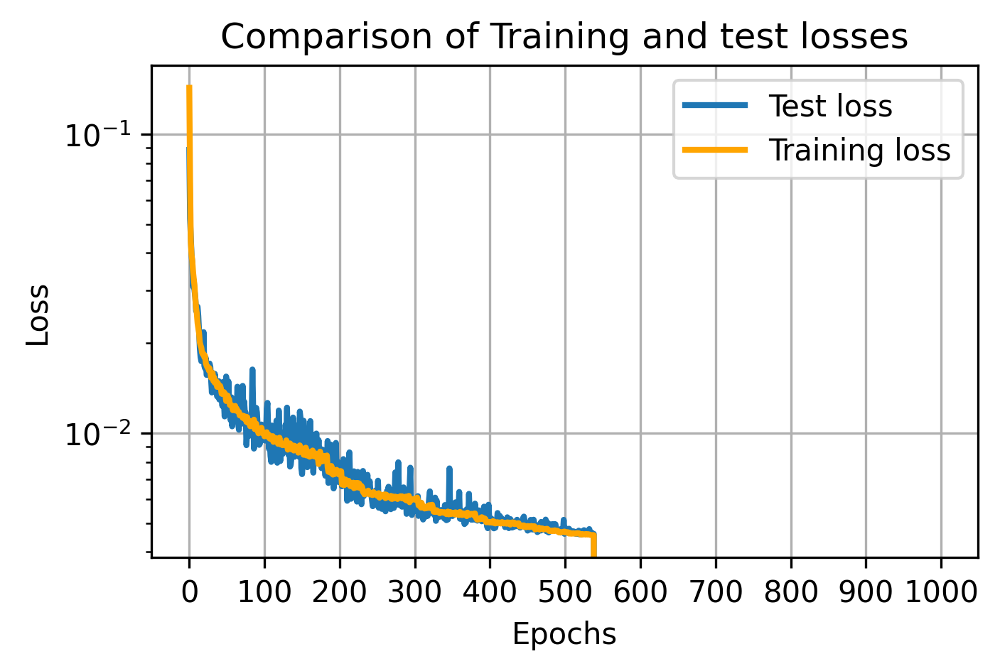

 54%|███████████████████▍                | 540/1000 [1:49:06<1:33:03, 12.14s/it]

Epoch:540 
 Training time for  epoch 540: 0.202 minutes,Training loss:  0.004557254551677304, Testing loss: 0.004674995285458863


 54%|███████████████████▍                | 541/1000 [1:49:19<1:33:08, 12.18s/it]

Epoch:541 
 Training time for  epoch 541: 0.204 minutes,Training loss:  0.004549311828755197, Testing loss: 0.004627335402183234


 54%|███████████████████▌                | 542/1000 [1:49:31<1:32:29, 12.12s/it]

Epoch:542 
 Training time for  epoch 542: 0.2 minutes,Training loss:  0.0045477919127471945, Testing loss: 0.004561651269905269


 54%|███████████████████▌                | 543/1000 [1:49:43<1:32:08, 12.10s/it]

Epoch:543 
 Training time for  epoch 543: 0.201 minutes,Training loss:  0.004552366875077443, Testing loss: 0.004656128492206335


 54%|███████████████████▌                | 544/1000 [1:49:55<1:32:07, 12.12s/it]

Epoch:544 
 Training time for  epoch 544: 0.203 minutes,Training loss:  0.0045480211619633865, Testing loss: 0.004604283538646996


 55%|███████████████████▌                | 545/1000 [1:50:07<1:31:59, 12.13s/it]

Epoch:545 
 Training time for  epoch 545: 0.203 minutes,Training loss:  0.004560832886628885, Testing loss: 0.004584296070970595


 55%|███████████████████▋                | 546/1000 [1:50:19<1:32:01, 12.16s/it]

Epoch:546 
 Training time for  epoch 546: 0.204 minutes,Training loss:  0.004538666440442239, Testing loss: 0.0045910504180938


 55%|███████████████████▋                | 547/1000 [1:50:31<1:31:34, 12.13s/it]

Epoch:547 
 Training time for  epoch 547: 0.201 minutes,Training loss:  0.004550431263616847, Testing loss: 0.004602739321999252


 55%|███████████████████▋                | 548/1000 [1:50:43<1:31:21, 12.13s/it]

Epoch:548 
 Training time for  epoch 548: 0.202 minutes,Training loss:  0.004544317852121612, Testing loss: 0.004624247271567583
Epoch:549 
 Training time for  epoch 549: 0.203 minutes,Training loss:  0.004552034212008084, Testing loss: 0.004566501607187092


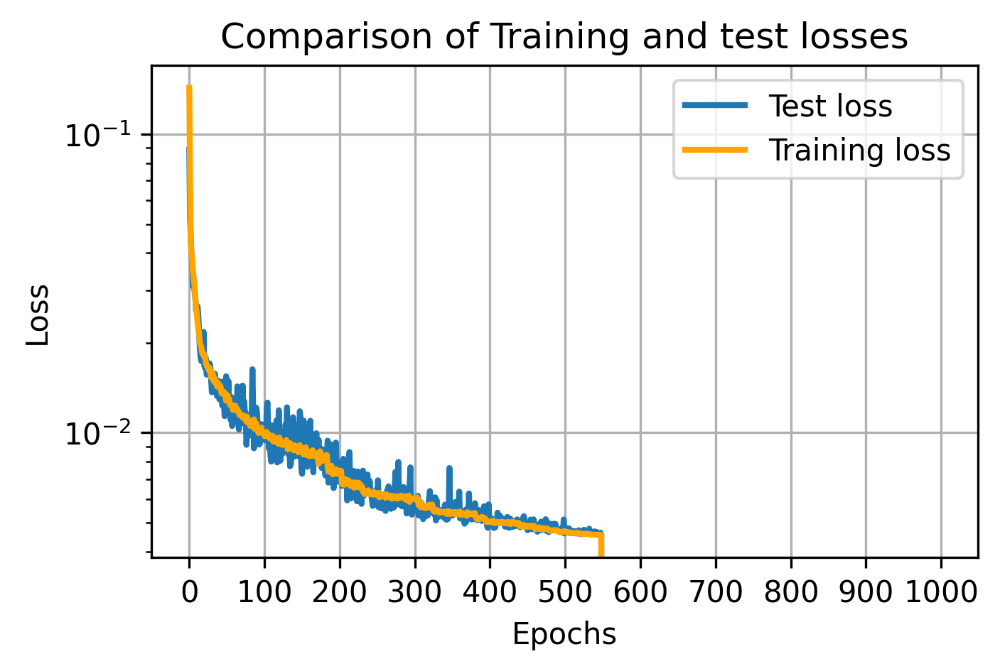

 55%|███████████████████▊                | 550/1000 [1:51:08<1:31:14, 12.17s/it]

Epoch:550 
 Training time for  epoch 550: 0.201 minutes,Training loss:  0.004547786932442939, Testing loss: 0.004618760729208589


 55%|███████████████████▊                | 551/1000 [1:51:20<1:31:00, 12.16s/it]

Epoch:551 
 Training time for  epoch 551: 0.202 minutes,Training loss:  0.004548707552109256, Testing loss: 0.00464614455588162


 55%|███████████████████▊                | 552/1000 [1:51:32<1:30:33, 12.13s/it]

Epoch:552 
 Training time for  epoch 552: 0.201 minutes,Training loss:  0.0045465356191678645, Testing loss: 0.004625773797743022


 55%|███████████████████▉                | 553/1000 [1:51:44<1:30:30, 12.15s/it]

Epoch:553 
 Training time for  epoch 553: 0.203 minutes,Training loss:  0.004545293338423753, Testing loss: 0.004618954118341207


 55%|███████████████████▉                | 554/1000 [1:51:56<1:30:15, 12.14s/it]

Epoch:554 
 Training time for  epoch 554: 0.202 minutes,Training loss:  0.004545997431270267, Testing loss: 0.00456460349727422


 56%|███████████████████▉                | 555/1000 [1:52:09<1:29:49, 12.11s/it]

Epoch:555 
 Training time for  epoch 555: 0.201 minutes,Training loss:  0.004549495318231717, Testing loss: 0.004687231029383838


 56%|████████████████████                | 556/1000 [1:52:21<1:29:54, 12.15s/it]

Epoch:556 
 Training time for  epoch 556: 0.204 minutes,Training loss:  0.004548256448280763, Testing loss: 0.00472219763789326
Epoch 00557: reducing learning rate of group 0 to 3.5184e-05.


 56%|████████████████████                | 557/1000 [1:52:33<1:29:54, 12.18s/it]

Epoch:557 
 Training time for  epoch 557: 0.204 minutes,Training loss:  0.00454379772279589, Testing loss: 0.00459069334436208


 56%|████████████████████                | 558/1000 [1:52:45<1:29:34, 12.16s/it]

Epoch:558 
 Training time for  epoch 558: 0.202 minutes,Training loss:  0.0045289099070435, Testing loss: 0.004714654753915966
Epoch:559 
 Training time for  epoch 559: 0.204 minutes,Training loss:  0.00452652241700436, Testing loss: 0.00463061461225152


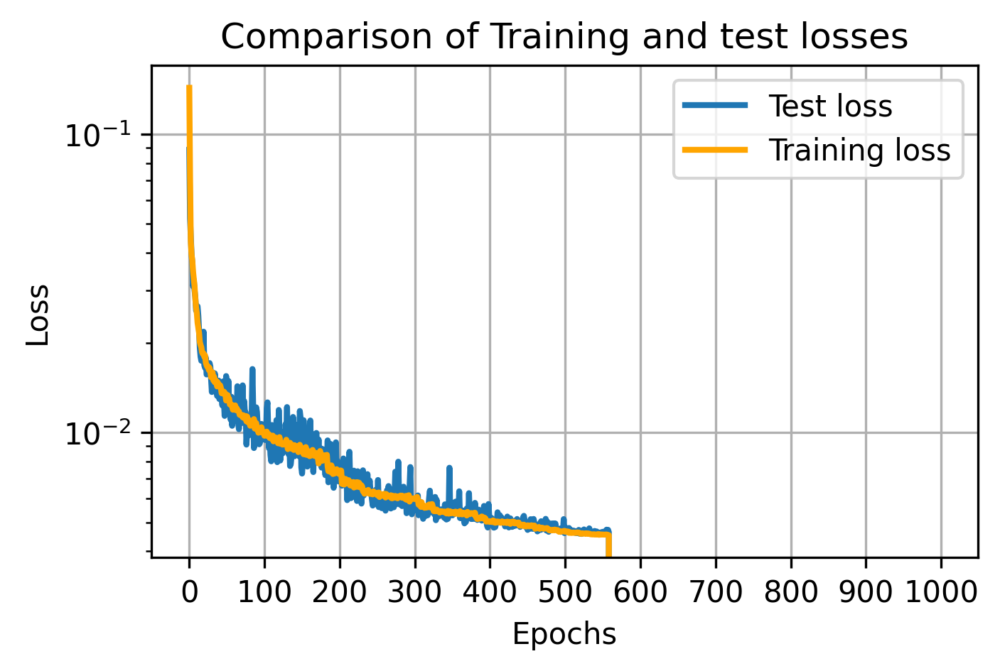

 56%|████████████████████▏               | 560/1000 [1:53:10<1:29:42, 12.23s/it]

Epoch:560 
 Training time for  epoch 560: 0.203 minutes,Training loss:  0.00453630920513625, Testing loss: 0.0045416966453194615


 56%|████████████████████▏               | 561/1000 [1:53:22<1:29:15, 12.20s/it]

Epoch:561 
 Training time for  epoch 561: 0.202 minutes,Training loss:  0.004526329211918821, Testing loss: 0.004568996750749648


 56%|████████████████████▏               | 562/1000 [1:53:34<1:29:02, 12.20s/it]

Epoch:562 
 Training time for  epoch 562: 0.203 minutes,Training loss:  0.004528293452083926, Testing loss: 0.0045524856075644495


 56%|████████████████████▎               | 563/1000 [1:53:46<1:28:25, 12.14s/it]

Epoch:563 
 Training time for  epoch 563: 0.2 minutes,Training loss:  0.004525655141515651, Testing loss: 0.004581301435828209


 56%|████████████████████▎               | 564/1000 [1:53:58<1:28:20, 12.16s/it]

Epoch:564 
 Training time for  epoch 564: 0.203 minutes,Training loss:  0.0045282248971155225, Testing loss: 0.004595653195865452


 56%|████████████████████▎               | 565/1000 [1:54:11<1:28:16, 12.18s/it]

Epoch:565 
 Training time for  epoch 565: 0.204 minutes,Training loss:  0.004530592343978731, Testing loss: 0.004586509568616748


 57%|████████████████████▍               | 566/1000 [1:54:23<1:27:54, 12.15s/it]

Epoch:566 
 Training time for  epoch 566: 0.202 minutes,Training loss:  0.004526787959136562, Testing loss: 0.004573236582800746


 57%|████████████████████▍               | 567/1000 [1:54:35<1:27:31, 12.13s/it]

Epoch:567 
 Training time for  epoch 567: 0.201 minutes,Training loss:  0.004526026376591223, Testing loss: 0.0045466496655717495


 57%|████████████████████▍               | 568/1000 [1:54:47<1:27:08, 12.10s/it]

Epoch:568 
 Training time for  epoch 568: 0.201 minutes,Training loss:  0.00453796635249913, Testing loss: 0.004541957313194871
Epoch:569 
 Training time for  epoch 569: 0.201 minutes,Training loss:  0.004525523777709328, Testing loss: 0.004573021121323109


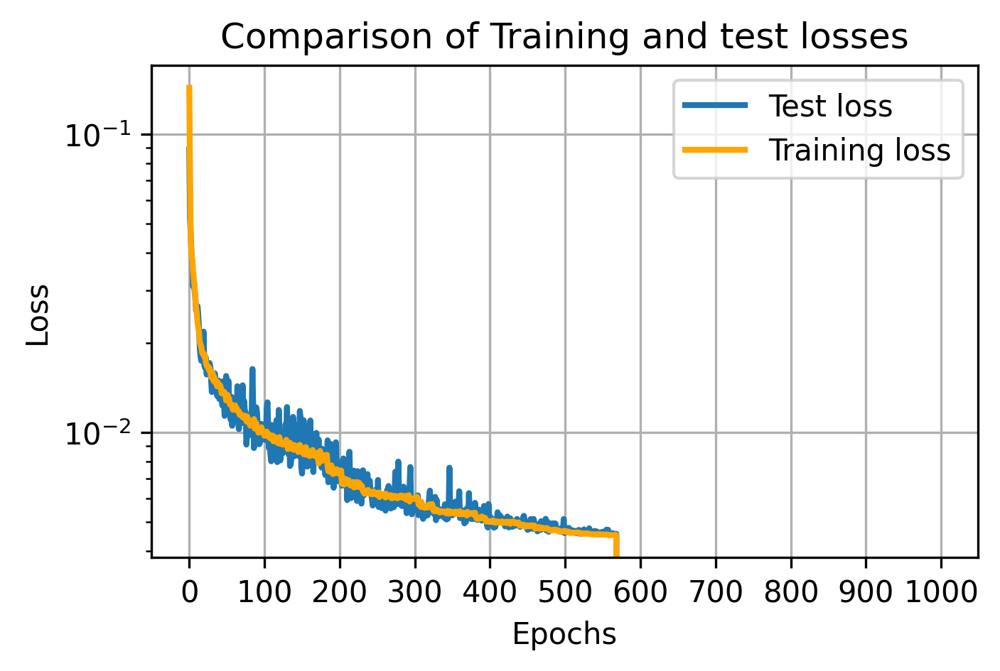

 57%|████████████████████▌               | 570/1000 [1:55:11<1:26:49, 12.11s/it]

Epoch:570 
 Training time for  epoch 570: 0.2 minutes,Training loss:  0.004535084685773678, Testing loss: 0.004550188994035125


 57%|████████████████████▌               | 571/1000 [1:55:23<1:26:26, 12.09s/it]

Epoch:571 
 Training time for  epoch 571: 0.2 minutes,Training loss:  0.004527053861737113, Testing loss: 0.0045619204686954615


 57%|████████████████████▌               | 572/1000 [1:55:35<1:26:10, 12.08s/it]

Epoch:572 
 Training time for  epoch 572: 0.201 minutes,Training loss:  0.004520557692618424, Testing loss: 0.0045791824534535406


 57%|████████████████████▋               | 573/1000 [1:55:47<1:25:46, 12.05s/it]

Epoch:573 
 Training time for  epoch 573: 0.2 minutes,Training loss:  0.004522832974512454, Testing loss: 0.004583541061729193


 57%|████████████████████▋               | 574/1000 [1:55:59<1:25:23, 12.03s/it]

Epoch:574 
 Training time for  epoch 574: 0.199 minutes,Training loss:  0.004533298896640781, Testing loss: 0.004629260273650289


 57%|████████████████████▋               | 575/1000 [1:56:11<1:25:31, 12.07s/it]

Epoch:575 
 Training time for  epoch 575: 0.203 minutes,Training loss:  0.004516594065407358, Testing loss: 0.004547412707470357


 58%|████████████████████▋               | 576/1000 [1:56:23<1:25:14, 12.06s/it]

Epoch:576 
 Training time for  epoch 576: 0.201 minutes,Training loss:  0.004530592659287128, Testing loss: 0.00456284673884511


 58%|████████████████████▊               | 577/1000 [1:56:35<1:25:05, 12.07s/it]

Epoch:577 
 Training time for  epoch 577: 0.201 minutes,Training loss:  0.004520110969305142, Testing loss: 0.004624078869819641


 58%|████████████████████▊               | 578/1000 [1:56:48<1:25:04, 12.10s/it]

Epoch:578 
 Training time for  epoch 578: 0.203 minutes,Training loss:  0.004524423961736409, Testing loss: 0.004582072435878218
Epoch:579 
 Training time for  epoch 579: 0.202 minutes,Training loss:  0.004520911669291547, Testing loss: 0.0045997456554323435


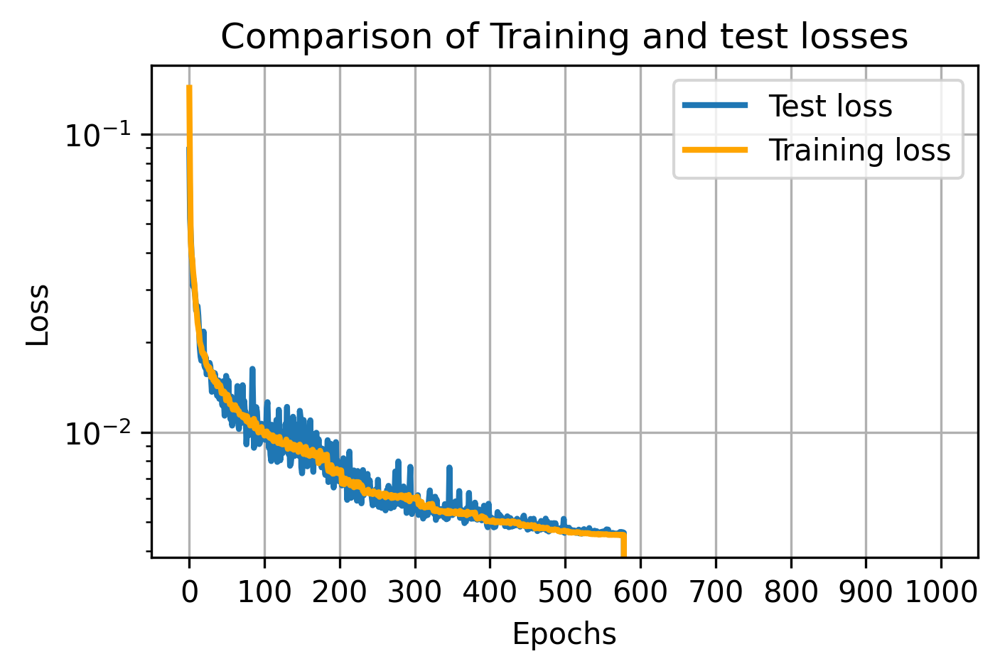

 58%|████████████████████▉               | 580/1000 [1:57:12<1:25:09, 12.16s/it]

Epoch:580 
 Training time for  epoch 580: 0.202 minutes,Training loss:  0.004525273445556665, Testing loss: 0.004548027110286057


 58%|████████████████████▉               | 581/1000 [1:57:24<1:24:51, 12.15s/it]

Epoch:581 
 Training time for  epoch 581: 0.202 minutes,Training loss:  0.004520913812631479, Testing loss: 0.004573289873078466


 58%|████████████████████▉               | 582/1000 [1:57:36<1:24:45, 12.17s/it]

Epoch:582 
 Training time for  epoch 582: 0.203 minutes,Training loss:  0.004520063367742574, Testing loss: 0.004551857840269804


 58%|████████████████████▉               | 583/1000 [1:57:48<1:24:21, 12.14s/it]

Epoch:583 
 Training time for  epoch 583: 0.201 minutes,Training loss:  0.004527519344007132, Testing loss: 0.004546646606177092


 58%|█████████████████████               | 584/1000 [1:58:01<1:24:03, 12.12s/it]

Epoch:584 
 Training time for  epoch 584: 0.201 minutes,Training loss:  0.004524022068462738, Testing loss: 0.004582220804877579


 58%|█████████████████████               | 585/1000 [1:58:13<1:23:47, 12.11s/it]

Epoch:585 
 Training time for  epoch 585: 0.202 minutes,Training loss:  0.00452067451113478, Testing loss: 0.004579588547348976
Epoch 00586: reducing learning rate of group 0 to 2.8147e-05.


 59%|█████████████████████               | 586/1000 [1:58:25<1:23:31, 12.11s/it]

Epoch:586 
 Training time for  epoch 586: 0.201 minutes,Training loss:  0.004527951321379648, Testing loss: 0.004583061137236655


 59%|█████████████████████▏              | 587/1000 [1:58:37<1:23:15, 12.09s/it]

Epoch:587 
 Training time for  epoch 587: 0.201 minutes,Training loss:  0.004501343558733887, Testing loss: 0.004562078327871859


 59%|█████████████████████▏              | 588/1000 [1:58:49<1:22:53, 12.07s/it]

Epoch:588 
 Training time for  epoch 588: 0.2 minutes,Training loss:  0.004503263158693425, Testing loss: 0.004619661569595337
Epoch:589 
 Training time for  epoch 589: 0.201 minutes,Training loss:  0.004510989074912203, Testing loss: 0.004517780663445592


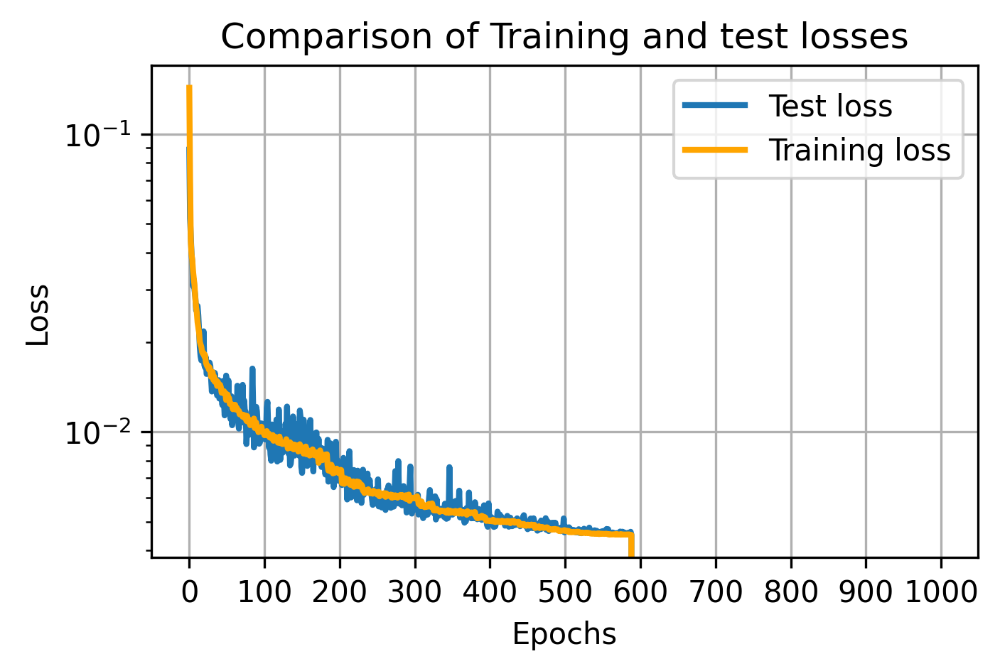

 59%|█████████████████████▏              | 590/1000 [1:59:13<1:22:38, 12.10s/it]

Epoch:590 
 Training time for  epoch 590: 0.2 minutes,Training loss:  0.004511311729238493, Testing loss: 0.00461490049958229


 59%|█████████████████████▎              | 591/1000 [1:59:25<1:22:25, 12.09s/it]

Epoch:591 
 Training time for  epoch 591: 0.201 minutes,Training loss:  0.004507254844295611, Testing loss: 0.004561712462455034


 59%|█████████████████████▎              | 592/1000 [1:59:37<1:22:27, 12.13s/it]

Epoch:592 
 Training time for  epoch 592: 0.203 minutes,Training loss:  0.004509113217908435, Testing loss: 0.004576864722184837


 59%|█████████████████████▎              | 593/1000 [1:59:50<1:22:23, 12.15s/it]

Epoch:593 
 Training time for  epoch 593: 0.203 minutes,Training loss:  0.004511357539546493, Testing loss: 0.004564873068593442


 59%|█████████████████████▍              | 594/1000 [2:00:02<1:22:07, 12.14s/it]

Epoch:594 
 Training time for  epoch 594: 0.202 minutes,Training loss:  0.004512062129422884, Testing loss: 0.00455708047375083


 60%|█████████████████████▍              | 595/1000 [2:00:14<1:21:54, 12.13s/it]

Epoch:595 
 Training time for  epoch 595: 0.202 minutes,Training loss:  0.004503722955947623, Testing loss: 0.004655046290718019


 60%|█████████████████████▍              | 596/1000 [2:00:26<1:21:35, 12.12s/it]

Epoch:596 
 Training time for  epoch 596: 0.201 minutes,Training loss:  0.004509556381968602, Testing loss: 0.004535943139344454


 60%|█████████████████████▍              | 597/1000 [2:00:38<1:21:30, 12.13s/it]

Epoch:597 
 Training time for  epoch 597: 0.203 minutes,Training loss:  0.004503865780375906, Testing loss: 0.0045355921005830165
Epoch 00598: reducing learning rate of group 0 to 2.2518e-05.


 60%|█████████████████████▌              | 598/1000 [2:00:50<1:21:17, 12.13s/it]

Epoch:598 
 Training time for  epoch 598: 0.202 minutes,Training loss:  0.00450123179137153, Testing loss: 0.004562286296859384
Epoch:599 
 Training time for  epoch 599: 0.201 minutes,Training loss:  0.004499505285625795, Testing loss: 0.004592891475185752


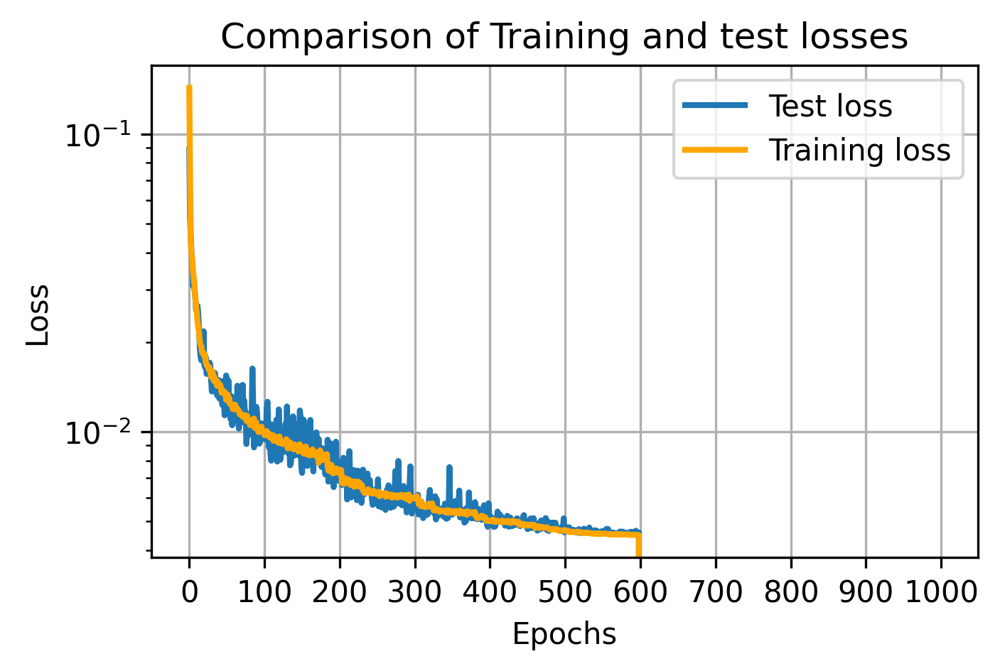

 60%|█████████████████████▌              | 600/1000 [2:01:15<1:20:57, 12.14s/it]

Epoch:600 
 Training time for  epoch 600: 0.201 minutes,Training loss:  0.004497046099162285, Testing loss: 0.004548654886893928


 60%|█████████████████████▋              | 601/1000 [2:01:27<1:20:40, 12.13s/it]

Epoch:601 
 Training time for  epoch 601: 0.202 minutes,Training loss:  0.004494281699578088, Testing loss: 0.00453805195633322


 60%|█████████████████████▋              | 602/1000 [2:01:39<1:20:23, 12.12s/it]

Epoch:602 
 Training time for  epoch 602: 0.201 minutes,Training loss:  0.004494399219560983, Testing loss: 0.004527071053162217


 60%|█████████████████████▋              | 603/1000 [2:01:51<1:20:07, 12.11s/it]

Epoch:603 
 Training time for  epoch 603: 0.201 minutes,Training loss:  0.004492953173063358, Testing loss: 0.004541211109608412


 60%|█████████████████████▋              | 604/1000 [2:02:03<1:19:44, 12.08s/it]

Epoch:604 
 Training time for  epoch 604: 0.2 minutes,Training loss:  0.004493659714011867, Testing loss: 0.004526935904286802


 60%|█████████████████████▊              | 605/1000 [2:02:15<1:19:31, 12.08s/it]

Epoch:605 
 Training time for  epoch 605: 0.201 minutes,Training loss:  0.004490944045529842, Testing loss: 0.004546230095438659


 61%|█████████████████████▊              | 606/1000 [2:02:27<1:19:13, 12.06s/it]

Epoch:606 
 Training time for  epoch 606: 0.201 minutes,Training loss:  0.004491751789116451, Testing loss: 0.004562240922823548


 61%|█████████████████████▊              | 607/1000 [2:02:39<1:19:01, 12.06s/it]

Epoch:607 
 Training time for  epoch 607: 0.201 minutes,Training loss:  0.004491004859217368, Testing loss: 0.004541451060213149


 61%|█████████████████████▉              | 608/1000 [2:02:51<1:19:03, 12.10s/it]

Epoch:608 
 Training time for  epoch 608: 0.203 minutes,Training loss:  0.004489409066379745, Testing loss: 0.004556329916231334
Epoch:609 
 Training time for  epoch 609: 0.202 minutes,Training loss:  0.004488316165558068, Testing loss: 0.004532575164921582


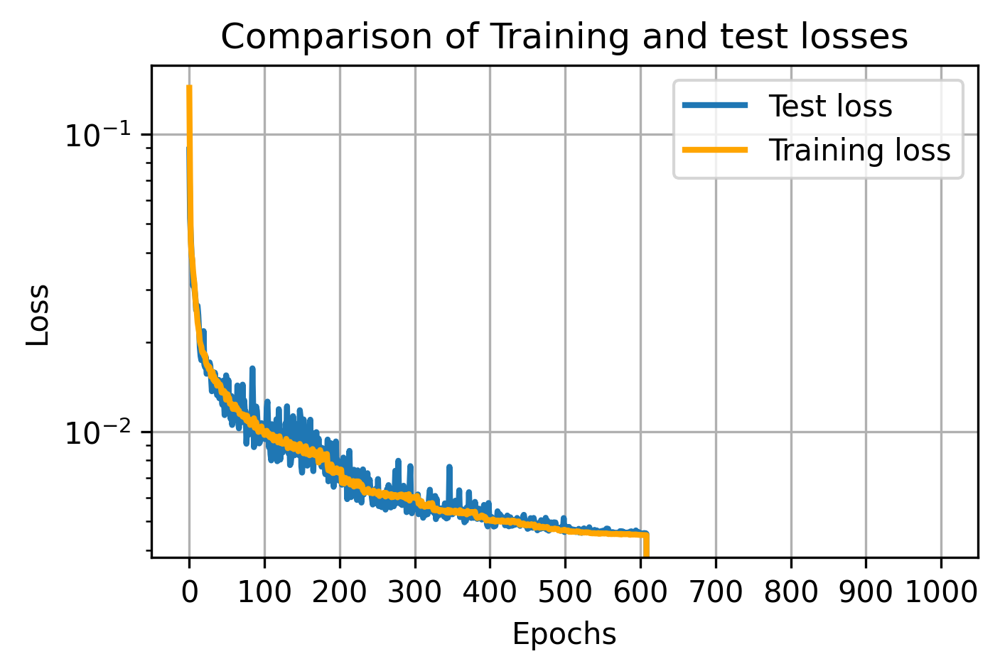

 61%|█████████████████████▉              | 610/1000 [2:03:16<1:18:50, 12.13s/it]

Epoch:610 
 Training time for  epoch 610: 0.2 minutes,Training loss:  0.004488226299149251, Testing loss: 0.004574569994583726


 61%|█████████████████████▉              | 611/1000 [2:03:28<1:18:29, 12.11s/it]

Epoch:611 
 Training time for  epoch 611: 0.201 minutes,Training loss:  0.004492412121700389, Testing loss: 0.004541425546631217


 61%|██████████████████████              | 612/1000 [2:03:40<1:18:23, 12.12s/it]

Epoch:612 
 Training time for  epoch 612: 0.203 minutes,Training loss:  0.0044839901070280325, Testing loss: 0.004552563885226846


 61%|██████████████████████              | 613/1000 [2:03:52<1:17:59, 12.09s/it]

Epoch:613 
 Training time for  epoch 613: 0.2 minutes,Training loss:  0.004493158418548907, Testing loss: 0.00452379085123539


 61%|██████████████████████              | 614/1000 [2:04:04<1:17:39, 12.07s/it]

Epoch:614 
 Training time for  epoch 614: 0.2 minutes,Training loss:  0.004493949257440943, Testing loss: 0.004547816221602261


 62%|██████████████████████▏             | 615/1000 [2:04:16<1:17:25, 12.07s/it]

Epoch:615 
 Training time for  epoch 615: 0.201 minutes,Training loss:  0.004492659520078775, Testing loss: 0.004605350554920733


 62%|██████████████████████▏             | 616/1000 [2:04:28<1:17:03, 12.04s/it]

Epoch:616 
 Training time for  epoch 616: 0.2 minutes,Training loss:  0.00449196241918246, Testing loss: 0.004590181801468134


 62%|██████████████████████▏             | 617/1000 [2:04:40<1:16:53, 12.05s/it]

Epoch:617 
 Training time for  epoch 617: 0.201 minutes,Training loss:  0.004487011033520276, Testing loss: 0.004528844701126218


 62%|██████████████████████▏             | 618/1000 [2:04:52<1:16:56, 12.09s/it]

Epoch:618 
 Training time for  epoch 618: 0.203 minutes,Training loss:  0.004489927953671617, Testing loss: 0.0046138808690011504
Epoch:619 
 Training time for  epoch 619: 0.2 minutes,Training loss:  0.004487105727987526, Testing loss: 0.0046234892448410395


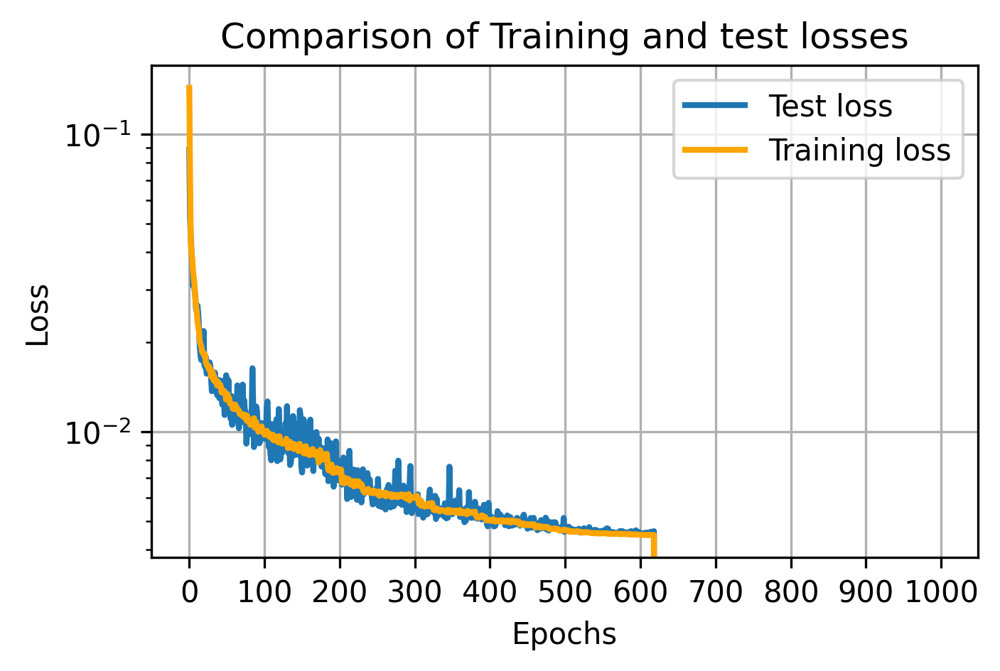

 62%|██████████████████████▎             | 620/1000 [2:05:16<1:16:46, 12.12s/it]

Epoch:620 
 Training time for  epoch 620: 0.202 minutes,Training loss:  0.004492626814809861, Testing loss: 0.004553846251219511


 62%|██████████████████████▎             | 621/1000 [2:05:29<1:16:41, 12.14s/it]

Epoch:621 
 Training time for  epoch 621: 0.203 minutes,Training loss:  0.004487610511853858, Testing loss: 0.004517125990241766


 62%|██████████████████████▍             | 622/1000 [2:05:41<1:16:12, 12.10s/it]

Epoch:622 
 Training time for  epoch 622: 0.2 minutes,Training loss:  0.004488289617997152, Testing loss: 0.004580028955824673
Epoch 00623: reducing learning rate of group 0 to 1.8014e-05.


 62%|██████████████████████▍             | 623/1000 [2:05:53<1:15:53, 12.08s/it]

Epoch:623 
 Training time for  epoch 623: 0.201 minutes,Training loss:  0.0044879764296832676, Testing loss: 0.0046349532715976235


 62%|██████████████████████▍             | 624/1000 [2:06:05<1:15:33, 12.06s/it]

Epoch:624 
 Training time for  epoch 624: 0.2 minutes,Training loss:  0.004485944260839853, Testing loss: 0.00452064489480108


 62%|██████████████████████▌             | 625/1000 [2:06:17<1:15:12, 12.03s/it]

Epoch:625 
 Training time for  epoch 625: 0.2 minutes,Training loss:  0.00447848346408859, Testing loss: 0.004539428963325918


 63%|██████████████████████▌             | 626/1000 [2:06:29<1:15:01, 12.04s/it]

Epoch:626 
 Training time for  epoch 626: 0.201 minutes,Training loss:  0.004475659509616689, Testing loss: 0.004556262171827257


 63%|██████████████████████▌             | 627/1000 [2:06:41<1:14:46, 12.03s/it]

Epoch:627 
 Training time for  epoch 627: 0.2 minutes,Training loss:  0.004477418905327424, Testing loss: 0.004536186531186104


 63%|██████████████████████▌             | 628/1000 [2:06:53<1:14:27, 12.01s/it]

Epoch:628 
 Training time for  epoch 628: 0.199 minutes,Training loss:  0.004477710934717135, Testing loss: 0.00460217772051692
Epoch:629 
 Training time for  epoch 629: 0.202 minutes,Training loss:  0.004480889024327614, Testing loss: 0.004555756519548595


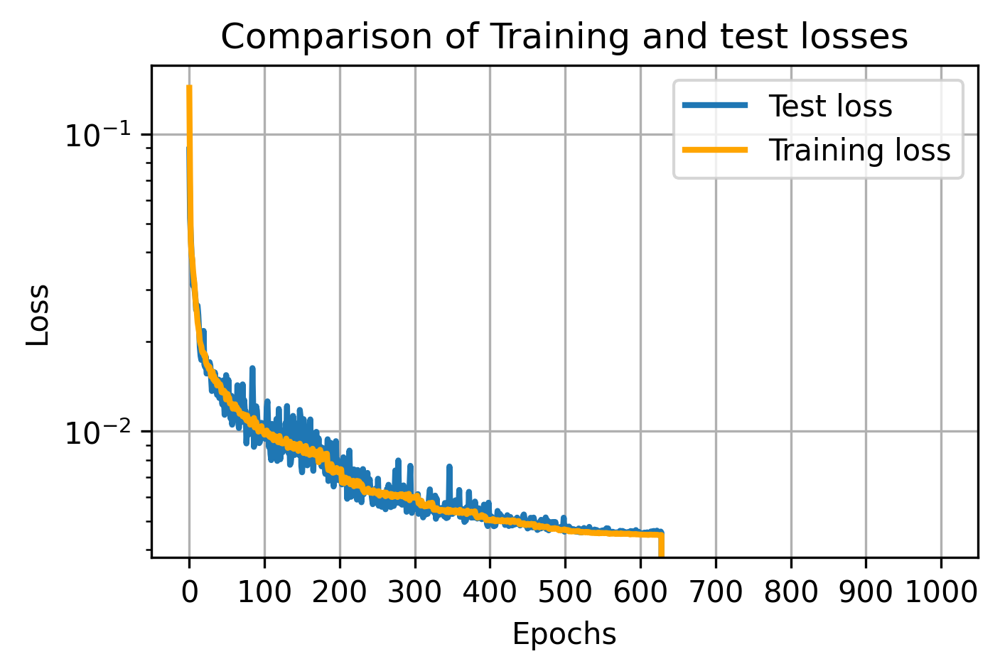

 63%|██████████████████████▋             | 630/1000 [2:07:17<1:14:40, 12.11s/it]

Epoch:630 
 Training time for  epoch 630: 0.202 minutes,Training loss:  0.004477549929758069, Testing loss: 0.004568508728407323


 63%|██████████████████████▋             | 631/1000 [2:07:29<1:14:21, 12.09s/it]

Epoch:631 
 Training time for  epoch 631: 0.201 minutes,Training loss:  0.00448138115150934, Testing loss: 0.004522439101710915


 63%|██████████████████████▊             | 632/1000 [2:07:41<1:14:01, 12.07s/it]

Epoch:632 
 Training time for  epoch 632: 0.2 minutes,Training loss:  0.004480674974274206, Testing loss: 0.004556499710306525


 63%|██████████████████████▊             | 633/1000 [2:07:53<1:13:51, 12.07s/it]

Epoch:633 
 Training time for  epoch 633: 0.201 minutes,Training loss:  0.004474487866066249, Testing loss: 0.004524261676706374


 63%|██████████████████████▊             | 634/1000 [2:08:05<1:13:32, 12.06s/it]

Epoch:634 
 Training time for  epoch 634: 0.2 minutes,Training loss:  0.004480402971024038, Testing loss: 0.004562901183962822


 64%|██████████████████████▊             | 635/1000 [2:08:17<1:13:23, 12.06s/it]

Epoch:635 
 Training time for  epoch 635: 0.201 minutes,Training loss:  0.004475222947833136, Testing loss: 0.004568772306665778


 64%|██████████████████████▉             | 636/1000 [2:08:29<1:13:08, 12.06s/it]

Epoch:636 
 Training time for  epoch 636: 0.201 minutes,Training loss:  0.0044740266915687665, Testing loss: 0.0045207393728196625


 64%|██████████████████████▉             | 637/1000 [2:08:41<1:12:52, 12.04s/it]

Epoch:637 
 Training time for  epoch 637: 0.2 minutes,Training loss:  0.0044814919826815834, Testing loss: 0.004527094676159322


 64%|██████████████████████▉             | 638/1000 [2:08:54<1:12:48, 12.07s/it]

Epoch:638 
 Training time for  epoch 638: 0.202 minutes,Training loss:  0.004477220769965119, Testing loss: 0.00451919118873775
Epoch:639 
 Training time for  epoch 639: 0.201 minutes,Training loss:  0.004484250150463013, Testing loss: 0.0045363927772268655


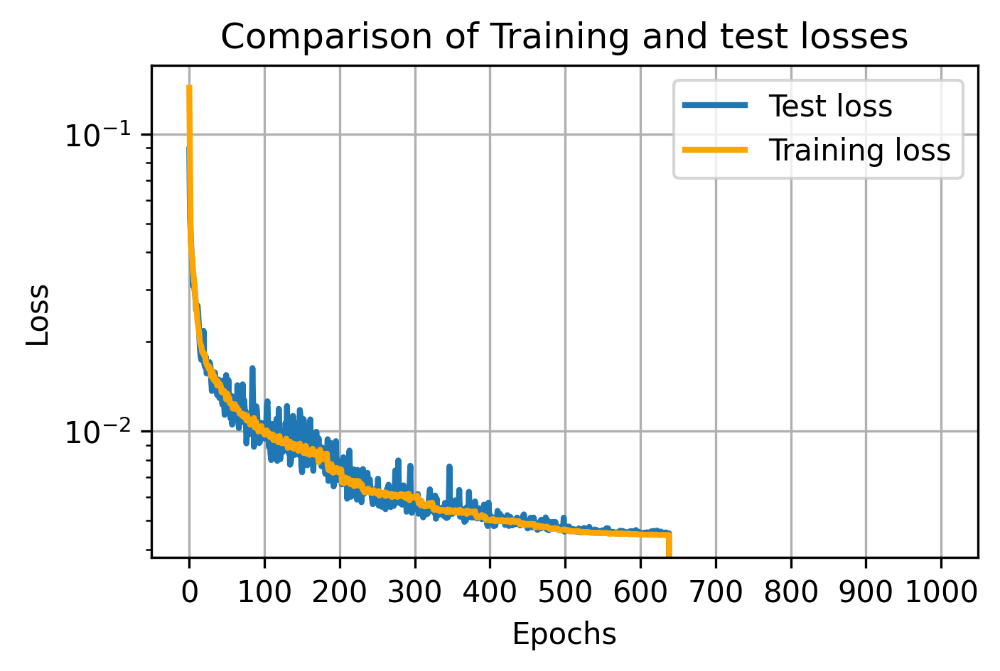

 64%|███████████████████████             | 640/1000 [2:09:18<1:12:52, 12.14s/it]

Epoch:640 
 Training time for  epoch 640: 0.202 minutes,Training loss:  0.004477670448956607, Testing loss: 0.004549632878042758


 64%|███████████████████████             | 641/1000 [2:09:30<1:12:40, 12.15s/it]

Epoch:641 
 Training time for  epoch 641: 0.202 minutes,Training loss:  0.004479140036768615, Testing loss: 0.004532175799831748


 64%|███████████████████████             | 642/1000 [2:09:42<1:12:18, 12.12s/it]

Epoch:642 
 Training time for  epoch 642: 0.201 minutes,Training loss:  0.004475910593263381, Testing loss: 0.0045888838218525055


 64%|███████████████████████▏            | 643/1000 [2:09:54<1:11:48, 12.07s/it]

Epoch:643 
 Training time for  epoch 643: 0.199 minutes,Training loss:  0.00447676308819771, Testing loss: 0.004532400383614004


 64%|███████████████████████▏            | 644/1000 [2:10:06<1:11:12, 12.00s/it]

Epoch:644 
 Training time for  epoch 644: 0.197 minutes,Training loss:  0.004477685950447683, Testing loss: 0.0045371155720204115


 64%|███████████████████████▏            | 645/1000 [2:10:18<1:10:41, 11.95s/it]

Epoch:645 
 Training time for  epoch 645: 0.197 minutes,Training loss:  0.004478657979174202, Testing loss: 0.004516375679522753


 65%|███████████████████████▎            | 646/1000 [2:10:30<1:10:19, 11.92s/it]

Epoch:646 
 Training time for  epoch 646: 0.197 minutes,Training loss:  0.0044807511228747866, Testing loss: 0.004526334814727306


 65%|███████████████████████▎            | 647/1000 [2:10:42<1:10:09, 11.92s/it]

Epoch:647 
 Training time for  epoch 647: 0.199 minutes,Training loss:  0.0044731083550489355, Testing loss: 0.004555323123931885


 65%|███████████████████████▎            | 648/1000 [2:10:54<1:10:38, 12.04s/it]

Epoch:648 
 Training time for  epoch 648: 0.205 minutes,Training loss:  0.004473938537181791, Testing loss: 0.004540950376540422
Epoch:649 
 Training time for  epoch 649: 0.203 minutes,Training loss:  0.004477096055217874, Testing loss: 0.004519703947007656


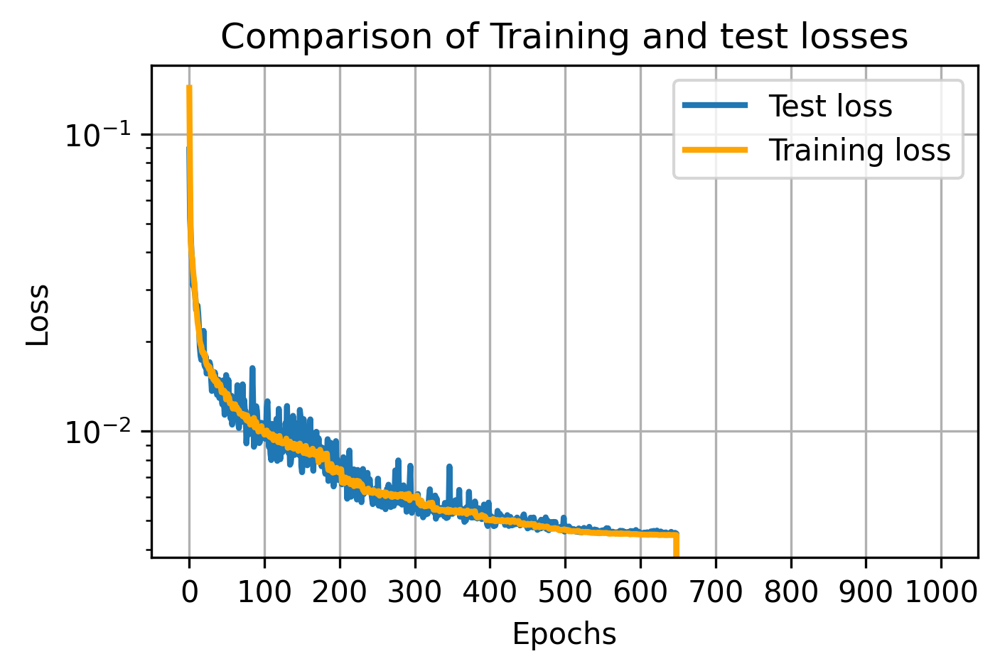

 65%|███████████████████████▍            | 650/1000 [2:11:18<1:10:50, 12.14s/it]

Epoch:650 
 Training time for  epoch 650: 0.202 minutes,Training loss:  0.004477115114339553, Testing loss: 0.004542583306320011


 65%|███████████████████████▍            | 651/1000 [2:11:31<1:10:38, 12.14s/it]

Epoch:651 
 Training time for  epoch 651: 0.202 minutes,Training loss:  0.0044753870812680625, Testing loss: 0.004582101809792221


 65%|███████████████████████▍            | 652/1000 [2:11:43<1:10:21, 12.13s/it]

Epoch:652 
 Training time for  epoch 652: 0.202 minutes,Training loss:  0.004476773147238689, Testing loss: 0.004568680636584759


 65%|███████████████████████▌            | 653/1000 [2:11:55<1:10:02, 12.11s/it]

Epoch:653 
 Training time for  epoch 653: 0.201 minutes,Training loss:  0.004476601580529972, Testing loss: 0.004529188140295446


 65%|███████████████████████▌            | 654/1000 [2:12:07<1:09:55, 12.13s/it]

Epoch:654 
 Training time for  epoch 654: 0.203 minutes,Training loss:  0.004478749691732617, Testing loss: 0.004538485654629767


 66%|███████████████████████▌            | 655/1000 [2:12:19<1:09:40, 12.12s/it]

Epoch:655 
 Training time for  epoch 655: 0.202 minutes,Training loss:  0.004478121189882981, Testing loss: 0.004534924733452499


 66%|███████████████████████▌            | 656/1000 [2:12:31<1:09:29, 12.12s/it]

Epoch:656 
 Training time for  epoch 656: 0.202 minutes,Training loss:  0.004471407591015897, Testing loss: 0.0045673305261880156


 66%|███████████████████████▋            | 657/1000 [2:12:43<1:09:20, 12.13s/it]

Epoch:657 
 Training time for  epoch 657: 0.203 minutes,Training loss:  0.004471031688510697, Testing loss: 0.004517135694622993


 66%|███████████████████████▋            | 658/1000 [2:12:55<1:08:52, 12.08s/it]

Epoch:658 
 Training time for  epoch 658: 0.2 minutes,Training loss:  0.00447046955799712, Testing loss: 0.00457104557659477
Epoch:659 
 Training time for  epoch 659: 0.2 minutes,Training loss:  0.004476508425286907, Testing loss: 0.004514477346092462


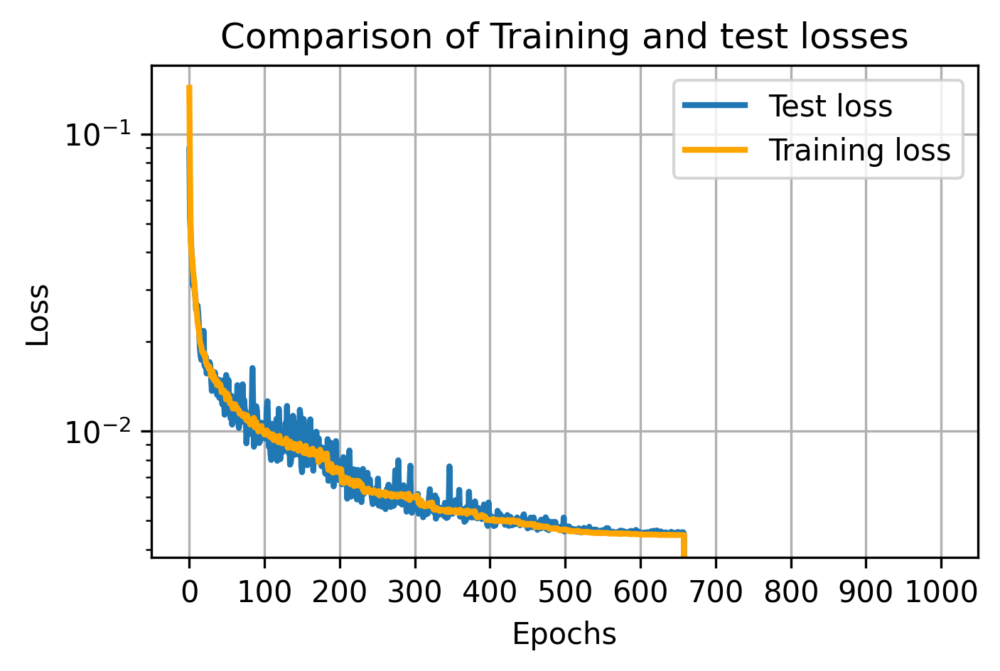

 66%|███████████████████████▊            | 660/1000 [2:13:20<1:08:38, 12.11s/it]

Epoch:660 
 Training time for  epoch 660: 0.201 minutes,Training loss:  0.004475156025113008, Testing loss: 0.0045815853029489515


 66%|███████████████████████▊            | 661/1000 [2:13:32<1:08:21, 12.10s/it]

Epoch:661 
 Training time for  epoch 661: 0.201 minutes,Training loss:  0.004477755308019281, Testing loss: 0.004527184283360839


 66%|███████████████████████▊            | 662/1000 [2:13:44<1:08:10, 12.10s/it]

Epoch:662 
 Training time for  epoch 662: 0.202 minutes,Training loss:  0.004476921744839344, Testing loss: 0.0045763242663815614


 66%|███████████████████████▊            | 663/1000 [2:13:56<1:07:51, 12.08s/it]

Epoch:663 
 Training time for  epoch 663: 0.201 minutes,Training loss:  0.004476012907863858, Testing loss: 0.0045523931831121444


 66%|███████████████████████▉            | 664/1000 [2:14:08<1:07:35, 12.07s/it]

Epoch:664 
 Training time for  epoch 664: 0.201 minutes,Training loss:  0.004474450588284729, Testing loss: 0.0045380068849772215


 66%|███████████████████████▉            | 665/1000 [2:14:20<1:07:34, 12.10s/it]

Epoch:665 
 Training time for  epoch 665: 0.203 minutes,Training loss:  0.004472023865335667, Testing loss: 0.004523295075632632


 67%|███████████████████████▉            | 666/1000 [2:14:32<1:07:33, 12.14s/it]

Epoch:666 
 Training time for  epoch 666: 0.203 minutes,Training loss:  0.004472992050869263, Testing loss: 0.004527183477766812


 67%|████████████████████████            | 667/1000 [2:14:44<1:07:17, 12.12s/it]

Epoch:667 
 Training time for  epoch 667: 0.202 minutes,Training loss:  0.004477010954400735, Testing loss: 0.00455727906897664


 67%|████████████████████████            | 668/1000 [2:14:56<1:07:04, 12.12s/it]

Epoch:668 
 Training time for  epoch 668: 0.202 minutes,Training loss:  0.004477516719346712, Testing loss: 0.0045368583593517545
Epoch 00669: reducing learning rate of group 0 to 1.4412e-05.
Epoch:669 
 Training time for  epoch 669: 0.201 minutes,Training loss:  0.004473773397518263, Testing loss: 0.004535717545077205


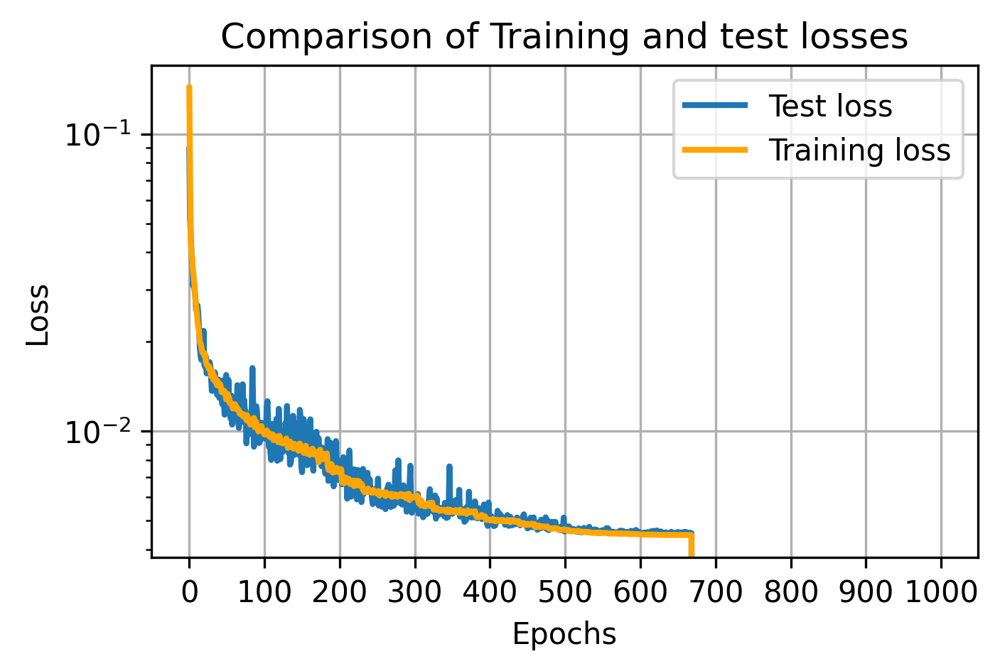

 67%|████████████████████████            | 670/1000 [2:15:21<1:07:01, 12.19s/it]

Epoch:670 
 Training time for  epoch 670: 0.203 minutes,Training loss:  0.004465723881048002, Testing loss: 0.004511843351647258


 67%|████████████████████████▏           | 671/1000 [2:15:33<1:06:52, 12.20s/it]

Epoch:671 
 Training time for  epoch 671: 0.204 minutes,Training loss:  0.004463300594581891, Testing loss: 0.004562332010827959


 67%|████████████████████████▏           | 672/1000 [2:15:45<1:06:35, 12.18s/it]

Epoch:672 
 Training time for  epoch 672: 0.202 minutes,Training loss:  0.004463219188768136, Testing loss: 0.0045341543946415186


 67%|████████████████████████▏           | 673/1000 [2:15:58<1:06:22, 12.18s/it]

Epoch:673 
 Training time for  epoch 673: 0.203 minutes,Training loss:  0.004462307522400054, Testing loss: 0.0045512769417837265


 67%|████████████████████████▎           | 674/1000 [2:16:10<1:06:01, 12.15s/it]

Epoch:674 
 Training time for  epoch 674: 0.201 minutes,Training loss:  0.0044664287402615835, Testing loss: 0.004629504783079028


 68%|████████████████████████▎           | 675/1000 [2:16:22<1:05:43, 12.13s/it]

Epoch:675 
 Training time for  epoch 675: 0.202 minutes,Training loss:  0.004464266729258806, Testing loss: 0.004521779352799058


 68%|████████████████████████▎           | 676/1000 [2:16:34<1:05:22, 12.11s/it]

Epoch:676 
 Training time for  epoch 676: 0.201 minutes,Training loss:  0.004468159216297109, Testing loss: 0.004546840670518577


 68%|████████████████████████▎           | 677/1000 [2:16:46<1:05:06, 12.09s/it]

Epoch:677 
 Training time for  epoch 677: 0.201 minutes,Training loss:  0.004465120716634857, Testing loss: 0.00451902030967176


 68%|████████████████████████▍           | 678/1000 [2:16:58<1:04:52, 12.09s/it]

Epoch:678 
 Training time for  epoch 678: 0.201 minutes,Training loss:  0.004467150986596994, Testing loss: 0.004506652089767158
Epoch:679 
 Training time for  epoch 679: 0.202 minutes,Training loss:  0.004465994337502257, Testing loss: 0.004516878775320947


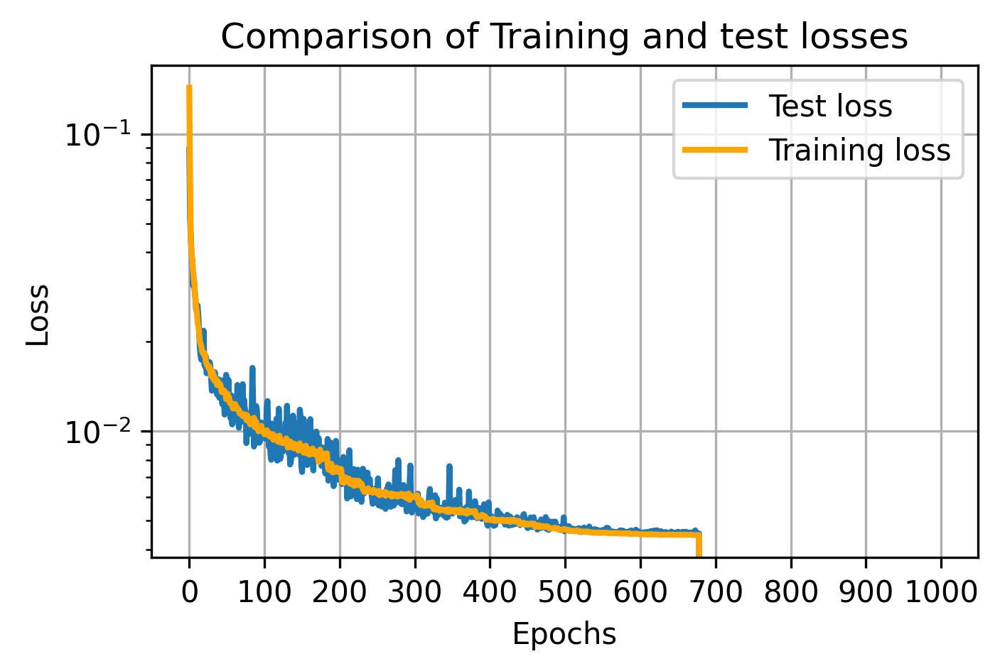

 68%|████████████████████████▍           | 680/1000 [2:17:22<1:04:52, 12.16s/it]

Epoch:680 
 Training time for  epoch 680: 0.202 minutes,Training loss:  0.004466705213806026, Testing loss: 0.004552587871439755


 68%|████████████████████████▌           | 681/1000 [2:17:35<1:04:36, 12.15s/it]

Epoch:681 
 Training time for  epoch 681: 0.202 minutes,Training loss:  0.0044647386799481, Testing loss: 0.0045334680937230585


 68%|████████████████████████▌           | 682/1000 [2:17:47<1:04:23, 12.15s/it]

Epoch:682 
 Training time for  epoch 682: 0.202 minutes,Training loss:  0.004464909311277959, Testing loss: 0.004549382659606635


 68%|████████████████████████▌           | 683/1000 [2:17:59<1:04:13, 12.16s/it]

Epoch:683 
 Training time for  epoch 683: 0.203 minutes,Training loss:  0.004463917351328919, Testing loss: 0.004529525502584874
Epoch 00684: reducing learning rate of group 0 to 1.1529e-05.


 68%|████████████████████████▌           | 684/1000 [2:18:11<1:03:51, 12.12s/it]

Epoch:684 
 Training time for  epoch 684: 0.201 minutes,Training loss:  0.004468138938938439, Testing loss: 0.004534771870821714


 68%|████████████████████████▋           | 685/1000 [2:18:23<1:03:34, 12.11s/it]

Epoch:685 
 Training time for  epoch 685: 0.201 minutes,Training loss:  0.004457217462427923, Testing loss: 0.0045358649827539925


 69%|████████████████████████▋           | 686/1000 [2:18:35<1:03:34, 12.15s/it]

Epoch:686 
 Training time for  epoch 686: 0.204 minutes,Training loss:  0.004455247277644886, Testing loss: 0.004505982198752463


 69%|████████████████████████▋           | 687/1000 [2:18:47<1:03:14, 12.12s/it]

Epoch:687 
 Training time for  epoch 687: 0.201 minutes,Training loss:  0.00445932077847499, Testing loss: 0.004542467379942536


 69%|████████████████████████▊           | 688/1000 [2:18:59<1:02:48, 12.08s/it]

Epoch:688 
 Training time for  epoch 688: 0.2 minutes,Training loss:  0.004457870117279416, Testing loss: 0.00450436226092279
Epoch:689 
 Training time for  epoch 689: 0.202 minutes,Training loss:  0.004461549094831625, Testing loss: 0.004522912227548659


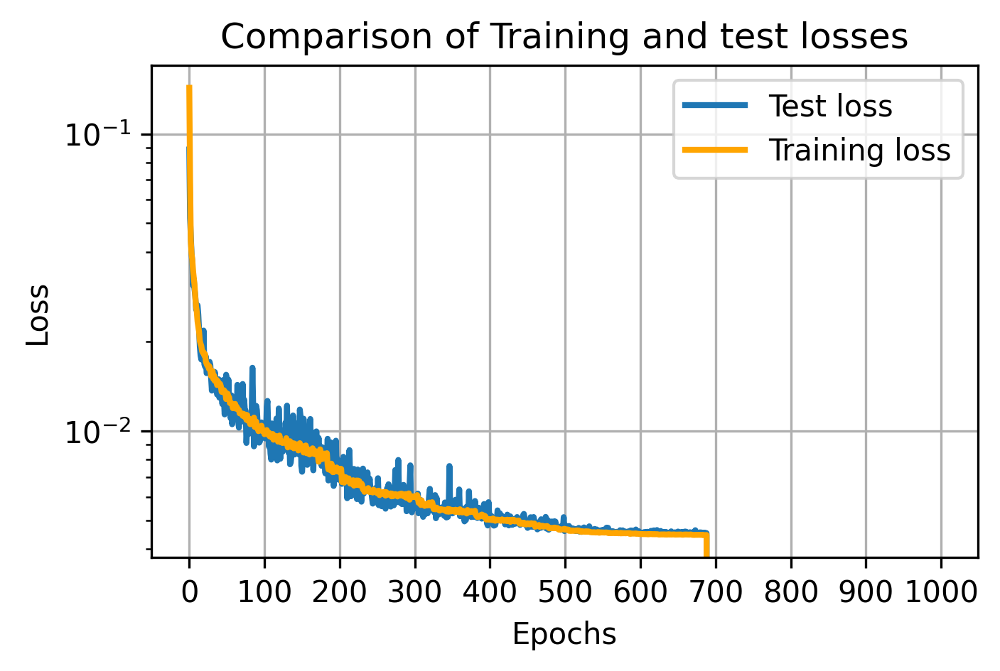

 69%|████████████████████████▊           | 690/1000 [2:19:24<1:02:31, 12.10s/it]

Epoch:690 
 Training time for  epoch 690: 0.2 minutes,Training loss:  0.00445977964062075, Testing loss: 0.0045520177623257045


 69%|████████████████████████▉           | 691/1000 [2:19:36<1:02:09, 12.07s/it]

Epoch:691 
 Training time for  epoch 691: 0.2 minutes,Training loss:  0.004458899648414447, Testing loss: 0.00453913155477494


 69%|████████████████████████▉           | 692/1000 [2:19:47<1:01:41, 12.02s/it]

Epoch:692 
 Training time for  epoch 692: 0.198 minutes,Training loss:  0.004455023333235588, Testing loss: 0.004539216379635036


 69%|████████████████████████▉           | 693/1000 [2:19:59<1:01:19, 11.99s/it]

Epoch:693 
 Training time for  epoch 693: 0.199 minutes,Training loss:  0.004458221207231145, Testing loss: 0.004506117277778685


 69%|████████████████████████▉           | 694/1000 [2:20:11<1:01:07, 11.98s/it]

Epoch:694 
 Training time for  epoch 694: 0.2 minutes,Training loss:  0.004455411000043137, Testing loss: 0.004539874456822872


 70%|█████████████████████████           | 695/1000 [2:20:23<1:01:04, 12.01s/it]

Epoch:695 
 Training time for  epoch 695: 0.201 minutes,Training loss:  0.004456910544586704, Testing loss: 0.004532067249529064


 70%|█████████████████████████           | 696/1000 [2:20:35<1:00:52, 12.02s/it]

Epoch:696 
 Training time for  epoch 696: 0.2 minutes,Training loss:  0.004459420689322167, Testing loss: 0.004514499888755381
Epoch 00697: reducing learning rate of group 0 to 9.2234e-06.


 70%|█████████████████████████           | 697/1000 [2:20:48<1:00:52, 12.05s/it]

Epoch:697 
 Training time for  epoch 697: 0.202 minutes,Training loss:  0.004457479466399682, Testing loss: 0.004535483461804688


 70%|█████████████████████████▏          | 698/1000 [2:21:00<1:00:52, 12.10s/it]

Epoch:698 
 Training time for  epoch 698: 0.203 minutes,Training loss:  0.004453630419177599, Testing loss: 0.004504366749897599
Epoch:699 
 Training time for  epoch 699: 0.202 minutes,Training loss:  0.00445366633026217, Testing loss: 0.004518193411640823


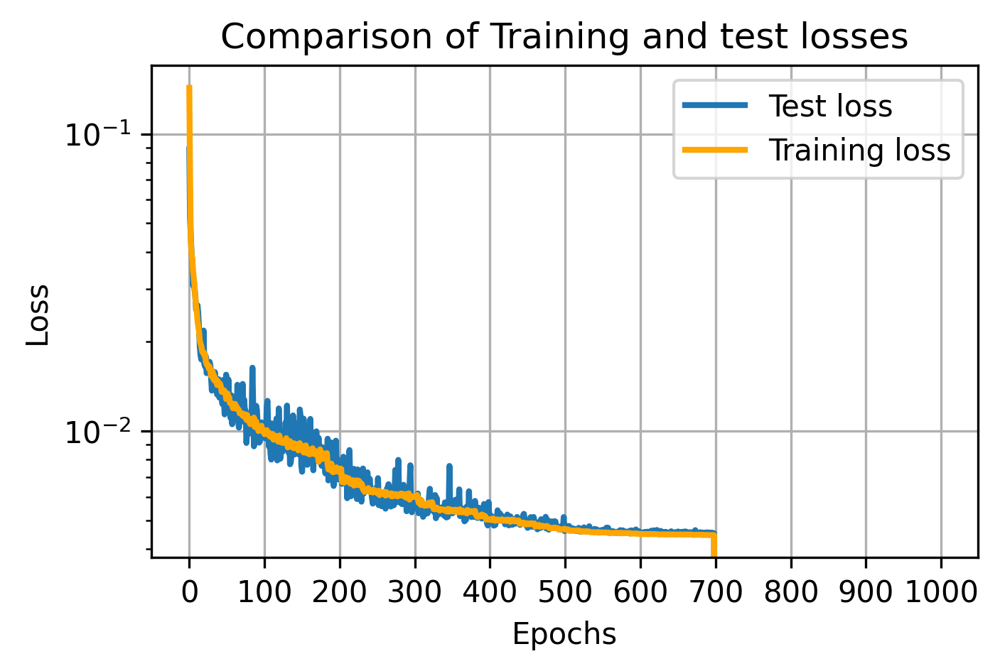

 70%|█████████████████████████▏          | 700/1000 [2:21:24<1:00:48, 12.16s/it]

Epoch:700 
 Training time for  epoch 700: 0.201 minutes,Training loss:  0.0044511446408044796, Testing loss: 0.004520008224062622


 70%|█████████████████████████▏          | 701/1000 [2:21:37<1:00:48, 12.20s/it]

Epoch:701 
 Training time for  epoch 701: 0.205 minutes,Training loss:  0.004454433268453151, Testing loss: 0.004507493176497519


 70%|█████████████████████████▎          | 702/1000 [2:21:49<1:00:36, 12.20s/it]

Epoch:702 
 Training time for  epoch 702: 0.203 minutes,Training loss:  0.004450542065363624, Testing loss: 0.004535414138808846


 70%|█████████████████████████▎          | 703/1000 [2:22:01<1:00:16, 12.18s/it]

Epoch:703 
 Training time for  epoch 703: 0.202 minutes,Training loss:  0.004453598442687529, Testing loss: 0.004518616273999214


 70%|██████████████████████████▊           | 704/1000 [2:22:13<59:52, 12.14s/it]

Epoch:704 
 Training time for  epoch 704: 0.201 minutes,Training loss:  0.00445257679263993, Testing loss: 0.004528148393146694


 70%|██████████████████████████▊           | 705/1000 [2:22:25<59:27, 12.09s/it]

Epoch:705 
 Training time for  epoch 705: 0.2 minutes,Training loss:  0.004452756237731889, Testing loss: 0.004522912106476724


 71%|██████████████████████████▊           | 706/1000 [2:22:37<58:58, 12.04s/it]

Epoch:706 
 Training time for  epoch 706: 0.198 minutes,Training loss:  0.004453671053668504, Testing loss: 0.0045259338989853855


 71%|██████████████████████████▊           | 707/1000 [2:22:49<58:43, 12.02s/it]

Epoch:707 
 Training time for  epoch 707: 0.2 minutes,Training loss:  0.004447219048547758, Testing loss: 0.00456508417148143


 71%|██████████████████████████▉           | 708/1000 [2:23:01<58:28, 12.01s/it]

Epoch:708 
 Training time for  epoch 708: 0.2 minutes,Training loss:  0.004452988995362449, Testing loss: 0.004518179600127042
Epoch:709 
 Training time for  epoch 709: 0.2 minutes,Training loss:  0.0044519511756187565, Testing loss: 0.004512961045838893


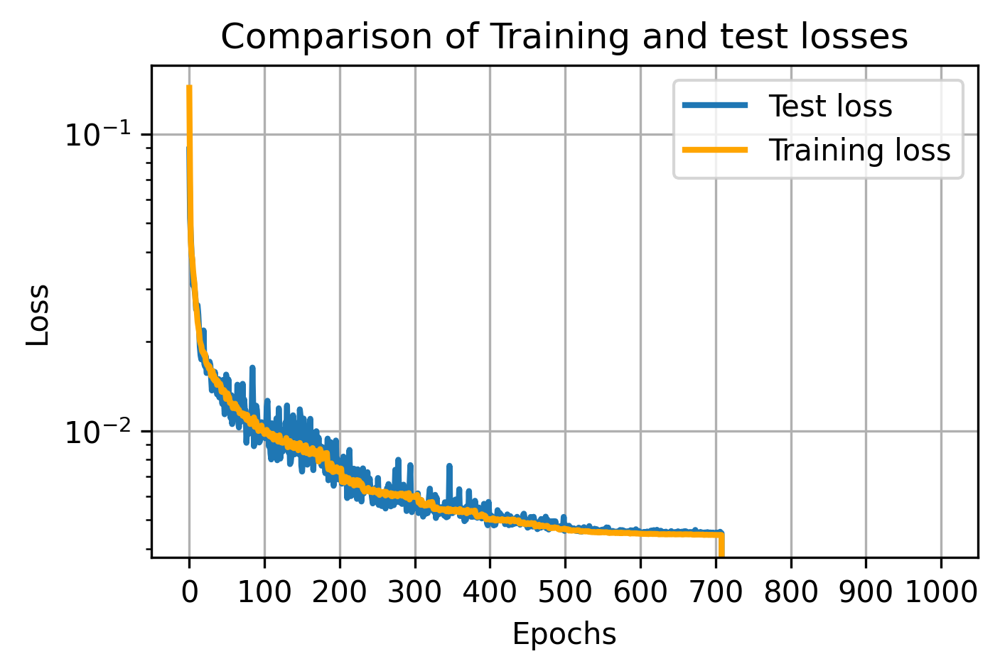

 71%|██████████████████████████▉           | 710/1000 [2:23:25<58:19, 12.07s/it]

Epoch:710 
 Training time for  epoch 710: 0.201 minutes,Training loss:  0.004453694593089954, Testing loss: 0.004517849311232567


 71%|███████████████████████████           | 711/1000 [2:23:37<57:57, 12.03s/it]

Epoch:711 
 Training time for  epoch 711: 0.199 minutes,Training loss:  0.004450747680511763, Testing loss: 0.004536180021241307


 71%|███████████████████████████           | 712/1000 [2:23:49<57:35, 12.00s/it]

Epoch:712 
 Training time for  epoch 712: 0.199 minutes,Training loss:  0.0044528379780537815, Testing loss: 0.004544995855540037


 71%|███████████████████████████           | 713/1000 [2:24:01<57:29, 12.02s/it]

Epoch:713 
 Training time for  epoch 713: 0.201 minutes,Training loss:  0.0044508799924066296, Testing loss: 0.004522151811979711


 71%|███████████████████████████▏          | 714/1000 [2:24:13<57:16, 12.01s/it]

Epoch:714 
 Training time for  epoch 714: 0.2 minutes,Training loss:  0.00445100297674355, Testing loss: 0.004524048613384366


 72%|███████████████████████████▏          | 715/1000 [2:24:25<57:04, 12.02s/it]

Epoch:715 
 Training time for  epoch 715: 0.2 minutes,Training loss:  0.004451413998006044, Testing loss: 0.004508160771802067


 72%|███████████████████████████▏          | 716/1000 [2:24:37<56:56, 12.03s/it]

Epoch:716 
 Training time for  epoch 716: 0.201 minutes,Training loss:  0.004452083274423557, Testing loss: 0.004513864913024008


 72%|███████████████████████████▏          | 717/1000 [2:24:49<56:44, 12.03s/it]

Epoch:717 
 Training time for  epoch 717: 0.201 minutes,Training loss:  0.004451225285929964, Testing loss: 0.004524798966012895
Epoch 00718: reducing learning rate of group 0 to 7.3787e-06.


 72%|███████████████████████████▎          | 718/1000 [2:25:01<56:34, 12.04s/it]

Epoch:718 
 Training time for  epoch 718: 0.201 minutes,Training loss:  0.004450108982789201, Testing loss: 0.0045144324749708175
Epoch:719 
 Training time for  epoch 719: 0.202 minutes,Training loss:  0.004450072973272163, Testing loss: 0.004520315122790635


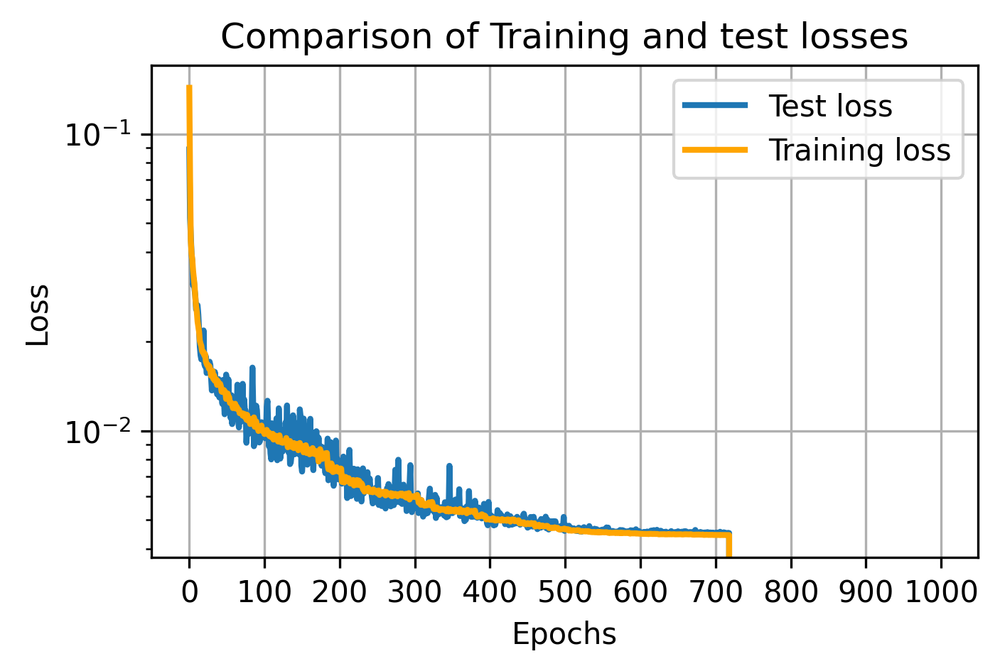

 72%|███████████████████████████▎          | 720/1000 [2:25:26<56:22, 12.08s/it]

Epoch:720 
 Training time for  epoch 720: 0.199 minutes,Training loss:  0.004448979214681842, Testing loss: 0.0045300543308258055


 72%|███████████████████████████▍          | 721/1000 [2:25:38<56:05, 12.06s/it]

Epoch:721 
 Training time for  epoch 721: 0.2 minutes,Training loss:  0.004446568656290917, Testing loss: 0.004521075673401356


 72%|███████████████████████████▍          | 722/1000 [2:25:50<55:58, 12.08s/it]

Epoch:722 
 Training time for  epoch 722: 0.202 minutes,Training loss:  0.00444493811435859, Testing loss: 0.0045149162365123625


 72%|███████████████████████████▍          | 723/1000 [2:26:02<55:58, 12.12s/it]

Epoch:723 
 Training time for  epoch 723: 0.204 minutes,Training loss:  0.004447604872180316, Testing loss: 0.004513169978745282


 72%|███████████████████████████▌          | 724/1000 [2:26:14<55:38, 12.10s/it]

Epoch:724 
 Training time for  epoch 724: 0.201 minutes,Training loss:  0.00444792998163949, Testing loss: 0.004510517050512135


 72%|███████████████████████████▌          | 725/1000 [2:26:26<55:25, 12.09s/it]

Epoch:725 
 Training time for  epoch 725: 0.201 minutes,Training loss:  0.0044462155376568556, Testing loss: 0.00452982893679291


 73%|███████████████████████████▌          | 726/1000 [2:26:38<55:10, 12.08s/it]

Epoch:726 
 Training time for  epoch 726: 0.201 minutes,Training loss:  0.004445262653504376, Testing loss: 0.004514803332276642


 73%|███████████████████████████▋          | 727/1000 [2:26:50<54:58, 12.08s/it]

Epoch:727 
 Training time for  epoch 727: 0.201 minutes,Training loss:  0.004446093068738294, Testing loss: 0.004532552799209952


 73%|███████████████████████████▋          | 728/1000 [2:27:02<54:50, 12.10s/it]

Epoch:728 
 Training time for  epoch 728: 0.202 minutes,Training loss:  0.004446939420837662, Testing loss: 0.004529365454800427
Epoch:729 
 Training time for  epoch 729: 0.201 minutes,Training loss:  0.004447648427194973, Testing loss: 0.004512802115641534


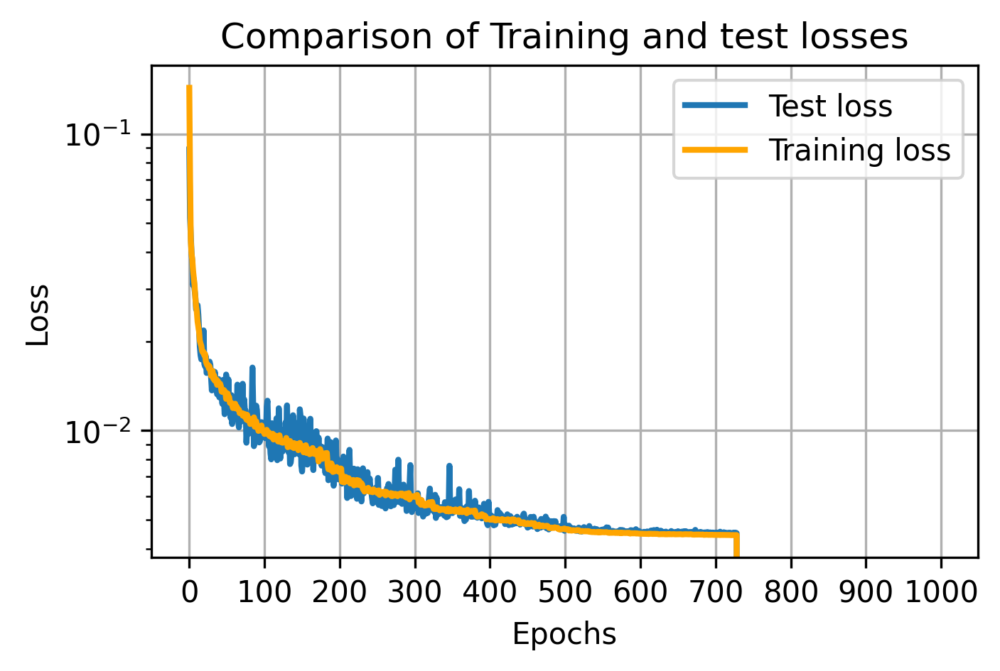

 73%|███████████████████████████▋          | 730/1000 [2:27:27<54:39, 12.14s/it]

Epoch:730 
 Training time for  epoch 730: 0.202 minutes,Training loss:  0.004447417959471371, Testing loss: 0.004510530945844948


 73%|███████████████████████████▊          | 731/1000 [2:27:39<54:18, 12.11s/it]

Epoch:731 
 Training time for  epoch 731: 0.201 minutes,Training loss:  0.004445792959773703, Testing loss: 0.004510639403015375


 73%|███████████████████████████▊          | 732/1000 [2:27:51<54:02, 12.10s/it]

Epoch:732 
 Training time for  epoch 732: 0.201 minutes,Training loss:  0.004448216071819646, Testing loss: 0.004522201209329069
Epoch 00733: reducing learning rate of group 0 to 5.9030e-06.


 73%|███████████████████████████▊          | 733/1000 [2:28:03<53:48, 12.09s/it]

Epoch:733 
 Training time for  epoch 733: 0.201 minutes,Training loss:  0.004447706402025243, Testing loss: 0.00452409875113517


 73%|███████████████████████████▉          | 734/1000 [2:28:15<53:32, 12.08s/it]

Epoch:734 
 Training time for  epoch 734: 0.201 minutes,Training loss:  0.004444188655772691, Testing loss: 0.004512207615189254


 74%|███████████████████████████▉          | 735/1000 [2:28:27<53:20, 12.08s/it]

Epoch:735 
 Training time for  epoch 735: 0.201 minutes,Training loss:  0.004443101013245863, Testing loss: 0.004503404535353184


 74%|███████████████████████████▉          | 736/1000 [2:28:39<53:04, 12.06s/it]

Epoch:736 
 Training time for  epoch 736: 0.2 minutes,Training loss:  0.004443502165031004, Testing loss: 0.004504675976932049


 74%|████████████████████████████          | 737/1000 [2:28:51<52:52, 12.06s/it]

Epoch:737 
 Training time for  epoch 737: 0.201 minutes,Training loss:  0.0044434252373536706, Testing loss: 0.004514367943629622


 74%|████████████████████████████          | 738/1000 [2:29:03<52:39, 12.06s/it]

Epoch:738 
 Training time for  epoch 738: 0.201 minutes,Training loss:  0.00444418858438211, Testing loss: 0.004511519800871611
Epoch:739 
 Training time for  epoch 739: 0.199 minutes,Training loss:  0.004443363884450926, Testing loss: 0.004506282489746809


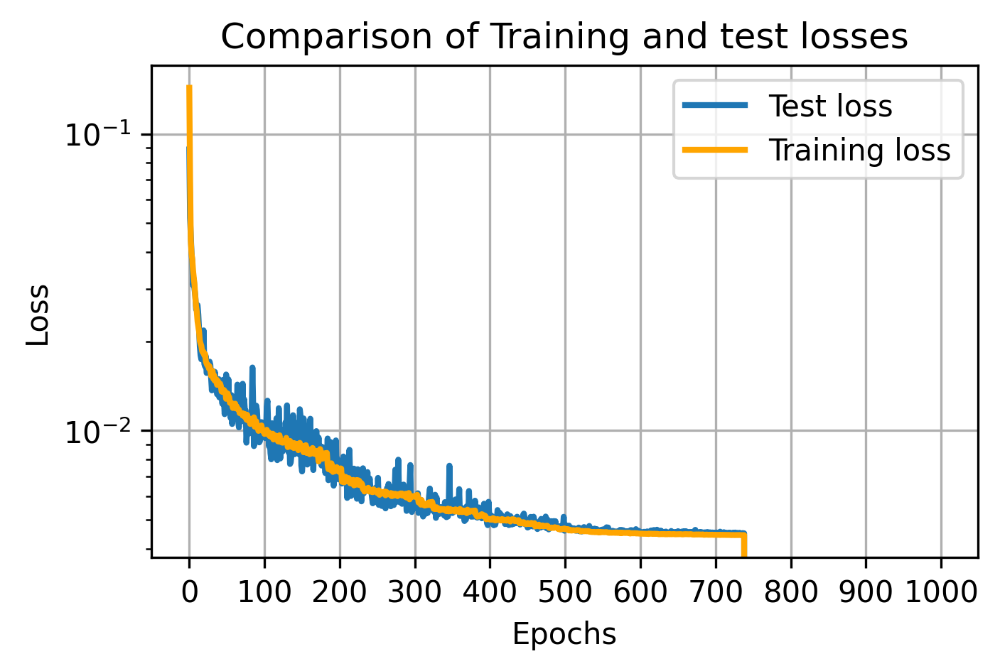

 74%|████████████████████████████          | 740/1000 [2:29:28<52:41, 12.16s/it]

Epoch:740 
 Training time for  epoch 740: 0.205 minutes,Training loss:  0.004444120675985216, Testing loss: 0.004510697317309678


 74%|████████████████████████████▏         | 741/1000 [2:29:40<52:28, 12.15s/it]

Epoch:741 
 Training time for  epoch 741: 0.202 minutes,Training loss:  0.004442930553902403, Testing loss: 0.004518908285535872


 74%|████████████████████████████▏         | 742/1000 [2:29:52<52:14, 12.15s/it]

Epoch:742 
 Training time for  epoch 742: 0.202 minutes,Training loss:  0.0044423374095899195, Testing loss: 0.0045149041106924415


 74%|████████████████████████████▏         | 743/1000 [2:30:04<51:51, 12.11s/it]

Epoch:743 
 Training time for  epoch 743: 0.2 minutes,Training loss:  0.004445073332715429, Testing loss: 0.004528128365054726


 74%|████████████████████████████▎         | 744/1000 [2:30:16<51:42, 12.12s/it]

Epoch:744 
 Training time for  epoch 744: 0.202 minutes,Training loss:  0.004443944073806795, Testing loss: 0.004518073033541441


 74%|████████████████████████████▎         | 745/1000 [2:30:28<51:31, 12.12s/it]

Epoch:745 
 Training time for  epoch 745: 0.202 minutes,Training loss:  0.004442776743437268, Testing loss: 0.004509270284324884


 75%|████████████████████████████▎         | 746/1000 [2:30:40<51:15, 12.11s/it]

Epoch:746 
 Training time for  epoch 746: 0.201 minutes,Training loss:  0.004441692080115088, Testing loss: 0.004533005240373314


 75%|████████████████████████████▍         | 747/1000 [2:30:52<51:02, 12.10s/it]

Epoch:747 
 Training time for  epoch 747: 0.202 minutes,Training loss:  0.004444930048034235, Testing loss: 0.004515202376060188


 75%|████████████████████████████▍         | 748/1000 [2:31:05<50:54, 12.12s/it]

Epoch:748 
 Training time for  epoch 748: 0.203 minutes,Training loss:  0.004442485480955462, Testing loss: 0.004520552321337163
Epoch:749 
 Training time for  epoch 749: 0.2 minutes,Training loss:  0.00444376410302056, Testing loss: 0.004506822726689279


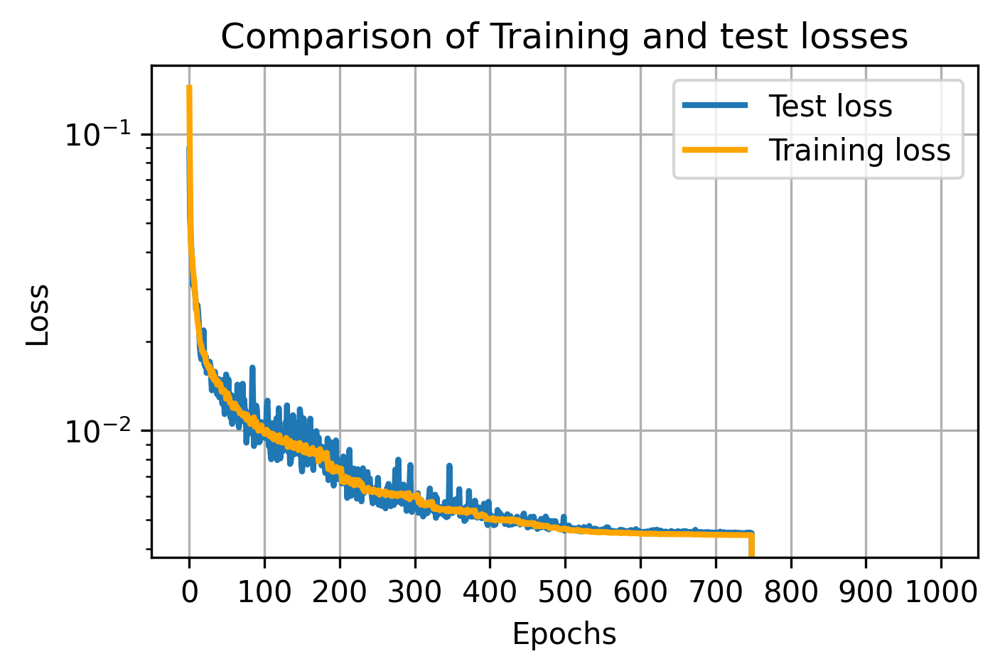

 75%|████████████████████████████▌         | 750/1000 [2:31:29<50:23, 12.10s/it]

Epoch:750 
 Training time for  epoch 750: 0.199 minutes,Training loss:  0.004441996494418445, Testing loss: 0.004516813163645566


 75%|████████████████████████████▌         | 751/1000 [2:31:41<50:05, 12.07s/it]

Epoch:751 
 Training time for  epoch 751: 0.2 minutes,Training loss:  0.0044426834045797935, Testing loss: 0.004531943779438734


 75%|████████████████████████████▌         | 752/1000 [2:31:53<49:55, 12.08s/it]

Epoch:752 
 Training time for  epoch 752: 0.202 minutes,Training loss:  0.004441266289385388, Testing loss: 0.004518407005816698


 75%|████████████████████████████▌         | 753/1000 [2:32:05<49:38, 12.06s/it]

Epoch:753 
 Training time for  epoch 753: 0.2 minutes,Training loss:  0.0044433949288071655, Testing loss: 0.004507401827722788


 75%|████████████████████████████▋         | 754/1000 [2:32:17<49:27, 12.06s/it]

Epoch:754 
 Training time for  epoch 754: 0.201 minutes,Training loss:  0.004440439506688098, Testing loss: 0.004514284683391451


 76%|████████████████████████████▋         | 755/1000 [2:32:29<49:13, 12.06s/it]

Epoch:755 
 Training time for  epoch 755: 0.201 minutes,Training loss:  0.004441547276220705, Testing loss: 0.0045082699973136185


 76%|████████████████████████████▋         | 756/1000 [2:32:41<49:04, 12.07s/it]

Epoch:756 
 Training time for  epoch 756: 0.202 minutes,Training loss:  0.004442820901756416, Testing loss: 0.004501822078600526


 76%|████████████████████████████▊         | 757/1000 [2:32:53<48:51, 12.07s/it]

Epoch:757 
 Training time for  epoch 757: 0.201 minutes,Training loss:  0.004441778288297485, Testing loss: 0.004518492678180337


 76%|████████████████████████████▊         | 758/1000 [2:33:05<48:31, 12.03s/it]

Epoch:758 
 Training time for  epoch 758: 0.199 minutes,Training loss:  0.00444304248838362, Testing loss: 0.0045132675627246495
Epoch:759 
 Training time for  epoch 759: 0.201 minutes,Training loss:  0.00444149122001229, Testing loss: 0.004500624490901828


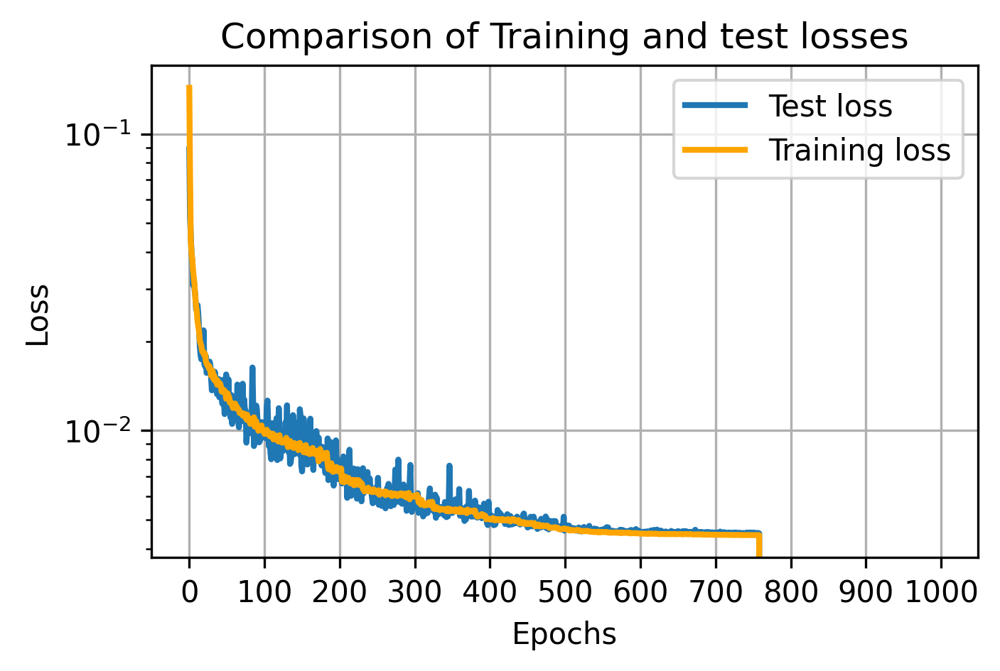

 76%|████████████████████████████▉         | 760/1000 [2:33:30<48:34, 12.14s/it]

Epoch:760 
 Training time for  epoch 760: 0.203 minutes,Training loss:  0.0044422009732665085, Testing loss: 0.0045203543221578


 76%|████████████████████████████▉         | 761/1000 [2:33:42<48:26, 12.16s/it]

Epoch:761 
 Training time for  epoch 761: 0.203 minutes,Training loss:  0.004440125828375228, Testing loss: 0.004547573300078512


 76%|████████████████████████████▉         | 762/1000 [2:33:54<48:21, 12.19s/it]

Epoch:762 
 Training time for  epoch 762: 0.204 minutes,Training loss:  0.0044413232155312956, Testing loss: 0.0045106644742190834


 76%|████████████████████████████▉         | 763/1000 [2:34:06<48:11, 12.20s/it]

Epoch:763 
 Training time for  epoch 763: 0.204 minutes,Training loss:  0.004441366730523961, Testing loss: 0.004519006432965398


 76%|█████████████████████████████         | 764/1000 [2:34:18<47:47, 12.15s/it]

Epoch:764 
 Training time for  epoch 764: 0.201 minutes,Training loss:  0.004441609839518293, Testing loss: 0.0045187169965356586
Epoch 00765: reducing learning rate of group 0 to 4.7224e-06.


 76%|█████████████████████████████         | 765/1000 [2:34:30<47:21, 12.09s/it]

Epoch:765 
 Training time for  epoch 765: 0.199 minutes,Training loss:  0.004442996459306758, Testing loss: 0.004525232594460249


 77%|█████████████████████████████         | 766/1000 [2:34:42<47:07, 12.08s/it]

Epoch:766 
 Training time for  epoch 766: 0.201 minutes,Training loss:  0.0044395564533402316, Testing loss: 0.004530834900215268


 77%|█████████████████████████████▏        | 767/1000 [2:34:54<46:49, 12.06s/it]

Epoch:767 
 Training time for  epoch 767: 0.2 minutes,Training loss:  0.004440606030355382, Testing loss: 0.004512635162100196


 77%|█████████████████████████████▏        | 768/1000 [2:35:06<46:36, 12.05s/it]

Epoch:768 
 Training time for  epoch 768: 0.201 minutes,Training loss:  0.004439827962264713, Testing loss: 0.004514368842355907
Epoch:769 
 Training time for  epoch 769: 0.202 minutes,Training loss:  0.00443820148067166, Testing loss: 0.004507305091246963


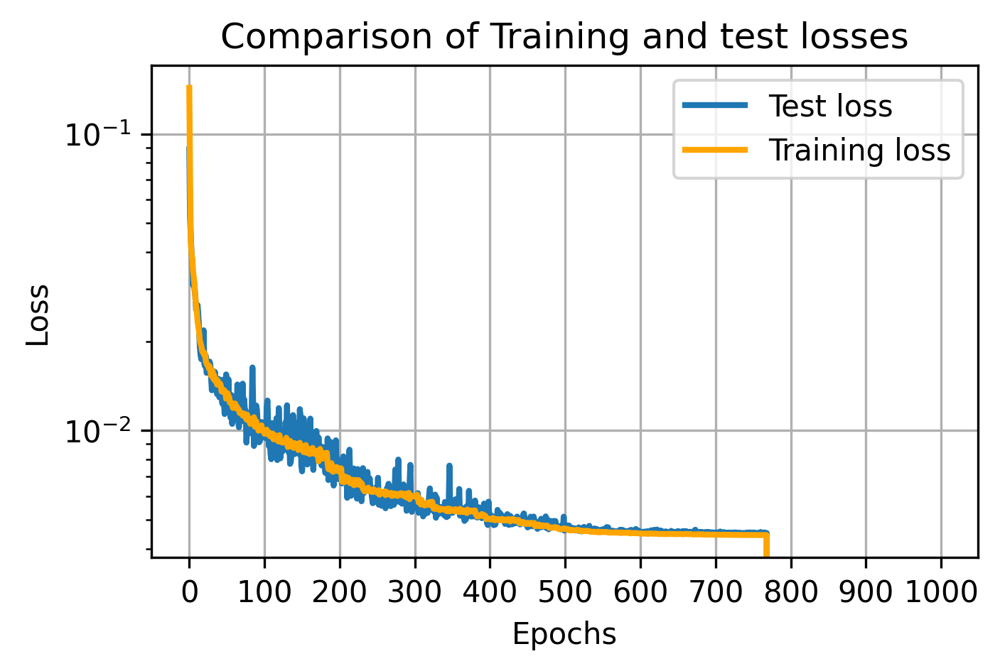

 77%|█████████████████████████████▎        | 770/1000 [2:35:31<46:27, 12.12s/it]

Epoch:770 
 Training time for  epoch 770: 0.201 minutes,Training loss:  0.004439440835754059, Testing loss: 0.00450618052855134


 77%|█████████████████████████████▎        | 771/1000 [2:35:43<46:14, 12.11s/it]

Epoch:771 
 Training time for  epoch 771: 0.202 minutes,Training loss:  0.004439557321925629, Testing loss: 0.004513963018544018


 77%|█████████████████████████████▎        | 772/1000 [2:35:55<46:05, 12.13s/it]

Epoch:772 
 Training time for  epoch 772: 0.203 minutes,Training loss:  0.004439391575442166, Testing loss: 0.004513860112056136


 77%|█████████████████████████████▎        | 773/1000 [2:36:07<45:58, 12.15s/it]

Epoch:773 
 Training time for  epoch 773: 0.203 minutes,Training loss:  0.0044397794385738105, Testing loss: 0.004506671610288322


 77%|█████████████████████████████▍        | 774/1000 [2:36:19<45:49, 12.16s/it]

Epoch:774 
 Training time for  epoch 774: 0.203 minutes,Training loss:  0.004440301746393919, Testing loss: 0.004519128161482513


 78%|█████████████████████████████▍        | 775/1000 [2:36:32<45:33, 12.15s/it]

Epoch:775 
 Training time for  epoch 775: 0.202 minutes,Training loss:  0.004438384347914368, Testing loss: 0.004533988125622272


 78%|█████████████████████████████▍        | 776/1000 [2:36:44<45:21, 12.15s/it]

Epoch:776 
 Training time for  epoch 776: 0.202 minutes,Training loss:  0.004439291687310175, Testing loss: 0.004522915231063962


 78%|█████████████████████████████▌        | 777/1000 [2:36:56<45:03, 12.12s/it]

Epoch:777 
 Training time for  epoch 777: 0.201 minutes,Training loss:  0.0044391009205915506, Testing loss: 0.004515186413191259


 78%|█████████████████████████████▌        | 778/1000 [2:37:08<44:51, 12.13s/it]

Epoch:778 
 Training time for  epoch 778: 0.202 minutes,Training loss:  0.0044378899408311825, Testing loss: 0.004511487041600049
Epoch:779 
 Training time for  epoch 779: 0.202 minutes,Training loss:  0.004440105117805536, Testing loss: 0.004512745002284646


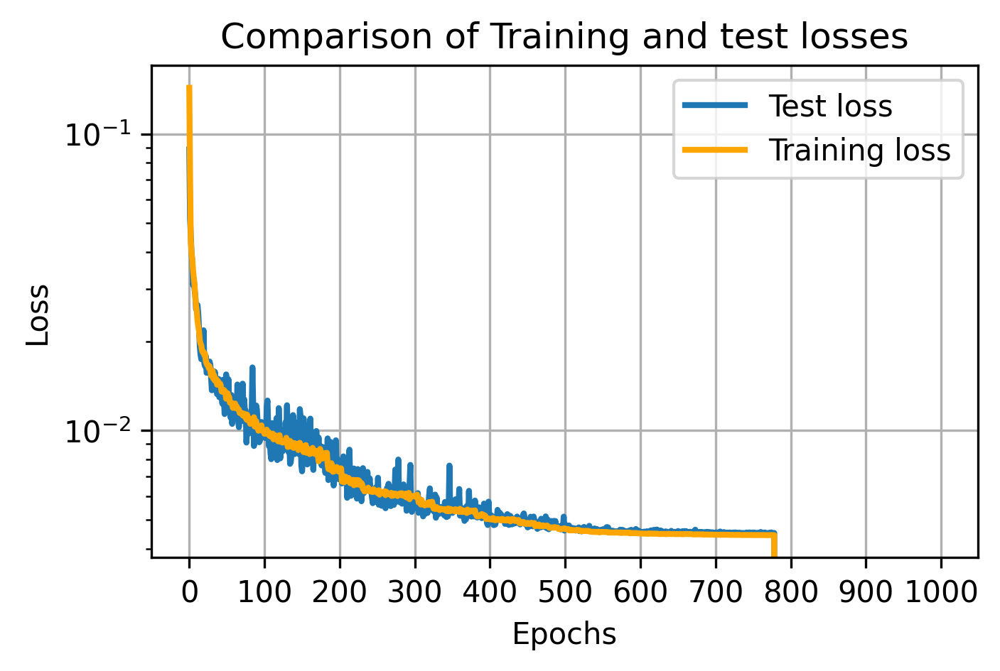

 78%|█████████████████████████████▋        | 780/1000 [2:37:32<44:37, 12.17s/it]

Epoch:780 
 Training time for  epoch 780: 0.202 minutes,Training loss:  0.004437150121325764, Testing loss: 0.00450773595366627


 78%|█████████████████████████████▋        | 781/1000 [2:37:45<44:21, 12.15s/it]

Epoch:781 
 Training time for  epoch 781: 0.202 minutes,Training loss:  0.004438752673553361, Testing loss: 0.004509404795244336


 78%|█████████████████████████████▋        | 782/1000 [2:37:57<44:06, 12.14s/it]

Epoch:782 
 Training time for  epoch 782: 0.202 minutes,Training loss:  0.004437924309446542, Testing loss: 0.004513066625222563


 78%|█████████████████████████████▊        | 783/1000 [2:38:09<43:51, 12.13s/it]

Epoch:783 
 Training time for  epoch 783: 0.202 minutes,Training loss:  0.004438391156520578, Testing loss: 0.004508375078439712


 78%|█████████████████████████████▊        | 784/1000 [2:38:21<43:38, 12.12s/it]

Epoch:784 
 Training time for  epoch 784: 0.202 minutes,Training loss:  0.004439985219488714, Testing loss: 0.004511628318578004


 78%|█████████████████████████████▊        | 785/1000 [2:38:33<43:23, 12.11s/it]

Epoch:785 
 Training time for  epoch 785: 0.201 minutes,Training loss:  0.004438820715537176, Testing loss: 0.004509969190694392


 79%|█████████████████████████████▊        | 786/1000 [2:38:45<43:11, 12.11s/it]

Epoch:786 
 Training time for  epoch 786: 0.202 minutes,Training loss:  0.004438956195389058, Testing loss: 0.004504189500585199


 79%|█████████████████████████████▉        | 787/1000 [2:38:57<42:57, 12.10s/it]

Epoch:787 
 Training time for  epoch 787: 0.201 minutes,Training loss:  0.004439639219631301, Testing loss: 0.004514763709157705


 79%|█████████████████████████████▉        | 788/1000 [2:39:09<42:42, 12.09s/it]

Epoch:788 
 Training time for  epoch 788: 0.201 minutes,Training loss:  0.004438496878128347, Testing loss: 0.004519559615291655
Epoch:789 
 Training time for  epoch 789: 0.202 minutes,Training loss:  0.004438923074215928, Testing loss: 0.0045093686040490865


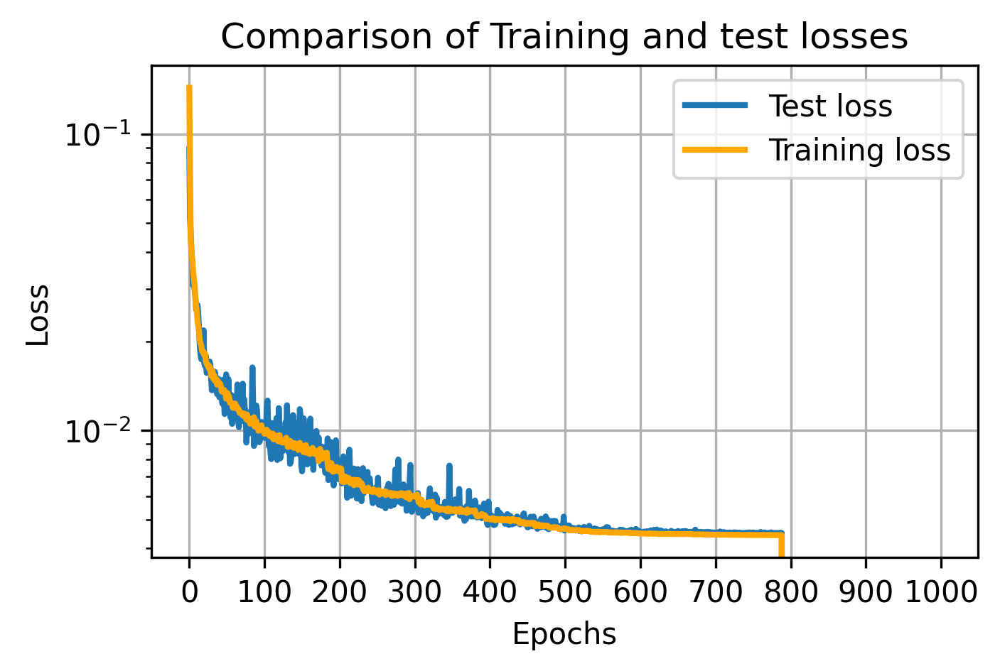

 79%|██████████████████████████████        | 790/1000 [2:39:34<42:30, 12.15s/it]

Epoch:790 
 Training time for  epoch 790: 0.202 minutes,Training loss:  0.004439596733041584, Testing loss: 0.004510933430865407


 79%|██████████████████████████████        | 791/1000 [2:39:46<42:12, 12.12s/it]

Epoch:791 
 Training time for  epoch 791: 0.201 minutes,Training loss:  0.004436446808367258, Testing loss: 0.00452573524788022


 79%|██████████████████████████████        | 792/1000 [2:39:58<42:00, 12.12s/it]

Epoch:792 
 Training time for  epoch 792: 0.202 minutes,Training loss:  0.004439329137078093, Testing loss: 0.004501989781856537


 79%|██████████████████████████████▏       | 793/1000 [2:40:10<41:51, 12.13s/it]

Epoch:793 
 Training time for  epoch 793: 0.203 minutes,Training loss:  0.004438318724556892, Testing loss: 0.0045092766871675845


 79%|██████████████████████████████▏       | 794/1000 [2:40:22<41:37, 12.13s/it]

Epoch:794 
 Training time for  epoch 794: 0.202 minutes,Training loss:  0.004439324179489023, Testing loss: 0.004515137011185289


 80%|██████████████████████████████▏       | 795/1000 [2:40:34<41:28, 12.14s/it]

Epoch:795 
 Training time for  epoch 795: 0.203 minutes,Training loss:  0.004435244179411892, Testing loss: 0.0045068703871220354


 80%|██████████████████████████████▏       | 796/1000 [2:40:46<41:16, 12.14s/it]

Epoch:796 
 Training time for  epoch 796: 0.203 minutes,Training loss:  0.004437887458115574, Testing loss: 0.004513750593177974


 80%|██████████████████████████████▎       | 797/1000 [2:40:58<41:01, 12.12s/it]

Epoch:797 
 Training time for  epoch 797: 0.201 minutes,Training loss:  0.00443651804156411, Testing loss: 0.00451305603608489


 80%|██████████████████████████████▎       | 798/1000 [2:41:11<40:51, 12.14s/it]

Epoch:798 
 Training time for  epoch 798: 0.203 minutes,Training loss:  0.004437199341345246, Testing loss: 0.004518943685106933
Epoch:799 
 Training time for  epoch 799: 0.204 minutes,Training loss:  0.004439291076704375, Testing loss: 0.004522108547389507


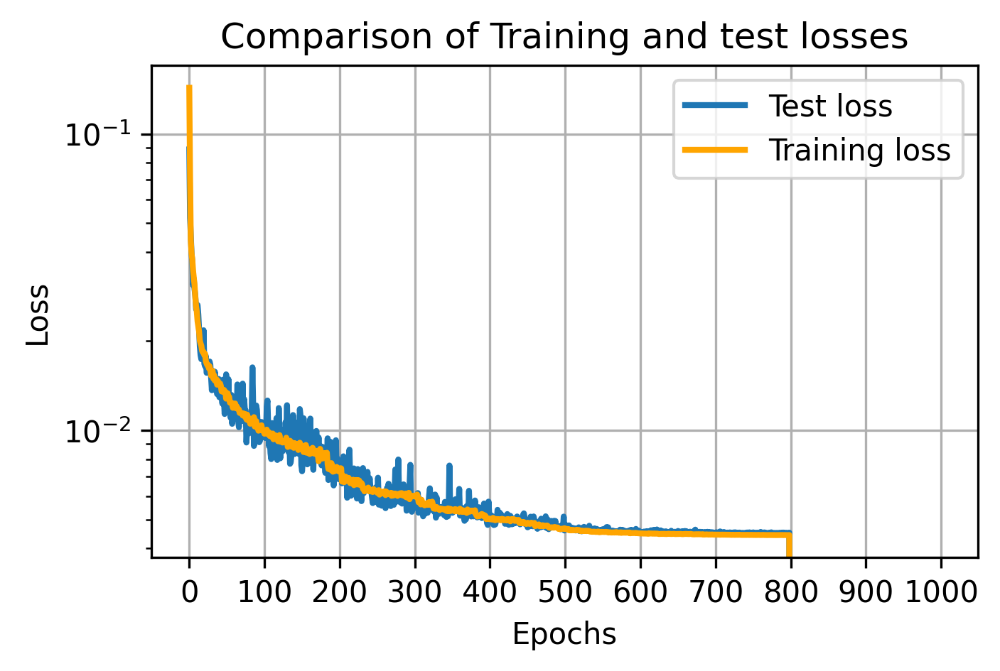

 80%|██████████████████████████████▍       | 800/1000 [2:41:35<40:37, 12.19s/it]

Epoch:800 
 Training time for  epoch 800: 0.201 minutes,Training loss:  0.00443837510445669, Testing loss: 0.004497437863610685


 80%|██████████████████████████████▍       | 801/1000 [2:41:47<40:14, 12.13s/it]

Epoch:801 
 Training time for  epoch 801: 0.2 minutes,Training loss:  0.0044362808842186, Testing loss: 0.004552796320058406


 80%|██████████████████████████████▍       | 802/1000 [2:41:59<39:52, 12.08s/it]

Epoch:802 
 Training time for  epoch 802: 0.199 minutes,Training loss:  0.004438214265805227, Testing loss: 0.004511612458154559


 80%|██████████████████████████████▌       | 803/1000 [2:42:11<39:44, 12.10s/it]

Epoch:803 
 Training time for  epoch 803: 0.202 minutes,Training loss:  0.004437565942793548, Testing loss: 0.0045229720231145625


 80%|██████████████████████████████▌       | 804/1000 [2:42:23<39:36, 12.12s/it]

Epoch:804 
 Training time for  epoch 804: 0.203 minutes,Training loss:  0.004437454044278041, Testing loss: 0.004512698547914624


 80%|██████████████████████████████▌       | 805/1000 [2:42:36<39:29, 12.15s/it]

Epoch:805 
 Training time for  epoch 805: 0.203 minutes,Training loss:  0.004438815239555138, Testing loss: 0.004512696000747382
Epoch 00806: reducing learning rate of group 0 to 3.7779e-06.


 81%|██████████████████████████████▋       | 806/1000 [2:42:48<39:10, 12.12s/it]

Epoch:806 
 Training time for  epoch 806: 0.201 minutes,Training loss:  0.004434966063072838, Testing loss: 0.004545551184564829


 81%|██████████████████████████████▋       | 807/1000 [2:43:00<39:03, 12.14s/it]

Epoch:807 
 Training time for  epoch 807: 0.203 minutes,Training loss:  0.004437707834817581, Testing loss: 0.0045036642579361795


 81%|██████████████████████████████▋       | 808/1000 [2:43:12<38:46, 12.12s/it]

Epoch:808 
 Training time for  epoch 808: 0.201 minutes,Training loss:  0.004435463467478735, Testing loss: 0.0045097494730725884
Epoch:809 
 Training time for  epoch 809: 0.202 minutes,Training loss:  0.004435726740255813, Testing loss: 0.004519169135019183


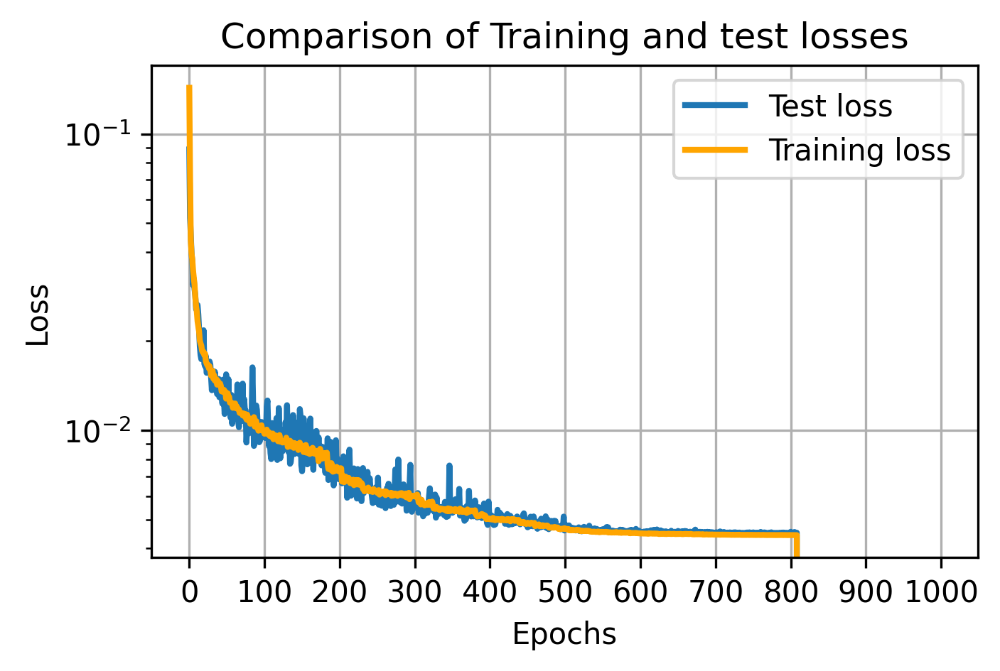

 81%|██████████████████████████████▊       | 810/1000 [2:43:36<38:28, 12.15s/it]

Epoch:810 
 Training time for  epoch 810: 0.201 minutes,Training loss:  0.004436217948283814, Testing loss: 0.004512018202804029


 81%|██████████████████████████████▊       | 811/1000 [2:43:48<38:11, 12.12s/it]

Epoch:811 
 Training time for  epoch 811: 0.201 minutes,Training loss:  0.004435693292687112, Testing loss: 0.004506291132420301


 81%|██████████████████████████████▊       | 812/1000 [2:44:01<38:04, 12.15s/it]

Epoch:812 
 Training time for  epoch 812: 0.204 minutes,Training loss:  0.004433957437209084, Testing loss: 0.004500434943474829


 81%|██████████████████████████████▉       | 813/1000 [2:44:13<37:51, 12.15s/it]

Epoch:813 
 Training time for  epoch 813: 0.202 minutes,Training loss:  0.004435257403705697, Testing loss: 0.004508006628602743


 81%|██████████████████████████████▉       | 814/1000 [2:44:25<37:40, 12.15s/it]

Epoch:814 
 Training time for  epoch 814: 0.203 minutes,Training loss:  0.004435128794115526, Testing loss: 0.004521025512367487


 82%|██████████████████████████████▉       | 815/1000 [2:44:37<37:25, 12.14s/it]

Epoch:815 
 Training time for  epoch 815: 0.202 minutes,Training loss:  0.004434915501505362, Testing loss: 0.004512470490299165


 82%|███████████████████████████████       | 816/1000 [2:44:49<37:14, 12.15s/it]

Epoch:816 
 Training time for  epoch 816: 0.203 minutes,Training loss:  0.004434953455874885, Testing loss: 0.004511443902738392


 82%|███████████████████████████████       | 817/1000 [2:45:01<36:57, 12.12s/it]

Epoch:817 
 Training time for  epoch 817: 0.201 minutes,Training loss:  0.004434712701958456, Testing loss: 0.00452703217510134


 82%|███████████████████████████████       | 818/1000 [2:45:13<36:47, 12.13s/it]

Epoch:818 
 Training time for  epoch 818: 0.203 minutes,Training loss:  0.004434787591759215, Testing loss: 0.004500692239962518
Epoch:819 
 Training time for  epoch 819: 0.203 minutes,Training loss:  0.004436137548428241, Testing loss: 0.00450748507399112


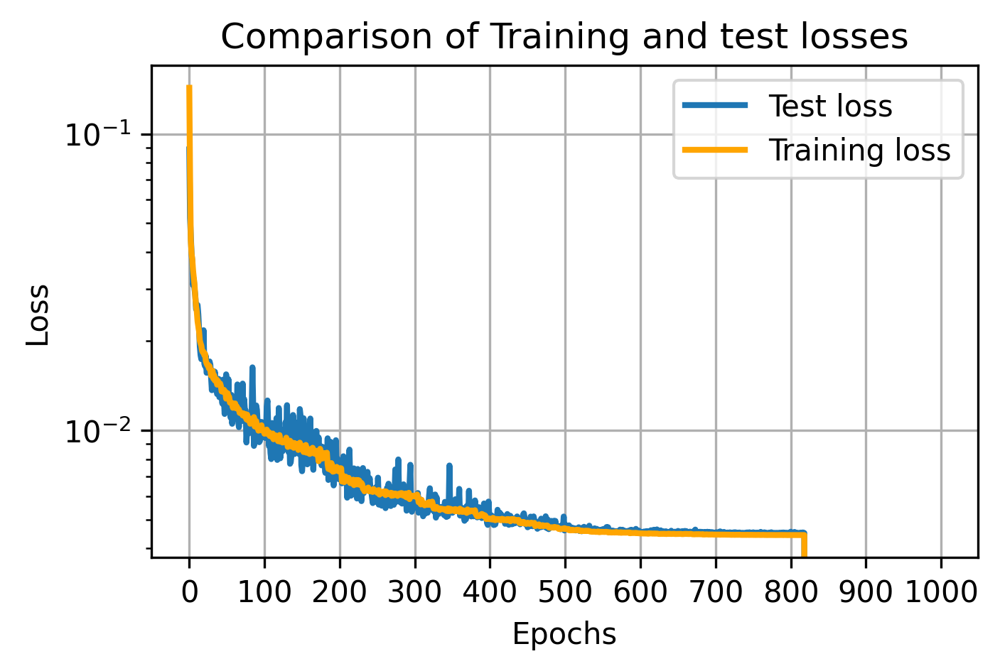

 82%|███████████████████████████████▏      | 820/1000 [2:45:38<36:43, 12.24s/it]

Epoch:820 
 Training time for  epoch 820: 0.204 minutes,Training loss:  0.0044353994122802625, Testing loss: 0.004504016400314868


 82%|███████████████████████████████▏      | 821/1000 [2:45:50<36:27, 12.22s/it]

Epoch:821 
 Training time for  epoch 821: 0.203 minutes,Training loss:  0.00443563649634226, Testing loss: 0.004501462182961404


 82%|███████████████████████████████▏      | 822/1000 [2:46:02<36:10, 12.19s/it]

Epoch:822 
 Training time for  epoch 822: 0.202 minutes,Training loss:  0.004434697069043811, Testing loss: 0.004523984719999135
Epoch 00823: reducing learning rate of group 0 to 3.0223e-06.


 82%|███████████████████████████████▎      | 823/1000 [2:46:15<36:00, 12.21s/it]

Epoch:823 
 Training time for  epoch 823: 0.204 minutes,Training loss:  0.004435483240506219, Testing loss: 0.004504401395097375


 82%|███████████████████████████████▎      | 824/1000 [2:46:27<35:41, 12.17s/it]

Epoch:824 
 Training time for  epoch 824: 0.201 minutes,Training loss:  0.004433611544437542, Testing loss: 0.004508870937861502


 82%|███████████████████████████████▎      | 825/1000 [2:46:39<35:31, 12.18s/it]

Epoch:825 
 Training time for  epoch 825: 0.203 minutes,Training loss:  0.004433864464769172, Testing loss: 0.004506489941850305


 83%|███████████████████████████████▍      | 826/1000 [2:46:51<35:19, 12.18s/it]

Epoch:826 
 Training time for  epoch 826: 0.203 minutes,Training loss:  0.004433128093645132, Testing loss: 0.004507014891132712


 83%|███████████████████████████████▍      | 827/1000 [2:47:03<35:08, 12.19s/it]

Epoch:827 
 Training time for  epoch 827: 0.203 minutes,Training loss:  0.004433878364298887, Testing loss: 0.004509955430403351


 83%|███████████████████████████████▍      | 828/1000 [2:47:16<34:55, 12.18s/it]

Epoch:828 
 Training time for  epoch 828: 0.203 minutes,Training loss:  0.004433710717852471, Testing loss: 0.004506864957511425
Epoch:829 
 Training time for  epoch 829: 0.203 minutes,Training loss:  0.004433811584900757, Testing loss: 0.004505094490014017


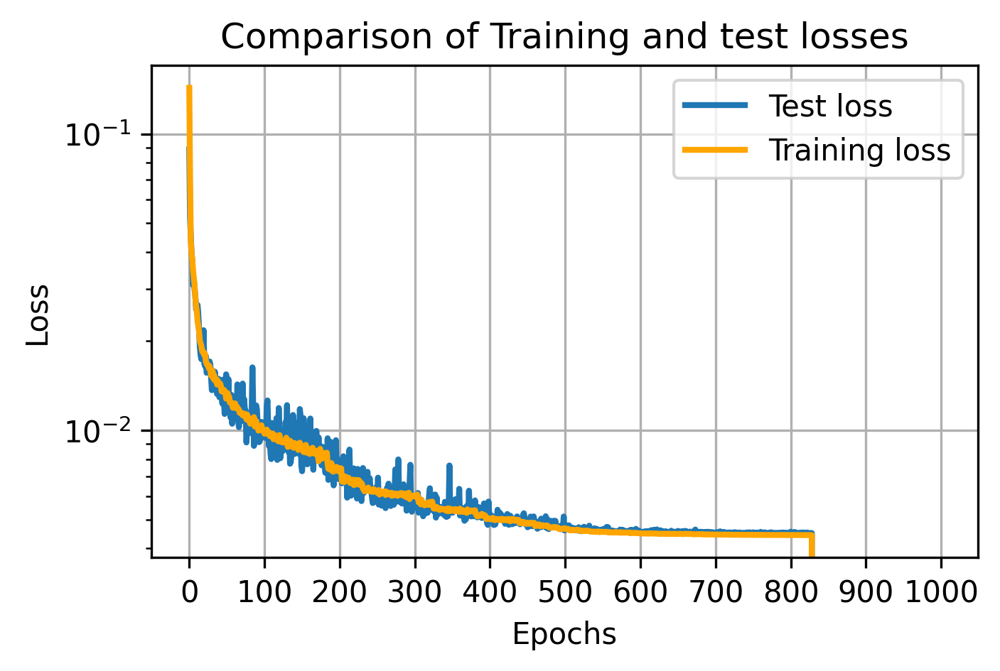

 83%|███████████████████████████████▌      | 830/1000 [2:47:40<34:40, 12.24s/it]

Epoch:830 
 Training time for  epoch 830: 0.203 minutes,Training loss:  0.004432505923382826, Testing loss: 0.004502871721051634


 83%|███████████████████████████████▌      | 831/1000 [2:47:52<34:22, 12.20s/it]

Epoch:831 
 Training time for  epoch 831: 0.202 minutes,Training loss:  0.004433470814673795, Testing loss: 0.004501014221459627


 83%|███████████████████████████████▌      | 832/1000 [2:48:04<34:01, 12.15s/it]

Epoch:832 
 Training time for  epoch 832: 0.201 minutes,Training loss:  0.004432459700415636, Testing loss: 0.004508494124747813


 83%|███████████████████████████████▋      | 833/1000 [2:48:16<33:42, 12.11s/it]

Epoch:833 
 Training time for  epoch 833: 0.2 minutes,Training loss:  0.004433060759617909, Testing loss: 0.0045160188060253854


 83%|███████████████████████████████▋      | 834/1000 [2:48:29<33:31, 12.12s/it]

Epoch:834 
 Training time for  epoch 834: 0.202 minutes,Training loss:  0.004432319661031253, Testing loss: 0.0045017933147028085


 84%|███████████████████████████████▋      | 835/1000 [2:48:41<33:25, 12.15s/it]

Epoch:835 
 Training time for  epoch 835: 0.204 minutes,Training loss:  0.004433596257388627, Testing loss: 0.00450811323709786


 84%|███████████████████████████████▊      | 836/1000 [2:48:53<33:08, 12.13s/it]

Epoch:836 
 Training time for  epoch 836: 0.201 minutes,Training loss:  0.004433314150478367, Testing loss: 0.004514197991229593


 84%|███████████████████████████████▊      | 837/1000 [2:49:05<32:59, 12.14s/it]

Epoch:837 
 Training time for  epoch 837: 0.203 minutes,Training loss:  0.00443359750374918, Testing loss: 0.004515589233487844


 84%|███████████████████████████████▊      | 838/1000 [2:49:17<32:42, 12.11s/it]

Epoch:838 
 Training time for  epoch 838: 0.201 minutes,Training loss:  0.004434246087715065, Testing loss: 0.004502308331429958
Epoch:839 
 Training time for  epoch 839: 0.202 minutes,Training loss:  0.004432604008361819, Testing loss: 0.00451177891343832


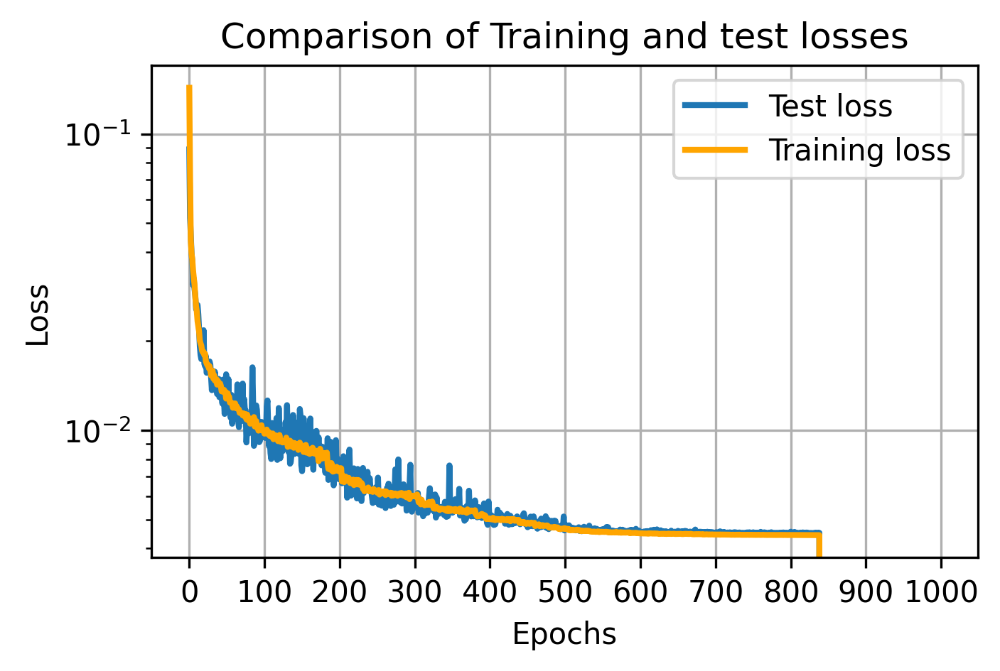

 84%|███████████████████████████████▉      | 840/1000 [2:49:41<32:24, 12.15s/it]

Epoch:840 
 Training time for  epoch 840: 0.201 minutes,Training loss:  0.004432273382357777, Testing loss: 0.004505020501092076
Epoch 00841: reducing learning rate of group 0 to 2.4179e-06.


 84%|███████████████████████████████▉      | 841/1000 [2:49:54<32:11, 12.15s/it]

Epoch:841 
 Training time for  epoch 841: 0.202 minutes,Training loss:  0.004433144930464569, Testing loss: 0.004513574857264757


 84%|███████████████████████████████▉      | 842/1000 [2:50:06<32:03, 12.18s/it]

Epoch:842 
 Training time for  epoch 842: 0.204 minutes,Training loss:  0.004432194915726677, Testing loss: 0.004501764462329447


 84%|████████████████████████████████      | 843/1000 [2:50:18<31:46, 12.15s/it]

Epoch:843 
 Training time for  epoch 843: 0.201 minutes,Training loss:  0.004431204807335613, Testing loss: 0.004506450542248785


 84%|████████████████████████████████      | 844/1000 [2:50:30<31:31, 12.12s/it]

Epoch:844 
 Training time for  epoch 844: 0.201 minutes,Training loss:  0.004431381924121135, Testing loss: 0.0045141915185377005


 84%|████████████████████████████████      | 845/1000 [2:50:42<31:18, 12.12s/it]

Epoch:845 
 Training time for  epoch 845: 0.202 minutes,Training loss:  0.004431262829759603, Testing loss: 0.004503804836422205


 85%|████████████████████████████████▏     | 846/1000 [2:50:54<31:01, 12.09s/it]

Epoch:846 
 Training time for  epoch 846: 0.2 minutes,Training loss:  0.004430782741084954, Testing loss: 0.00451477319933474


 85%|████████████████████████████████▏     | 847/1000 [2:51:06<30:42, 12.04s/it]

Epoch:847 
 Training time for  epoch 847: 0.199 minutes,Training loss:  0.004431122193290364, Testing loss: 0.004519580327905714


 85%|████████████████████████████████▏     | 848/1000 [2:51:18<30:26, 12.01s/it]

Epoch:848 
 Training time for  epoch 848: 0.199 minutes,Training loss:  0.0044322337386815975, Testing loss: 0.004500136445276439
Epoch:849 
 Training time for  epoch 849: 0.202 minutes,Training loss:  0.004431638262547232, Testing loss: 0.004504330549389124


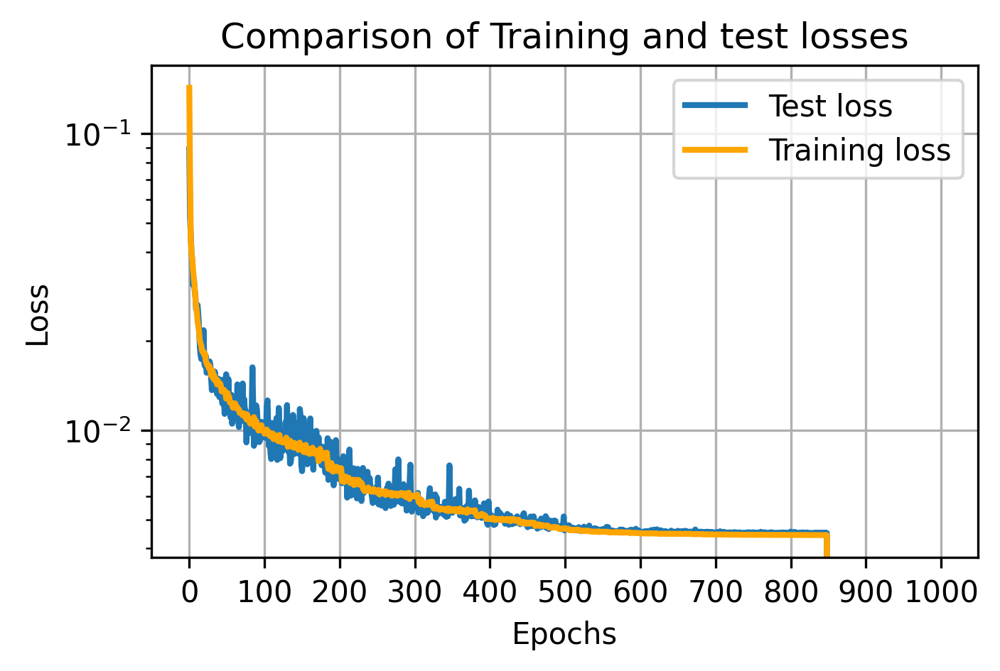

 85%|████████████████████████████████▎     | 850/1000 [2:51:42<30:15, 12.10s/it]

Epoch:850 
 Training time for  epoch 850: 0.201 minutes,Training loss:  0.004431181755749796, Testing loss: 0.004503742358647287


 85%|████████████████████████████████▎     | 851/1000 [2:51:54<29:58, 12.07s/it]

Epoch:851 
 Training time for  epoch 851: 0.2 minutes,Training loss:  0.004431908866650188, Testing loss: 0.004506295421160758


 85%|████████████████████████████████▍     | 852/1000 [2:52:06<29:46, 12.07s/it]

Epoch:852 
 Training time for  epoch 852: 0.201 minutes,Training loss:  0.004430874375492317, Testing loss: 0.004501022407785058


 85%|████████████████████████████████▍     | 853/1000 [2:52:19<29:37, 12.09s/it]

Epoch:853 
 Training time for  epoch 853: 0.202 minutes,Training loss:  0.0044302220694811606, Testing loss: 0.004507306450977922


 85%|████████████████████████████████▍     | 854/1000 [2:52:31<29:22, 12.07s/it]

Epoch:854 
 Training time for  epoch 854: 0.2 minutes,Training loss:  0.004430722042595866, Testing loss: 0.004506336739286781


 86%|████████████████████████████████▍     | 855/1000 [2:52:43<29:10, 12.08s/it]

Epoch:855 
 Training time for  epoch 855: 0.202 minutes,Training loss:  0.004431706770192334, Testing loss: 0.0045055649010464546


 86%|████████████████████████████████▌     | 856/1000 [2:52:55<29:01, 12.10s/it]

Epoch:856 
 Training time for  epoch 856: 0.202 minutes,Training loss:  0.0044318645041647965, Testing loss: 0.004506460893899202


 86%|████████████████████████████████▌     | 857/1000 [2:53:07<28:51, 12.11s/it]

Epoch:857 
 Training time for  epoch 857: 0.202 minutes,Training loss:  0.004431719053158067, Testing loss: 0.004504323555156588


 86%|████████████████████████████████▌     | 858/1000 [2:53:19<28:37, 12.09s/it]

Epoch:858 
 Training time for  epoch 858: 0.201 minutes,Training loss:  0.004431224635798964, Testing loss: 0.00450339290779084
Epoch:859 
 Training time for  epoch 859: 0.204 minutes,Training loss:  0.004431744125854488, Testing loss: 0.004509647707454861


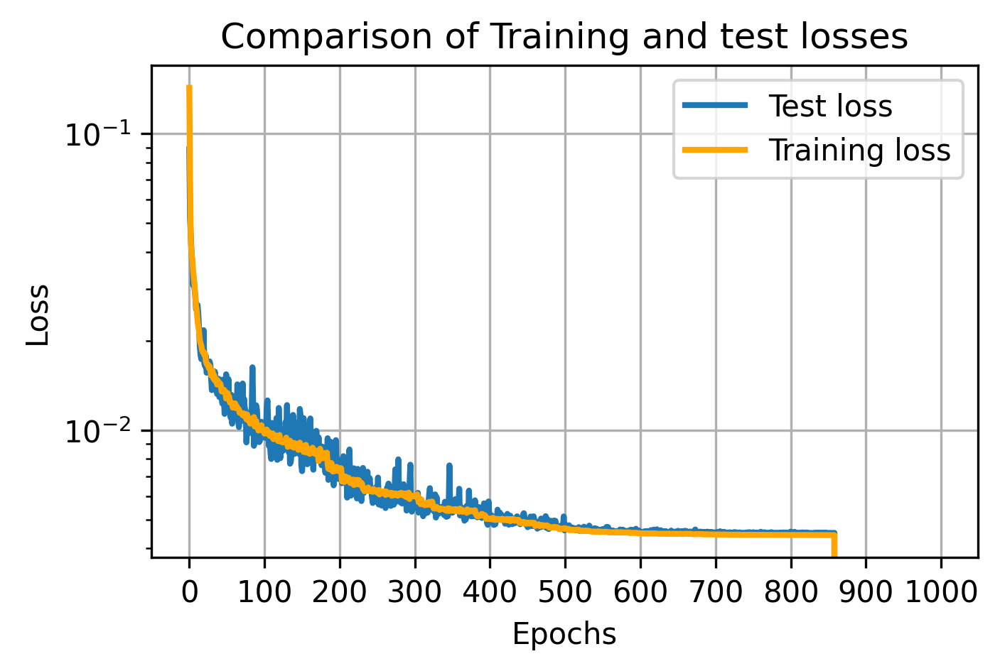

 86%|████████████████████████████████▋     | 860/1000 [2:53:44<28:23, 12.17s/it]

Epoch:860 
 Training time for  epoch 860: 0.201 minutes,Training loss:  0.004430833842408487, Testing loss: 0.004500262183137238


 86%|████████████████████████████████▋     | 861/1000 [2:53:56<28:10, 12.16s/it]

Epoch:861 
 Training time for  epoch 861: 0.203 minutes,Training loss:  0.004430748649378514, Testing loss: 0.004502852181904018


 86%|████████████████████████████████▊     | 862/1000 [2:54:08<27:58, 12.16s/it]

Epoch:862 
 Training time for  epoch 862: 0.203 minutes,Training loss:  0.004431351544995307, Testing loss: 0.004507016334682703


 86%|████████████████████████████████▊     | 863/1000 [2:54:20<27:44, 12.15s/it]

Epoch:863 
 Training time for  epoch 863: 0.202 minutes,Training loss:  0.004432407592863502, Testing loss: 0.00450581762008369
Epoch 00864: reducing learning rate of group 0 to 1.9343e-06.


 86%|████████████████████████████████▊     | 864/1000 [2:54:32<27:32, 12.15s/it]

Epoch:864 
 Training time for  epoch 864: 0.203 minutes,Training loss:  0.004430415416266185, Testing loss: 0.0045050001237541435


 86%|████████████████████████████████▊     | 865/1000 [2:54:44<27:18, 12.13s/it]

Epoch:865 
 Training time for  epoch 865: 0.201 minutes,Training loss:  0.004429450006311831, Testing loss: 0.004514837833121419


 87%|████████████████████████████████▉     | 866/1000 [2:54:56<27:05, 12.13s/it]

Epoch:866 
 Training time for  epoch 866: 0.202 minutes,Training loss:  0.004430665860372259, Testing loss: 0.004503518817946315


 87%|████████████████████████████████▉     | 867/1000 [2:55:09<26:53, 12.13s/it]

Epoch:867 
 Training time for  epoch 867: 0.202 minutes,Training loss:  0.004430281186831139, Testing loss: 0.004507985524833202


 87%|████████████████████████████████▉     | 868/1000 [2:55:21<26:43, 12.15s/it]

Epoch:868 
 Training time for  epoch 868: 0.203 minutes,Training loss:  0.004430418692931585, Testing loss: 0.004503382607363164
Epoch:869 
 Training time for  epoch 869: 0.204 minutes,Training loss:  0.004427580816755623, Testing loss: 0.004507742649875582


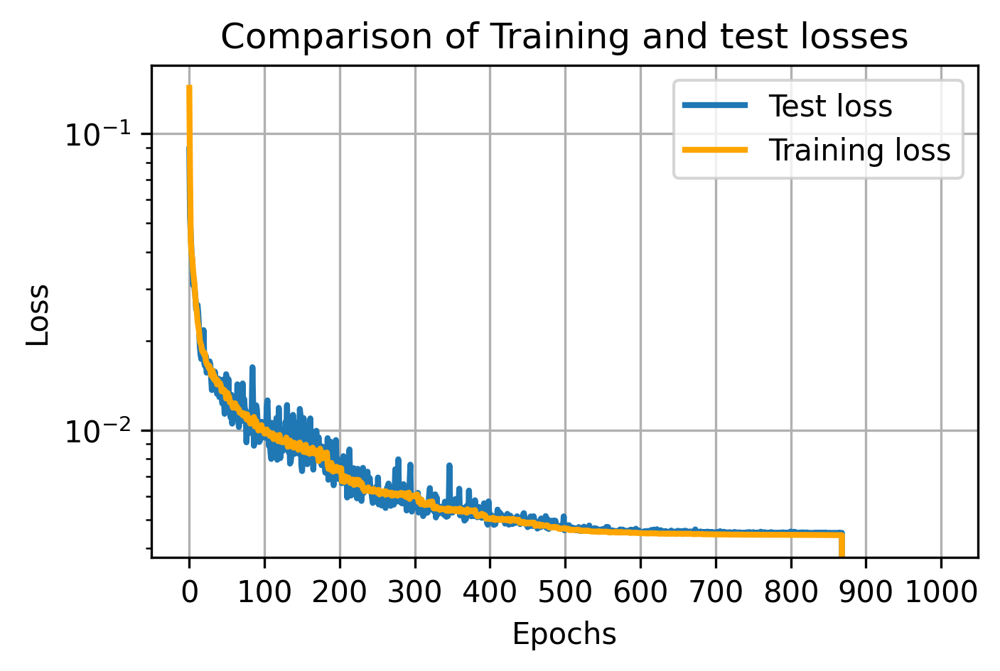

 87%|█████████████████████████████████     | 870/1000 [2:55:45<26:28, 12.22s/it]

Epoch:870 
 Training time for  epoch 870: 0.202 minutes,Training loss:  0.004430465707955633, Testing loss: 0.004504496357403695


 87%|█████████████████████████████████     | 871/1000 [2:55:58<26:12, 12.19s/it]

Epoch:871 
 Training time for  epoch 871: 0.202 minutes,Training loss:  0.004429721090137855, Testing loss: 0.0045023481734097


 87%|█████████████████████████████████▏    | 872/1000 [2:56:10<26:00, 12.19s/it]

Epoch:872 
 Training time for  epoch 872: 0.203 minutes,Training loss:  0.004429991402188435, Testing loss: 0.00451331639662385


 87%|█████████████████████████████████▏    | 873/1000 [2:56:22<25:48, 12.20s/it]

Epoch:873 
 Training time for  epoch 873: 0.203 minutes,Training loss:  0.004430144618543321, Testing loss: 0.004505262179300189


 87%|█████████████████████████████████▏    | 874/1000 [2:56:34<25:35, 12.18s/it]

Epoch:874 
 Training time for  epoch 874: 0.203 minutes,Training loss:  0.00443046164031505, Testing loss: 0.004517242000438273


 88%|█████████████████████████████████▎    | 875/1000 [2:56:46<25:26, 12.21s/it]

Epoch:875 
 Training time for  epoch 875: 0.205 minutes,Training loss:  0.004429971489895235, Testing loss: 0.0045087320310994985


 88%|█████████████████████████████████▎    | 876/1000 [2:56:59<25:15, 12.22s/it]

Epoch:876 
 Training time for  epoch 876: 0.204 minutes,Training loss:  0.0044297034209691485, Testing loss: 0.004507711031474173


 88%|█████████████████████████████████▎    | 877/1000 [2:57:11<25:01, 12.21s/it]

Epoch:877 
 Training time for  epoch 877: 0.203 minutes,Training loss:  0.004429958707736275, Testing loss: 0.004501565368846059


 88%|█████████████████████████████████▎    | 878/1000 [2:57:23<24:48, 12.20s/it]

Epoch:878 
 Training time for  epoch 878: 0.203 minutes,Training loss:  0.004430170238837946, Testing loss: 0.0045067756995558735
Epoch:879 
 Training time for  epoch 879: 0.204 minutes,Training loss:  0.004429723960634117, Testing loss: 0.004512455123476684


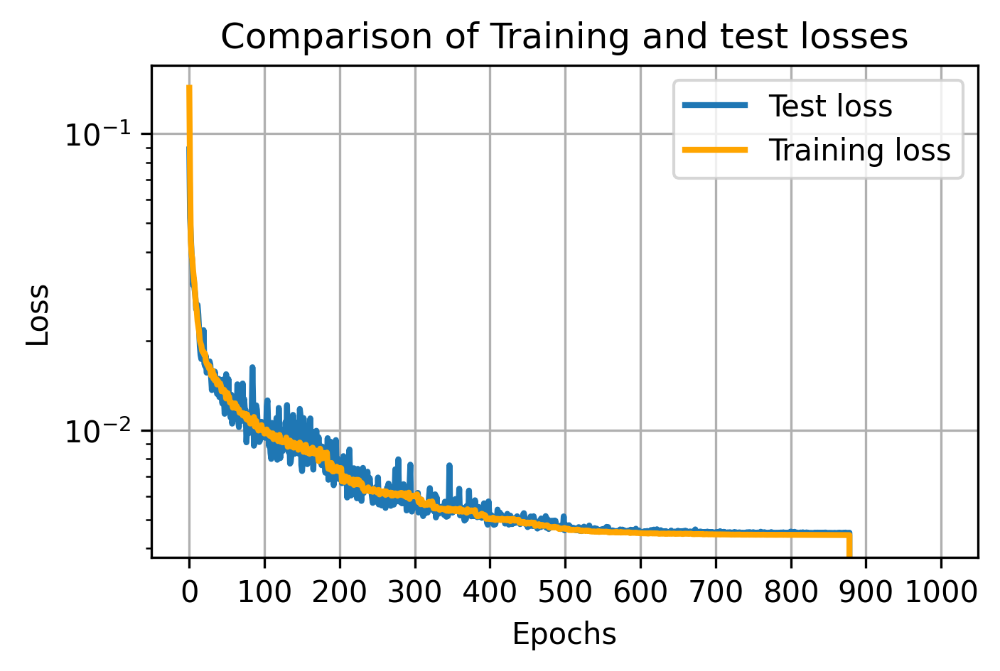

 88%|█████████████████████████████████▍    | 879/1000 [2:57:35<24:48, 12.30s/it]

Epoch 00880: reducing learning rate of group 0 to 1.5474e-06.


 88%|█████████████████████████████████▍    | 880/1000 [2:57:48<24:29, 12.25s/it]

Epoch:880 
 Training time for  epoch 880: 0.202 minutes,Training loss:  0.004429460532907029, Testing loss: 0.004507033713161945


 88%|█████████████████████████████████▍    | 881/1000 [2:58:00<24:13, 12.21s/it]

Epoch:881 
 Training time for  epoch 881: 0.202 minutes,Training loss:  0.004428934466535102, Testing loss: 0.004510197397321463


 88%|█████████████████████████████████▌    | 882/1000 [2:58:12<23:58, 12.19s/it]

Epoch:882 
 Training time for  epoch 882: 0.202 minutes,Training loss:  0.004429041524282489, Testing loss: 0.004506261623464525


 88%|█████████████████████████████████▌    | 883/1000 [2:58:24<23:48, 12.21s/it]

Epoch:883 
 Training time for  epoch 883: 0.204 minutes,Training loss:  0.004428466357416219, Testing loss: 0.004504808373749256


 88%|█████████████████████████████████▌    | 884/1000 [2:58:36<23:33, 12.19s/it]

Epoch:884 
 Training time for  epoch 884: 0.202 minutes,Training loss:  0.00442902498113794, Testing loss: 0.004502716059796512


 88%|█████████████████████████████████▋    | 885/1000 [2:58:48<23:17, 12.15s/it]

Epoch:885 
 Training time for  epoch 885: 0.201 minutes,Training loss:  0.004428925925625637, Testing loss: 0.004509046827442944


 89%|█████████████████████████████████▋    | 886/1000 [2:59:00<23:00, 12.11s/it]

Epoch:886 
 Training time for  epoch 886: 0.2 minutes,Training loss:  0.004429427045586754, Testing loss: 0.004507769881747663


 89%|█████████████████████████████████▋    | 887/1000 [2:59:13<22:50, 12.13s/it]

Epoch:887 
 Training time for  epoch 887: 0.203 minutes,Training loss:  0.004428978781967611, Testing loss: 0.004509397158399224


 89%|█████████████████████████████████▋    | 888/1000 [2:59:25<22:37, 12.12s/it]

Epoch:888 
 Training time for  epoch 888: 0.202 minutes,Training loss:  0.00442852702913384, Testing loss: 0.0045128224324435
Epoch:889 
 Training time for  epoch 889: 0.201 minutes,Training loss:  0.004428100186204332, Testing loss: 0.00450371338520199


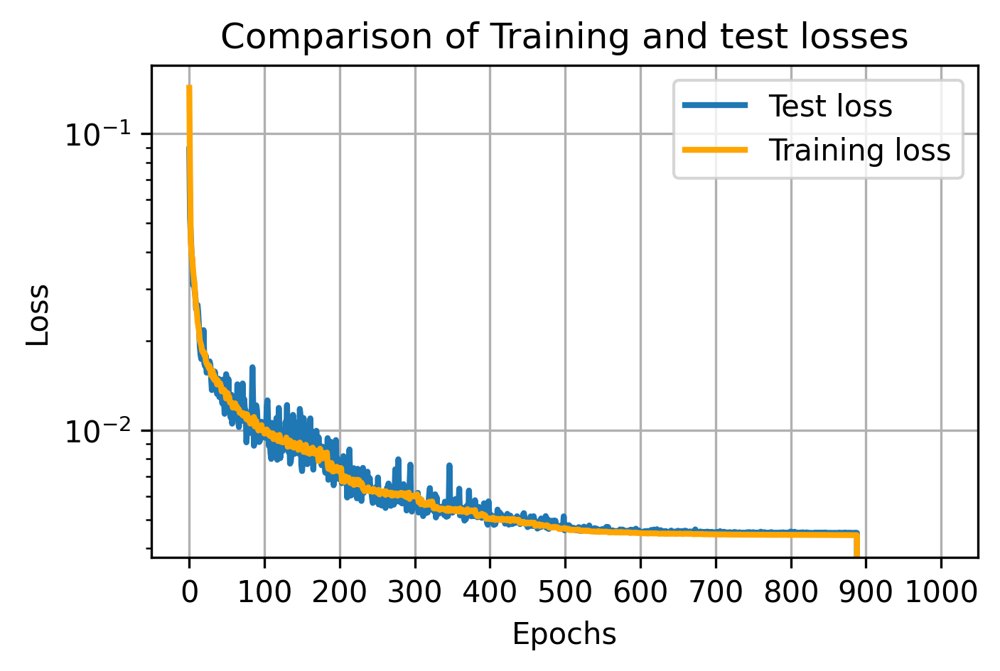

 89%|█████████████████████████████████▊    | 890/1000 [2:59:49<22:18, 12.17s/it]

Epoch:890 
 Training time for  epoch 890: 0.203 minutes,Training loss:  0.004429519789793142, Testing loss: 0.004503639698959887
Epoch 00891: reducing learning rate of group 0 to 1.2379e-06.


 89%|█████████████████████████████████▊    | 891/1000 [3:00:01<22:02, 12.14s/it]

Epoch:891 
 Training time for  epoch 891: 0.201 minutes,Training loss:  0.00442888225865757, Testing loss: 0.00450556627009064


 89%|█████████████████████████████████▉    | 892/1000 [3:00:13<21:50, 12.13s/it]

Epoch:892 
 Training time for  epoch 892: 0.202 minutes,Training loss:  0.004428530130297395, Testing loss: 0.004506173916161061


 89%|█████████████████████████████████▉    | 893/1000 [3:00:25<21:36, 12.11s/it]

Epoch:893 
 Training time for  epoch 893: 0.201 minutes,Training loss:  0.004428396813255604, Testing loss: 0.004507565093226731


 89%|█████████████████████████████████▉    | 894/1000 [3:00:37<21:23, 12.11s/it]

Epoch:894 
 Training time for  epoch 894: 0.201 minutes,Training loss:  0.004428542847826246, Testing loss: 0.004506959072314203


 90%|██████████████████████████████████    | 895/1000 [3:00:50<21:11, 12.11s/it]

Epoch:895 
 Training time for  epoch 895: 0.202 minutes,Training loss:  0.004428480804544137, Testing loss: 0.0045105265406891705


 90%|██████████████████████████████████    | 896/1000 [3:01:02<20:58, 12.10s/it]

Epoch:896 
 Training time for  epoch 896: 0.201 minutes,Training loss:  0.004428485666945767, Testing loss: 0.004504291289485991


 90%|██████████████████████████████████    | 897/1000 [3:01:14<20:46, 12.10s/it]

Epoch:897 
 Training time for  epoch 897: 0.202 minutes,Training loss:  0.004428051581928608, Testing loss: 0.004505608608014882


 90%|██████████████████████████████████    | 898/1000 [3:01:26<20:31, 12.08s/it]

Epoch:898 
 Training time for  epoch 898: 0.201 minutes,Training loss:  0.0044283158468725065, Testing loss: 0.004504676912911236
Epoch:899 
 Training time for  epoch 899: 0.201 minutes,Training loss:  0.004428202087604781, Testing loss: 0.004505357970483601


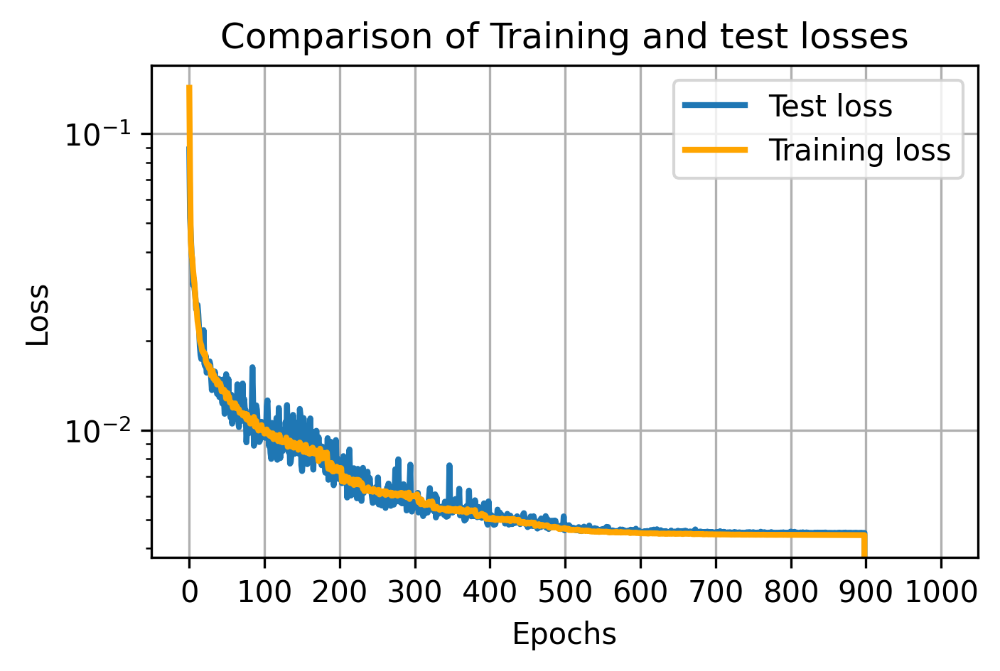

 90%|██████████████████████████████████▏   | 900/1000 [3:01:50<20:12, 12.13s/it]

Epoch:900 
 Training time for  epoch 900: 0.201 minutes,Training loss:  0.004428349668160081, Testing loss: 0.004502646317705512


 90%|██████████████████████████████████▏   | 901/1000 [3:02:02<19:59, 12.12s/it]

Epoch:901 
 Training time for  epoch 901: 0.202 minutes,Training loss:  0.0044277645720538885, Testing loss: 0.004501088378019631
Epoch 00902: reducing learning rate of group 0 to 9.9035e-07.


 90%|██████████████████████████████████▎   | 902/1000 [3:02:14<19:47, 12.12s/it]

Epoch:902 
 Training time for  epoch 902: 0.202 minutes,Training loss:  0.004427625805260689, Testing loss: 0.004508178262040019


 90%|██████████████████████████████████▎   | 903/1000 [3:02:26<19:35, 12.12s/it]

Epoch:903 
 Training time for  epoch 903: 0.202 minutes,Training loss:  0.0044279226389119745, Testing loss: 0.0045023501990363


 90%|██████████████████████████████████▎   | 904/1000 [3:02:39<19:24, 12.13s/it]

Epoch:904 
 Training time for  epoch 904: 0.203 minutes,Training loss:  0.00442743274322673, Testing loss: 0.0045022266311571


 90%|██████████████████████████████████▍   | 905/1000 [3:02:51<19:12, 12.13s/it]

Epoch:905 
 Training time for  epoch 905: 0.202 minutes,Training loss:  0.0044271597680911575, Testing loss: 0.004500181656330824


 91%|██████████████████████████████████▍   | 906/1000 [3:03:03<19:00, 12.13s/it]

Epoch:906 
 Training time for  epoch 906: 0.202 minutes,Training loss:  0.004427440011815431, Testing loss: 0.0045016306778416035


 91%|██████████████████████████████████▍   | 907/1000 [3:03:15<18:45, 12.10s/it]

Epoch:907 
 Training time for  epoch 907: 0.201 minutes,Training loss:  0.004427415362865373, Testing loss: 0.004507504981011152


 91%|██████████████████████████████████▌   | 908/1000 [3:03:27<18:31, 12.08s/it]

Epoch:908 
 Training time for  epoch 908: 0.201 minutes,Training loss:  0.004427252595316139, Testing loss: 0.0045023600710555915
Epoch:909 
 Training time for  epoch 909: 0.201 minutes,Training loss:  0.00442741457432396, Testing loss: 0.004500761381350458


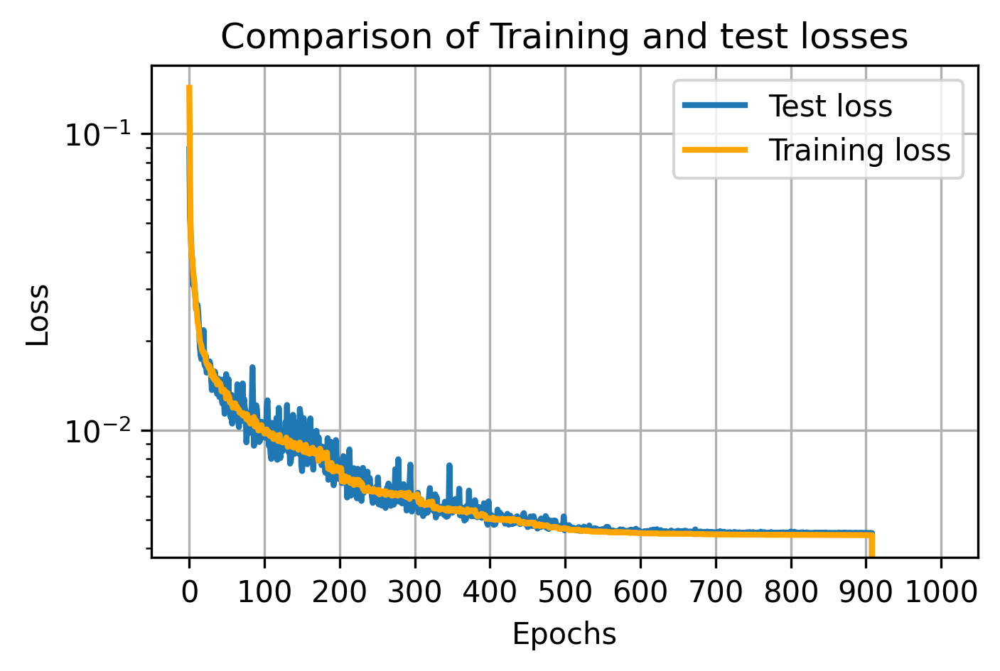

 91%|██████████████████████████████████▌   | 910/1000 [3:03:51<18:12, 12.14s/it]

Epoch:910 
 Training time for  epoch 910: 0.202 minutes,Training loss:  0.004427369950343525, Testing loss: 0.004504592656157911


 91%|██████████████████████████████████▌   | 911/1000 [3:04:04<18:00, 12.14s/it]

Epoch:911 
 Training time for  epoch 911: 0.202 minutes,Training loss:  0.004427201742777962, Testing loss: 0.004505448224954307


 91%|██████████████████████████████████▋   | 912/1000 [3:04:16<17:48, 12.15s/it]

Epoch:912 
 Training time for  epoch 912: 0.203 minutes,Training loss:  0.004427367189096484, Testing loss: 0.004505695276893675
Epoch 00913: reducing learning rate of group 0 to 7.9228e-07.


 91%|██████████████████████████████████▋   | 913/1000 [3:04:28<17:34, 12.12s/it]

Epoch:913 
 Training time for  epoch 913: 0.201 minutes,Training loss:  0.004427722020293224, Testing loss: 0.004508771542459726


 91%|██████████████████████████████████▋   | 914/1000 [3:04:40<17:22, 12.12s/it]

Epoch:914 
 Training time for  epoch 914: 0.202 minutes,Training loss:  0.004426739276219138, Testing loss: 0.004510400472208857


 92%|██████████████████████████████████▊   | 915/1000 [3:04:52<17:08, 12.10s/it]

Epoch:915 
 Training time for  epoch 915: 0.201 minutes,Training loss:  0.00442682646088406, Testing loss: 0.0045054441690444945


 92%|██████████████████████████████████▊   | 916/1000 [3:05:04<16:54, 12.08s/it]

Epoch:916 
 Training time for  epoch 916: 0.2 minutes,Training loss:  0.004426653104272869, Testing loss: 0.004503354490734637


 92%|██████████████████████████████████▊   | 917/1000 [3:05:16<16:41, 12.07s/it]

Epoch:917 
 Training time for  epoch 917: 0.201 minutes,Training loss:  0.004427175681430167, Testing loss: 0.004504101783968508


 92%|██████████████████████████████████▉   | 918/1000 [3:05:28<16:27, 12.04s/it]

Epoch:918 
 Training time for  epoch 918: 0.199 minutes,Training loss:  0.004426914815651415, Testing loss: 0.004501963304355741
Epoch:919 
 Training time for  epoch 919: 0.201 minutes,Training loss:  0.00442660494726995, Testing loss: 0.0045043554063886404


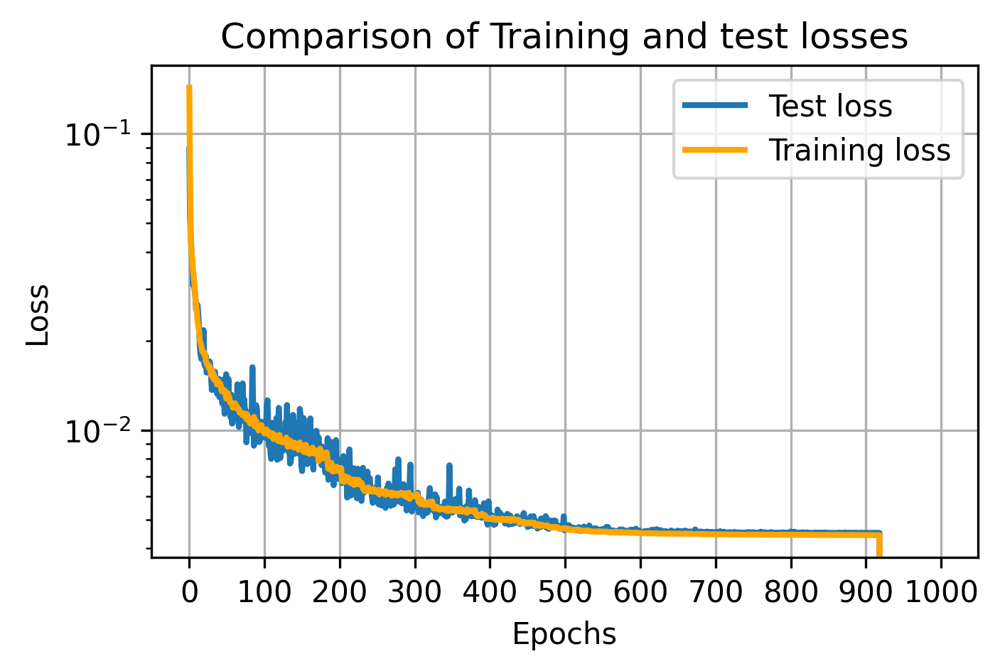

 92%|██████████████████████████████████▉   | 920/1000 [3:05:52<16:06, 12.08s/it]

Epoch:920 
 Training time for  epoch 920: 0.2 minutes,Training loss:  0.00442656157641054, Testing loss: 0.004502714797854424


 92%|██████████████████████████████████▉   | 921/1000 [3:06:04<15:51, 12.05s/it]

Epoch:921 
 Training time for  epoch 921: 0.2 minutes,Training loss:  0.004427079082402843, Testing loss: 0.004503096686676145


 92%|███████████████████████████████████   | 922/1000 [3:06:16<15:40, 12.06s/it]

Epoch:922 
 Training time for  epoch 922: 0.201 minutes,Training loss:  0.004426690001575044, Testing loss: 0.004505657758563757


 92%|███████████████████████████████████   | 923/1000 [3:06:28<15:28, 12.05s/it]

Epoch:923 
 Training time for  epoch 923: 0.201 minutes,Training loss:  0.004426873743622785, Testing loss: 0.004502209136262536


 92%|███████████████████████████████████   | 924/1000 [3:06:41<15:18, 12.08s/it]

Epoch:924 
 Training time for  epoch 924: 0.202 minutes,Training loss:  0.004426772982308275, Testing loss: 0.004502529744058847
Epoch 00925: reducing learning rate of group 0 to 6.3383e-07.


 92%|███████████████████████████████████▏  | 925/1000 [3:06:53<15:09, 12.13s/it]

Epoch:925 
 Training time for  epoch 925: 0.204 minutes,Training loss:  0.00442666592672424, Testing loss: 0.004505481272935867


 93%|███████████████████████████████████▏  | 926/1000 [3:07:05<14:54, 12.09s/it]

Epoch:926 
 Training time for  epoch 926: 0.2 minutes,Training loss:  0.004426490176635665, Testing loss: 0.004502349249087274


 93%|███████████████████████████████████▏  | 927/1000 [3:07:17<14:43, 12.11s/it]

Epoch:927 
 Training time for  epoch 927: 0.202 minutes,Training loss:  0.004426416442875559, Testing loss: 0.004503413564525545


 93%|███████████████████████████████████▎  | 928/1000 [3:07:29<14:32, 12.11s/it]

Epoch:928 
 Training time for  epoch 928: 0.202 minutes,Training loss:  0.004426370747765996, Testing loss: 0.004503806913271546
Epoch:929 
 Training time for  epoch 929: 0.201 minutes,Training loss:  0.004426258937407038, Testing loss: 0.004504627520218491


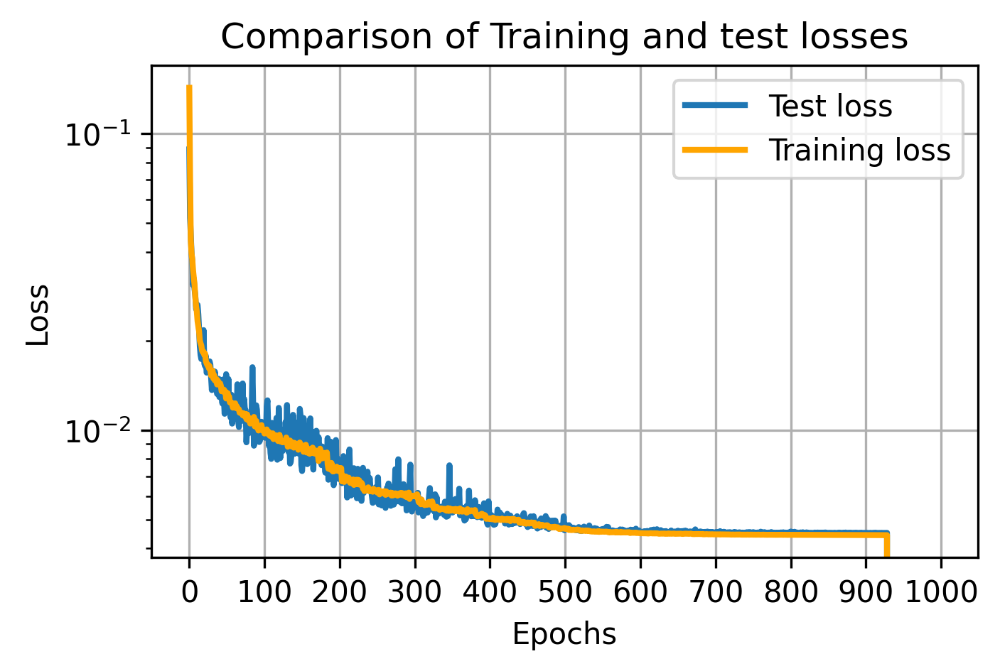

 93%|███████████████████████████████████▎  | 930/1000 [3:07:54<14:12, 12.18s/it]

Epoch:930 
 Training time for  epoch 930: 0.203 minutes,Training loss:  0.004426415863638348, Testing loss: 0.004501460273750126


 93%|███████████████████████████████████▍  | 931/1000 [3:08:06<13:58, 12.15s/it]

Epoch:931 
 Training time for  epoch 931: 0.201 minutes,Training loss:  0.004426252099595592, Testing loss: 0.004504316230304539


 93%|███████████████████████████████████▍  | 932/1000 [3:08:18<13:44, 12.12s/it]

Epoch:932 
 Training time for  epoch 932: 0.201 minutes,Training loss:  0.004425957953366997, Testing loss: 0.004503382137045264


 93%|███████████████████████████████████▍  | 933/1000 [3:08:30<13:32, 12.12s/it]

Epoch:933 
 Training time for  epoch 933: 0.202 minutes,Training loss:  0.004426140940946102, Testing loss: 0.004502441873773933


 93%|███████████████████████████████████▍  | 934/1000 [3:08:42<13:19, 12.11s/it]

Epoch:934 
 Training time for  epoch 934: 0.202 minutes,Training loss:  0.004426396529230265, Testing loss: 0.004504412459209561


 94%|███████████████████████████████████▌  | 935/1000 [3:08:54<13:08, 12.13s/it]

Epoch:935 
 Training time for  epoch 935: 0.203 minutes,Training loss:  0.0044262344961386695, Testing loss: 0.004504987341351807


 94%|███████████████████████████████████▌  | 936/1000 [3:09:06<12:57, 12.14s/it]

Epoch:936 
 Training time for  epoch 936: 0.203 minutes,Training loss:  0.004426250691254138, Testing loss: 0.004501986661925912


 94%|███████████████████████████████████▌  | 937/1000 [3:09:18<12:45, 12.16s/it]

Epoch:937 
 Training time for  epoch 937: 0.203 minutes,Training loss:  0.004425772917094564, Testing loss: 0.004507652884349227


 94%|███████████████████████████████████▋  | 938/1000 [3:09:31<12:34, 12.17s/it]

Epoch:938 
 Training time for  epoch 938: 0.204 minutes,Training loss:  0.004426199236763566, Testing loss: 0.004506359933875501
Epoch:939 
 Training time for  epoch 939: 0.202 minutes,Training loss:  0.004426185818309014, Testing loss: 0.004506149860098958


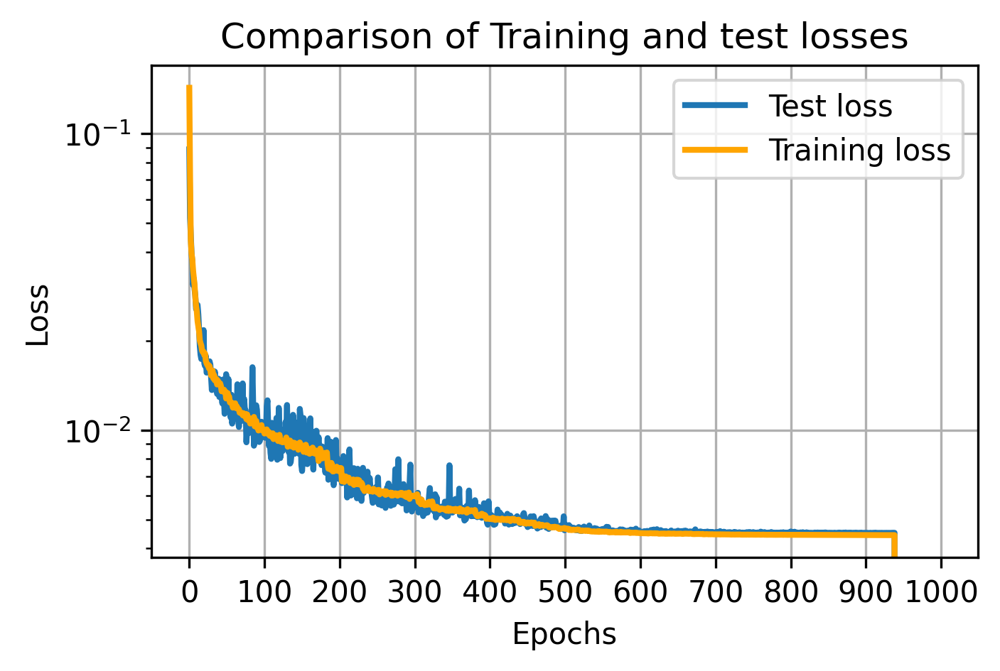

 94%|███████████████████████████████████▋  | 940/1000 [3:09:55<12:12, 12.20s/it]

Epoch:940 
 Training time for  epoch 940: 0.201 minutes,Training loss:  0.004426484224175587, Testing loss: 0.004503746926784516


 94%|███████████████████████████████████▊  | 941/1000 [3:10:07<11:56, 12.15s/it]

Epoch:941 
 Training time for  epoch 941: 0.2 minutes,Training loss:  0.004426335592772574, Testing loss: 0.0045022783940657975


 94%|███████████████████████████████████▊  | 942/1000 [3:10:19<11:44, 12.14s/it]

Epoch:942 
 Training time for  epoch 942: 0.202 minutes,Training loss:  0.004426405743753125, Testing loss: 0.004503085152246058


 94%|███████████████████████████████████▊  | 943/1000 [3:10:31<11:31, 12.12s/it]

Epoch:943 
 Training time for  epoch 943: 0.201 minutes,Training loss:  0.004426131097158541, Testing loss: 0.0045030572544783355


 94%|███████████████████████████████████▊  | 944/1000 [3:10:43<11:18, 12.11s/it]

Epoch:944 
 Training time for  epoch 944: 0.201 minutes,Training loss:  0.004426034773417622, Testing loss: 0.0045000978885218505


 94%|███████████████████████████████████▉  | 945/1000 [3:10:56<11:05, 12.10s/it]

Epoch:945 
 Training time for  epoch 945: 0.201 minutes,Training loss:  0.004426105684545605, Testing loss: 0.004501601424999535


 95%|███████████████████████████████████▉  | 946/1000 [3:11:08<10:52, 12.08s/it]

Epoch:946 
 Training time for  epoch 946: 0.2 minutes,Training loss:  0.0044264385509699515, Testing loss: 0.0045027250610291955


 95%|███████████████████████████████████▉  | 947/1000 [3:11:20<10:40, 12.09s/it]

Epoch:947 
 Training time for  epoch 947: 0.202 minutes,Training loss:  0.004426384045613733, Testing loss: 0.004501211824826896
Epoch 00948: reducing learning rate of group 0 to 5.0706e-07.


 95%|████████████████████████████████████  | 948/1000 [3:11:32<10:28, 12.08s/it]

Epoch:948 
 Training time for  epoch 948: 0.201 minutes,Training loss:  0.004426070633663446, Testing loss: 0.004502885979600251
Epoch:949 
 Training time for  epoch 949: 0.2 minutes,Training loss:  0.004426093359394529, Testing loss: 0.004503889498300851


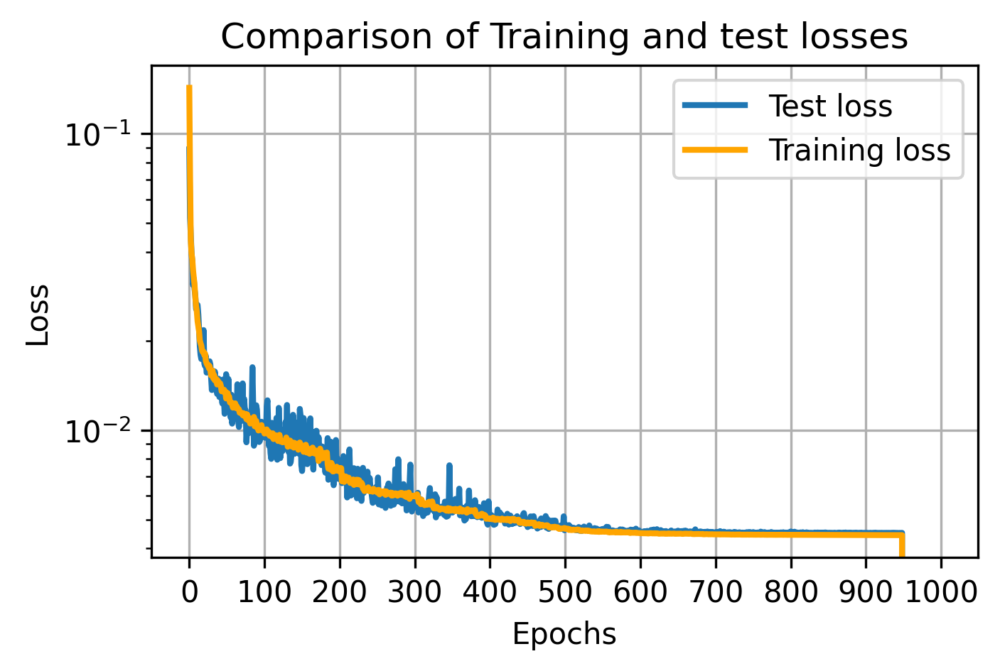

 95%|████████████████████████████████████  | 950/1000 [3:11:56<10:05, 12.10s/it]

Epoch:950 
 Training time for  epoch 950: 0.201 minutes,Training loss:  0.004425934795506567, Testing loss: 0.004501542346552014


 95%|████████████████████████████████████▏ | 951/1000 [3:12:08<09:51, 12.08s/it]

Epoch:951 
 Training time for  epoch 951: 0.2 minutes,Training loss:  0.0044257657834448775, Testing loss: 0.004501331546343863


 95%|████████████████████████████████████▏ | 952/1000 [3:12:20<09:37, 12.04s/it]

Epoch:952 
 Training time for  epoch 952: 0.199 minutes,Training loss:  0.0044259781631209505, Testing loss: 0.004502645069733262


 95%|████████████████████████████████████▏ | 953/1000 [3:12:32<09:25, 12.04s/it]

Epoch:953 
 Training time for  epoch 953: 0.201 minutes,Training loss:  0.004425848596788831, Testing loss: 0.004505267264321446


 95%|████████████████████████████████████▎ | 954/1000 [3:12:44<09:12, 12.02s/it]

Epoch:954 
 Training time for  epoch 954: 0.199 minutes,Training loss:  0.004425970055422509, Testing loss: 0.004503119462169707


 96%|████████████████████████████████████▎ | 955/1000 [3:12:56<09:01, 12.04s/it]

Epoch:955 
 Training time for  epoch 955: 0.201 minutes,Training loss:  0.004425738776712727, Testing loss: 0.004503186596557498


 96%|████████████████████████████████████▎ | 956/1000 [3:13:08<08:50, 12.06s/it]

Epoch:956 
 Training time for  epoch 956: 0.202 minutes,Training loss:  0.004425926573150526, Testing loss: 0.004503211416304112


 96%|████████████████████████████████████▎ | 957/1000 [3:13:20<08:39, 12.07s/it]

Epoch:957 
 Training time for  epoch 957: 0.202 minutes,Training loss:  0.0044259044006964435, Testing loss: 0.004505501957610249


 96%|████████████████████████████████████▍ | 958/1000 [3:13:32<08:27, 12.08s/it]

Epoch:958 
 Training time for  epoch 958: 0.202 minutes,Training loss:  0.0044257690254966625, Testing loss: 0.004503382747061551
Epoch 00959: reducing learning rate of group 0 to 4.0565e-07.
Epoch:959 
 Training time for  epoch 959: 0.201 minutes,Training loss:  0.004425955526628093, Testing loss: 0.004503439855761826


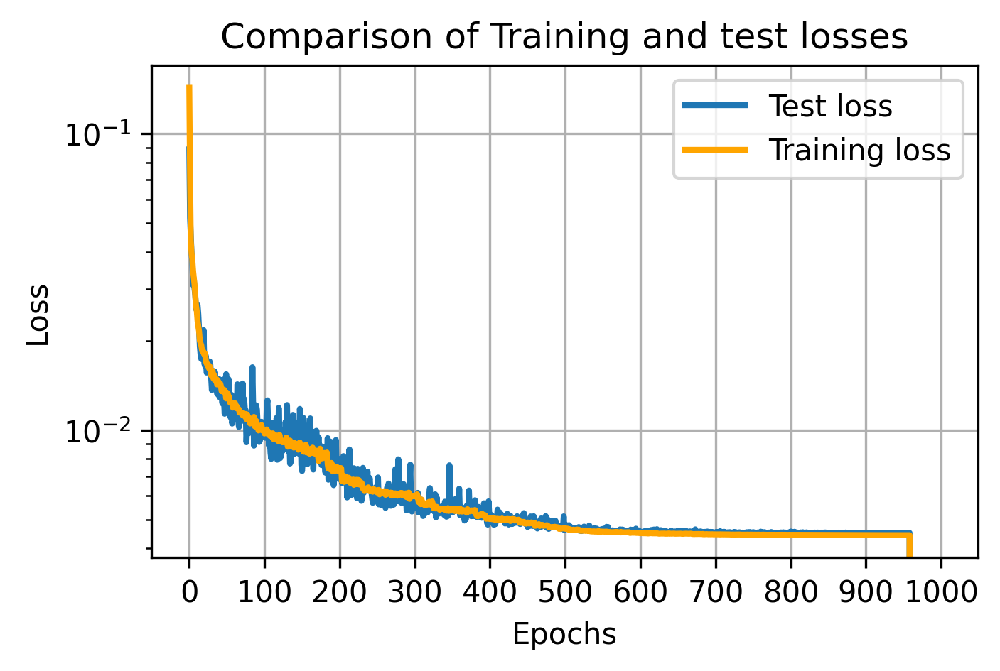

 96%|████████████████████████████████████▍ | 960/1000 [3:13:57<08:06, 12.16s/it]

Epoch:960 
 Training time for  epoch 960: 0.203 minutes,Training loss:  0.0044256239457750365, Testing loss: 0.004502407391555607


 96%|████████████████████████████████████▌ | 961/1000 [3:14:09<07:53, 12.14s/it]

Epoch:961 
 Training time for  epoch 961: 0.201 minutes,Training loss:  0.004425615110920264, Testing loss: 0.004501847121864557


 96%|████████████████████████████████████▌ | 962/1000 [3:14:21<07:41, 12.14s/it]

Epoch:962 
 Training time for  epoch 962: 0.202 minutes,Training loss:  0.0044252480765313565, Testing loss: 0.004506026324816048


 96%|████████████████████████████████████▌ | 963/1000 [3:14:33<07:28, 12.12s/it]

Epoch:963 
 Training time for  epoch 963: 0.201 minutes,Training loss:  0.004425558915175714, Testing loss: 0.004503309647552669


 96%|████████████████████████████████████▋ | 964/1000 [3:14:45<07:16, 12.13s/it]

Epoch:964 
 Training time for  epoch 964: 0.203 minutes,Training loss:  0.004425649605009977, Testing loss: 0.004502868754789233


 96%|████████████████████████████████████▋ | 965/1000 [3:14:57<07:04, 12.13s/it]

Epoch:965 
 Training time for  epoch 965: 0.202 minutes,Training loss:  0.004425551967574208, Testing loss: 0.0045039927726611495


 97%|████████████████████████████████████▋ | 966/1000 [3:15:10<06:52, 12.13s/it]

Epoch:966 
 Training time for  epoch 966: 0.202 minutes,Training loss:  0.004425692361477724, Testing loss: 0.004504626076668501


 97%|████████████████████████████████████▋ | 967/1000 [3:15:22<06:39, 12.09s/it]

Epoch:967 
 Training time for  epoch 967: 0.2 minutes,Training loss:  0.004425533164539196, Testing loss: 0.004502833425067365


 97%|████████████████████████████████████▊ | 968/1000 [3:15:34<06:27, 12.11s/it]

Epoch:968 
 Training time for  epoch 968: 0.202 minutes,Training loss:  0.004425640591137916, Testing loss: 0.0045043963473290205
Epoch:969 
 Training time for  epoch 969: 0.202 minutes,Training loss:  0.004425630434746145, Testing loss: 0.004503796966746449


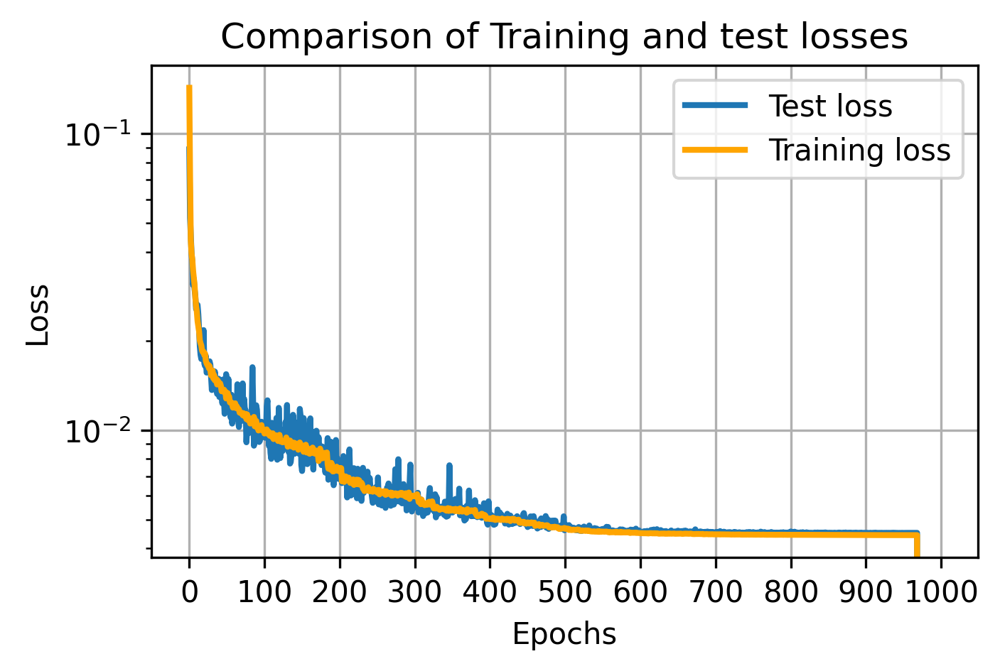

 97%|████████████████████████████████████▊ | 970/1000 [3:15:58<06:06, 12.20s/it]

Epoch:970 
 Training time for  epoch 970: 0.204 minutes,Training loss:  0.004425725029969673, Testing loss: 0.004503131434321403


 97%|████████████████████████████████████▉ | 971/1000 [3:16:10<05:52, 12.17s/it]

Epoch:971 
 Training time for  epoch 971: 0.202 minutes,Training loss:  0.004425652429264614, Testing loss: 0.004503636718727649


 97%|████████████████████████████████████▉ | 972/1000 [3:16:23<05:40, 12.16s/it]

Epoch:972 
 Training time for  epoch 972: 0.202 minutes,Training loss:  0.004425584652832126, Testing loss: 0.004503313857130706
Epoch 00973: reducing learning rate of group 0 to 3.2452e-07.


 97%|████████████████████████████████████▉ | 973/1000 [3:16:35<05:27, 12.14s/it]

Epoch:973 
 Training time for  epoch 973: 0.202 minutes,Training loss:  0.004425701856154529, Testing loss: 0.004503000797703862


 97%|█████████████████████████████████████ | 974/1000 [3:16:47<05:15, 12.13s/it]

Epoch:974 
 Training time for  epoch 974: 0.202 minutes,Training loss:  0.004425236361445243, Testing loss: 0.0045048348093405365


 98%|█████████████████████████████████████ | 975/1000 [3:16:59<05:03, 12.14s/it]

Epoch:975 
 Training time for  epoch 975: 0.203 minutes,Training loss:  0.004425571133240919, Testing loss: 0.004505350664258004


 98%|█████████████████████████████████████ | 976/1000 [3:17:11<04:50, 12.12s/it]

Epoch:976 
 Training time for  epoch 976: 0.201 minutes,Training loss:  0.004425396781488301, Testing loss: 0.004503089957870543


 98%|█████████████████████████████████████▏| 977/1000 [3:17:23<04:39, 12.15s/it]

Epoch:977 
 Training time for  epoch 977: 0.204 minutes,Training loss:  0.004425273322566271, Testing loss: 0.004503080807626248


 98%|█████████████████████████████████████▏| 978/1000 [3:17:35<04:27, 12.16s/it]

Epoch:978 
 Training time for  epoch 978: 0.203 minutes,Training loss:  0.004425321403851908, Testing loss: 0.004504557009786367
Epoch:979 
 Training time for  epoch 979: 0.202 minutes,Training loss:  0.0044254707602479, Testing loss: 0.004503513900563121


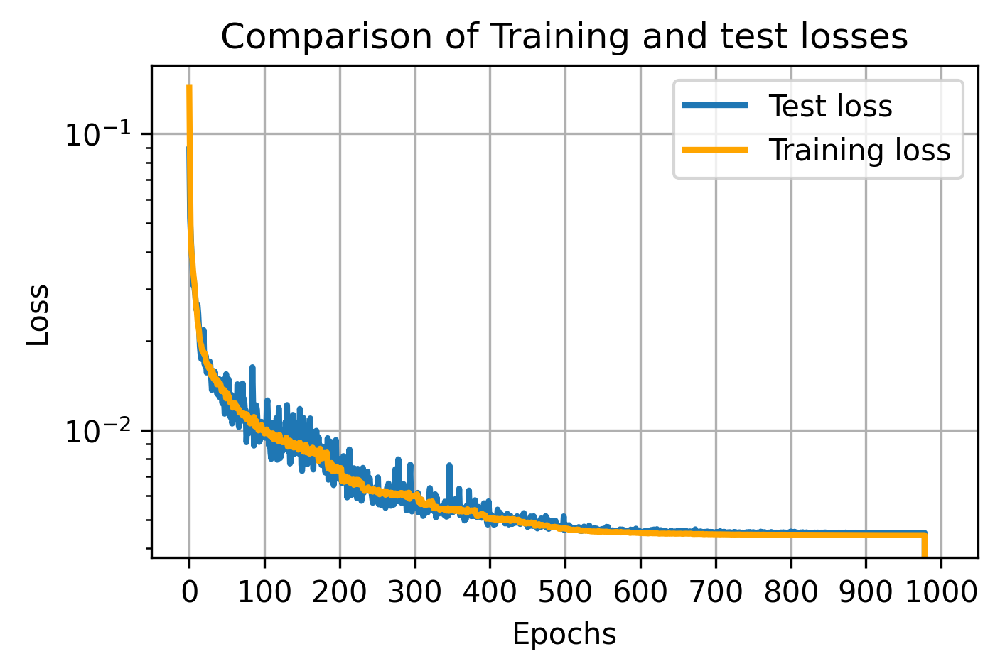

 98%|█████████████████████████████████████▏| 980/1000 [3:18:00<04:03, 12.18s/it]

Epoch:980 
 Training time for  epoch 980: 0.201 minutes,Training loss:  0.004425215125181274, Testing loss: 0.0045036802114918825


 98%|█████████████████████████████████████▎| 981/1000 [3:18:12<03:51, 12.16s/it]

Epoch:981 
 Training time for  epoch 981: 0.202 minutes,Training loss:  0.004425067940519194, Testing loss: 0.004503520596772432


 98%|█████████████████████████████████████▎| 982/1000 [3:18:24<03:38, 12.13s/it]

Epoch:982 
 Training time for  epoch 982: 0.201 minutes,Training loss:  0.004425247020545685, Testing loss: 0.004503403566777706


 98%|█████████████████████████████████████▎| 983/1000 [3:18:36<03:26, 12.14s/it]

Epoch:983 
 Training time for  epoch 983: 0.203 minutes,Training loss:  0.004425225088223556, Testing loss: 0.004502885299734772
Epoch 00984: reducing learning rate of group 0 to 2.5961e-07.


 98%|█████████████████████████████████████▍| 984/1000 [3:18:48<03:14, 12.15s/it]

Epoch:984 
 Training time for  epoch 984: 0.203 minutes,Training loss:  0.004425283214758809, Testing loss: 0.004502971125766635


 98%|█████████████████████████████████████▍| 985/1000 [3:19:01<03:02, 12.14s/it]

Epoch:985 
 Training time for  epoch 985: 0.202 minutes,Training loss:  0.004425043169610229, Testing loss: 0.004504152843728662


 99%|█████████████████████████████████████▍| 986/1000 [3:19:13<02:49, 12.14s/it]

Epoch:986 
 Training time for  epoch 986: 0.202 minutes,Training loss:  0.00442503355405619, Testing loss: 0.004504439127631485


 99%|█████████████████████████████████████▌| 987/1000 [3:19:25<02:37, 12.14s/it]

Epoch:987 
 Training time for  epoch 987: 0.203 minutes,Training loss:  0.004425128067613219, Testing loss: 0.004504480818286538


 99%|█████████████████████████████████████▌| 988/1000 [3:19:37<02:25, 12.10s/it]

Epoch:988 
 Training time for  epoch 988: 0.2 minutes,Training loss:  0.004425149012636069, Testing loss: 0.004502798994071782
Epoch:989 
 Training time for  epoch 989: 0.201 minutes,Training loss:  0.00442518904219997, Testing loss: 0.0045029757684096694


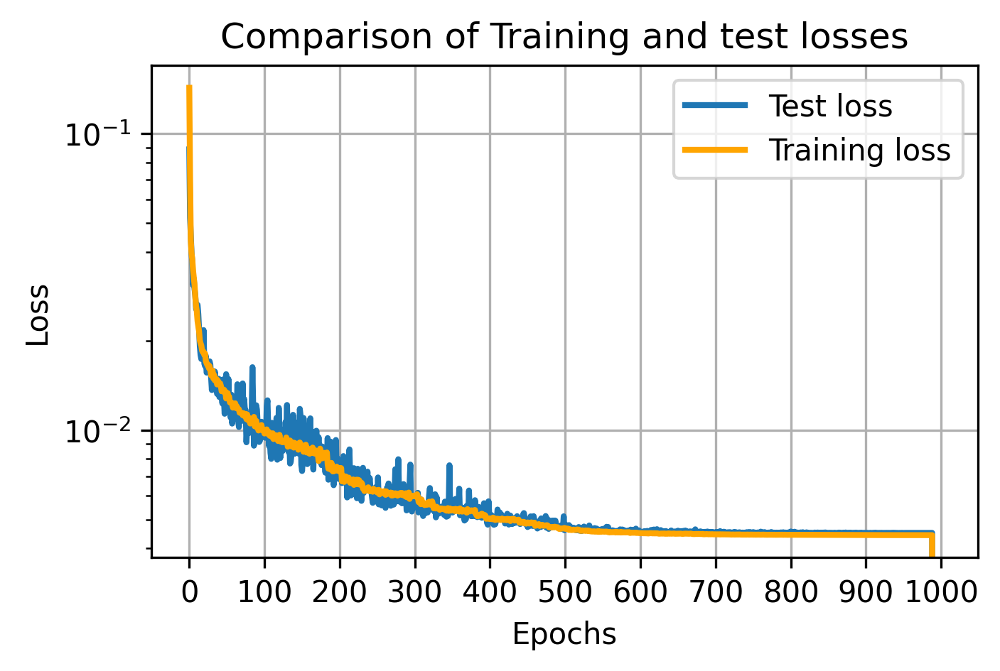

 99%|█████████████████████████████████████▌| 990/1000 [3:20:01<02:01, 12.12s/it]

Epoch:990 
 Training time for  epoch 990: 0.2 minutes,Training loss:  0.004425145711632971, Testing loss: 0.004502736921422184


 99%|█████████████████████████████████████▋| 991/1000 [3:20:13<01:48, 12.11s/it]

Epoch:991 
 Training time for  epoch 991: 0.202 minutes,Training loss:  0.004425162372950564, Testing loss: 0.004502981421537698


 99%|█████████████████████████████████████▋| 992/1000 [3:20:25<01:36, 12.10s/it]

Epoch:992 
 Training time for  epoch 992: 0.202 minutes,Training loss:  0.004425130705819676, Testing loss: 0.004503162112087011


 99%|█████████████████████████████████████▋| 993/1000 [3:20:38<01:24, 12.13s/it]

Epoch:993 
 Training time for  epoch 993: 0.203 minutes,Training loss:  0.004425101670134774, Testing loss: 0.004502342785708606


 99%|█████████████████████████████████████▊| 994/1000 [3:20:50<01:12, 12.12s/it]

Epoch:994 
 Training time for  epoch 994: 0.201 minutes,Training loss:  0.0044248890157131335, Testing loss: 0.004501590086147189
Epoch 00995: reducing learning rate of group 0 to 2.0769e-07.


100%|█████████████████████████████████████▊| 995/1000 [3:21:02<01:00, 12.12s/it]

Epoch:995 
 Training time for  epoch 995: 0.202 minutes,Training loss:  0.004425203488516631, Testing loss: 0.004502704287879169


100%|█████████████████████████████████████▊| 996/1000 [3:21:14<00:48, 12.10s/it]

Epoch:996 
 Training time for  epoch 996: 0.201 minutes,Training loss:  0.004424991591808653, Testing loss: 0.004503054670058191


100%|█████████████████████████████████████▉| 997/1000 [3:21:26<00:36, 12.10s/it]

Epoch:997 
 Training time for  epoch 997: 0.202 minutes,Training loss:  0.004424996809540674, Testing loss: 0.004502613036893308


100%|█████████████████████████████████████▉| 998/1000 [3:21:38<00:24, 12.12s/it]

Epoch:998 
 Training time for  epoch 998: 0.203 minutes,Training loss:  0.004424906314407994, Testing loss: 0.00450269921682775
Epoch:999 
 Training time for  epoch 999: 0.203 minutes,Training loss:  0.004424898284590186, Testing loss: 0.0045035623060539366


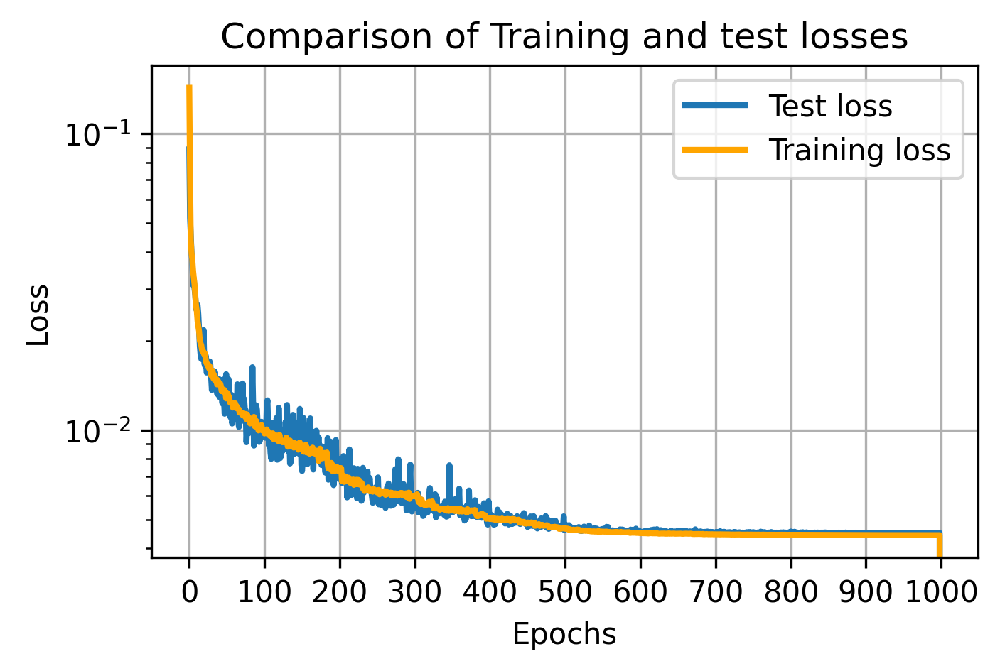

100%|█████████████████████████████████████| 1000/1000 [3:22:03<00:00, 12.12s/it]

Epoch:1000 
 Training time for  epoch 1000: 0.201 minutes,Training loss:  0.004424846696783113, Testing loss: 0.004502605721354485
Total training time 3.368 hours


In [22]:
# Model training 

start_training = default_timer()

epochs = 1000

train_loss = torch.zeros(epochs)
test_loss = torch.zeros(epochs)
best_val_loss = float('inf')
trigger_times = 0  # Counter for early stopping

for ep in tqdm(range(1,epochs+1)):
    
    model.train()
    t1 = default_timer()
    train_l2 = 0
    
    for x, y in train_loader:
        
        x, y = x.cuda(), y.cuda()

        optimizer.zero_grad()
        out = model(x).reshape(batch_size, nz, nx)

        loss = myloss(out.view(batch_size,-1), y.view(batch_size,-1))
        loss.backward()

        optimizer.step()
        train_l2 += loss.item()

    train_l2 /= len(x_train)
    train_loss[ep-1] = train_l2

    scheduler.step( train_l2 ) # Update learning rate with average of train events

    # Early stopping logic
    if train_l2 < best_val_loss:
        
        best_val_loss = train_l2
        trigger_times = 0  # Reset the counter if validation loss improves
        
        # Optionally, save the model with the best validation loss
        torch.save( model.state_dict(), model_name )
        
    else:
        
        trigger_times += 1
        
        if trigger_times >= patience:
            
            print(f"Early stopping at epoch {ep}")
            break  # Stop training if validation loss hasn't improved in 'patience' epochs

    

    model.eval()
    test_l2 = 0.0
      
    with torch.no_grad():
                   
        for x, y in test_loader:
            
            x, y = x.cuda(), y.cuda()

            out = model(x).reshape( batch_size, nz, nx )
            
            test_l2 += myloss(out.view(batch_size,-1), y.view(batch_size,-1)).item()
    
    test_l2 /= len(x_test)
    test_loss[ep-1] = test_l2

    t2 = default_timer()
    print(f'Epoch:{ep} \n Training time for  epoch {ep}: {round((t2-t1)/60,3)} minutes,Training loss:  {train_l2}, Testing loss: {test_l2}')

    if (ep+1) % 10 == 0:
    
        # Loss Figure
        fig = plt.figure(figsize=(5, 3), dpi=300)
        ax = plt.axes()
            
        ax.semilogy(test_loss, linewidth=2, label = 'Test loss')
        ax.semilogy(train_loss , linewidth=2, label = 'Training loss', color = 'orange')
        ax.set_xlabel('Epochs', fontsize=10)
        plt.xticks(fontsize=10)
        ax.xaxis.set_major_locator(plt.MultipleLocator(100))        
        ax.set_ylabel('Loss', fontsize=10)
        plt.yticks(fontsize=10)
        plt.grid()
        plt.legend(loc='upper right')
        plt.title('Comparison of Training and test losses')
        plt.show()

end = default_timer() - start_training

if end > 3600:
    print(f'Total training time {round(end/3600,3)} hours')
else:
    print(f'Total training time {round(end/60,3)} minutes')

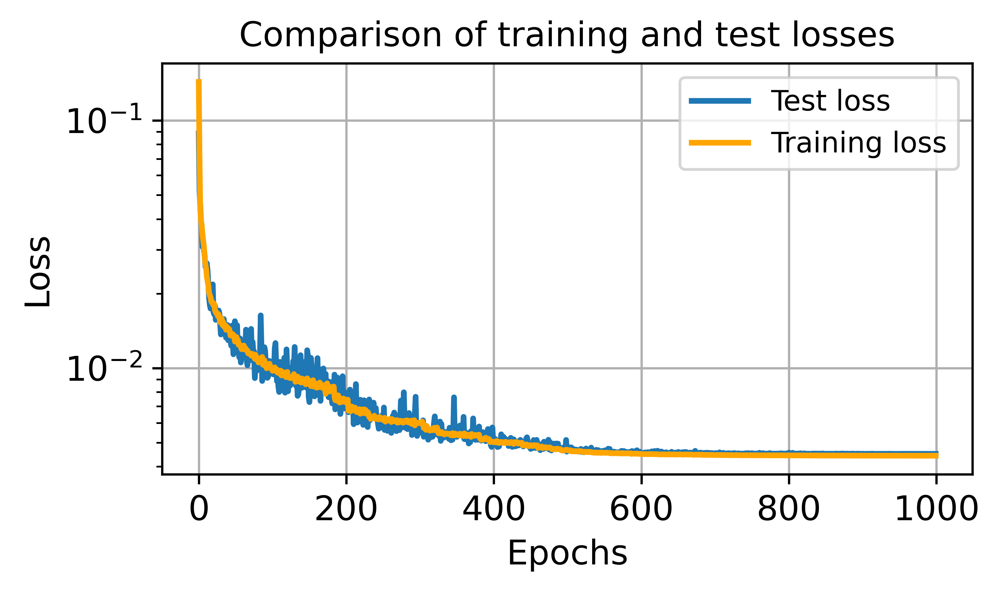

In [23]:
# Convergence history plot for verification

plt.style.use('default')
fig = plt.figure(figsize=(5, 3), dpi=600)
ax = plt.axes()

ax.semilogy(test_loss, linewidth=2, label = 'Test loss')
ax.semilogy(train_loss , linewidth=2, label = 'Training loss', color = 'orange')

ax.set_xlabel('Epochs', fontsize=12)
plt.xticks(fontsize=12)
ax.xaxis.set_major_locator(plt.MultipleLocator(200))

ax.set_ylabel('Loss', fontsize=12)
plt.yticks(fontsize=12)

plt.grid()
plt.legend(loc='upper right')
plt.title('Comparison of training and test losses')

plt.tight_layout()

# plt.savefig( 'Loss_marmousi_'+str(int(spacing*1000))+'m_m4w8' , dpi=600 )

plt.show()

In [24]:
# To load the model if available

# model_name = 'Model_marmousi_25m_m4w8_best.pt'

# model.load_state_dict(torch.load(model_name))

model.eval()  

FNO2d(
  (fc0): Linear(in_features=3, out_features=8, bias=True)
  (conv0): SpectralConv2d()
  (conv1): SpectralConv2d()
  (conv2): SpectralConv2d()
  (conv3): SpectralConv2d()
  (w0): Conv2d(8, 8, kernel_size=(1, 1), stride=(1, 1))
  (w1): Conv2d(8, 8, kernel_size=(1, 1), stride=(1, 1))
  (w2): Conv2d(8, 8, kernel_size=(1, 1), stride=(1, 1))
  (w3): Conv2d(8, 8, kernel_size=(1, 1), stride=(1, 1))
  (fc1): Linear(in_features=8, out_features=128, bias=True)
  (fc2): Linear(in_features=128, out_features=1, bias=True)
)

In [25]:
fsize = 12

def cust_pcolor(AX, X, Y, P, Xs=None, Ys=None, title=None, cmap='jet', 
                xlabel=True, ylabel=False, vmin=None, vmax=None):
    
    ax1 = AX.pcolor(X, Y, P, cmap=cmap, vmin=vmin, vmax=vmax)
    
    cbar = plt.colorbar(ax1, ax=AX)
    cbar.ax.tick_params(labelsize=fsize)
    
    if Xs and Ys:
        AX.scatter(Xs, Ys, marker='*', color='r', s = 100 )
        
    AX.set_title(title, size=fsize)

    AX.invert_yaxis()

    AX.tick_params(axis='both', which='major', labelsize=fsize )  # Set tick label fontsize
    
    if xlabel: AX.set_xlabel('Offset (km)', size=fsize)
    if ylabel: AX.set_ylabel('Depth (km)', size=fsize)

    AX.set_aspect(1)

In [26]:
XMIN, XMAX = 4.5, 6.0
YMIN, YMAX = 0, 3

XGRID = np.linspace(XMIN, XMAX, nx)
YGRID = np.linspace(YMIN, YMAX, nz)

XGRID, YGRID = np.meshgrid(XGRID, YGRID, indexing='ij')

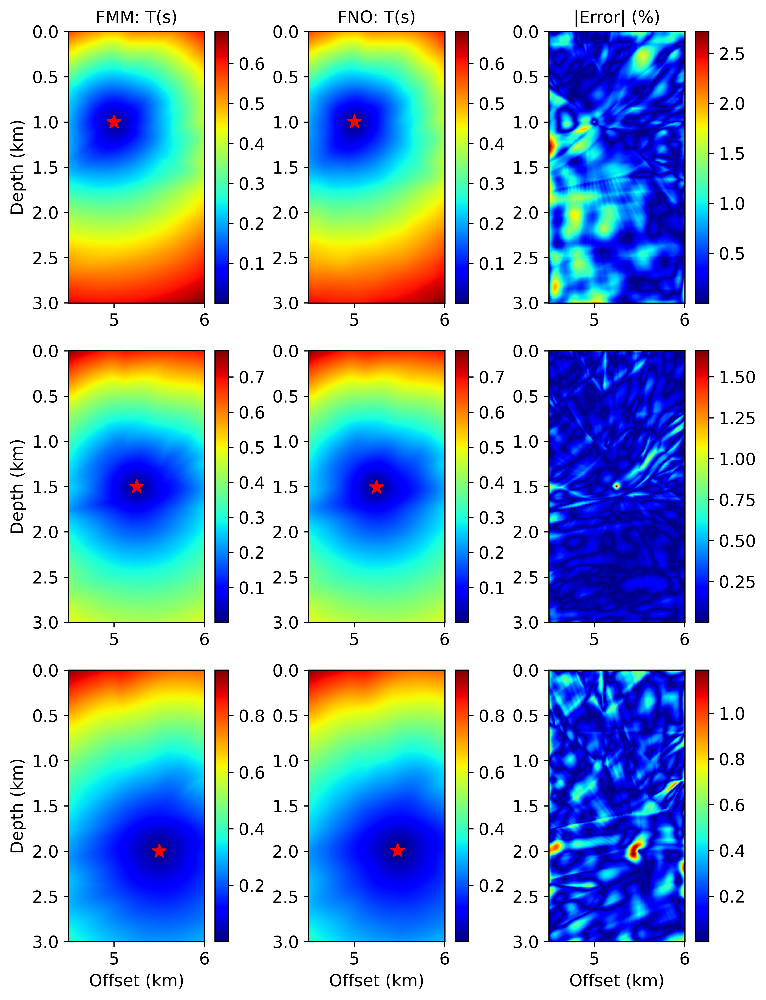

In [27]:
fig, ax = plt.subplots(3, 3, figsize=(7.5,10), dpi = 600 )

x_test = XGRID.T
y_test = YGRID.T
batch_size = 1

for i, (xi, eta) in enumerate([(5, 1), (5.25, 1.5), (5.5, 2)]):    
       
    T_data_y_syn = np.zeros([nz,nx])
    phi = np.ones_like(velmodel)
    phi[np.round(eta/deltaz).astype(int),
        np.round(xi/deltax).astype(int)-1125] = -1
    T_data_y_syn[:, :] = skfmm.travel_time(phi, velmodel, dx=(deltaz, deltax), order=2)

    T_data_x_syn = T_data_y_syn[:,-1].copy()
    T_data_x_syn = T_data_x_syn.reshape(1,nz,1)
    T_data_x_syn = np.repeat(T_data_x_syn,nx,axis = 2)
    T_data_x_syn = T_data_x_syn.reshape(1,nz,nx,1)      
    T_data_x_syn = torch.from_numpy( T_data_x_syn )    
    T_data_x_syn = T_data_x_syn.type( 'torch.FloatTensor' )
    T_data_x_syn = T_data_x_syn.cuda()

    out = model(T_data_x_syn).reshape(batch_size, nz, nx)
    pred = out.cpu()
    pred = pred.reshape(nz, nx)
    ssz, ssx = np.where(pred == torch.min(pred))
    ss = (deltax*ssx[0], deltaz*ssz[0])
       
    exact = T_data_y_syn.copy()
    x_source = xi
    y_source = eta
    
    pred = pred.detach().numpy()
    x_source_pred = ss[0]
    y_source_pred = ss[1]

    cust_pcolor(ax[i, 0], x_test, y_test, exact, x_source, y_source, 'FMM: T(s)' if i==0 else None, 
                cmap='jet', vmin=exact.min(), vmax=exact.max(), ylabel=True, xlabel=True if i==2 else False)
    cust_pcolor(ax[i, 1], x_test, y_test, pred, x_source_pred+4.5, y_source_pred, 'FNO: T(s)' if i==0 else None,
                'jet', vmin=exact.min(), vmax=exact.max(), xlabel=True if i==2 else False)
    
    error = abs(pred - exact) / exact.max() * 100
    cust_pcolor(ax[i, 2], x_test, y_test, error, title='|Error| (%)' if i==0 else None,
                cmap='jet', xlabel=True if i==2 else False)

plt.tight_layout()

# plt.savefig( 'marmousi_preds-pub_'+str(int(spacing*1000))+'m_m4w8.png' , dpi=600 )

plt.show()

In [28]:
# Specify the file names

T_data_y_test_name = '1000'+'_y_test'+'_marmousi_25m'+'.pkl'
cord_test_name = '1000'+'_cord_test'+'_marmousi_25m'+'.pt'

print(T_data_y_test_name)
print(cord_test_name)

1000_y_test_marmousi_25m.pkl
1000_cord_test_marmousi_25m.pt


In [15]:
# Load the fmm generated testing set if available

# import pickle  
# with open(T_data_y_test_name, 'rb') as file:
#     T_data_y_test = pickle.load(file)

# cord_test = torch.load(cord_test_name)
# cord_x_test = cord_test[0]
# cord_z_test = cord_test[1]

In [30]:
# Generate test set

cord_z_test = np.random.uniform( 1.0, 2.0, size=(1000) )
cord_x_test = np.random.uniform( 5.0, 5.5, size=(1000) )

T_data_y_test = np.zeros([ len(cord_z_test), nz, nx ])

count = 0 
rmse_error = []
source_error = []

while count < (len(cord_z_test)-1):
    for i in range(len(cord_z_test)):

        phi = np.ones_like(velmodel)
        phi[np.round(cord_z_test[i]/deltaz).astype(int),
           np.round(cord_x_test[i]/deltax).astype(int)-1125] = -1
        T_data_y_test[count,:,:] = skfmm.travel_time(phi,velmodel,dx=(deltaz,deltax),order=2)

        T_data_x_test = T_data_y_test[count,:,-1].copy()
        T_data_x_test = T_data_x_test.reshape(1,nz,1)
        T_data_x_test = np.repeat(T_data_x_test,nx,axis = 2)
        T_data_x_test = T_data_x_test.reshape(1,nz,nx,1)  
        T_data_x_test = torch.from_numpy( T_data_x_test )    
        T_data_x_test = T_data_x_test.type( 'torch.FloatTensor' )
        T_data_x_test = T_data_x_test.cuda()
    
        out = model(T_data_x_test).reshape(batch_size, nz, nx)
        pred = out.cpu()
        pred = pred.reshape(nz, nx)
        ssz, ssx = np.where(pred == torch.min(pred))
        ss = ( deltax * ( ssx[0] + 1125 ), deltaz * ssz[0] )
   
        exact = T_data_y_test[count,:,:].copy()
        x_source = cord_x_test[i]
        y_source = cord_z_test[i]
        
        pred = pred.detach().numpy()
        x_source_pred = ss[0]
        y_source_pred = ss[1]

        rmse_error.append( np.sqrt( np.mean( ( exact - pred )**2 ) ) )
        source_error.append( [ x_source-x_source_pred, y_source-y_source_pred ] )
        
        count = count + 1            
        print( count )

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277


In [50]:
# Save the fmm generated testing set to use later

# cord_test = [cord_x_test, cord_z_test]
# torch.save(cord_test,cord_test_name)

# import pickle

# Save the tensors using pickle directly, specifying protocol 4
# with open(T_data_y_test_name, 'wb') as f:
#    pickle.dump(T_data_y_test, f, protocol=4)

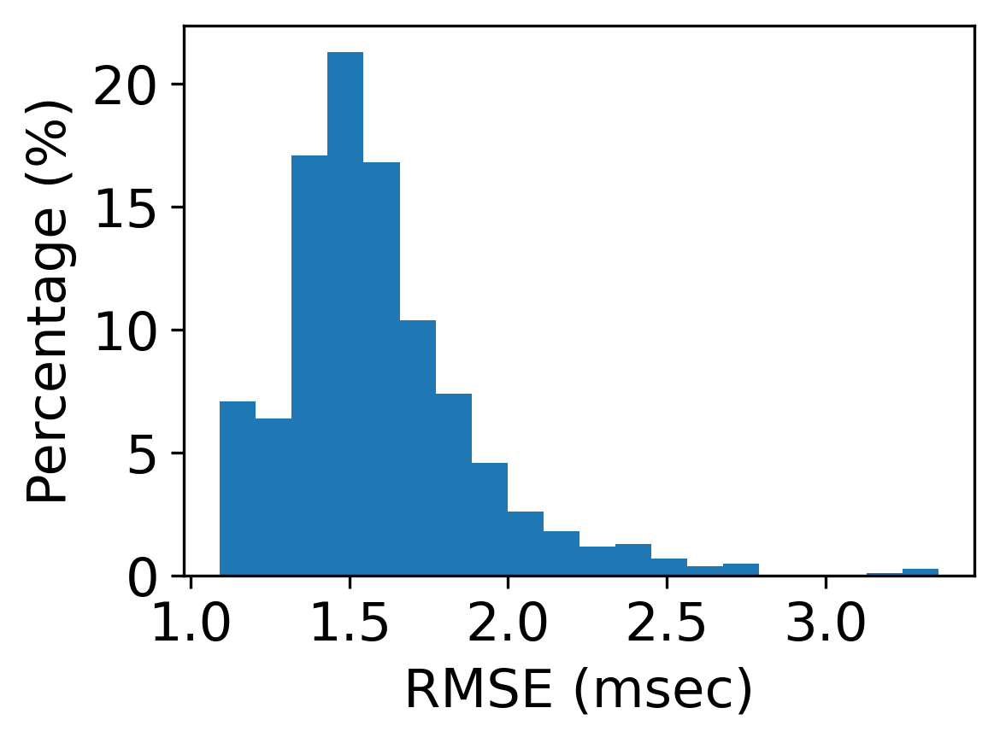

In [31]:
fsize = 15

rmse_error = np.array(rmse_error)
weights = np.ones(len(rmse_error)) / len(rmse_error) * 100

plt.figure(figsize=(4,3), dpi = 300)

plt.hist(rmse_error*1000, 20, weights=weights)

plt.xlabel('RMSE (msec)',fontsize=fsize)
plt.ylabel('Percentage (%)',fontsize=fsize)

plt.xticks(fontsize=fsize)
plt.yticks(fontsize=fsize)

plt.tight_layout()

# plt.savefig( 'marmousi_RMSE_1000_'+str(int(spacing*1000))+'m_m4w8.pdf' , dpi=300 )

plt.show()

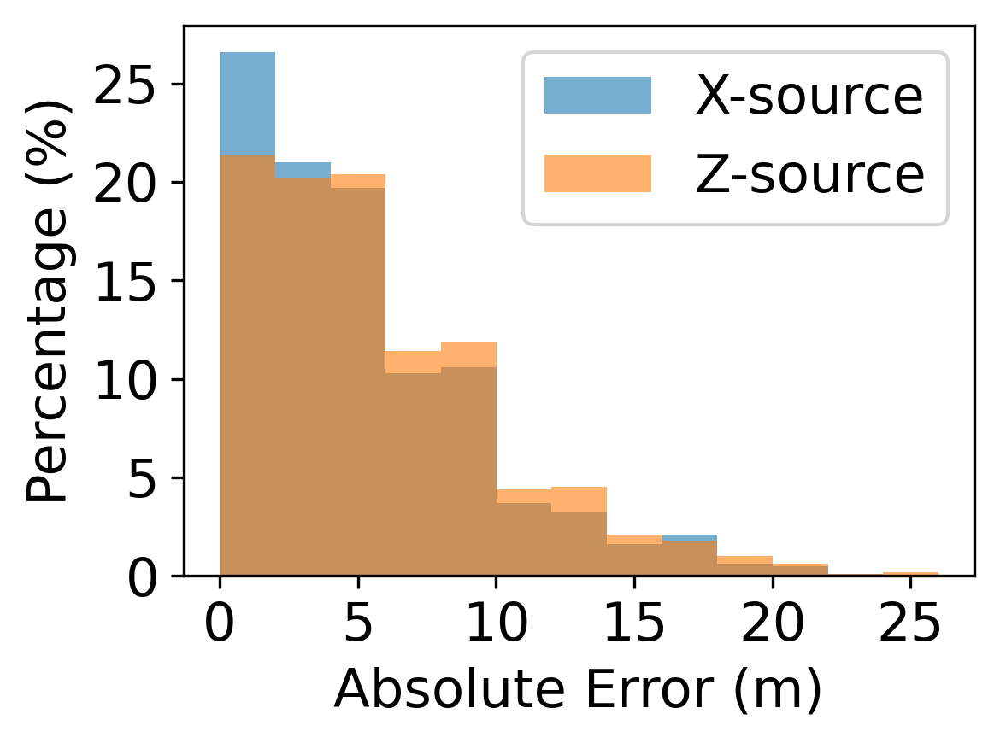

In [32]:
fsize = 15

weights = np.ones(len(rmse_error)) / len(rmse_error) * 100
source_error = np.array(source_error)

fig, ax = plt.subplots(1, 1, figsize=(4,3), dpi = 300)
ax = [ax]

# Desired bin width
bin_width = 2 # meters

for i in range(2) :

    data = abs(source_error[:, i])*1000
    
    # Define bin edges with a width of 2 meters
    bin_edges = np.arange( min(data), max(data) + bin_width, bin_width )

    # Create the histogram with exact bin edges
    ax[0].hist( data, bins=bin_edges, weights=weights, alpha=0.6 )

ax[0].set_xlabel('Absolute Error (m)',fontsize=fsize)
ax[0].set_ylabel('Percentage (%)',fontsize=fsize)

plt.xticks(fontsize=fsize)
plt.yticks(fontsize=fsize)

ax[0].yaxis.set_major_locator(plt.MultipleLocator(5))

plt.tight_layout()
plt.legend( ['X-source', 'Z-source'], fontsize=fsize )

# plt.savefig( 'marmousi_abs_errors_1000_'+str(int(spacing*1000))+'m_m4w8.pdf' , dpi=300 )

plt.show()

In [33]:
# Plot predicted locations for test set

with torch.no_grad():

    pred_loc = []
    act_loc = []
    
    for x, y in test_loader:
        
        x = x.cuda()

        out = model(x).reshape(batch_size, nz, nx)
        pred = out.cpu()
        pred = pred.reshape(nz, nx)
        ssz, ssx = np.where(pred == torch.min(pred))
        ss = ( deltax * ( ssx[0] + 1125 ), deltaz * ssz[0] )
        pred_loc.append(ss)

        act = y.reshape(nz, nx)
        ssz_act, ssx_act = np.where(act == torch.min(act))
        ss_act = ( deltax * ( ssx_act[0] + 1125 ), deltaz * ssz_act[0] )
        act_loc.append(ss_act)

predicted_loc = np.asarray(pred_loc)
groundtruth_loc = np.asarray(act_loc)

In [34]:
df_pred = pd.DataFrame(predicted_loc, columns=['sx_pred', 'sz_pred']) 
df_pred.index = np.arange(1, len(df_pred)+1)
df_pred

,sx_pred,sz_pred
1,5.260,1.504
2,5.028,1.540
3,5.208,1.476
4,5.432,1.860
5,5.428,1.764
6,5.248,1.044
7,5.196,1.256
8,5.044,1.680
9,5.068,1.716
10,5.488,1.844


In [35]:
df_truth = pd.DataFrame(groundtruth_loc, columns=['sx_true', 'sz_true']) 
df_truth.index = np.arange(1, len(df_truth)+1)
df_truth

,sx_true,sz_true
1,5.260,1.496
2,5.016,1.544
3,5.212,1.468
4,5.436,1.868
5,5.428,1.748
6,5.244,1.044
7,5.196,1.252
8,5.040,1.692
9,5.064,1.720
10,5.492,1.852


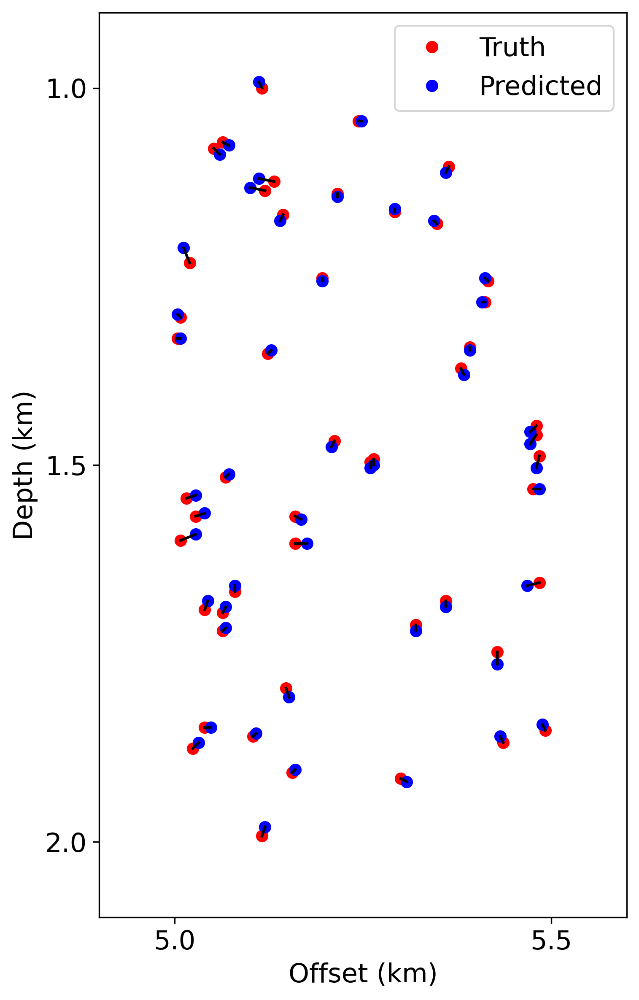

In [37]:
fsize = 15

plt.style.use('default')
plt.figure( figsize=(6,8), dpi=300 )

ax = plt.gca()
test = np.zeros_like(velmodel)

im = ax.imshow(test, aspect=1, extent=[ 4.9, 5.6, 2.1, 0.9 ],cmap='Greys')

plt.plot(df_truth['sx_true'], df_truth['sz_true'], 'ro', label ='Truth')         
plt.plot(df_pred['sx_pred'], df_pred['sz_pred'], 'bo', label = 'Predicted')

plt.plot([df_truth['sx_true'],df_pred['sx_pred']], [df_truth['sz_true'],df_pred['sz_pred']], 'k-')

ax.legend(loc='upper right', fontsize=fsize)

plt.xlabel('Offset (km)', fontsize=fsize)
plt.xticks(fontsize=fsize)

plt.ylabel('Depth (km)', fontsize=fsize)
plt.yticks(fontsize=fsize)

ax.xaxis.set_major_locator(plt.MultipleLocator(0.5))
ax.yaxis.set_major_locator(plt.MultipleLocator(0.5))

plt.tight_layout()

# plt.savefig( 'marmousi_source_locs_testset_'+str(int(spacing*1000))+'m_m4w8.pdf' , dpi=300 )

plt.show()